In [1]:
import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.font_manager as fm

%config InlineBackend.figure_format = 'retina'
 
fontpath = '/usr/share/fonts/truetype/nanum/NanumBarunGothic.ttf'
font = fm.FontProperties(fname=fontpath, size=9)
plt.rc('font', family='NanumBarunGothic') 
mpl.font_manager.findfont(font)

'/usr/share/fonts/truetype/nanum/NanumBarunGothic.ttf'

In [2]:
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt

import re
import os
import io
import time
import random

import seaborn # Attention 시각화를 위해 필요!

print(tf.__version__)

2.6.0


### 모듈 생성

In [3]:
# 포지셔널 인코딩
def positional_encoding(pos, d_model):
    def cal_angle(position, i):
        return position / np.power(10000, int(i) / d_model)

    def get_posi_angle_vec(position):
        return [cal_angle(position, i) for i in range(d_model)]

    sinusoid_table = np.array([get_posi_angle_vec(pos_i) for pos_i in range(pos)])
    sinusoid_table[:, 0::2] = np.sin(sinusoid_table[:, 0::2])
    sinusoid_table[:, 1::2] = np.cos(sinusoid_table[:, 1::2])
    return sinusoid_table

In [4]:
# 멀티헤드어텐션
class MultiHeadAttention(tf.keras.layers.Layer):
    def __init__(self, d_model, num_heads):
        super(MultiHeadAttention, self).__init__()
        self.num_heads = num_heads
        self.d_model = d_model
        
        self.depth = d_model // self.num_heads
        
        self.W_q = tf.keras.layers.Dense(d_model) # Linear Layer
        self.W_k = tf.keras.layers.Dense(d_model)
        self.W_v = tf.keras.layers.Dense(d_model)
        
        self.linear = tf.keras.layers.Dense(d_model)

    def scaled_dot_product_attention(self, Q, K, V, mask):
        d_k = tf.cast(K.shape[-1], tf.float32)

        """
        Scaled QK 값 구하기
        """
        dot_product_qk = tf.matmul(Q,K,transpose_b=True)
        scaled_qk = dot_product_qk/tf.math.sqrt(d_k)

        if mask is not None: scaled_qk += (mask * -1e9) 

        """
        1. Attention Weights 값 구하기 -> attentions
        2. Attention 값을 V에 곱하기 -> out
        """ 
        attentions = tf.nn.softmax(scaled_qk,axis=-1)
        
        out = tf.matmul(attentions,V)

        return out, attentions
        

    def split_heads(self, x):
        """
        Embedding을 Head의 수로 분할하는 함수

        x: [ batch x length x emb ]
        return: [ batch x heads x length x self.depth ]
        """
        batch_size = tf.shape(x)[0]
        length = tf.shape(x)[1]
        
        x = tf.reshape(x,(batch_size, length, self.num_heads, self.depth))
        
        split_x = tf.transpose(x,perm=[0,2,1,3])

        return split_x

    def combine_heads(self, x):
        """
        분할된 Embedding을 하나로 결합하는 함수

        x: [ batch x heads x length x self.depth ]
        return: [ batch x length x emb ]
        """
        batch_size = tf.shape(x)[0]
        length = tf.shape(x)[2]
        
        x = tf.transpose(x,perm=[0,2,1,3])
        combined_x = tf.reshape(x,(batch_size,length,self.d_model))

        return combined_x
    

    def call(self, Q, K, V, mask):
        """
        아래 순서에 따라 소스를 작성하세요.

        Step 1: Linear_in(Q, K, V) -> WQ, WK, WV
        Step 2: Split Heads(WQ, WK, WV) -> WQ_split, WK_split, WV_split
        Step 3: Scaled Dot Product Attention(WQ_split, WK_split, WV_split)
                 -> out, attention_weights
        Step 4: Combine Heads(out) -> out
        Step 5: Linear_out(out) -> out

        """
        
        WQ = self.W_q(Q)  
        WK = self.W_k(K)  
        WV = self.W_v(V)  

        WQ_split = self.split_heads(WQ)  
        WK_split = self.split_heads(WK)  
        WV_split = self.split_heads(WV)  

        out, attention_weights = self.scaled_dot_product_attention(WQ_split, WK_split, WV_split, mask)

        out = self.combine_heads(out)  

        out = self.linear(out)  

        return out, attention_weights

In [5]:
class PoswiseFeedForwardNet(tf.keras.layers.Layer):
    def __init__(self, d_model, d_ff):
        super(PoswiseFeedForwardNet, self).__init__()
        self.w_1 = tf.keras.layers.Dense(d_ff, activation='relu')
        self.w_2 = tf.keras.layers.Dense(d_model)

    def call(self, x):
        out = self.w_1(x)
        out = self.w_2(out)
            
        return out

In [6]:
class EncoderLayer(tf.keras.layers.Layer):
    def __init__(self, d_model, n_heads, d_ff, dropout):
        super(EncoderLayer, self).__init__()

        self.enc_self_attn = MultiHeadAttention(d_model, n_heads)
        self.ffn = PoswiseFeedForwardNet(d_model, d_ff)

        self.norm_1 = tf.keras.layers.LayerNormalization(epsilon=1e-6)
        self.norm_2 = tf.keras.layers.LayerNormalization(epsilon=1e-6)

        self.dropout = tf.keras.layers.Dropout(dropout)
        
    def call(self, x, mask):

        """
        Multi-Head Attention
        """
        residual = x
        out = self.norm_1(x)
        out, enc_attn = self.enc_self_attn(out, out, out, mask) # Q,K,V
        out = self.dropout(out)
        out += residual
        
        """
        Position-Wise Feed Forward Network
        """
        residual = out
        out = self.norm_2(out)
        out = self.ffn(out)
        out = self.dropout(out)
        out += residual
        
        return out, enc_attn

In [7]:
class DecoderLayer(tf.keras.layers.Layer):
    def __init__(self, d_model, n_heads, d_ff, dropout):
        super(DecoderLayer, self).__init__()

        self.dec_self_attn = MultiHeadAttention(d_model, n_heads)
        self.enc_dec_attn = MultiHeadAttention(d_model,n_heads)
        self.ffn = PoswiseFeedForwardNet(d_model, d_ff)

        self.norm_1 = tf.keras.layers.LayerNormalization(epsilon=1e-6)
        self.norm_2 = tf.keras.layers.LayerNormalization(epsilon=1e-6)
        self.norm_3 = tf.keras.layers.LayerNormalization(epsilon=1e-6)

        self.dropout = tf.keras.layers.Dropout(dropout)
        
    def call(self, x, enc_output, look_ahead_mask, padding_mask):
        """
        Masked Multi-Head Attention
        """
        residual = x
        out = self.norm_1(x)
        out, dec_attn = self.dec_self_attn(out, out, out, look_ahead_mask)
        out = self.dropout(out)
        out += residual
        
        """
        Enc-Dec Multi-Head Attention
        """
        residual = out  # Residual Connection 업데이트
        out = self.norm_2(out)
        out, enc_dec_attn = self.enc_dec_attn(out, enc_output, enc_output, padding_mask)  # 수정된 부분
        out = self.dropout(out)
        out += residual    
        
        """
        Position-Wise Feed Forward Network
        """
        residual = out  # Residual Connection 업데이트
        out = self.norm_3(out)
        out = self.ffn(out)
        out = self.dropout(out)
        out += residual
        
        return out, dec_attn, enc_dec_attn

In [8]:
class Encoder(tf.keras.Model):
    def __init__(self,
                 n_layers,
                 d_model,
                 n_heads,
                 d_ff,
                 dropout):
        super(Encoder, self).__init__()
        self.n_layers = n_layers
        self.enc_layers = [EncoderLayer(d_model, n_heads, d_ff, dropout) 
                        for _ in range(n_layers)]
        
    def call(self, x, mask):
        out = x
    
        enc_attns = list()
        for i in range(self.n_layers):
            out, enc_attn = self.enc_layers[i](out, mask)
            enc_attns.append(enc_attn)
        
        return out, enc_attns

In [9]:
class Decoder(tf.keras.Model):
    def __init__(self,
                 n_layers,
                 d_model,
                 n_heads,
                 d_ff,
                 dropout):
        super(Decoder, self).__init__()
        self.n_layers = n_layers
        self.dec_layers = [DecoderLayer(d_model, n_heads, d_ff, dropout) 
                            for _ in range(n_layers)]
                            
                            
    def call(self, x, enc_out, look_ahead_mask, padding_mask):
        out = x
    
        dec_attns = list()
        enc_dec_attns = list()
        for i in range(self.n_layers):
            out, dec_attn, enc_dec_attn = \
            self.dec_layers[i](out, enc_out, look_ahead_mask, padding_mask)

            dec_attns.append(dec_attn)
            enc_dec_attns.append(enc_dec_attn)

        return out, dec_attns, enc_dec_attns

### Transformer 구축

In [10]:
class Transformer(tf.keras.Model):
    def __init__(self,
                    n_layers,
                    d_model,
                    n_heads,
                    d_ff,
                    src_vocab_size,
                    tgt_vocab_size,
                    pos_len,
                    dropout=0.2,
                    shared=True):
        super(Transformer, self).__init__()
        self.d_model = tf.cast(d_model, tf.float32)

        self.enc_emb = tf.keras.layers.Embedding(src_vocab_size, d_model)
        self.dec_emb = tf.keras.layers.Embedding(tgt_vocab_size, d_model)

        self.pos_encoding = positional_encoding(pos_len, d_model)

        self.encoder = Encoder(n_layers, d_model, n_heads, d_ff, dropout)
        self.decoder = Decoder(n_layers, d_model, n_heads, d_ff, dropout)

        self.fc = tf.keras.layers.Dense(tgt_vocab_size)

        self.shared = shared

        if shared: self.fc.set_weights(tf.transpose(self.dec_emb.weights))
        
        self.shared = shared
        if self.shared:
            # dec_emb와 fc layer의 가중치 공유, scale_weight
            self.fc.set_weights(tf.transpose(self.dec_emb.weights))
            self.scale_weight = tf.math.sqrt(self.d_model)
        
        self.dropout = tf.keras.layers.Dropout(dropout)

    def embedding(self, emb, x):
        emb_out = emb(x)  # [batch, length, d_model]

        if self.shared:
            emb_out *= self.scale_weight  # Scale by sqrt(d_model) if shared

        seq_len = tf.shape(x)[1]
        pos_encoding = tf.slice(self.pos_encoding, [0, 0], [seq_len, -1]) 
        pos_encoding = tf.cast(pos_encoding, emb_out.dtype)  # Dtype 맞춤

        return emb_out + pos_encoding

        
    def call(self, enc_in, dec_in, enc_mask, look_ahead_mask, dec_mask):
        enc_in = self.embedding(self.enc_emb, enc_in)
        dec_in = self.embedding(self.dec_emb, dec_in)

        enc_out, enc_attns = self.encoder(enc_in, enc_mask)
        
        dec_out, dec_attns, enc_dec_attns = \
        self.decoder(dec_in, enc_out, look_ahead_mask, dec_mask)
        
        logits = self.fc(dec_out)
        
        return logits, enc_attns, dec_attns, enc_dec_attns


In [11]:
import numpy as np
import tensorflow as tf

def generate_padding_mask(seq):
    seq = tf.cast(tf.math.equal(seq, 0), tf.float32)
    return seq[:, tf.newaxis, tf.newaxis, :]

def generate_look_ahead_mask(size):
  mask = 1 - tf.linalg.band_part(tf.ones((size, size)), -1, 0)
  return mask  # (seq_len, seq_len)

def generate_masks(src, tgt):
    enc_mask = generate_padding_mask(src)
    look_ahead_mask = generate_look_ahead_mask(tf.shape(tgt)[1])
    dec_padding_mask = generate_padding_mask(tgt)

    dec_mask = tf.maximum(look_ahead_mask, dec_padding_mask) # 패딩 마스크와 look_ahead 마스크 - 
    enc_dec_mask = enc_mask

    return enc_mask, enc_dec_mask, dec_mask

### 데이터 전처리

In [12]:
os.getcwd()

'/aiffel/aiffel/transformer'

In [13]:
data_dir = '/aiffel/aiffel/transformer/data'
kor_path = data_dir+"/korean-english-park.train.ko"
eng_path = data_dir+"/korean-english-park.train.en"

In [14]:
with open(kor_path, 'r', encoding='utf-8') as f_ko:
    train_ko = f_ko.readlines()  

with open(eng_path, 'r', encoding='utf-8') as f_en:
    train_en = f_en.readlines()  

print(f"kor length: {len(train_ko)}")
print(f"eng length: {len(train_en)}")

kor length: 94123
eng length: 94123


In [15]:
# 병렬쌍이 흐트러지지 않게 묶어버리기 
train_pairs = list(zip(train_ko, train_en))

# 병렬쌍 (한영 전부 같은 것들) 중복 제거
train_pairs = list(set(train_pairs))

# 다시 분리
train_ko, train_en = zip(*train_pairs)

# 리스트
train_ko = list(train_ko)
train_en = list(train_en)

print(f"kor length: {len(train_ko)}")
print(f"eng length: {len(train_en)}")

kor length: 78968
eng length: 78968


In [16]:
pip install langdetect

     |████████████████████████████████| 981 kB 4.5 MB/s            
  Preparing metadata (setup.py) ... done
  Created wheel for langdetect: filename=langdetect-1.0.9-py3-none-any.whl size=993242 sha256=4d44a6edaa3aef56efc33770b4315ae6acdee57e8e81ec425b56619d8ed92d72
  Stored in directory: /aiffel/.cache/pip/wheels/d1/c1/d9/7e068de779d863bc8f8fc9467d85e25cfe47fa5051fff1a1bb
Successfully built langdetect
Note: you may need to restart the kernel to use updated packages.


In [17]:
from langdetect import detect

# 언어 구별 함수 
def is_not_korean(text):
    try:
        return detect(text) != 'ko'
    except:
        # 언어 감지 실패 시 not kor로 
        return True

# 한국어가 아닌 문장만 
non_korean_sentences = [sentence for sentence in train_ko if is_not_korean(sentence)]

# 개수
print(f"한국어가 아닌 문장 수: {len(non_korean_sentences)}")

한국어가 아닌 문장 수: 3440


In [18]:
# 확실히 번역기에 들어가봐야 모델 성능만 떨어뜨릴 문장들이다.
non_korean_sentences

['downplay 무시하다, 경시하다\n',
 'FORT LAUDERDALE, Florida (CNN)/김양희(JOINS)\n',
 'Bush aides face contempt charge ˝부시 대통령 보좌관들, 모욕죄로 고발될 위기˝\xa0 \xa0 \xa02007.10\n',
 'economics 경제 상태\n',
 'Fueling under way at the Kennedy Space Center 케네디 우주 센터, 연료공급 진행 중\xa0 \xa0 \xa02009.06\n',
 '네덜란드 환경영향평가청(MNP, Netherlands environmental assessment agency)은 6월, 중국이 미국보다 가장 많은 온실가스를 배출하는 국가라고 보고했다.\n',
 'US to transfer of its wartime control 미국, 전시 작전 통제권 인수\xa0 \xa0 \xa02006.10\n',
 'clinching score 승부에 쐐기를 박는 결정적인 점수\n',
 '솔직한, 숨김없는 (=frank in speech, often to the point of rudeness;\n',
 'Horst Koehler, a former head of the IMF was elected as the German president.호르스트 쾰러 전 IMF 총재, 독일 대통령 당선2005.08\n',
 'legislature 입법부, 주의회\n',
 'Lord of the Rings)’ 3부작의 간달프\n',
 'direction 방향, 방위\n',
 '단어장 Google made the stock market debut at NASDAQ.구글, 나스닥에 주식 옵션 상장2005.08\n',
 'Members of The Couch planned it before the show.카우치 멤버, 사전 모의 시인2005.09\n',
 'Raul Castro named Cuban president라울 카스트로, 쿠바 대통령 선출2008.09\n'

In [19]:
# 제거
print(f"필터링 전 kor 문장 수: {len(train_ko)}")
print(f"필터링 전 eng 문장 수: {len(train_en)}")
print("---------------------")
# 한-영 쌍으로 탈락시켜야 하기에 한국어가 아닌 문장을 찾는 인덱스가 필요함
non_korean_indices = [i for i, sentence in enumerate(train_ko) if sentence in non_korean_sentences]

# non_korean_indices 기준으로 train_ko와 train_en 전부 전처리 
train_ko = [sentence for i, sentence in enumerate(train_ko) if i not in non_korean_indices]
train_en = [sentence for i, sentence in enumerate(train_en) if i not in non_korean_indices]

# 결과 출력
print(f"필터링 후 kor 문장 수: {len(train_ko)}")
print(f"필터링 후 eng 문장 수: {len(train_en)}")

필터링 전 kor 문장 수: 78968
필터링 전 eng 문장 수: 78968
---------------------
필터링 후 kor 문장 수: 75518
필터링 후 eng 문장 수: 75518


In [20]:
# 혹시 영문도?? 
def is_not_english(text):
    try:
        return detect(text) != 'en'  # 영어 여부 확인
    except:
        # 언어 감지 실패 시 False 반환
        return False

# 영어 문장만 추출
not_english_sentences = [sentence for sentence in train_en if is_not_english(sentence)]

# 개수 출력
print(f"영어 문장 수: {len(not_english_sentences)}")

영어 문장 수: 265


In [21]:
# 조금 애매하나 한-영 짝을 생각했을 때, 삭제가 맞다고 판단
not_english_sentences

["I feel like I'm getting more out of my days.\n",
 'ÇÑ±Û´º½ºÀÇ ¿ø¹ ®Àºµû\n',
 'Retrieve a missing nuclear trigger before it falls into enemy hands.\n',
 'Bus tours\n',
 'with 715,700 in Hong Kong and 373,100 in Singapore.\n',
 'Michael Weinfeld, Washington.”\n',
 'But the key question remains:\n',
 '500 tons of diesel oil;\n',
 'It´s not always an easy task.\n',
 'º» ±â»ç´Â ¿ø¹®À» µû\n',
 'Rats are excellent swimmers.\n',
 'Big Island, Hawaii\n',
 'No violent incidents were reported.\n',
 '"Everything is in order," Volkov said.\n',
 "``We need a leader like him now,'' Vekshina said.\n",
 'Bermuda\n',
 'Two dozen scholars and leaders will be meeting November 4-6.\n',
 'Despite its name, Oktoberfest begins in late September.\n',
 'Sunlight\n',
 '* Mosquito Bay, Puerto Rico\n',
 "“We're partners, like Tom and Jerry.”\n",
 'Albert Einstein was more than an Einstein.\n',
 'Lyndon Johnson died in 1973.\n',
 'How does that make Hamm feel?\n',
 '"Darth Vader!\n',
 'Enya celebrates `Winter`\n'

In [22]:
print(f"필터링 전 kor 문장 수: {len(train_ko)}")
print(f"필터링 전 eng 문장 수: {len(train_en)}")
print("---------------------")
# 영어가 아닌 문장의 인덱스 
not_english_indices = [i for i, sentence in enumerate(train_en) if is_not_english(sentence)]

# not_english_indices 기준으로 train_ko와 train_en 전부 전처리
train_ko = [sentence for i, sentence in enumerate(train_ko) if i not in not_english_indices]
train_en = [sentence for i, sentence in enumerate(train_en) if i not in not_english_indices]

# 결과 비교 
print(f"필터링 후 kor 문장 수: {len(train_ko)}")
print(f"필터링 후 eng 문장 수: {len(train_en)}")

필터링 전 kor 문장 수: 75518
필터링 전 eng 문장 수: 75518
---------------------
필터링 후 kor 문장 수: 75255
필터링 후 eng 문장 수: 75255


In [23]:
import html
def preprocess_sentence(sentence, s_token=False, e_token=False):
    # 소문자로 변환 후 앞뒤 공백 제거
    sentence = sentence.lower().strip()

    # () 괄호 안의 내용을 괄호와 함께 삭제 EX)  어제(25일 경)과 같은 보조 맥락은 전부 삭제
    sentence = re.sub(r'\([^)]*\)', '', sentence)

    # HTML 엔티티 제거
    sentence = html.unescape(sentence)

    # 한글과 영어 외 문자 제거 (해당하는 특수기호는 유지)
    sentence = re.sub(r"[^ㄱ-ㅎㅏ-ㅣ가-힣a-zA-Z?.!,]+", " ", sentence)

    # 필요한 특수기호 앞뒤에 공백 추가
    sentence = re.sub(r"([?.!,])", r" \1 ", sentence)

    # 연속된 공백을 하나의 공백으로 통일
    sentence = re.sub(r'[" "]+', " ", sentence)

    # 줄바꿈(\n) 제거
    sentence = sentence.replace('\n', '')

    # 특수기호가 2개 이상 반복될 경우 하나로 통일
    sentence = re.sub(r'([?.!,])\1+', r'\1', sentence)

    # 문장 앞뒤 공백 제거
    sentence = sentence.strip()

    # 시작 토큰과 종료 토큰 추가 (옵션)
    if s_token:
        sentence = '<start> ' + sentence
    if e_token:
        sentence += ' <end>'

    return sentence

In [24]:
# 디코더는 sentence peice에서 시작 끝 토큰 추가할 예정
train_ko = [preprocess_sentence(sent) for sent in train_ko]
train_en = [preprocess_sentence(sent) for sent in train_en]


print("kor ex :", train_ko[:3])
print("eng ex :", train_en[:3])

kor ex : ['백악관은 일 조지 h . w . 부시 전 대통령과 빌 클린턴 전 대통령이 옐친 장례식에 미국 대표로 참석할 것이라고 전했다 .', '미국 , 중국 , 한국 , 일본 , 러시아는 북핵 해결을 위해 년 이후 북한 관리들과 자회담을 개최하고 있다 .', '그는 영화 대사를 인용 돈을 벌면 힘이 생기고 힘이 생기면 여자를 얻는다 고 전했다 .']
eng ex : ['former presidents george h . w . bush and bill clinton will lead the u . s . delegation attending the funeral of former russian president boris yeltsin , the white house said on tuesday , reuters reported .', 'the united states , china , south korea , japan and russia have been holding talks with north korean officials since in an effort to convince pyongyang to give up its nuclear weapons program .', 'then when you get the power , then you get the women .']


### 서브워드 토크나이저 - SentencePiece

In [25]:
import sentencepiece as spm

def generate_tokenizer(corpus,
                       vocab_size=20000, # default
                       lang="ko",
                       pad_id=0,
                       bos_id=1,
                       eos_id=2,
                       unk_id=3):
    """
    SentencePiece 기반 토크나이저 생성
    - corpus: 학습에 사용할 말뭉치 (리스트 형태)
    - vocab_size: 단어 사전 크기
    - lang: 언어 코드 ("ko" 또는 "en")
    - pad_id, bos_id, eos_id, unk_id: 특수 토큰 ID
    """
    # 말뭉치를 임시 파일로 저장
    temp_file = f"temp_{lang}_corpus.txt"
    with open(temp_file, 'w', encoding='utf-8') as f:
        for sentence in corpus:
            f.write(sentence + '\n')

    # SentencePiece 학습
    model_prefix = f"{lang}_tokenizer"
    spm.SentencePieceTrainer.train(
        input=temp_file,
        model_prefix=model_prefix,
        vocab_size=vocab_size,
        pad_id=pad_id,
        bos_id=bos_id,
        eos_id=eos_id,
        unk_id=unk_id,
        character_coverage=1.0, # 모든 문자 포함 
        model_type="unigram"  # unigram 
    )

    # 학습된 모델 로드
    tokenizer = spm.SentencePieceProcessor()
    tokenizer.load(f"{model_prefix}.model")
    
    return tokenizer

# 코퍼스 
SRC_VOCAB_SIZE = TGT_VOCAB_SIZE = 25000 # 20000개에서 25000개로 변경

# kor eng 토크나이저 
ko_tokenizer = generate_tokenizer(train_ko, SRC_VOCAB_SIZE, lang="ko")
en_tokenizer = generate_tokenizer(train_en, TGT_VOCAB_SIZE, lang="en")

# eng(decoder) 시작 끝 토큰 설정
en_tokenizer.set_encode_extra_options("bos:eos")

# EX
print("한국어 예시 토큰화:", ko_tokenizer.encode("이는 북한이 오랫동안 은폐해 온 핵 프로그램의 상징물을 파괴한 것이나 다름 없다 .", out_type=str))
print("영어 예시 토큰화:", en_tokenizer.encode("the destruction of the highly visible symbol of north korea s long secret nuclear program came just a day after the country released details of its program .", out_type=str))

sentencepiece_trainer.cc(77) LOG(INFO) Starts training with : 
trainer_spec {
  input: temp_ko_corpus.txt
  input_format: 
  model_prefix: ko_tokenizer
  model_type: UNIGRAM
  vocab_size: 25000
  self_test_sample_size: 0
  character_coverage: 1
  input_sentence_size: 0
  shuffle_input_sentence: 1
  seed_sentencepiece_size: 1000000
  shrinking_factor: 0.75
  max_sentence_length: 4192
  num_threads: 16
  num_sub_iterations: 2
  max_sentencepiece_length: 16
  split_by_unicode_script: 1
  split_by_number: 1
  split_by_whitespace: 1
  split_digits: 0
  treat_whitespace_as_suffix: 0
  allow_whitespace_only_pieces: 0
  required_chars: 
  byte_fallback: 0
  vocabulary_output_piece_score: 1
  train_extremely_large_corpus: 0
  hard_vocab_limit: 1
  use_all_vocab: 0
  unk_id: 3
  bos_id: 1
  eos_id: 2
  pad_id: 0
  unk_piece: <unk>
  bos_piece: <s>
  eos_piece: </s>
  pad_piece: <pad>
  unk_surface:  ⁇ 
}
normalizer_spec {
  name: nmt_nfkc
  add_dummy_prefix: 1
  remove_extra_whitespaces: 1
  esc

한국어 예시 토큰화: ['▁이', '는', '▁북한이', '▁오랫동안', '▁은폐', '해', '▁온', '▁핵', '▁프로그램', '의', '▁상징물', '을', '▁파괴', '한', '▁것이', '나', '▁다름', '▁없다', '▁.']
영어 예시 토큰화: ['<s>', '▁the', '▁destructi', 'on', '▁of', '▁the', '▁high', 'ly', '▁visibl', 'e', '▁symbol', '▁of', '▁north', '▁korea', '▁s', '▁long', '▁secret', '▁nuclear', '▁program', '▁came', '▁just', '▁a', '▁day', '▁after', '▁the', '▁country', '▁release', 'd', '▁detail', 's', '▁of', '▁its', '▁program', '▁.', '</s>']


sentencepiece_trainer.cc(77) LOG(INFO) Starts training with : 
trainer_spec {
  input: temp_en_corpus.txt
  input_format: 
  model_prefix: en_tokenizer
  model_type: UNIGRAM
  vocab_size: 25000
  self_test_sample_size: 0
  character_coverage: 1
  input_sentence_size: 0
  shuffle_input_sentence: 1
  seed_sentencepiece_size: 1000000
  shrinking_factor: 0.75
  max_sentence_length: 4192
  num_threads: 16
  num_sub_iterations: 2
  max_sentencepiece_length: 16
  split_by_unicode_script: 1
  split_by_number: 1
  split_by_whitespace: 1
  split_digits: 0
  treat_whitespace_as_suffix: 0
  allow_whitespace_only_pieces: 0
  required_chars: 
  byte_fallback: 0
  vocabulary_output_piece_score: 1
  train_extremely_large_corpus: 0
  hard_vocab_limit: 1
  use_all_vocab: 0
  unk_id: 3
  bos_id: 1
  eos_id: 2
  pad_id: 0
  unk_piece: <unk>
  bos_piece: <s>
  eos_piece: </s>
  pad_piece: <pad>
  unk_surface:  ⁇ 
}
normalizer_spec {
  name: nmt_nfkc
  add_dummy_prefix: 1
  remove_extra_whitespaces: 1
  esc

In [26]:
from tqdm.notebook import tqdm
import tensorflow as tf

# 길이 50 이하인 문장을 선별하여 src_corpus와 tgt_corpus를 구축
src_corpus = []
tgt_corpus = []

assert len(train_ko) == len(train_en)  # 한국어와 영어 데이터 길이 검증

for idx in tqdm(range(len(train_ko))):
    # kor eng 각각 토큰화
    src_tokens = ko_tokenizer.encode(train_ko[idx], out_type=int)
    tgt_tokens = en_tokenizer.encode(train_en[idx], out_type=int)
    
    # 토큰 길이가 50 이하인 경우만 
    if len(src_tokens) <= 50 and len(tgt_tokens) <= 50:
        src_corpus.append(src_tokens)
        tgt_corpus.append(tgt_tokens)

# 탠서 형태의 패딩 처리
enc_train = tf.keras.preprocessing.sequence.pad_sequences(src_corpus, padding='post')
dec_train = tf.keras.preprocessing.sequence.pad_sequences(tgt_corpus, padding='post')

print(f"kor length: {len(train_ko)}")
print(f"eng length: {len(train_en)}")
print("-----------------------")
print(f"cutting kor length: {len(src_corpus)}")
print(f"cutting eng length: {len(tgt_corpus)}")
print(f"enc_train.shape: {enc_train.shape}")
print(f"dec_train.shape: {dec_train.shape}")

# max sequence : 50 
# 잘려나간 데이터가 생각보다 적다? 

  0%|          | 0/75255 [00:00<?, ?it/s]

kor length: 75255
eng length: 75255
-----------------------
cutting kor length: 69064
cutting eng length: 69064
enc_train.shape: (69064, 50)
dec_train.shape: (69064, 50)


### 학습 
### n_layers = 2 

In [35]:
import seaborn as sns

# Transformer hyperparameter
n_layers = 2 # LMS 기본 2개 
d_model = 512
n_heads = 8
d_ff = 2048
dropout = 0.3
BATCH_SIZE = 64

# Learning rate 스케줄러
class CustomSchedule(tf.keras.optimizers.schedules.LearningRateSchedule):
    def __init__(self, d_model, warmup_steps=4000):
        super(CustomSchedule, self).__init__()
        self.d_model = tf.cast(d_model, tf.float32)
        self.warmup_steps = warmup_steps

    def __call__(self, step):
        arg1 = tf.math.rsqrt(step)
        arg2 = step * (self.warmup_steps ** -1.5)
        return tf.math.rsqrt(self.d_model) * tf.math.minimum(arg1, arg2)

learning_rate = CustomSchedule(d_model)

In [28]:
# Optimizer 및 Loss 정의
optimizer = tf.keras.optimizers.Adam(
    learning_rate=learning_rate, beta_1=0.9, beta_2=0.98, epsilon=1e-9
)

loss_object = tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True, reduction='none')

def loss_function(real, pred):
    mask = tf.math.logical_not(tf.math.equal(real, 0))
    loss_ = loss_object(real, pred)
    mask = tf.cast(mask, dtype=loss_.dtype)
    loss_ *= mask
    return tf.reduce_sum(loss_) / tf.reduce_sum(mask)

In [29]:
@tf.function
def train_step(src, tgt, model, optimizer):
    """
    Transformer 모델의 단일 학습 스텝을 수행하는 함수
    """
    gold = tgt[:, 1:]  # 실제 정답 (Shifted Right)
    enc_mask, dec_mask, enc_dec_mask = generate_masks(src, tgt)

    with tf.GradientTape() as tape:
        predictions, enc_attns, dec_attns, enc_dec_attns = model(
            src, tgt, enc_mask, dec_mask, enc_dec_mask
        )
        loss = loss_function(gold, predictions[:, :-1])  # 손실 계산

    # Gradient 계산 및 적용
    gradients = tape.gradient(loss, model.trainable_variables)
    optimizer.apply_gradients(zip(gradients, model.trainable_variables))

    return loss, enc_attns, dec_attns, enc_dec_attns

In [30]:
# 평가 함수 
def evaluate(sentence, model, src_tokenizer, tgt_tokenizer):
    sentence = preprocess_sentence(sentence)
    pieces = src_tokenizer.encode_as_pieces(sentence)
    tokens = src_tokenizer.encode_as_ids(sentence)

    _input = tf.keras.preprocessing.sequence.pad_sequences([tokens], maxlen=enc_train.shape[-1], padding='post')
    
    ids = []
    output = tf.expand_dims([tgt_tokenizer.bos_id()], 0)
    
    for _ in range(dec_train.shape[-1]):
        output_padded = tf.keras.preprocessing.sequence.pad_sequences(output.numpy(), maxlen=dec_train.shape[-1], padding='post')

        enc_padding_mask, combined_mask, dec_padding_mask = generate_masks(_input, output_padded)

        predictions, enc_attns, dec_attns, enc_dec_attns = model(
            _input,
            output_padded,
            enc_padding_mask,
            combined_mask,
            dec_padding_mask
        )

        predicted_id = tf.argmax(predictions[0, len(ids), :]).numpy().item()

        if predicted_id == tgt_tokenizer.eos_id():
            result = tgt_tokenizer.decode_ids(ids)
            return pieces, result, enc_attns, dec_attns, enc_dec_attns

        ids.append(predicted_id)
        output = tf.concat([output, tf.expand_dims([predicted_id], 0)], axis=-1)

    result = tgt_tokenizer.decode_ids(ids)
    return pieces, result, enc_attns, dec_attns, enc_dec_attns

In [31]:
# 번역 함수
def translate(sentence, model, src_tokenizer, tgt_tokenizer, plot_attention=False):
    pieces, result, enc_attns, dec_attns, enc_dec_attns = evaluate(sentence, model, src_tokenizer, tgt_tokenizer)
    print(f"Input: {sentence}")
    print(f"Predicted translation: {result}")
    if plot_attention:
        visualize_attention(pieces, result.split(), enc_attns, dec_attns, enc_dec_attns)

In [32]:
# Attention 시각화 함수 layer 당 (2층일때만 사용)
def visualize_attention(src, tgt, enc_attns, dec_attns, enc_dec_attns):
    def draw(data, ax, x="auto", y="auto"):
        sns.heatmap(data, square=True, vmin=0.0, vmax=1.0, cbar=False, ax=ax, xticklabels=x, yticklabels=y)

    # Encoder Self-Attention
    for layer in range(len(enc_attns)):
        fig, axs = plt.subplots(1, len(enc_attns[layer][0]), figsize=(20, 10))
        print(f"Encoder Layer {layer + 1}")
        for h in range(len(enc_attns[layer][0])):
            draw(enc_attns[layer][0, h, :len(src), :len(src)], axs[h], src, src)
        plt.show()

    # Decoder Self-Attention
    for layer in range(len(dec_attns)):
        fig, axs = plt.subplots(1, len(dec_attns[layer][0]), figsize=(20, 10))
        print(f"Decoder Self-Attention Layer {layer + 1}")
        for h in range(len(dec_attns[layer][0])):
            draw(dec_attns[layer][0, h, :len(tgt), :len(tgt)], axs[h], tgt, tgt)
        plt.show()

    # Encoder-Decoder Attention 
    for layer in range(len(enc_dec_attns)):
        fig, axs = plt.subplots(1, len(enc_dec_attns[layer][0]), figsize=(20, 10))
        print(f"Encoder-Decoder Attention Layer {layer + 1}")
        for h in range(len(enc_dec_attns[layer][0])):
            draw(enc_dec_attns[layer][0, h, :len(tgt), :len(src)], axs[h], src, tgt)
        plt.show()

In [33]:
# 번역 예문
sentences = [
    "오바마는 대통령이다.",
    "시민들은 도시 속에 산다.",
    "커피는 필요 없다.",
    "일곱 명의 사망자가 발생했다."
]

# Transformer 모델 초기화
transformer = Transformer(
    n_layers=n_layers,
    d_model=d_model,
    n_heads=n_heads,
    d_ff=d_ff,
    src_vocab_size=ko_tokenizer.get_piece_size(),
    tgt_vocab_size=en_tokenizer.get_piece_size(),
    pos_len=enc_train.shape[1],
    dropout=dropout
)

losses = []
EPOCHS = 10


Epoch 1/10


Epoch 1:   0%|          | 0/1080 [00:00<?, ?it/s]

Epoch 1, Loss: 4.7445

### Translations and Visualizations ###
Input: 오바마는 대통령이다.
Predicted translation: ler
Encoder Layer 1


/opt/conda/lib/python3.9/site-packages/matplotlib/backends/backend_agg.py:240: RuntimeWarning: Glyph 9601 missing from current font.
  font.set_text(s, 0.0, flags=flags)
/opt/conda/lib/python3.9/site-packages/matplotlib/backends/backend_agg.py:203: RuntimeWarning: Glyph 9601 missing from current font.
  font.set_text(s, 0, flags=flags)


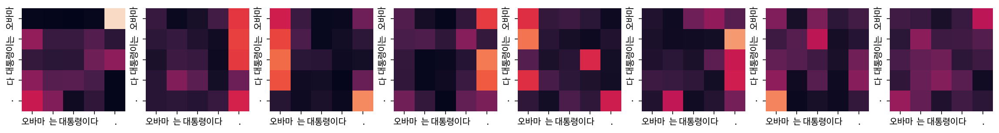

Encoder Layer 2


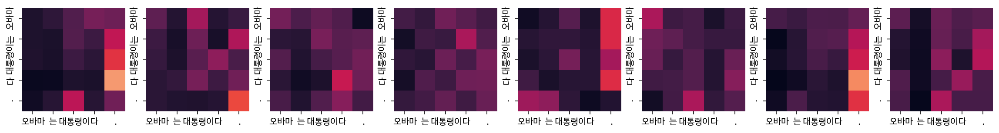

Decoder Self-Attention Layer 1


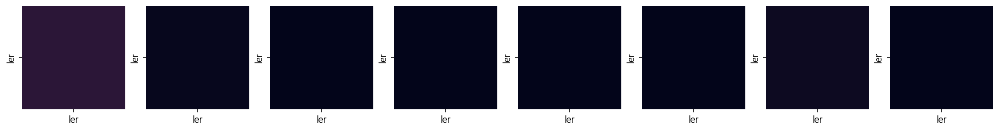

Decoder Self-Attention Layer 2


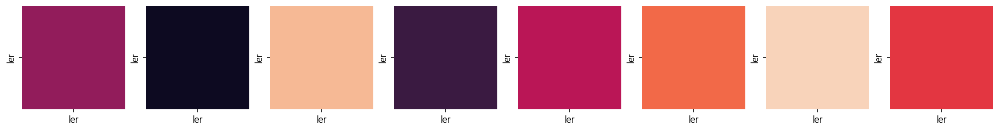

Encoder-Decoder Attention Layer 1


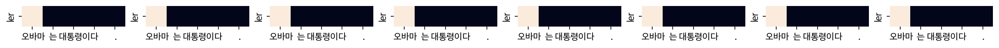

Encoder-Decoder Attention Layer 2


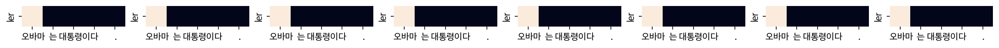

Input: 시민들은 도시 속에 산다.
Predicted translation: 
Encoder Layer 1


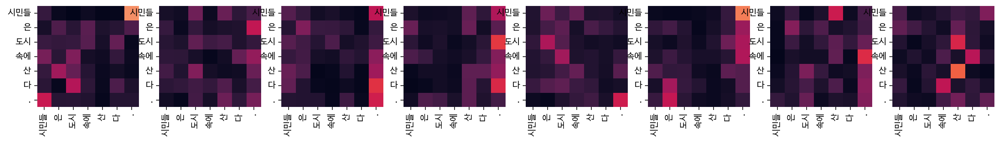

Encoder Layer 2


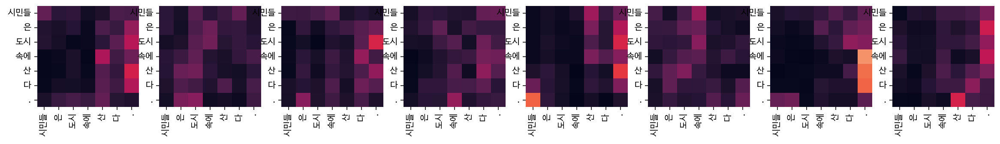

Decoder Self-Attention Layer 1


/opt/conda/lib/python3.9/site-packages/seaborn/matrix.py:305: UserWarning: Attempting to set identical left == right == 0 results in singular transformations; automatically expanding.
  ax.set(xlim=(0, self.data.shape[1]), ylim=(0, self.data.shape[0]))
/opt/conda/lib/python3.9/site-packages/seaborn/matrix.py:305: UserWarning: Attempting to set identical bottom == top == 0 results in singular transformations; automatically expanding.
  ax.set(xlim=(0, self.data.shape[1]), ylim=(0, self.data.shape[0]))


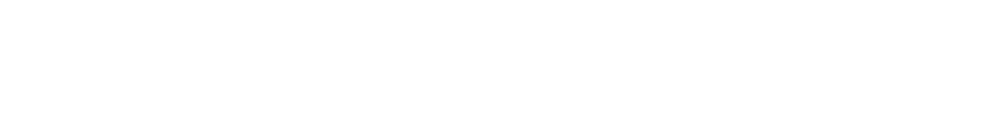

Decoder Self-Attention Layer 2


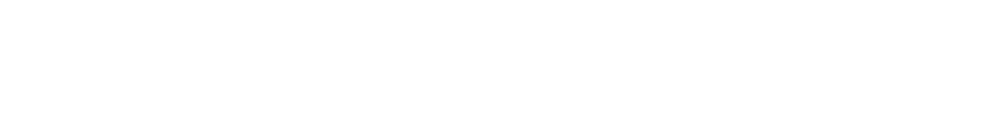

Encoder-Decoder Attention Layer 1


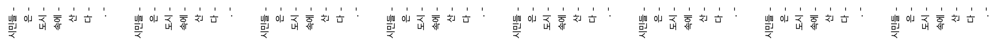

Encoder-Decoder Attention Layer 2


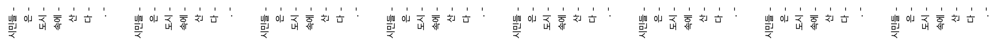

Input: 커피는 필요 없다.
Predicted translation: 
Encoder Layer 1


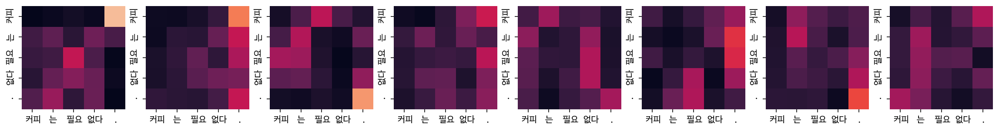

Encoder Layer 2


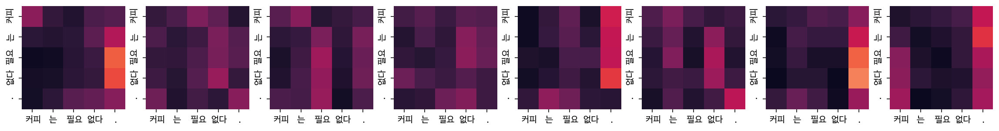

Decoder Self-Attention Layer 1


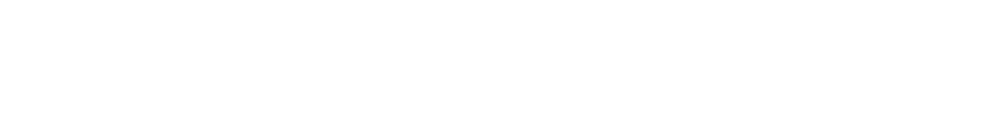

Decoder Self-Attention Layer 2


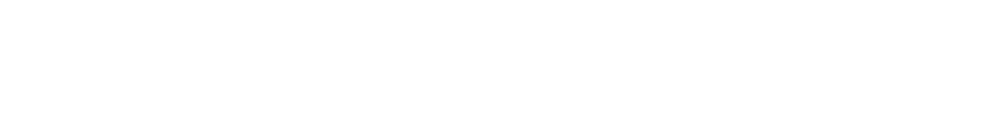

Encoder-Decoder Attention Layer 1


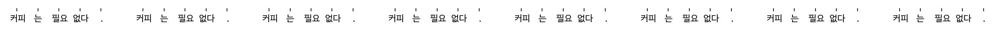

Encoder-Decoder Attention Layer 2


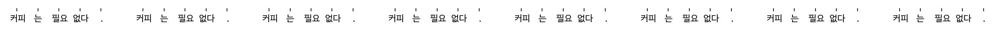

Input: 일곱 명의 사망자가 발생했다.
Predicted translation: 
Encoder Layer 1


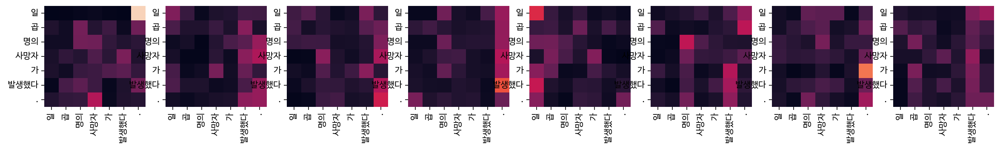

Encoder Layer 2


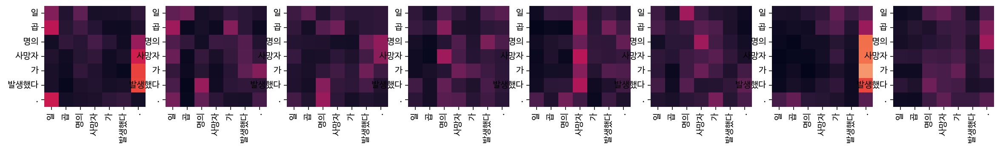

Decoder Self-Attention Layer 1


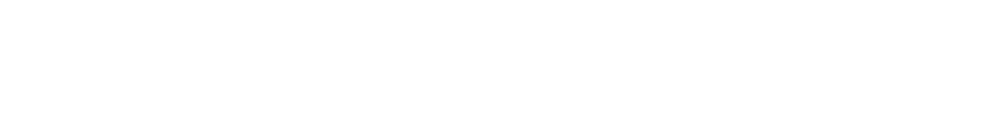

Decoder Self-Attention Layer 2


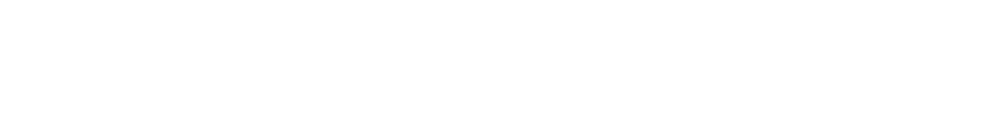

Encoder-Decoder Attention Layer 1


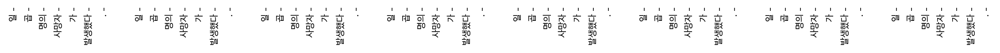

Encoder-Decoder Attention Layer 2


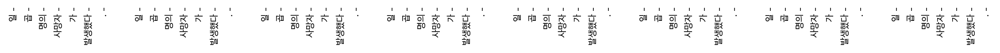


Epoch 2/10


Epoch 2:   0%|          | 0/1080 [00:00<?, ?it/s]

Epoch 2, Loss: 1.2389

### Translations and Visualizations ###
Input: 오바마는 대통령이다.
Predicted translation: lerlerlerler , obama s .
Encoder Layer 1


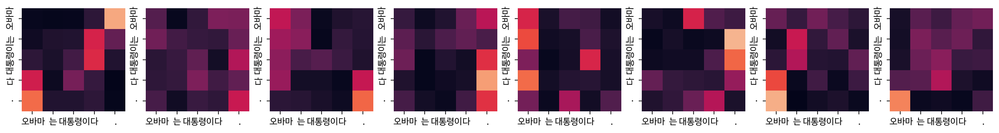

Encoder Layer 2


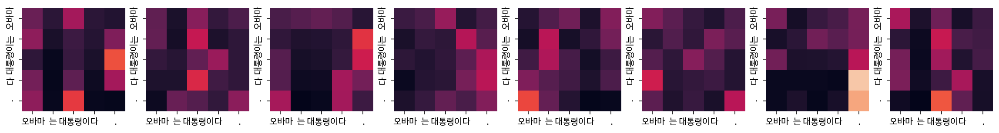

Decoder Self-Attention Layer 1


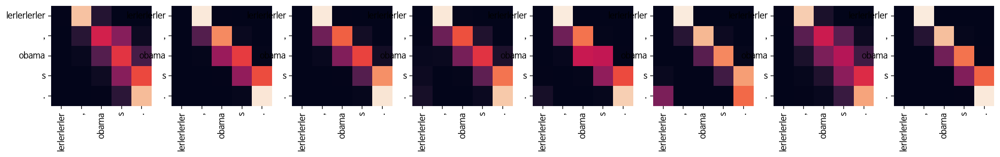

Decoder Self-Attention Layer 2


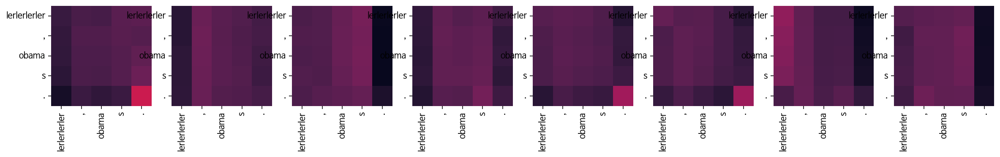

Encoder-Decoder Attention Layer 1


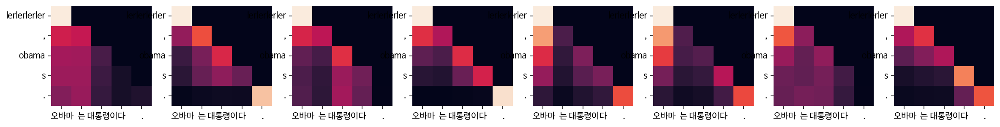

Encoder-Decoder Attention Layer 2


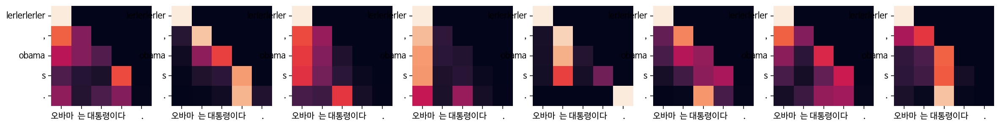

Input: 시민들은 도시 속에 산다.
Predicted translation: 
Encoder Layer 1


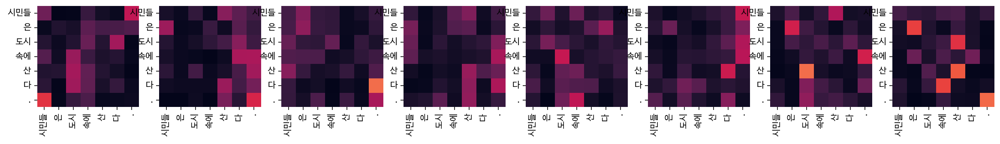

Encoder Layer 2


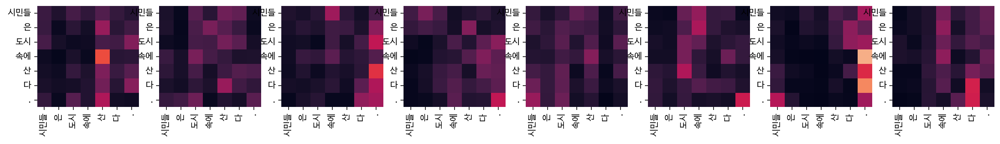

Decoder Self-Attention Layer 1


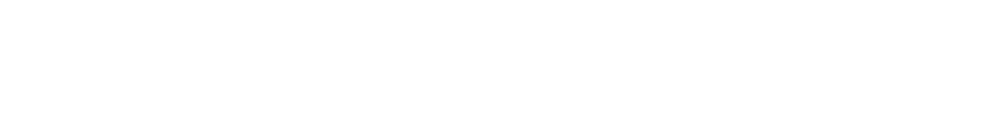

Decoder Self-Attention Layer 2


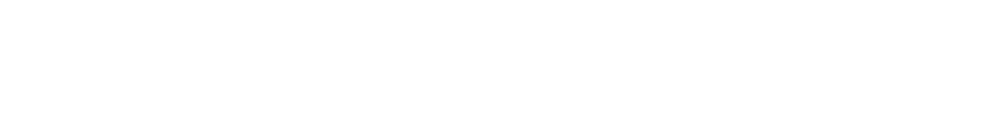

Encoder-Decoder Attention Layer 1


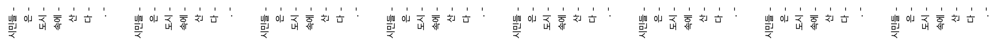

Encoder-Decoder Attention Layer 2


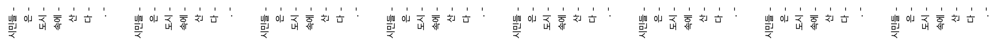

Input: 커피는 필요 없다.
Predicted translation: 
Encoder Layer 1


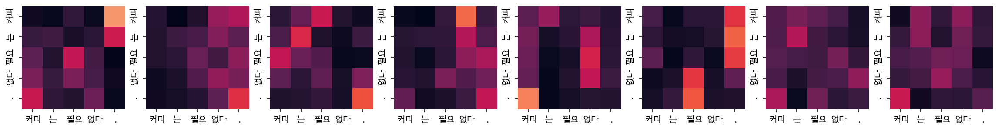

Encoder Layer 2


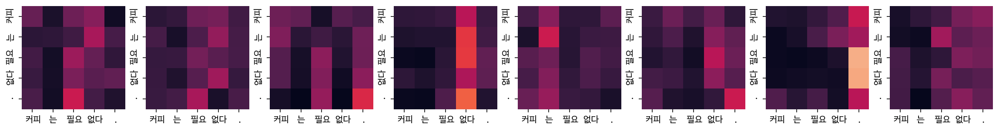

Decoder Self-Attention Layer 1


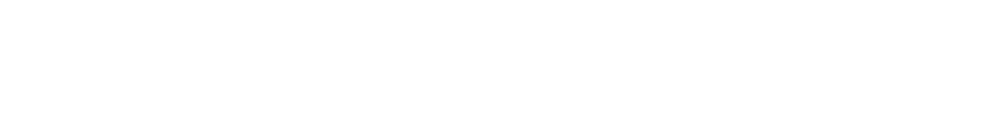

Decoder Self-Attention Layer 2


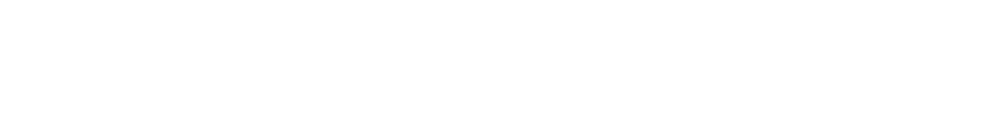

Encoder-Decoder Attention Layer 1


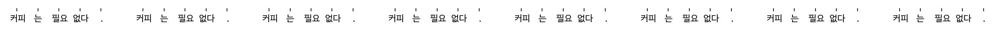

Encoder-Decoder Attention Layer 2


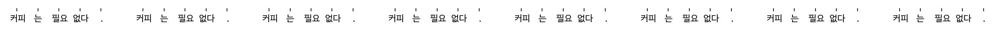

Input: 일곱 명의 사망자가 발생했다.
Predicted translation: lerlerlerlerlerler , officials said .
Encoder Layer 1


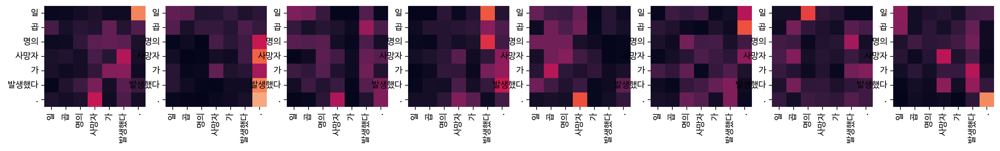

Encoder Layer 2


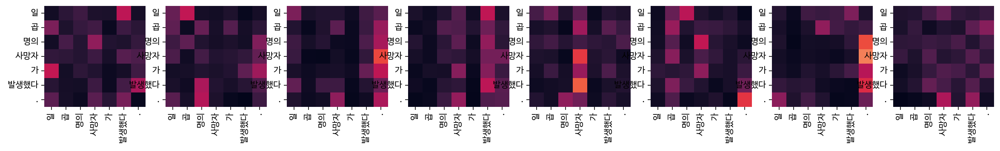

Decoder Self-Attention Layer 1


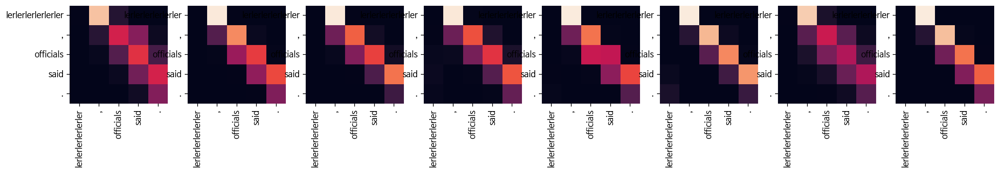

Decoder Self-Attention Layer 2


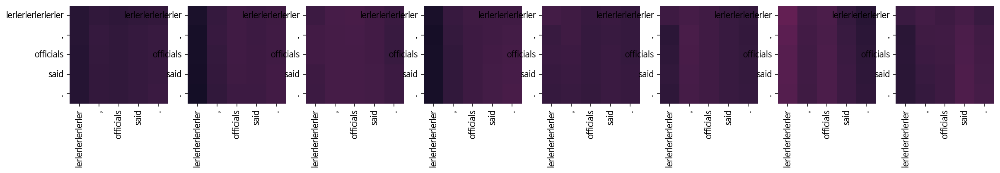

Encoder-Decoder Attention Layer 1


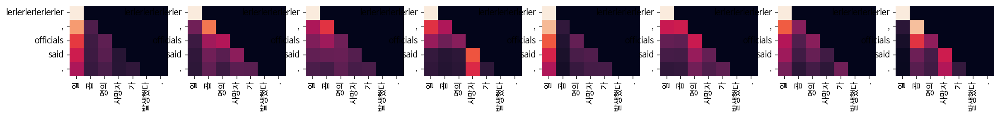

Encoder-Decoder Attention Layer 2


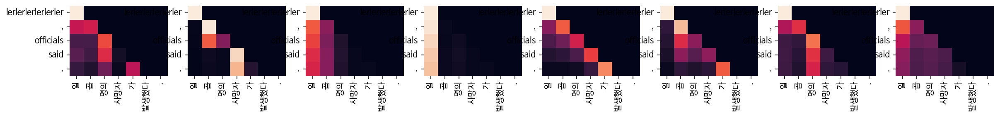


Epoch 3/10


Epoch 3:   0%|          | 0/1080 [00:00<?, ?it/s]

Epoch 3, Loss: 1.0178

### Translations and Visualizations ###
Input: 오바마는 대통령이다.
Predicted translation: run run run runs .
Encoder Layer 1


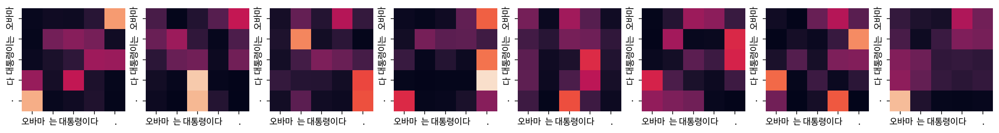

Encoder Layer 2


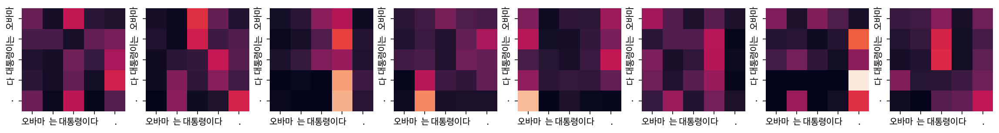

Decoder Self-Attention Layer 1


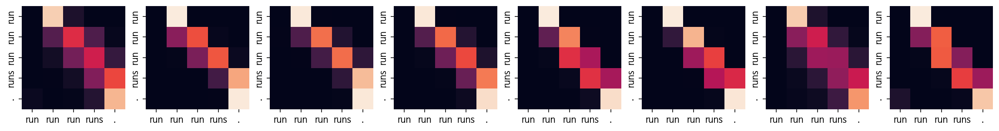

Decoder Self-Attention Layer 2


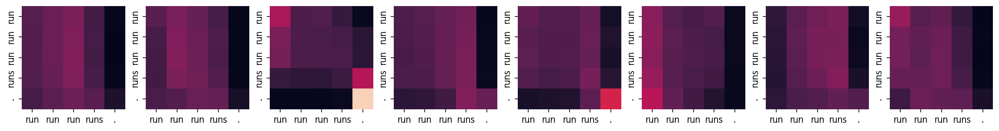

Encoder-Decoder Attention Layer 1


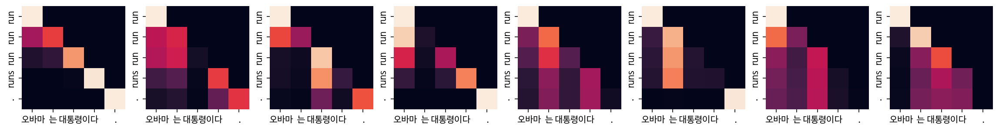

Encoder-Decoder Attention Layer 2


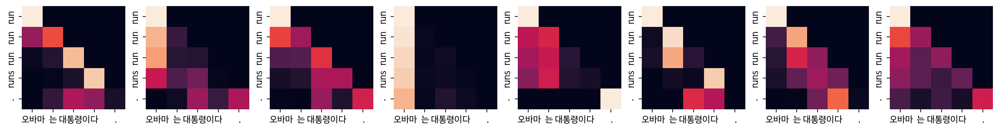

Input: 시민들은 도시 속에 산다.
Predicted translation: bomb bomb bomb bomb bomb .
Encoder Layer 1


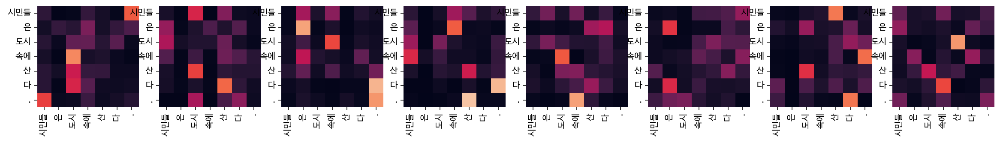

Encoder Layer 2


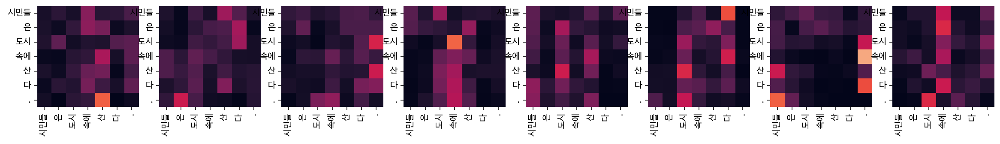

Decoder Self-Attention Layer 1


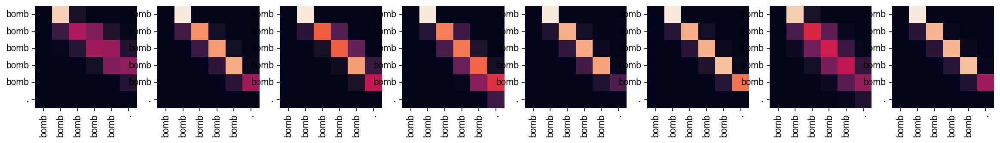

Decoder Self-Attention Layer 2


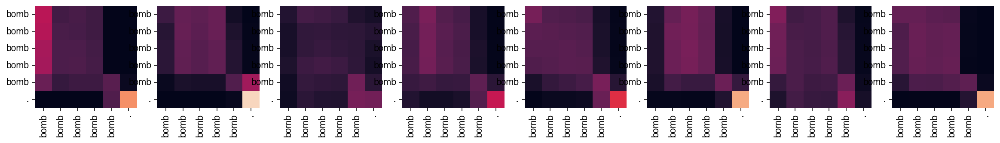

Encoder-Decoder Attention Layer 1


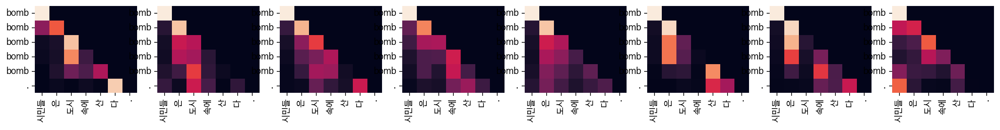

Encoder-Decoder Attention Layer 2


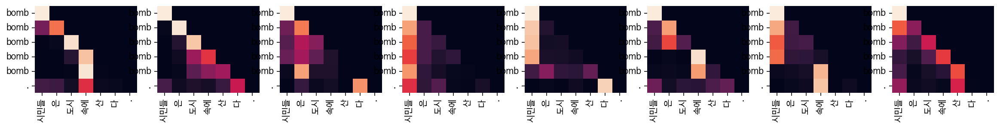

Input: 커피는 필요 없다.
Predicted translation: 
Encoder Layer 1


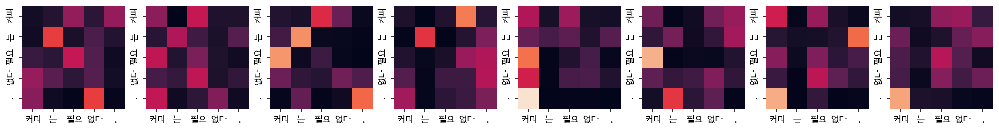

Encoder Layer 2


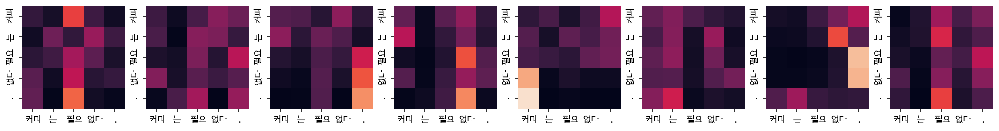

Decoder Self-Attention Layer 1


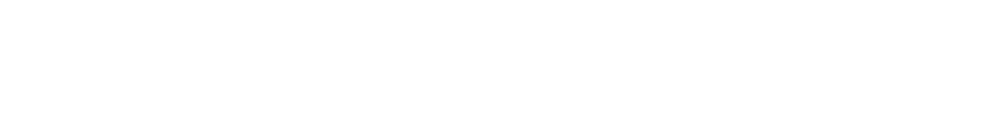

Decoder Self-Attention Layer 2


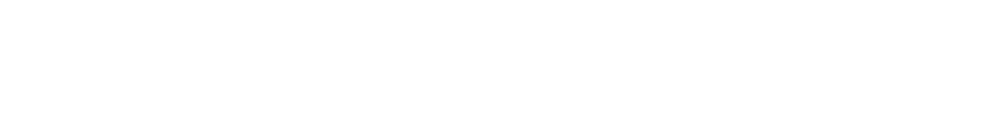

Encoder-Decoder Attention Layer 1


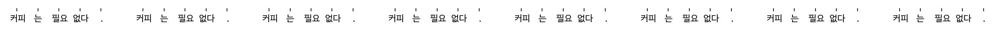

Encoder-Decoder Attention Layer 2


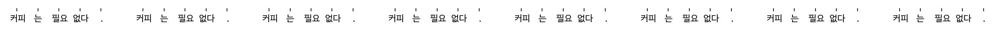

Input: 일곱 명의 사망자가 발생했다.
Predicted translation: 
Encoder Layer 1


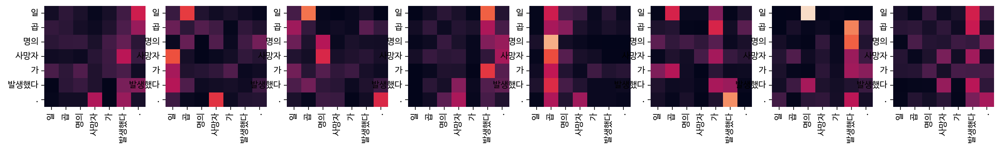

Encoder Layer 2


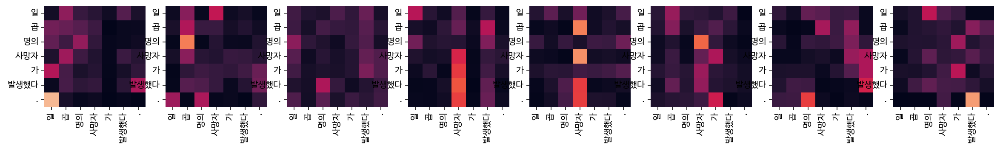

Decoder Self-Attention Layer 1


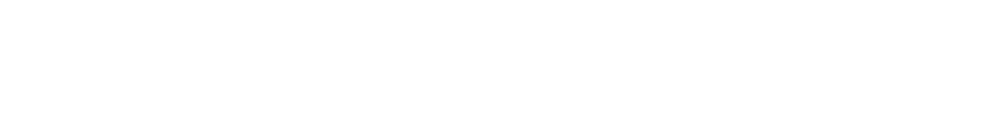

Decoder Self-Attention Layer 2


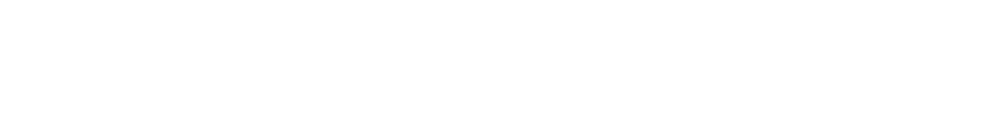

Encoder-Decoder Attention Layer 1


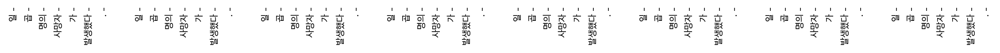

Encoder-Decoder Attention Layer 2


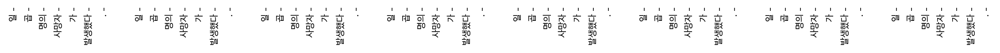


Epoch 4/10


Epoch 4:   0%|          | 0/1080 [00:00<?, ?it/s]

Epoch 4, Loss: 0.8973

### Translations and Visualizations ###
Input: 오바마는 대통령이다.
Predicted translation: huck huck huck huck huckabee woo suk .
Encoder Layer 1


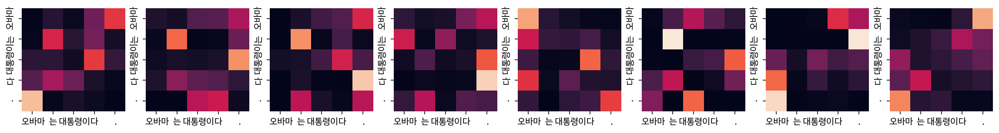

Encoder Layer 2


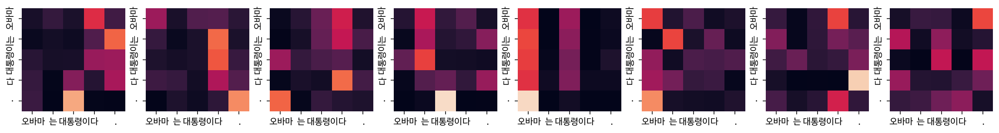

Decoder Self-Attention Layer 1


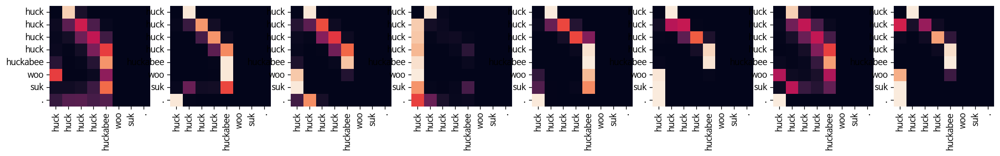

Decoder Self-Attention Layer 2


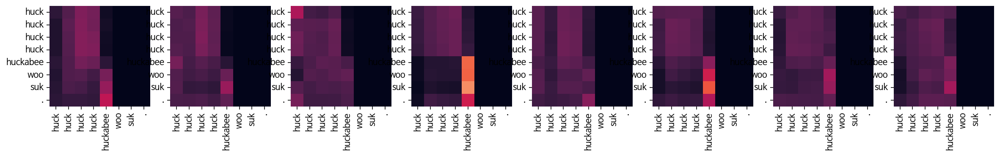

Encoder-Decoder Attention Layer 1


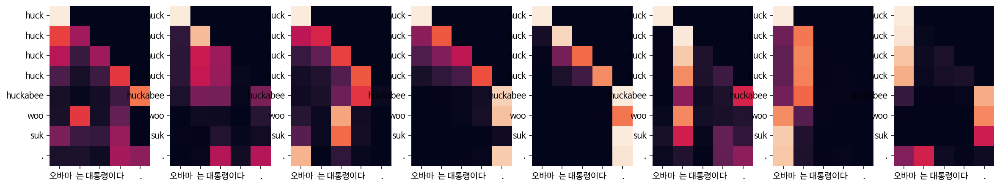

Encoder-Decoder Attention Layer 2


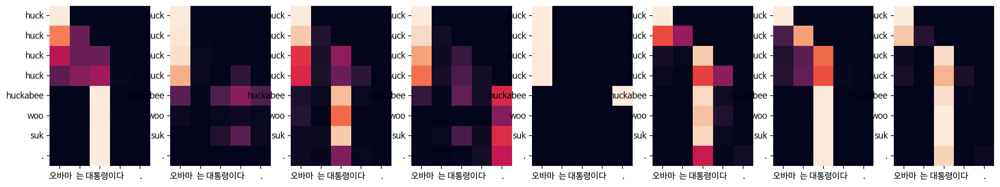

Input: 시민들은 도시 속에 산다.
Predicted translation: river river river river water water water .
Encoder Layer 1


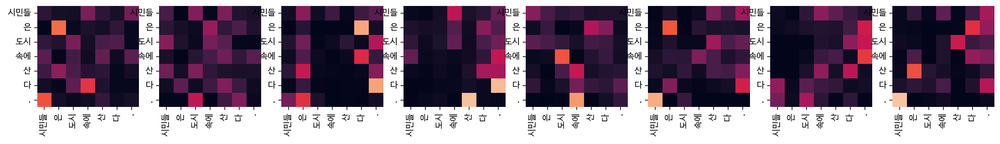

Encoder Layer 2


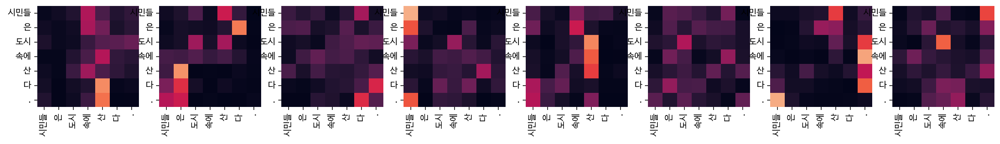

Decoder Self-Attention Layer 1


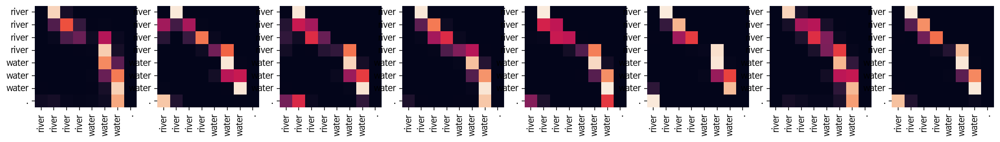

Decoder Self-Attention Layer 2


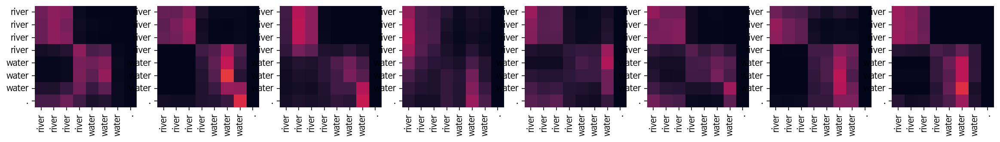

Encoder-Decoder Attention Layer 1


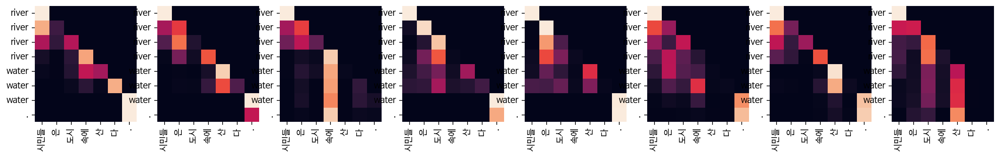

Encoder-Decoder Attention Layer 2


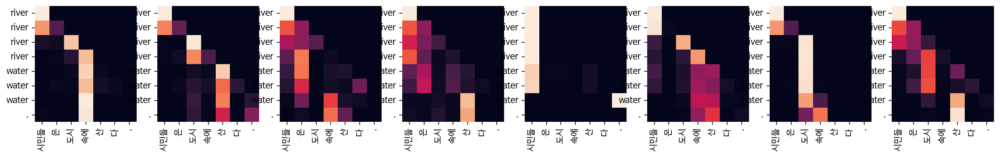

Input: 커피는 필요 없다.
Predicted translation: good good good good good
Encoder Layer 1


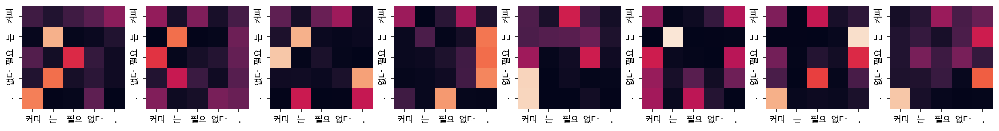

Encoder Layer 2


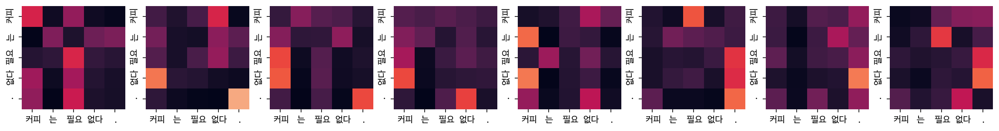

Decoder Self-Attention Layer 1


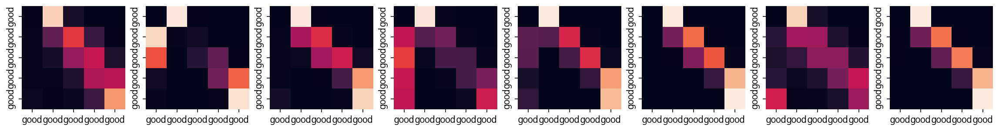

Decoder Self-Attention Layer 2


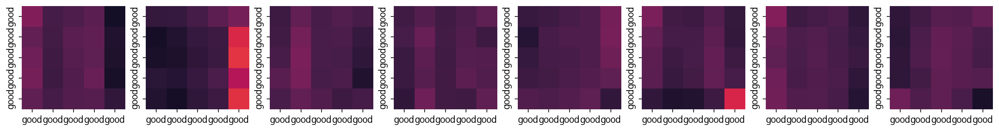

Encoder-Decoder Attention Layer 1


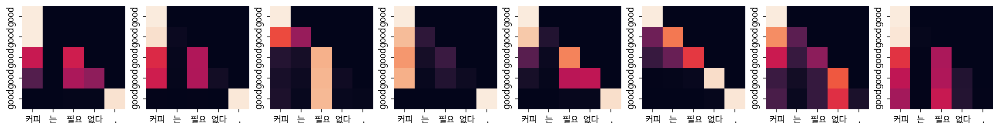

Encoder-Decoder Attention Layer 2


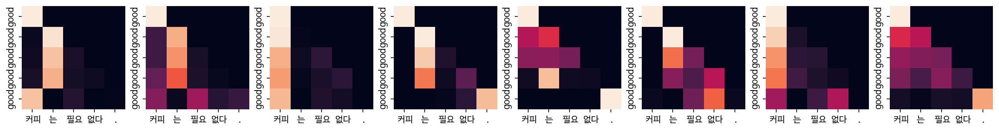

Input: 일곱 명의 사망자가 발생했다.
Predicted translation: two two two two two
Encoder Layer 1


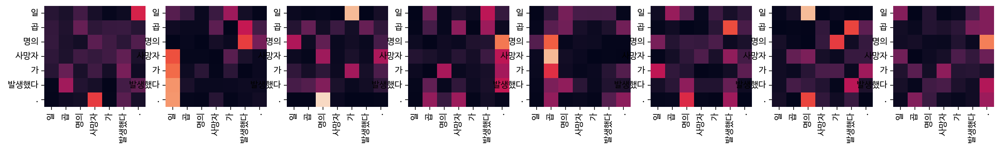

Encoder Layer 2


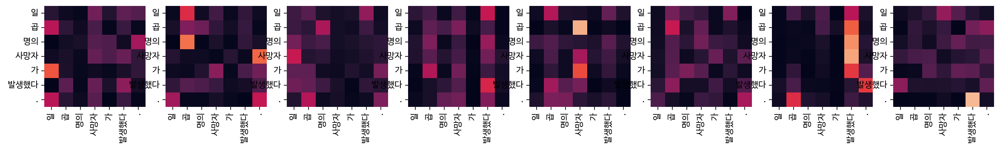

Decoder Self-Attention Layer 1


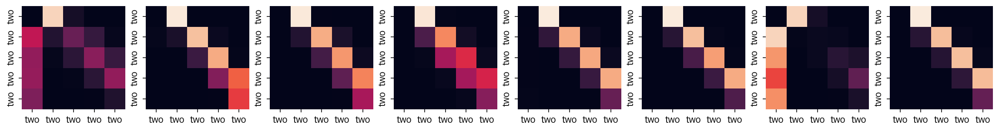

Decoder Self-Attention Layer 2


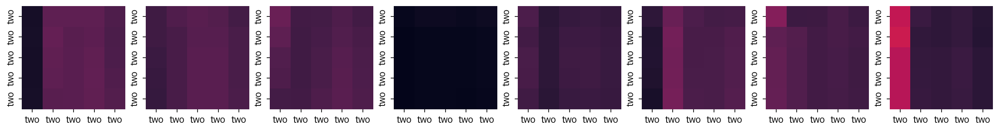

Encoder-Decoder Attention Layer 1


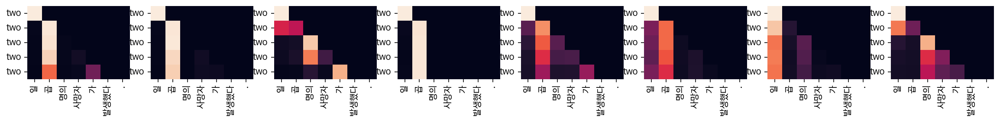

Encoder-Decoder Attention Layer 2


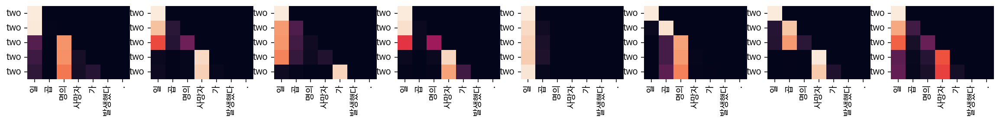


Epoch 5/10


Epoch 5:   0%|          | 0/1080 [00:00<?, ?it/s]

Epoch 5, Loss: 0.7619

### Translations and Visualizations ###
Input: 오바마는 대통령이다.
Predicted translation: obama obama obama obama president obama president president president .
Encoder Layer 1


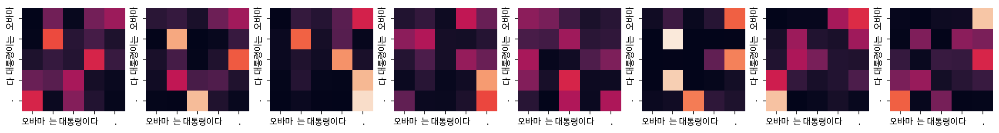

Encoder Layer 2


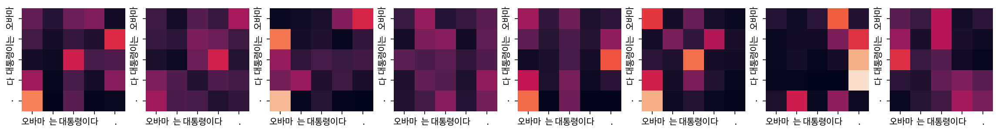

Decoder Self-Attention Layer 1


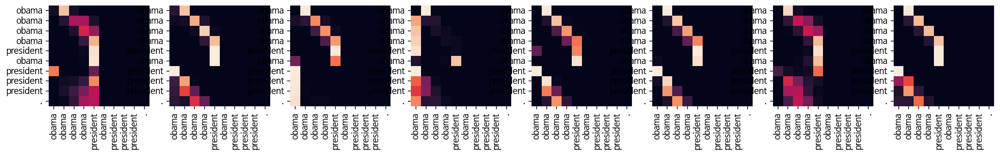

Decoder Self-Attention Layer 2


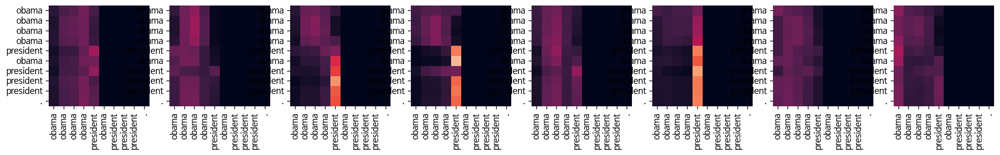

Encoder-Decoder Attention Layer 1


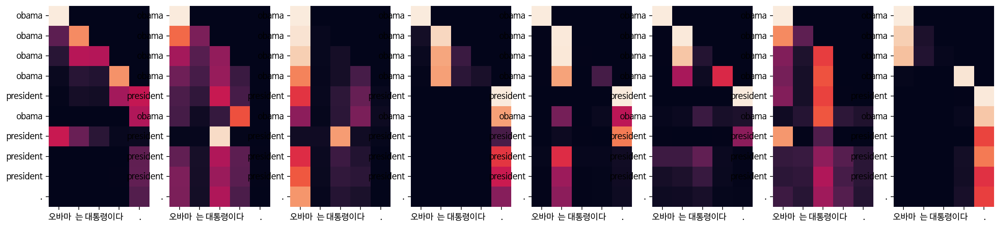

Encoder-Decoder Attention Layer 2


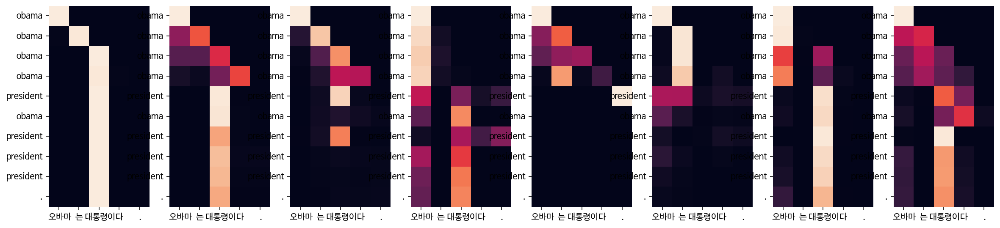

Input: 시민들은 도시 속에 산다.
Predicted translation: torture torture torture torture torture .
Encoder Layer 1


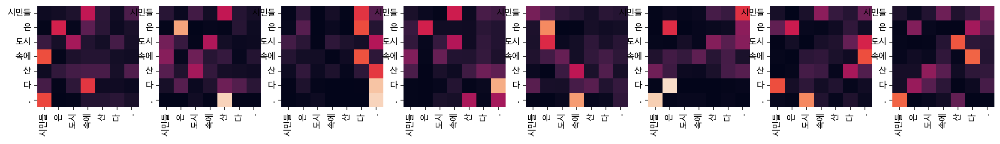

Encoder Layer 2


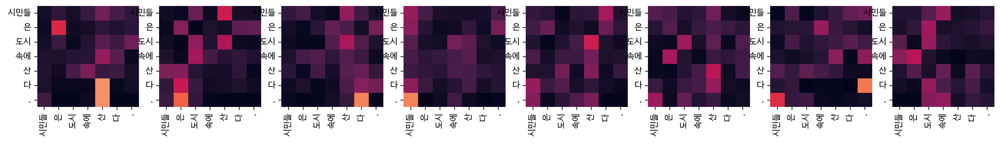

Decoder Self-Attention Layer 1


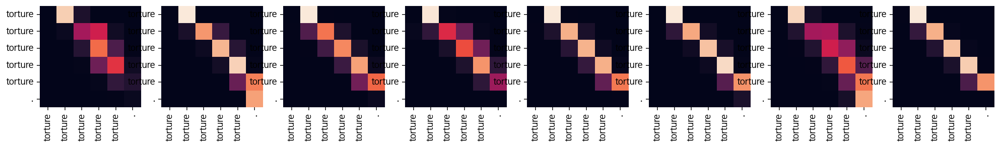

Decoder Self-Attention Layer 2


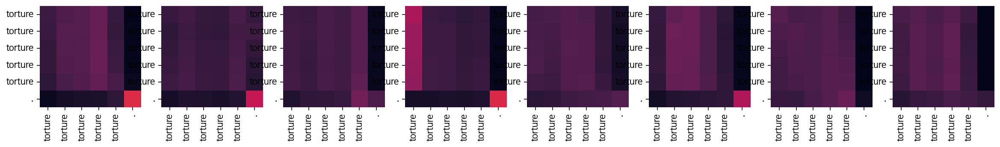

Encoder-Decoder Attention Layer 1


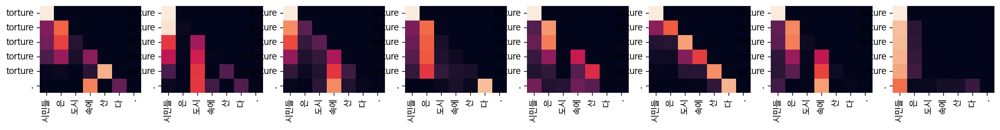

Encoder-Decoder Attention Layer 2


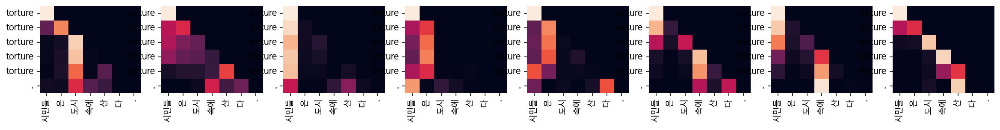

Input: 커피는 필요 없다.
Predicted translation: qa qa qaeda are longing up a big fine .
Encoder Layer 1


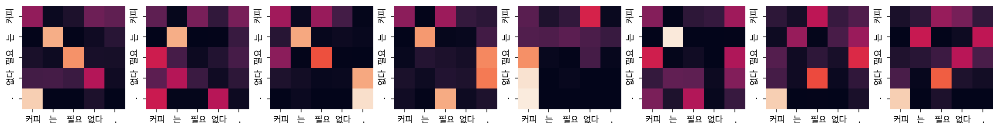

Encoder Layer 2


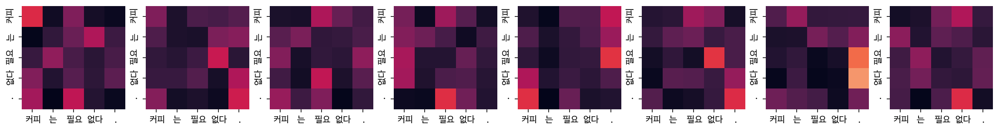

Decoder Self-Attention Layer 1


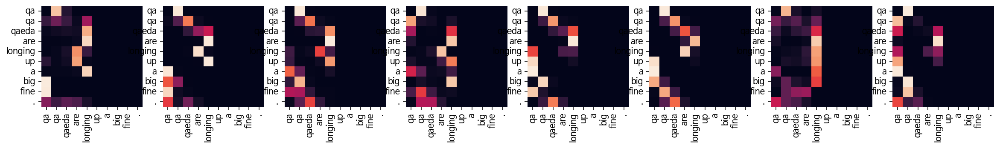

Decoder Self-Attention Layer 2


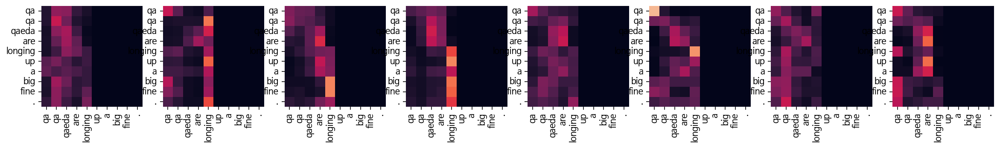

Encoder-Decoder Attention Layer 1


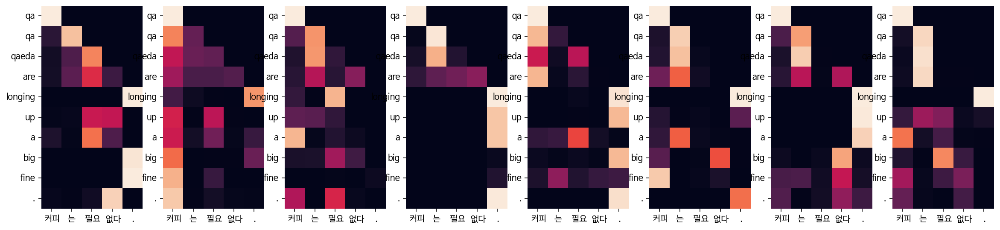

Encoder-Decoder Attention Layer 2


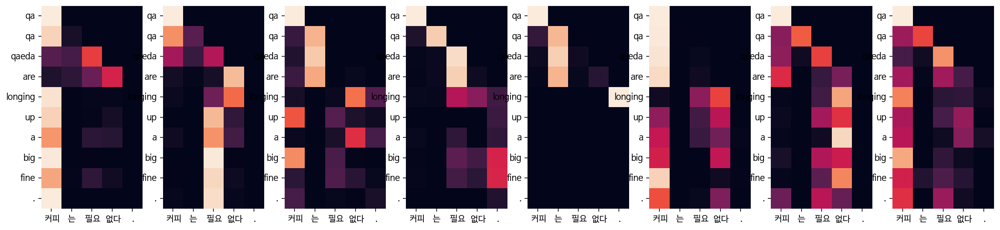

Input: 일곱 명의 사망자가 발생했다.
Predicted translation: popular popular popular popular popular
Encoder Layer 1


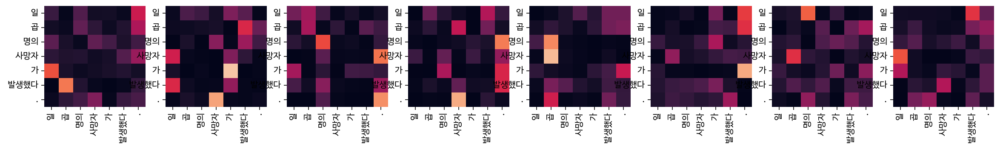

Encoder Layer 2


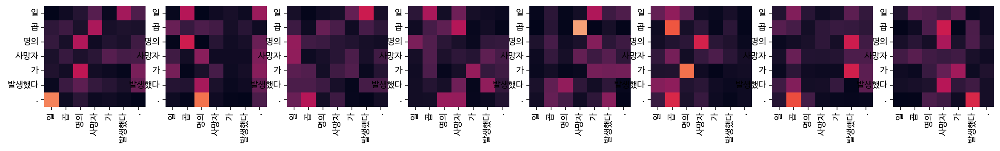

Decoder Self-Attention Layer 1


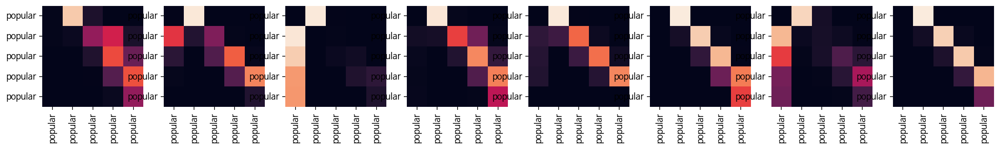

Decoder Self-Attention Layer 2


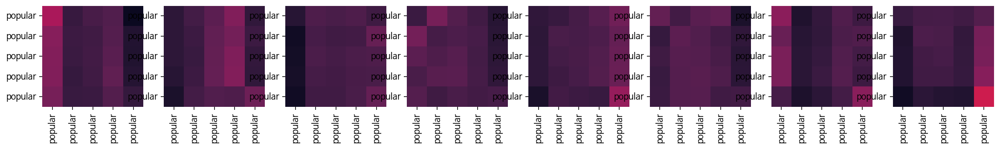

Encoder-Decoder Attention Layer 1


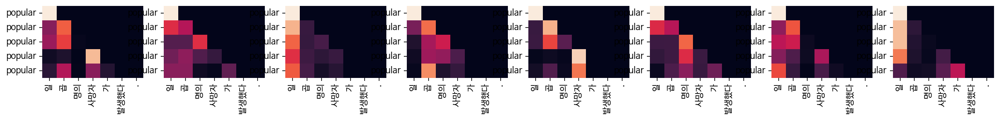

Encoder-Decoder Attention Layer 2


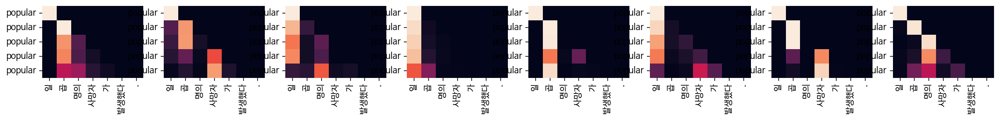


Epoch 6/10


Epoch 6:   0%|          | 0/1080 [00:00<?, ?it/s]

Epoch 6, Loss: 0.5897

### Translations and Visualizations ###
Input: 오바마는 대통령이다.
Predicted translation: again again again again .
Encoder Layer 1


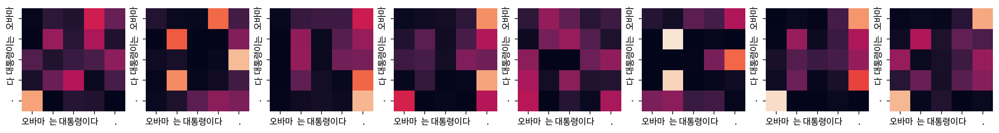

Encoder Layer 2


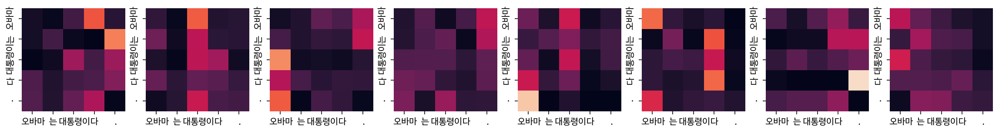

Decoder Self-Attention Layer 1


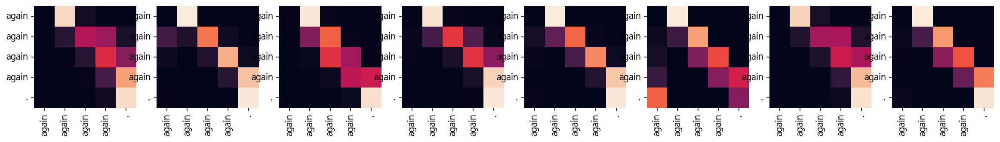

Decoder Self-Attention Layer 2


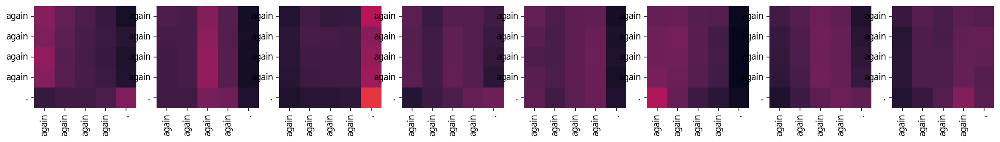

Encoder-Decoder Attention Layer 1


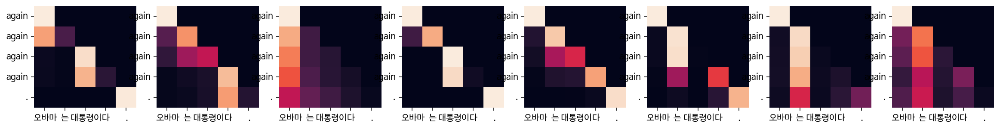

Encoder-Decoder Attention Layer 2


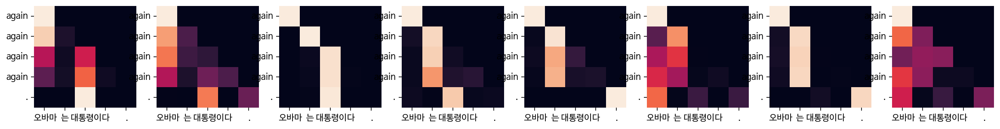

Input: 시민들은 도시 속에 산다.
Predicted translation: restaurant restaurant restaurant restaurant tourist .
Encoder Layer 1


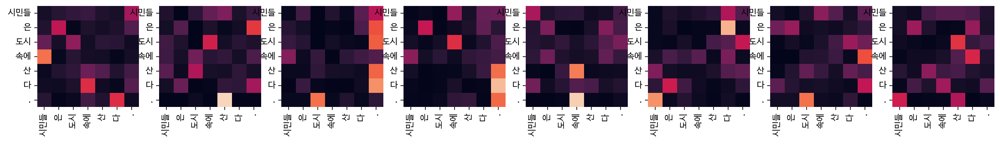

Encoder Layer 2


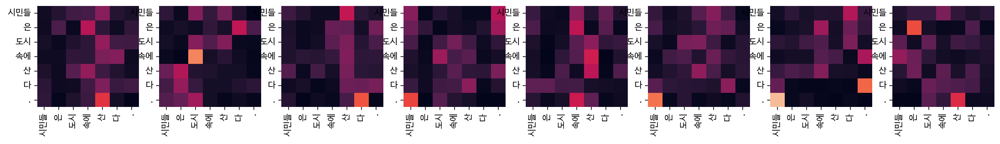

Decoder Self-Attention Layer 1


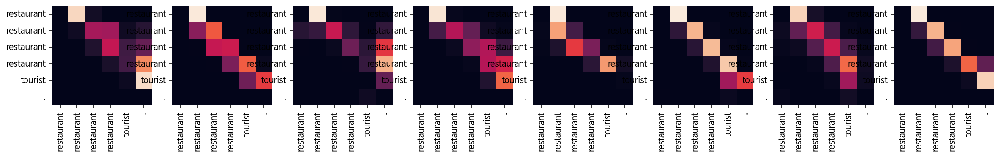

Decoder Self-Attention Layer 2


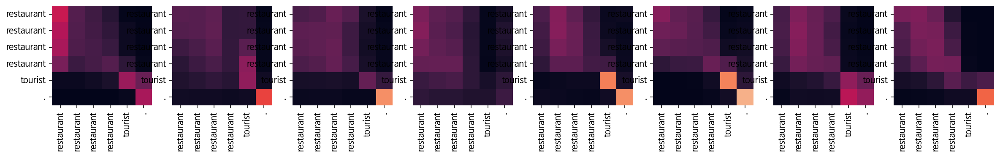

Encoder-Decoder Attention Layer 1


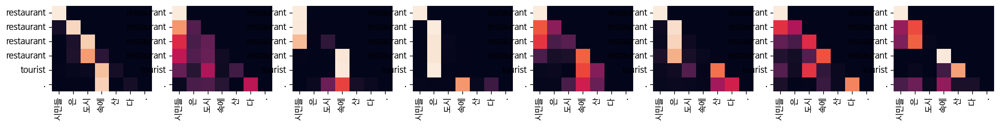

Encoder-Decoder Attention Layer 2


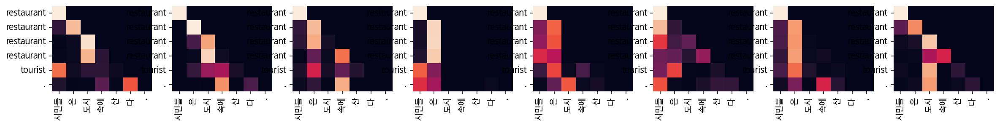

Input: 커피는 필요 없다.
Predicted translation: dozen dozen dozen dozen dozen dozen and dozen and dozen dozen dozen appeal .
Encoder Layer 1


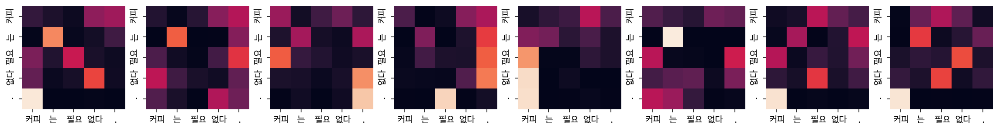

Encoder Layer 2


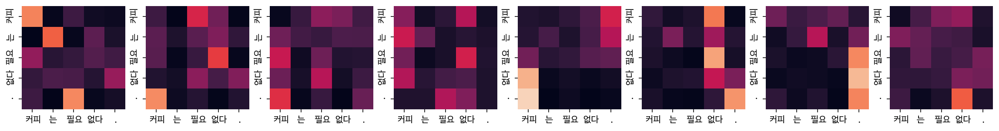

Decoder Self-Attention Layer 1


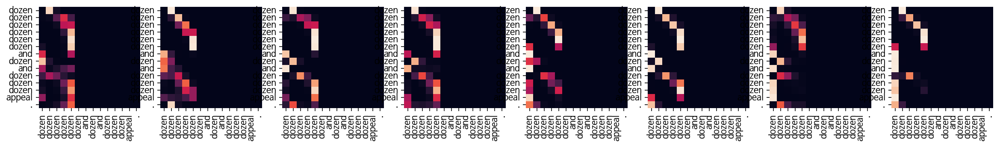

Decoder Self-Attention Layer 2


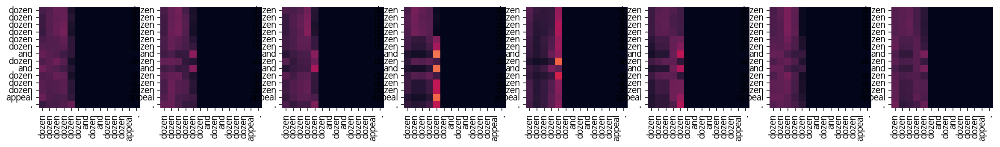

Encoder-Decoder Attention Layer 1


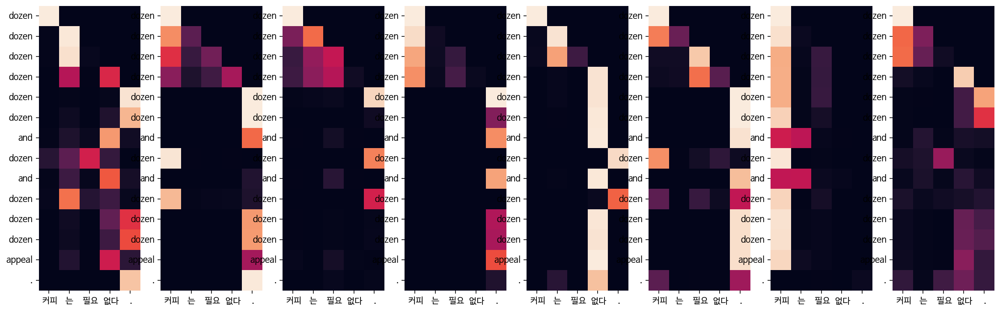

Encoder-Decoder Attention Layer 2


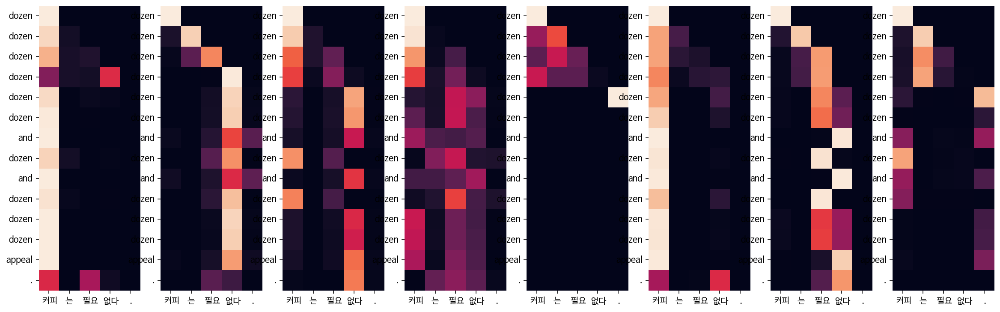

Input: 일곱 명의 사망자가 발생했다.
Predicted translation: h h h h .
Encoder Layer 1


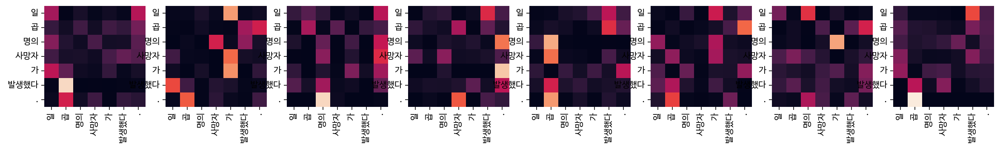

Encoder Layer 2


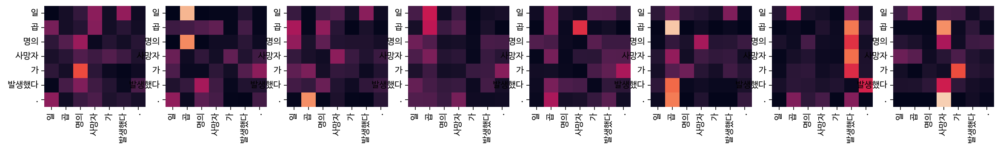

Decoder Self-Attention Layer 1


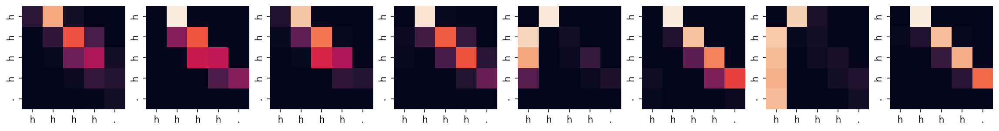

Decoder Self-Attention Layer 2


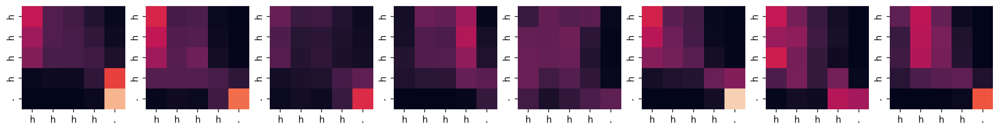

Encoder-Decoder Attention Layer 1


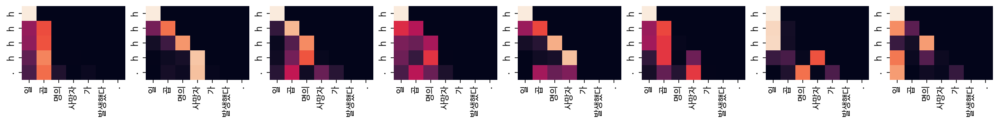

Encoder-Decoder Attention Layer 2


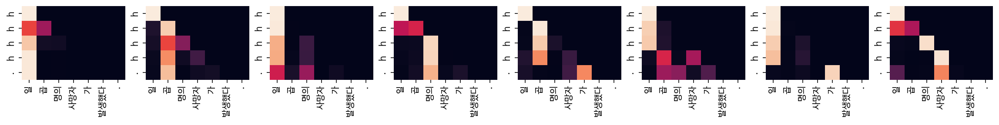


Epoch 7/10


Epoch 7:   0%|          | 0/1080 [00:00<?, ?it/s]

Epoch 7, Loss: 0.4327

### Translations and Visualizations ###
Input: 오바마는 대통령이다.
Predicted translation: long long long long long term
Encoder Layer 1


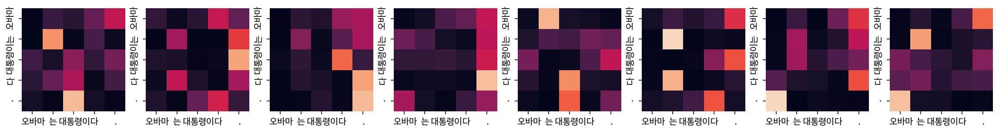

Encoder Layer 2


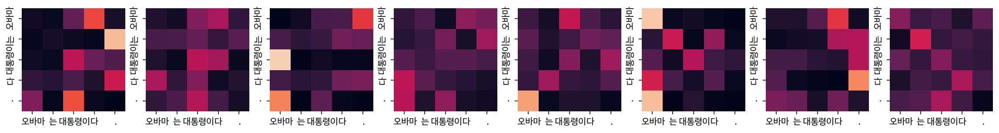

Decoder Self-Attention Layer 1


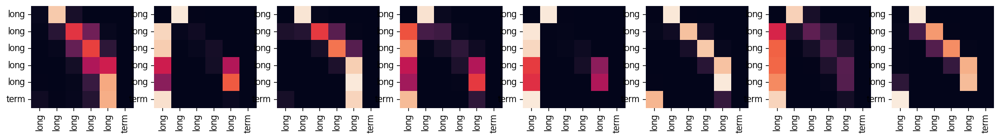

Decoder Self-Attention Layer 2


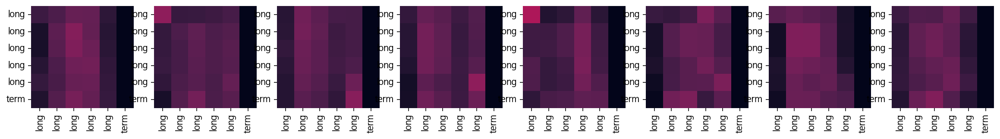

Encoder-Decoder Attention Layer 1


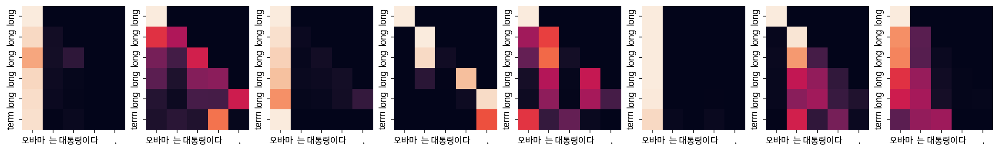

Encoder-Decoder Attention Layer 2


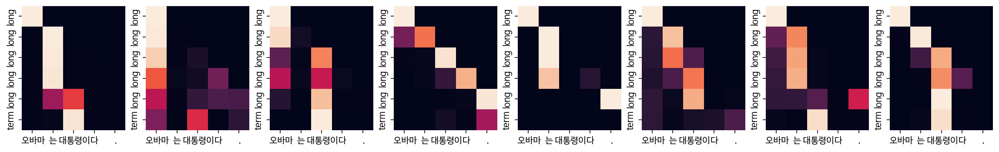

Input: 시민들은 도시 속에 산다.
Predicted translation: region region region region region .
Encoder Layer 1


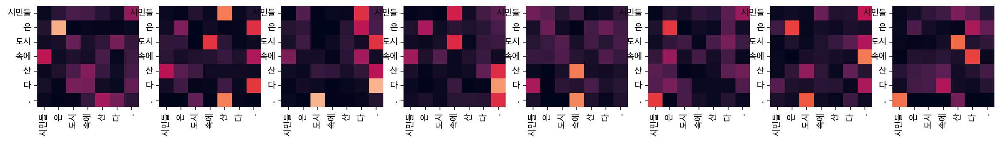

Encoder Layer 2


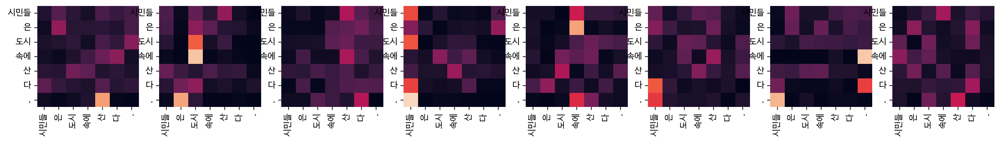

Decoder Self-Attention Layer 1


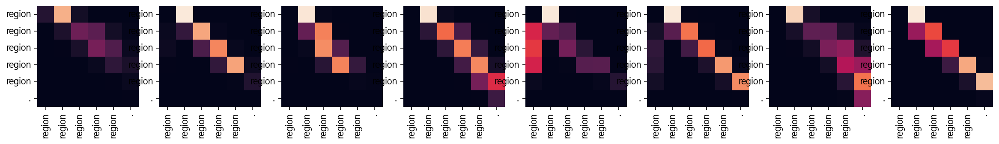

Decoder Self-Attention Layer 2


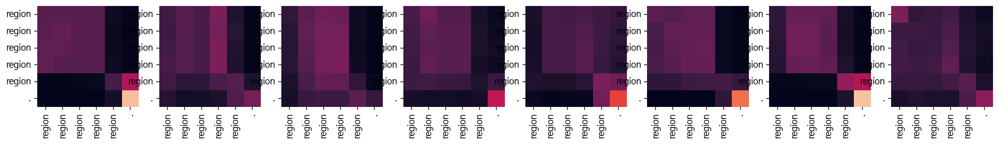

Encoder-Decoder Attention Layer 1


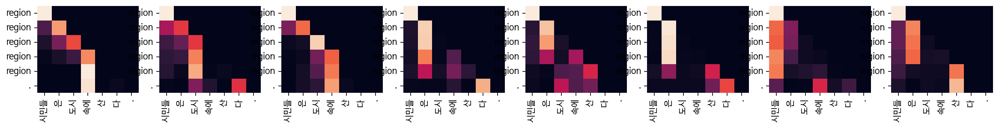

Encoder-Decoder Attention Layer 2


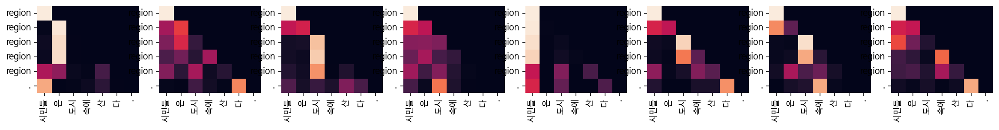

Input: 커피는 필요 없다.
Predicted translation: two two two two dozens are been flu ago .
Encoder Layer 1


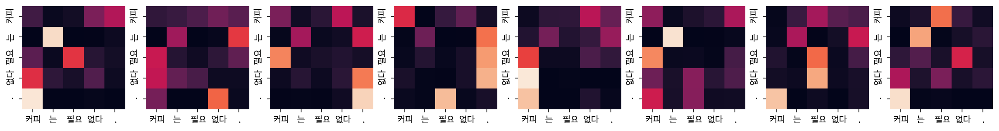

Encoder Layer 2


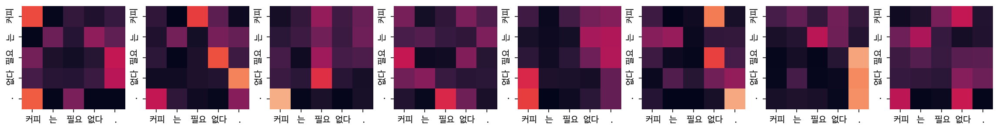

Decoder Self-Attention Layer 1


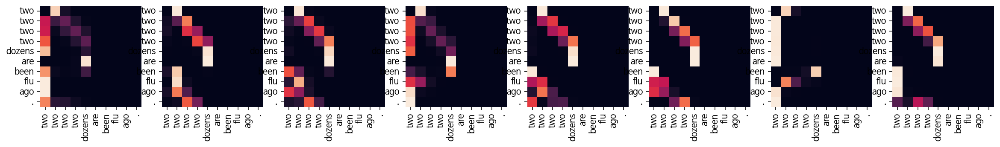

Decoder Self-Attention Layer 2


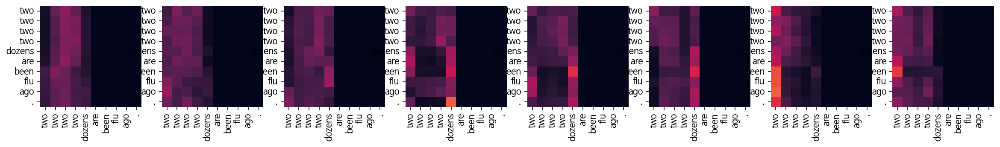

Encoder-Decoder Attention Layer 1


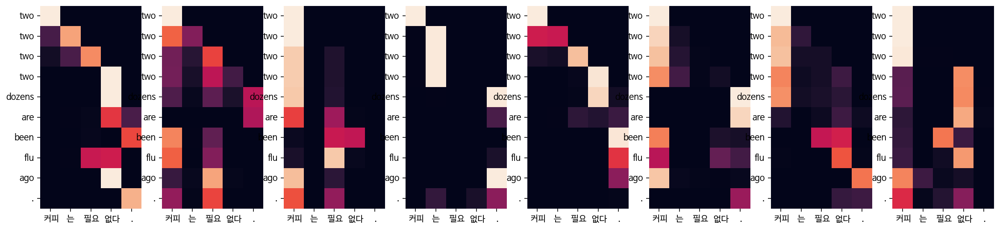

Encoder-Decoder Attention Layer 2


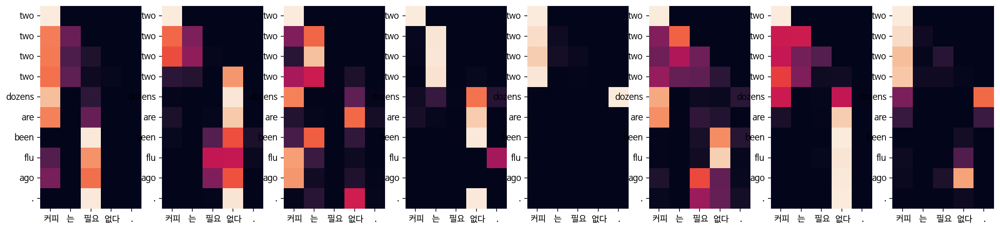

Input: 일곱 명의 사망자가 발생했다.
Predicted translation: sunday evening evening evening evening .
Encoder Layer 1


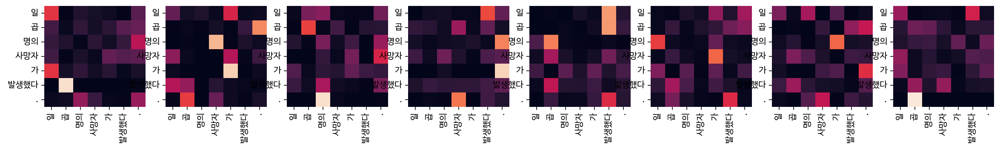

Encoder Layer 2


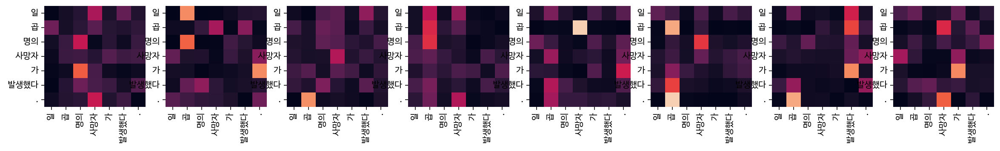

Decoder Self-Attention Layer 1


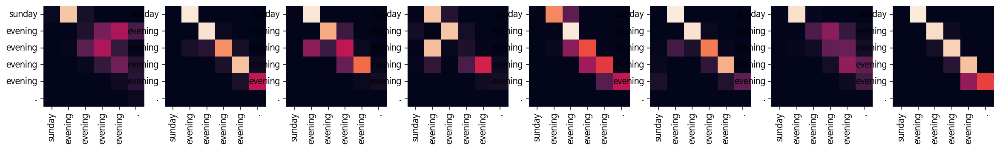

Decoder Self-Attention Layer 2


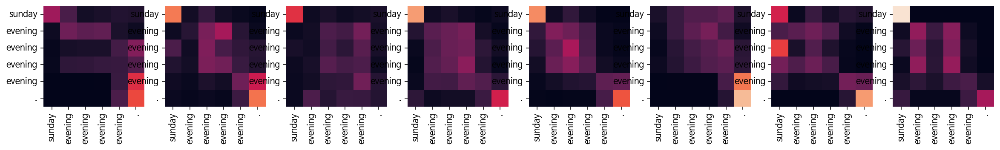

Encoder-Decoder Attention Layer 1


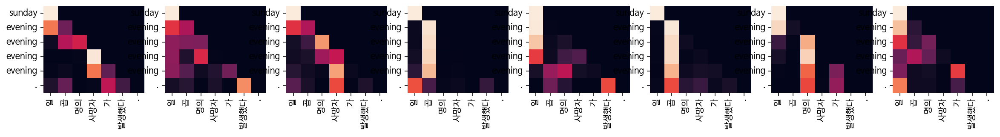

Encoder-Decoder Attention Layer 2


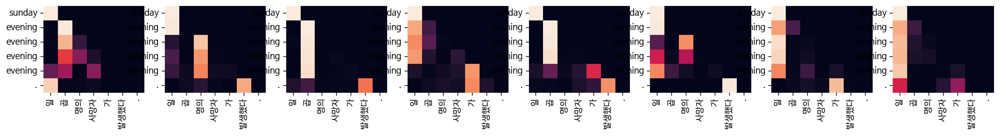


Epoch 8/10


Epoch 8:   0%|          | 0/1080 [00:00<?, ?it/s]

Epoch 8, Loss: 0.3226

### Translations and Visualizations ###
Input: 오바마는 대통령이다.
Predicted translation: kar kar kar kar karzai .
Encoder Layer 1


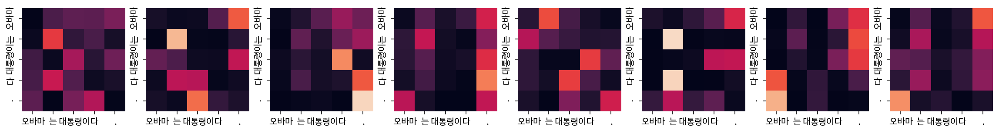

Encoder Layer 2


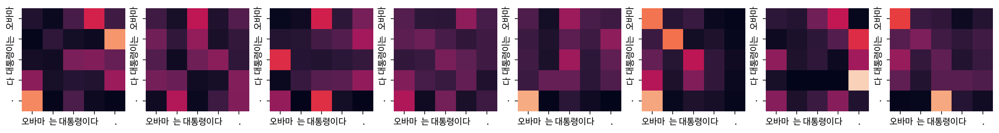

Decoder Self-Attention Layer 1


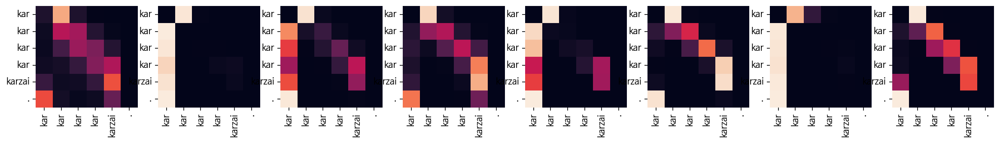

Decoder Self-Attention Layer 2


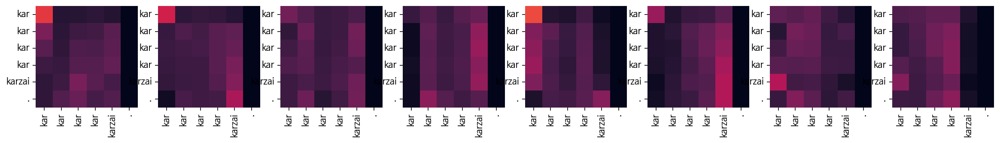

Encoder-Decoder Attention Layer 1


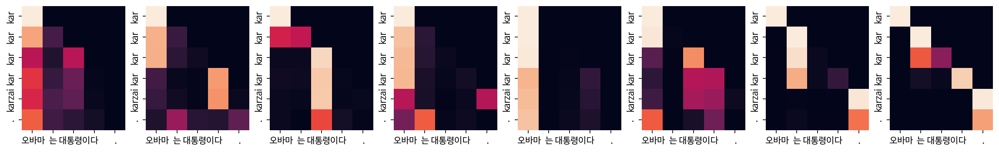

Encoder-Decoder Attention Layer 2


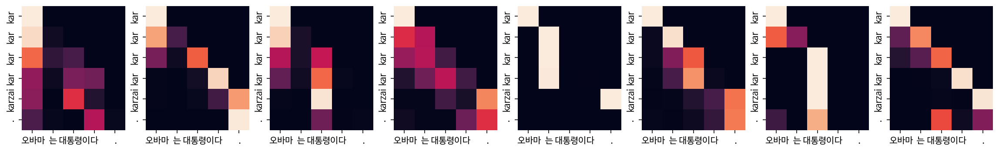

Input: 시민들은 도시 속에 산다.
Predicted translation: it it it it it miles it s .
Encoder Layer 1


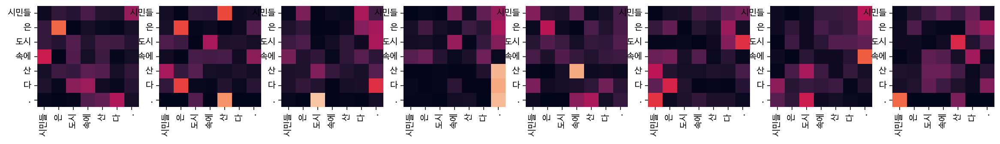

Encoder Layer 2


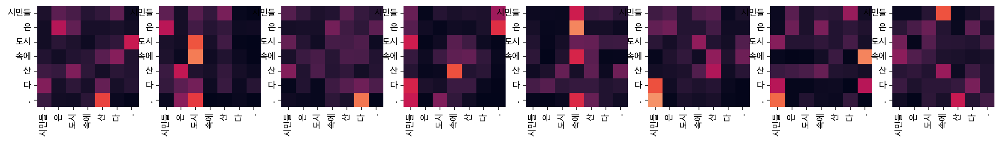

Decoder Self-Attention Layer 1


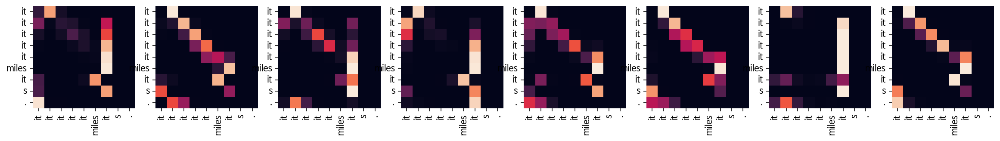

Decoder Self-Attention Layer 2


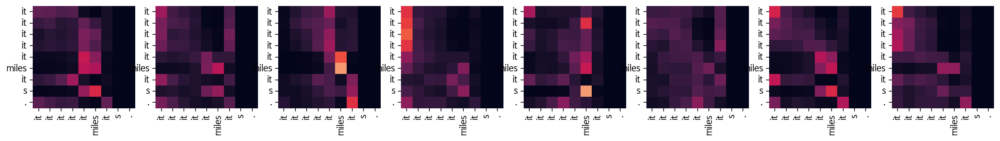

Encoder-Decoder Attention Layer 1


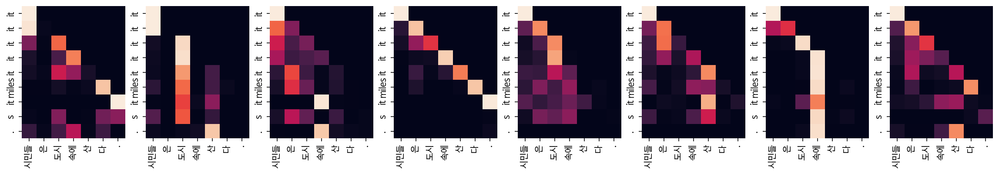

Encoder-Decoder Attention Layer 2


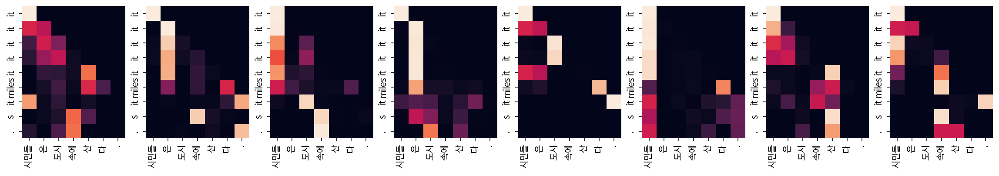

Input: 커피는 필요 없다.
Predicted translation: coffee coffee coffee coffee more coffee .
Encoder Layer 1


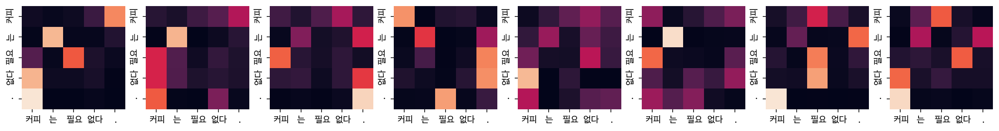

Encoder Layer 2


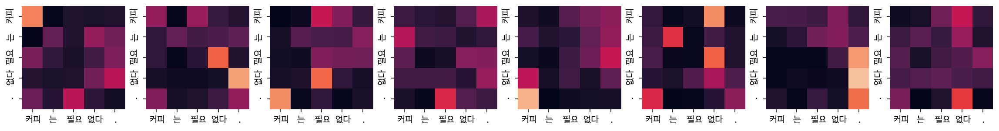

Decoder Self-Attention Layer 1


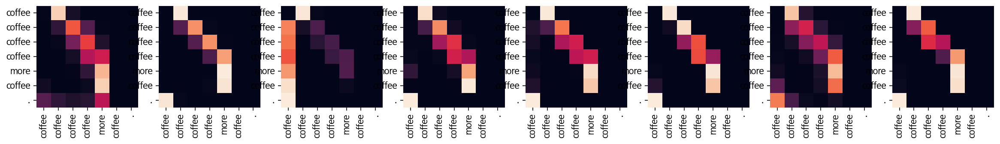

Decoder Self-Attention Layer 2


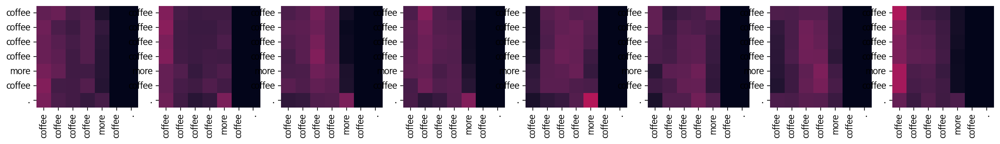

Encoder-Decoder Attention Layer 1


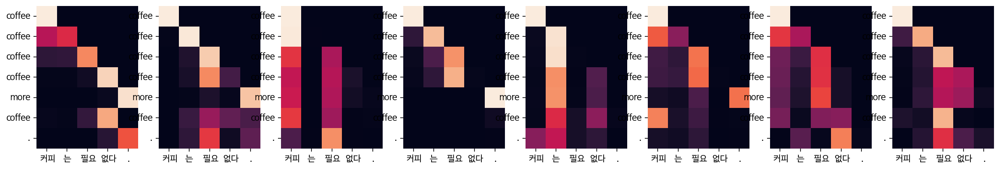

Encoder-Decoder Attention Layer 2


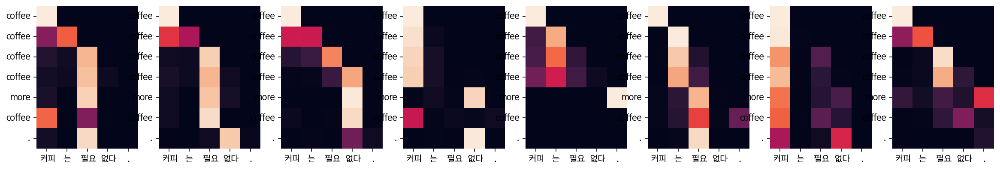

Input: 일곱 명의 사망자가 발생했다.
Predicted translation: missing missing missing missing missing sunday .
Encoder Layer 1


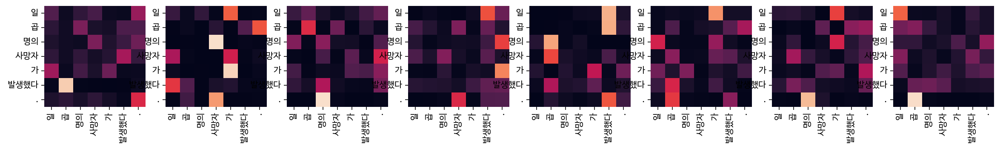

Encoder Layer 2


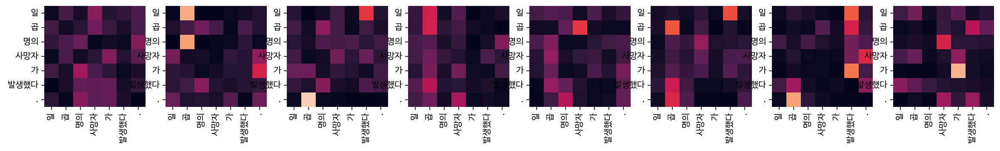

Decoder Self-Attention Layer 1


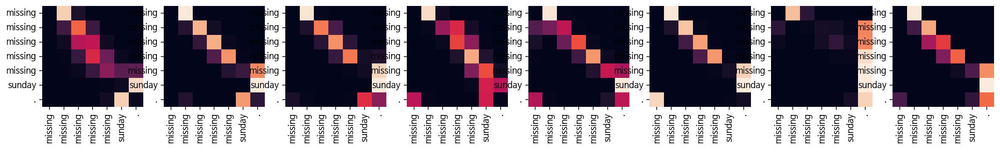

Decoder Self-Attention Layer 2


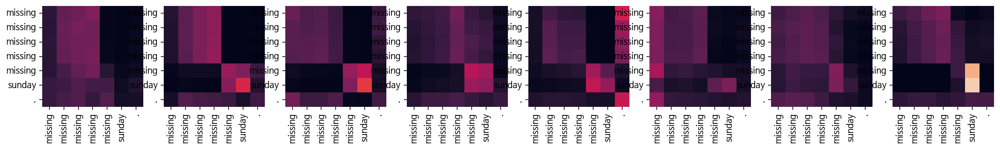

Encoder-Decoder Attention Layer 1


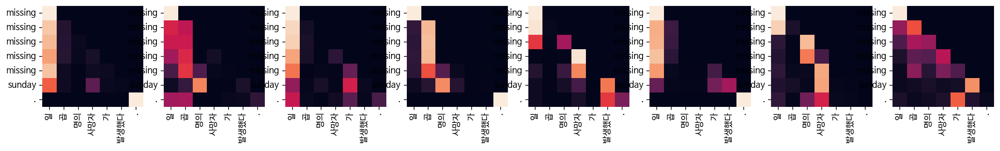

Encoder-Decoder Attention Layer 2


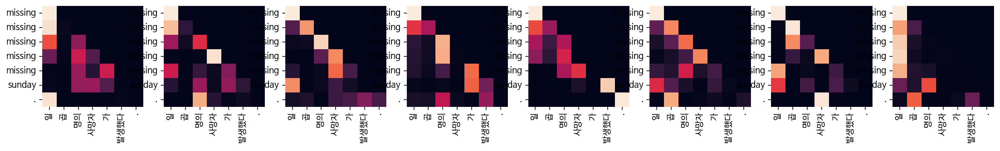


Epoch 9/10


Epoch 9:   0%|          | 0/1080 [00:00<?, ?it/s]

Epoch 9, Loss: 0.2546

### Translations and Visualizations ###
Input: 오바마는 대통령이다.
Predicted translation: very light
Encoder Layer 1


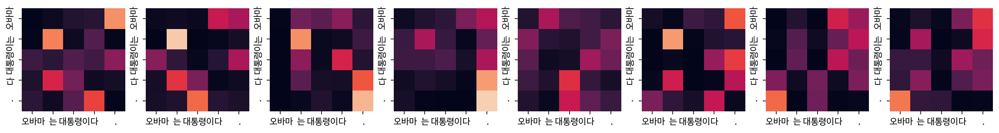

Encoder Layer 2


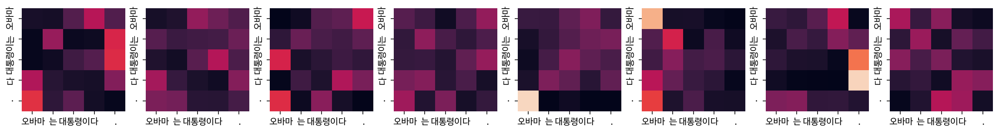

Decoder Self-Attention Layer 1


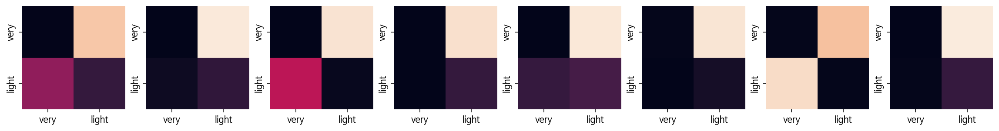

Decoder Self-Attention Layer 2


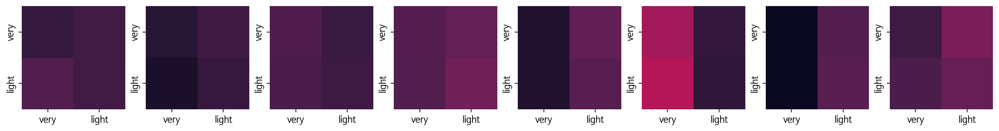

Encoder-Decoder Attention Layer 1


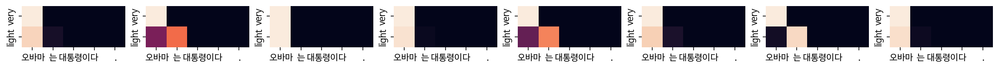

Encoder-Decoder Attention Layer 2


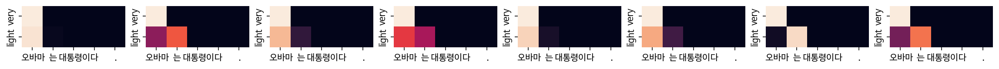

Input: 시민들은 도시 속에 산다.
Predicted translation: region region region region region region region .
Encoder Layer 1


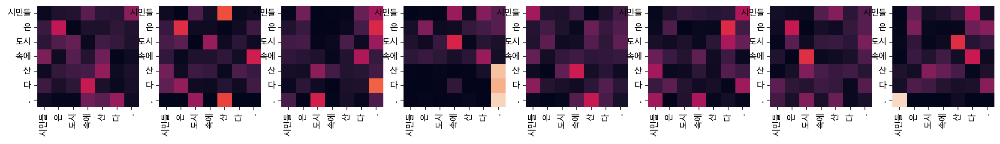

Encoder Layer 2


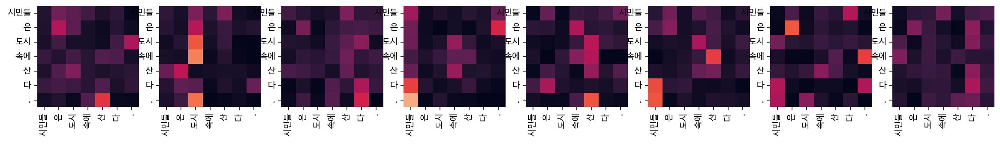

Decoder Self-Attention Layer 1


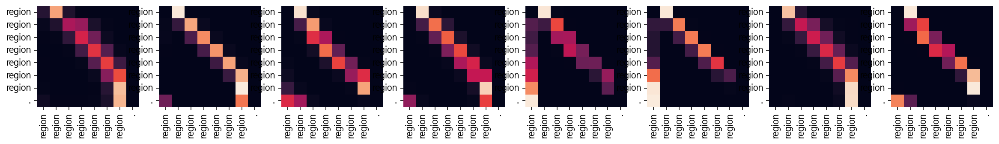

Decoder Self-Attention Layer 2


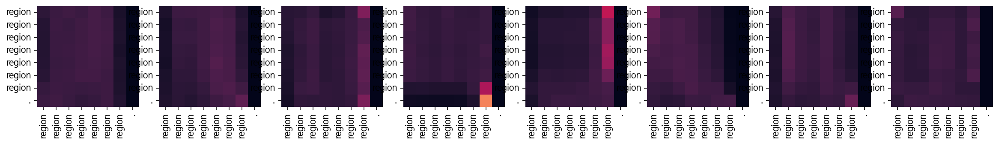

Encoder-Decoder Attention Layer 1


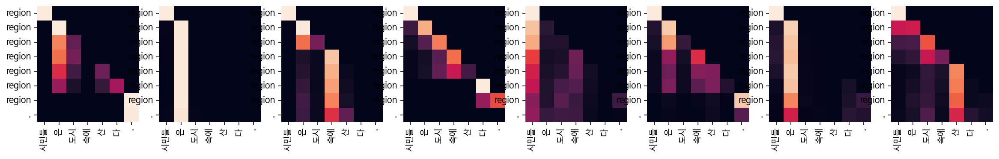

Encoder-Decoder Attention Layer 2


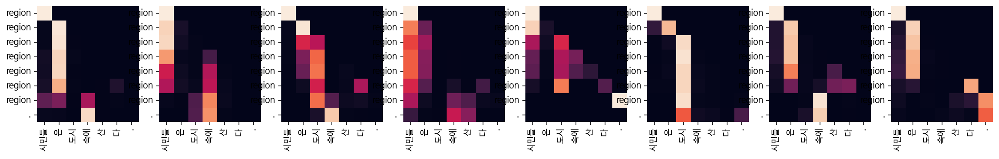

Input: 커피는 필요 없다.
Predicted translation: qa qa qaeda was one more earth who have a dog .
Encoder Layer 1


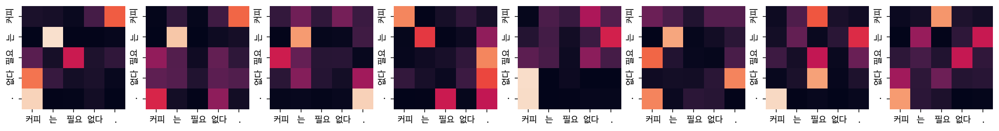

Encoder Layer 2


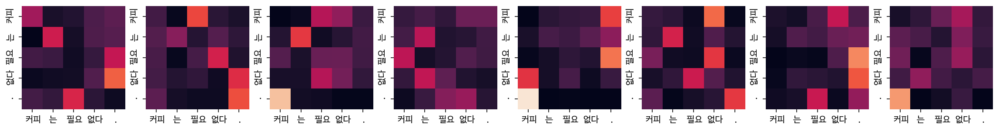

Decoder Self-Attention Layer 1


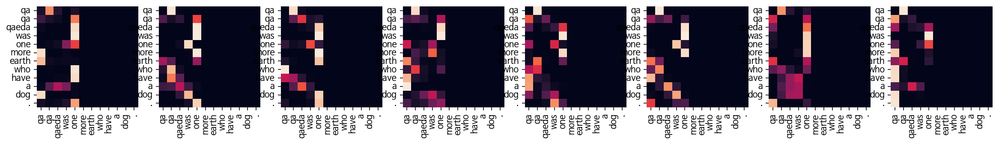

Decoder Self-Attention Layer 2


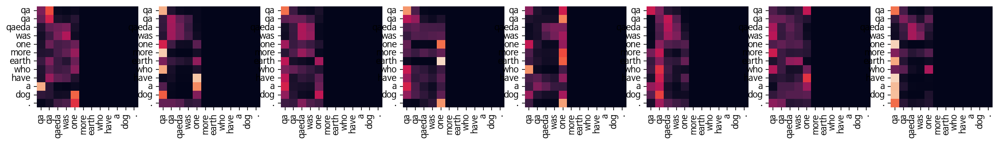

Encoder-Decoder Attention Layer 1


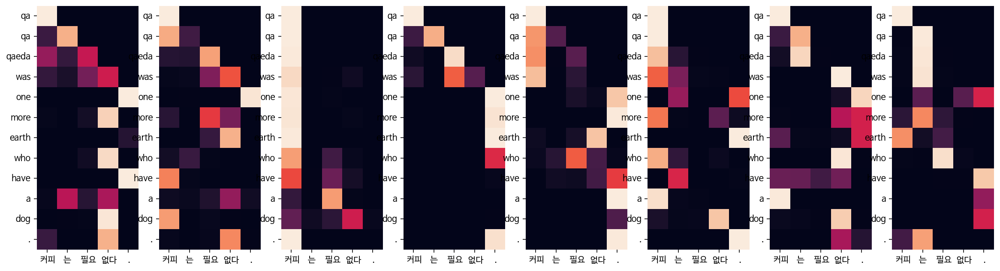

Encoder-Decoder Attention Layer 2


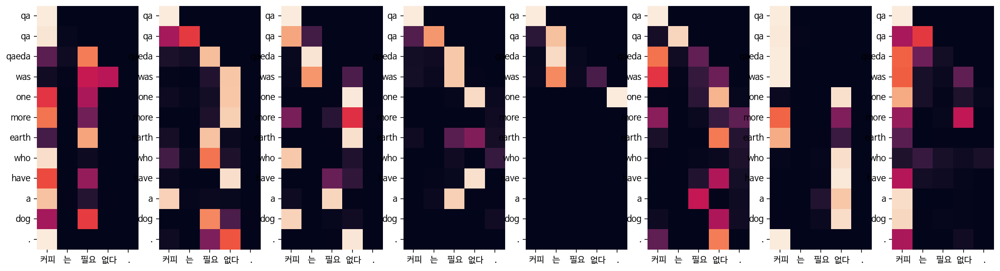

Input: 일곱 명의 사망자가 발생했다.
Predicted translation: very very very sunday .
Encoder Layer 1


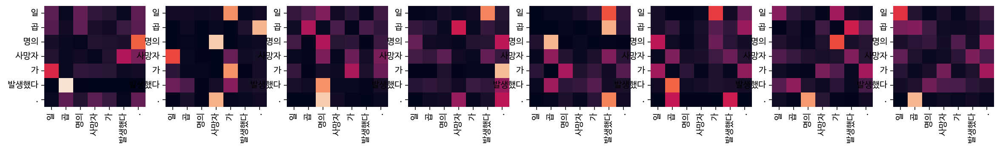

Encoder Layer 2


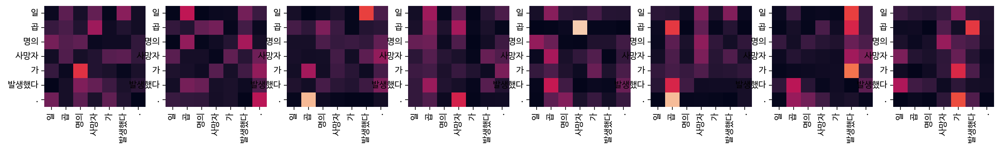

Decoder Self-Attention Layer 1


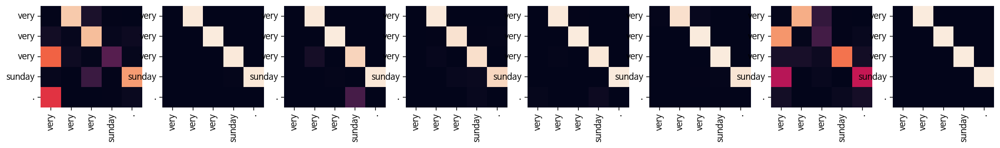

Decoder Self-Attention Layer 2


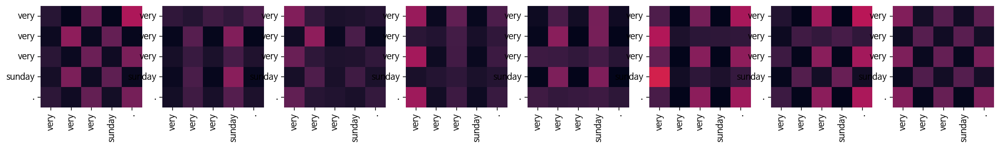

Encoder-Decoder Attention Layer 1


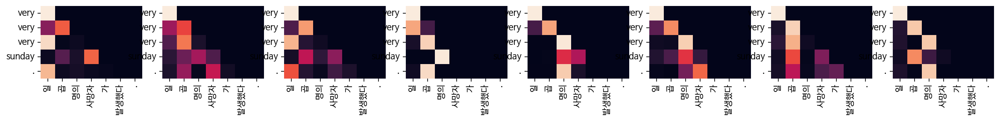

Encoder-Decoder Attention Layer 2


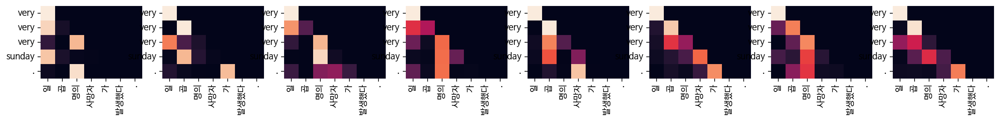


Epoch 10/10


Epoch 10:   0%|          | 0/1080 [00:00<?, ?it/s]

Epoch 10, Loss: 0.2096

### Translations and Visualizations ###
Input: 오바마는 대통령이다.
Predicted translation: obama obama obama obama obama
Encoder Layer 1


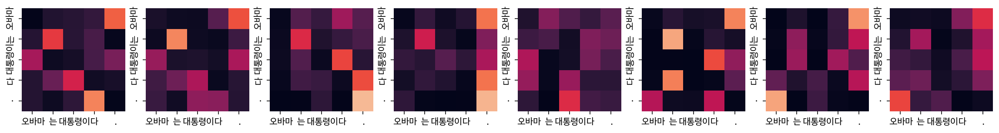

Encoder Layer 2


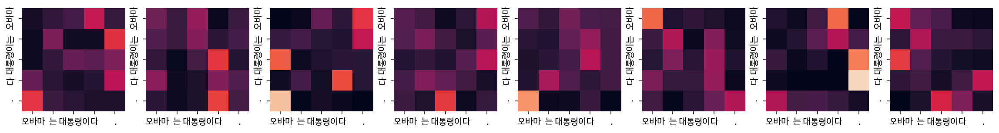

Decoder Self-Attention Layer 1


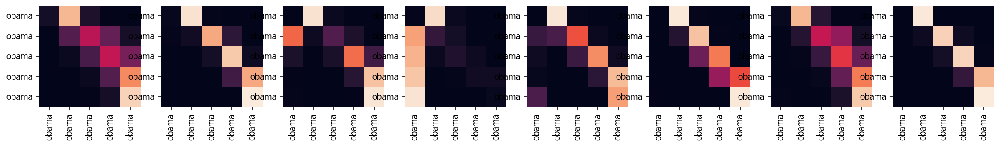

Decoder Self-Attention Layer 2


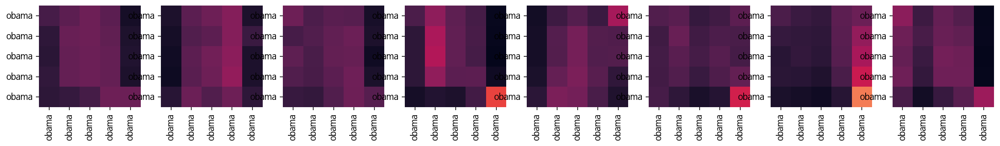

Encoder-Decoder Attention Layer 1


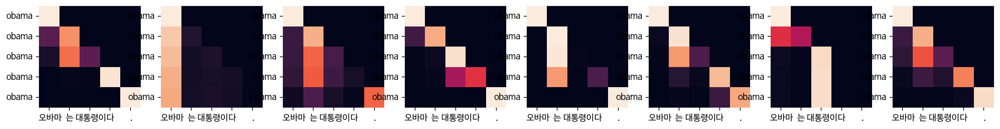

Encoder-Decoder Attention Layer 2


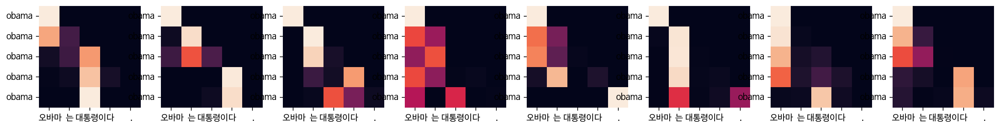

Input: 시민들은 도시 속에 산다.
Predicted translation: it it it it it out it out .
Encoder Layer 1


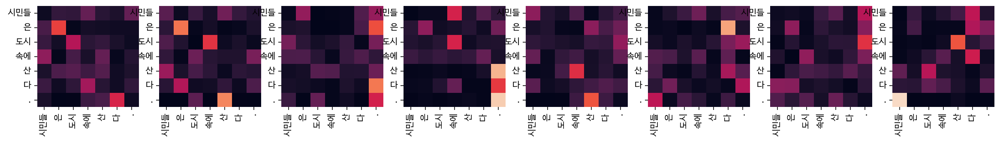

Encoder Layer 2


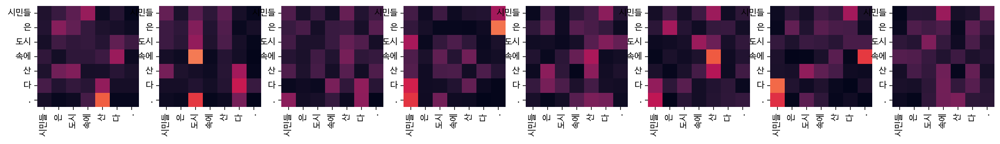

Decoder Self-Attention Layer 1


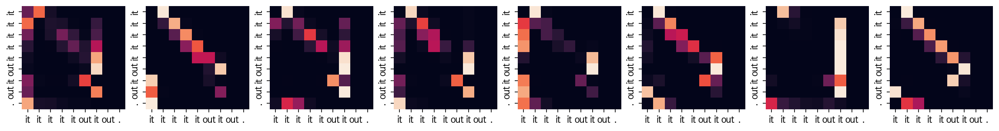

Decoder Self-Attention Layer 2


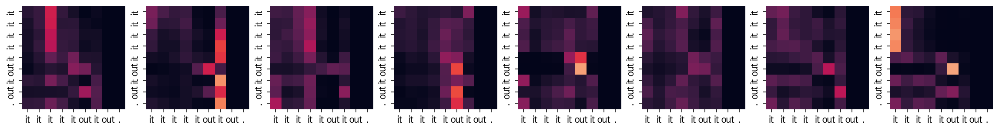

Encoder-Decoder Attention Layer 1


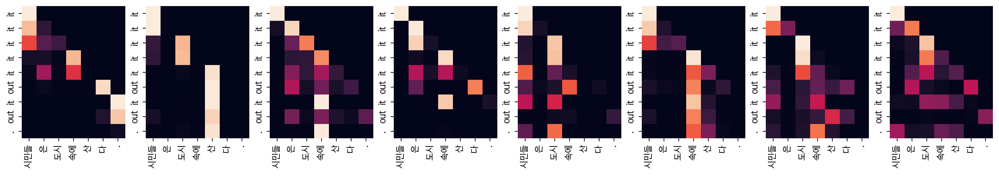

Encoder-Decoder Attention Layer 2


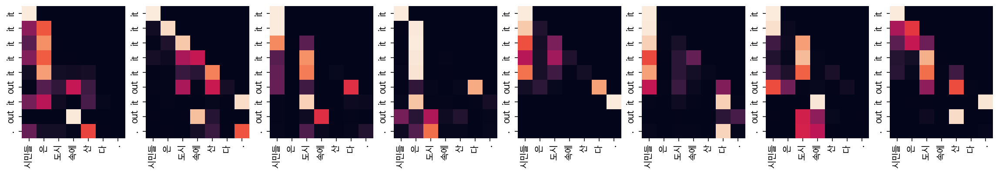

Input: 커피는 필요 없다.
Predicted translation: coffee coffee coffee coffee .
Encoder Layer 1


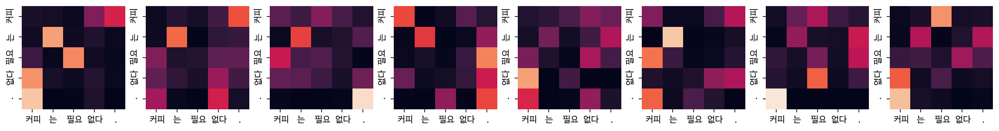

Encoder Layer 2


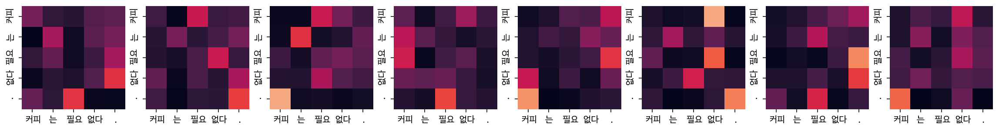

Decoder Self-Attention Layer 1


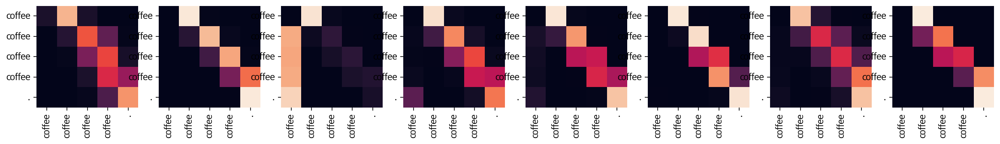

Decoder Self-Attention Layer 2


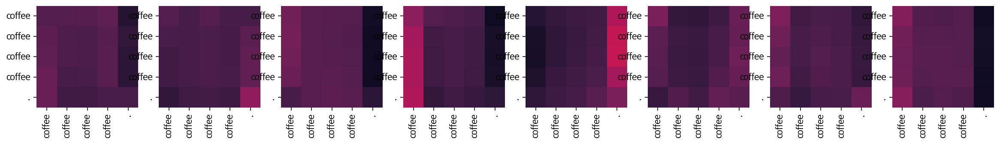

Encoder-Decoder Attention Layer 1


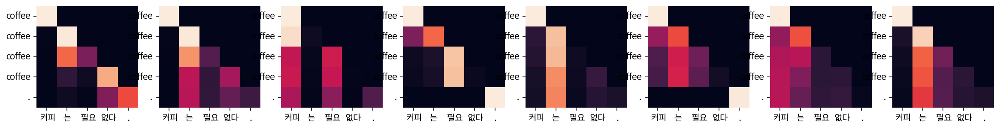

Encoder-Decoder Attention Layer 2


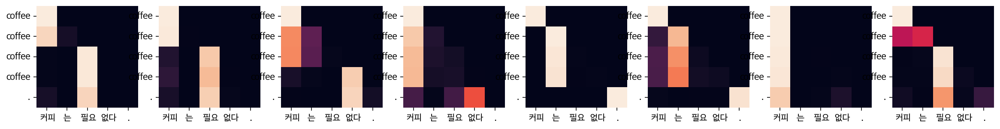

Input: 일곱 명의 사망자가 발생했다.
Predicted translation: dead dead dead dead dead to be reduced .
Encoder Layer 1


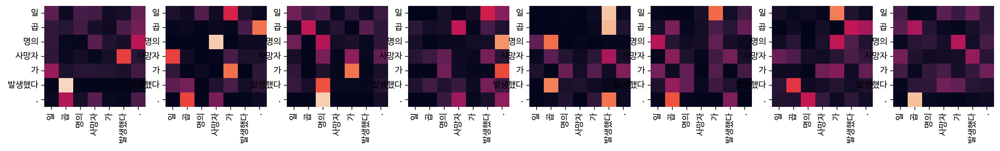

Encoder Layer 2


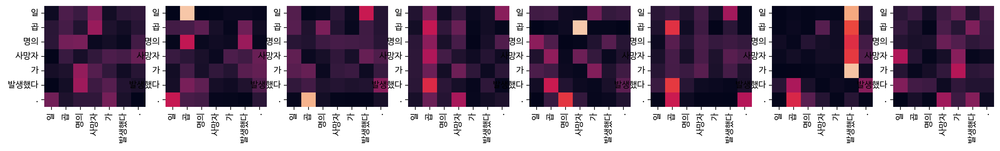

Decoder Self-Attention Layer 1


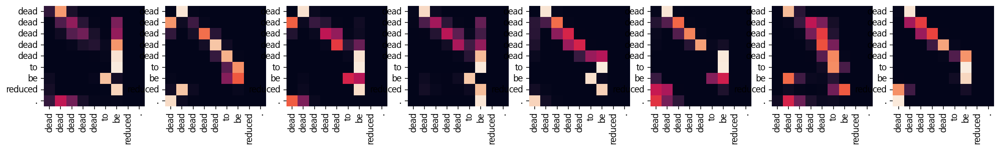

Decoder Self-Attention Layer 2


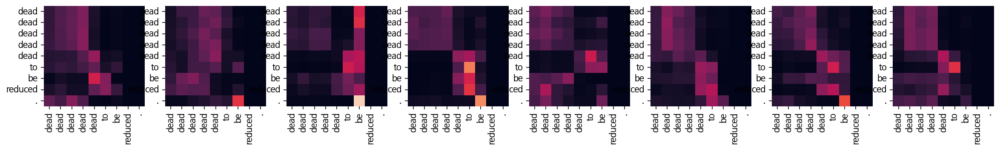

Encoder-Decoder Attention Layer 1


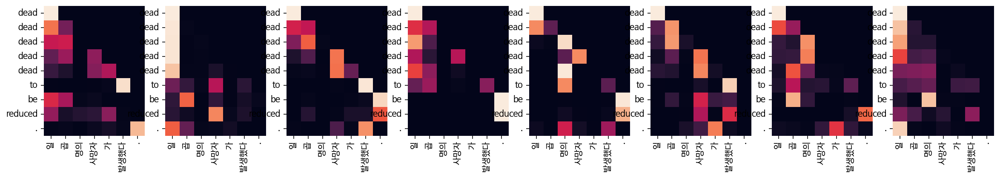

Encoder-Decoder Attention Layer 2


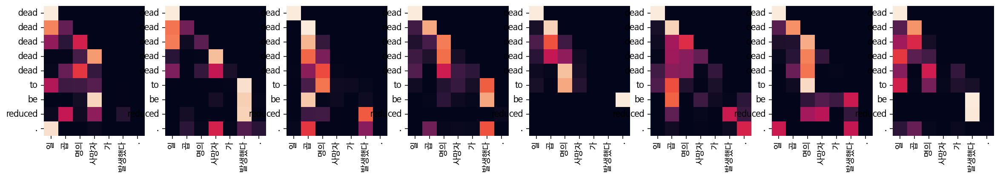

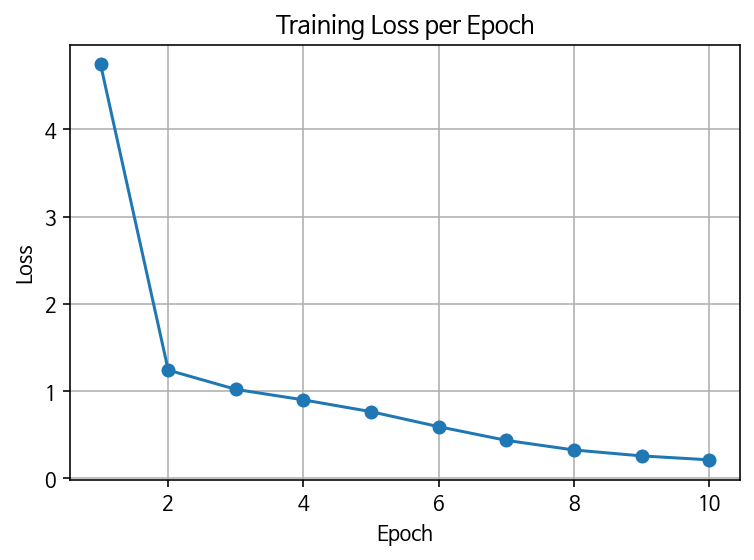

In [34]:
# 학습 

for epoch in range(EPOCHS):
    print(f"\nEpoch {epoch + 1}/{EPOCHS}")
    total_loss = 0

    for batch in tqdm(range(0, len(enc_train), BATCH_SIZE), desc=f"Epoch {epoch + 1}"):
        # 배치 크기로 추출
        src_batch = enc_train[batch:batch + BATCH_SIZE]
        tgt_batch = dec_train[batch:batch + BATCH_SIZE]
        # 배치 당 Loss + 
        batch_loss, _, _, _ = train_step(src_batch, tgt_batch, transformer, optimizer)
        total_loss += batch_loss

    # 에폭 Loss 계산
    epoch_loss = total_loss / (len(enc_train) // BATCH_SIZE)
    losses.append(epoch_loss)

    print(f"Epoch {epoch + 1}, Loss: {epoch_loss:.4f}")

    # 번역 및 Attention 시각화 수행
    print("\n### Translations and Visualizations ###")
    for sentence in sentences:
        pieces, result, enc_attns, dec_attns, enc_dec_attns = evaluate(sentence, transformer, ko_tokenizer, en_tokenizer)
        print(f"Input: {sentence}")
        print(f"Predicted translation: {result}")
        visualize_attention(pieces, result.split(), enc_attns, dec_attns, enc_dec_attns)

# Loss Graph
plt.plot(range(1, EPOCHS + 1), losses, marker='o')
plt.title('Training Loss per Epoch')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.grid()
plt.show()

* loss는 이상할 정도로 잘 떨어진다. 
* 그러나 번역 결과는 이상할 정도로 안 나온다. 
* 5 epoch부터는 obama,president가 나타나고 two, popular 등 숫자와 관련된 맥락이 나타나거나 coffee등 일부 맞는 단어도 나타나긴 한다.
* 그러나, 맥락은 전혀 생성 못하고 있다. epoch이 더욱 진행될수록 loss는 떨어지나 번역 결과는 오히려 처참하다. 
    * 평가지표 자체를 변경해야?
* 동일한 단어를 계속 뱉어내는 것을 없애야한다. matrix를 보는것이 의미가 없을 정도로 동일 단어에 편향된 결과가 나온다 . 
    * 결국, 저런 현상은 확률 분포가 편향되어서 나타나는 현상일 것이다. 
    * 마지막 epoch에서 obama가 5번 연속으로 등장했는데 Encoder-Decoder Attention Layer 2를 보면 각 head들이 학습을 잘하고 있다고 보기는 힘들어보인다. 

### n_layers = 6, Temperature Scaling, Top-K Sampling, Top-P Sampling

In [219]:
# Attention 시각화 함수 layer 당 -> epoch당으로 변경. 6개 층을 전부 보려면 정신 없음
def visualize_attention(src, tgt, enc_attns, dec_attns, enc_dec_attns):
    def draw(data, title):
        plt.figure(figsize=(8, 6))
        sns.heatmap(data, vmin=0.0, vmax=1.0, square=True, cbar=False, xticklabels=src, yticklabels=tgt)
        plt.title(title)
        plt.show()

    # Encoder Self-Attention
    draw(enc_attns[-1][0, 0, :len(src), :len(src)], "Encoder Self-Attention")

    # Decoder Self-Attention
    draw(dec_attns[-1][0, 0, :len(tgt), :len(tgt)], "Decoder Self-Attention")

    # Encoder-Decoder Attention (Src-Attention)
    draw(enc_dec_attns[-1][0, 0, :len(tgt), :len(src)], "Encoder-Decoder Attention")

# evaluate에 적용할 규제기법들
    
# Temperature Scaling
def temperature_scaling(logits, temperature=1.0):
    return logits / temperature

# Top-K Sampling
def top_k_sampling(logits, k=50):
    values, indices = tf.math.top_k(logits, k=k)
    top_k_mask = tf.fill(logits.shape, float('-inf'))
    logits = tf.tensor_scatter_nd_update(top_k_mask, tf.expand_dims(indices, axis=1), values)
    return logits

# Top-P Sampling
def top_p_sampling(logits, p=0.9):
    sorted_logits = tf.sort(logits, direction='DESCENDING')
    cumulative_probs = tf.math.cumsum(tf.nn.softmax(sorted_logits), axis=-1)
    cutoff_index = tf.reduce_sum(tf.cast(cumulative_probs <= p, tf.int32))
    top_p_mask = tf.fill(logits.shape, float('-inf'))
    logits = tf.where(logits >= sorted_logits[cutoff_index], logits, top_p_mask)
    return logits

In [220]:
def evaluate(sentence, model, src_tokenizer, tgt_tokenizer, temperature=1.0, top_k=50, top_p=0.9):
    sentence = preprocess_sentence(sentence)
    pieces = src_tokenizer.encode_as_pieces(sentence)
    tokens = src_tokenizer.encode_as_ids(sentence)

    _input = tf.keras.preprocessing.sequence.pad_sequences([tokens], maxlen=enc_train.shape[-1], padding='post')

    ids = []
    output = tf.expand_dims([tgt_tokenizer.bos_id()], 0)

    for _ in range(dec_train.shape[-1]):
        output_padded = tf.keras.preprocessing.sequence.pad_sequences(output.numpy(), maxlen=dec_train.shape[-1], padding='post')

        enc_padding_mask, combined_mask, dec_padding_mask = generate_masks(_input, output_padded)

        predictions, enc_attns, dec_attns, enc_dec_attns = model(
            _input,
            output_padded,
            enc_padding_mask,
            combined_mask,
            dec_padding_mask
        )

        # Temperature scaling 적영 
        logits = predictions[0, len(ids), :] / temperature

        # Top-K &  Top-P 적용
        if top_k:
            logits = top_k_sampling(logits, k=top_k)
        if top_p:
            logits = top_p_sampling(logits, p=top_p)

        predicted_id = tf.argmax(tf.nn.softmax(logits)).numpy().item()

        if predicted_id == tgt_tokenizer.eos_id():
            result = tgt_tokenizer.decode_ids(ids)
            return pieces, result, enc_attns, dec_attns, enc_dec_attns

        ids.append(int(predicted_id)) 
        output = tf.concat([output, tf.expand_dims([predicted_id], 0)], axis=-1)

    result = tgt_tokenizer.decode_ids(ids)
    return pieces, result, enc_attns, dec_attns, enc_dec_attns

In [223]:
# 학습 
losses = []
EPOCHS = 10
n_layers = 6 # 변경사항 

# Transformer 모델 초기화
transformer = Transformer(
    n_layers=n_layers,
    d_model=d_model,
    n_heads=n_heads,
    d_ff=d_ff,
    src_vocab_size=ko_tokenizer.get_piece_size(),
    tgt_vocab_size=en_tokenizer.get_piece_size(),
    pos_len=enc_train.shape[1],
    dropout=dropout
)

# 에러나서 모델 가중치 초기화
dummy_enc_in = tf.zeros((BATCH_SIZE, enc_train.shape[1]))
dummy_dec_in = tf.zeros((BATCH_SIZE, dec_train.shape[1]))
dummy_enc_mask, dummy_enc_dec_mask, dummy_dec_mask = generate_masks(dummy_enc_in, dummy_dec_in)
_ = transformer(dummy_enc_in, dummy_dec_in, dummy_enc_mask, dummy_enc_dec_mask, dummy_dec_mask)

# Optimizer 재정의(초기화 )
optimizer = tf.keras.optimizers.Adam(
    learning_rate=learning_rate, beta_1=0.9, beta_2=0.98, epsilon=1e-9
)

# 에러나서 train_step도 재정의 
@tf.function
def train_step(src, tgt, model, optimizer):
    gold = tgt[:, 1:]  # 실제 정답 (Shifted Right)
    enc_mask, dec_mask, enc_dec_mask = generate_masks(src, tgt)

    with tf.GradientTape() as tape:
        predictions, enc_attns, dec_attns, enc_dec_attns = model(
            src, tgt, enc_mask, dec_mask, enc_dec_mask
        )
        loss = loss_function(gold, predictions[:, :-1])

    gradients = tape.gradient(loss, model.trainable_variables)
    optimizer.apply_gradients(zip(gradients, model.trainable_variables))

    return loss, enc_attns, dec_attns, enc_dec_attns


Epoch 1/10


Epoch 1:   0%|          | 0/1080 [00:00<?, ?it/s]

Epoch 1, Loss: 4.6712

### Translations and Visualizations ###
Input: 오바마는 대통령이다.
Predicted translation: po


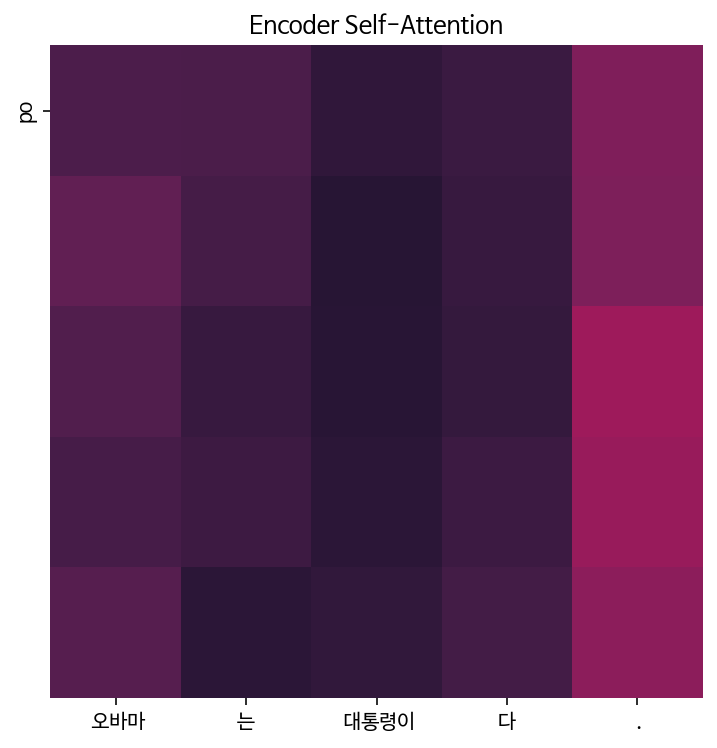

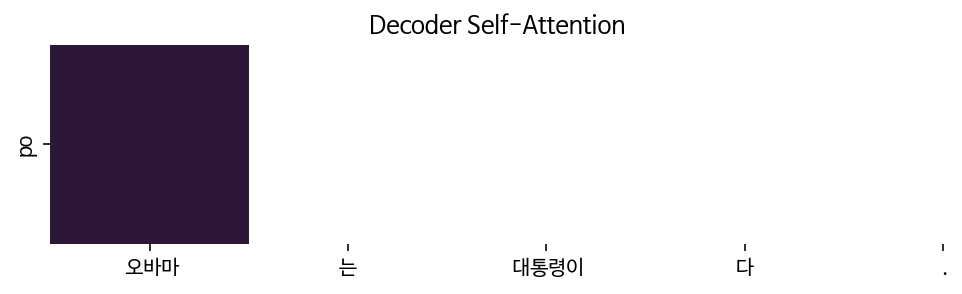

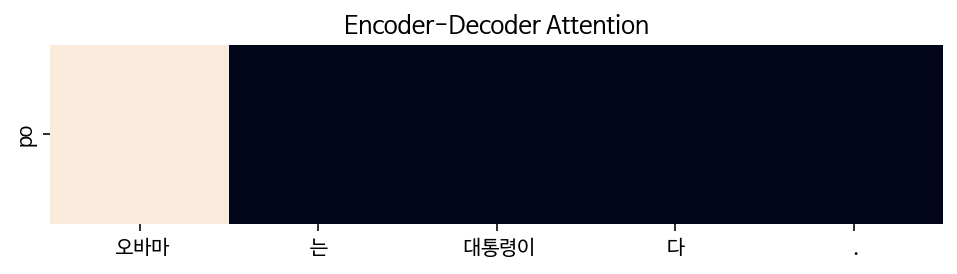

Input: 시민들은 도시 속에 산다.
Predicted translation: id


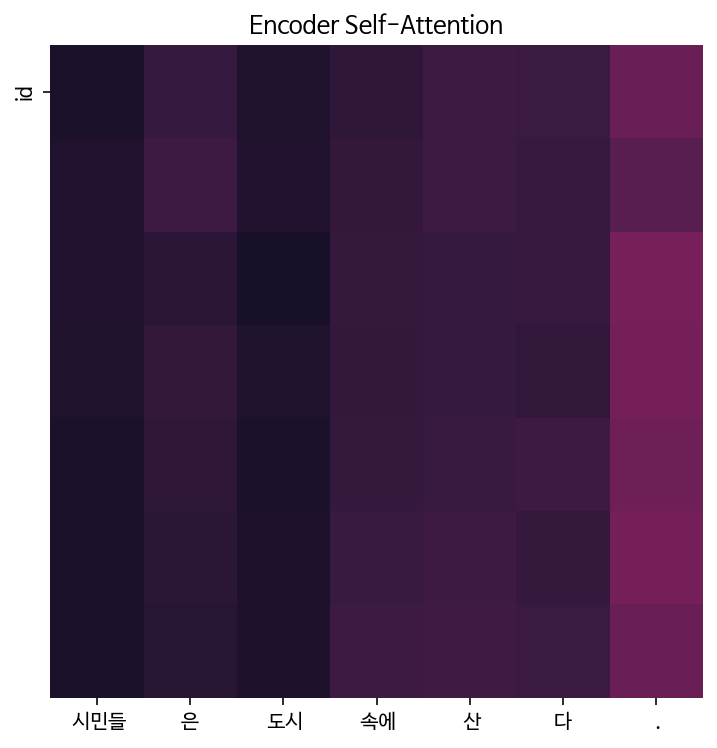

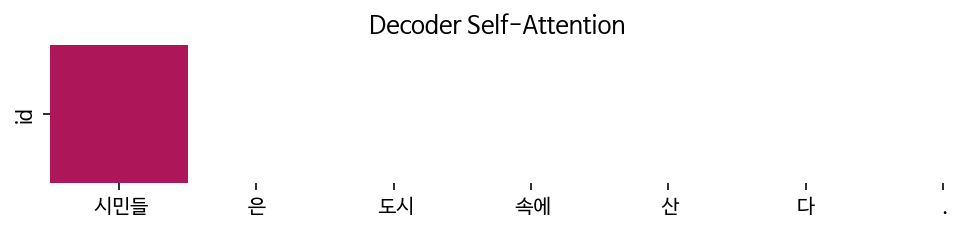

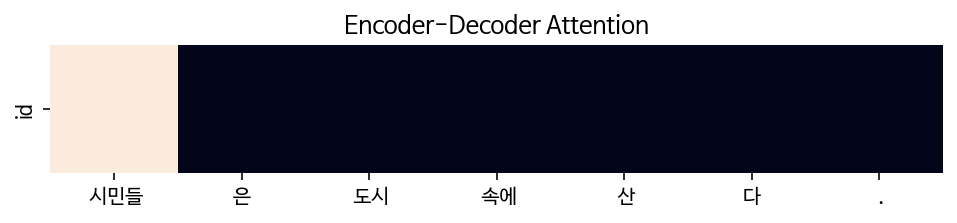

Input: 커피는 필요 없다.
Predicted translation: id


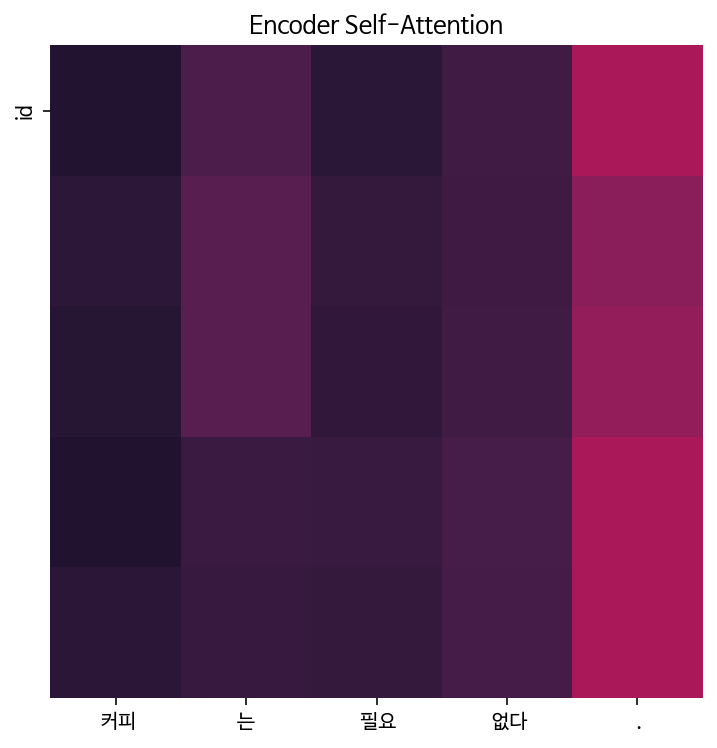

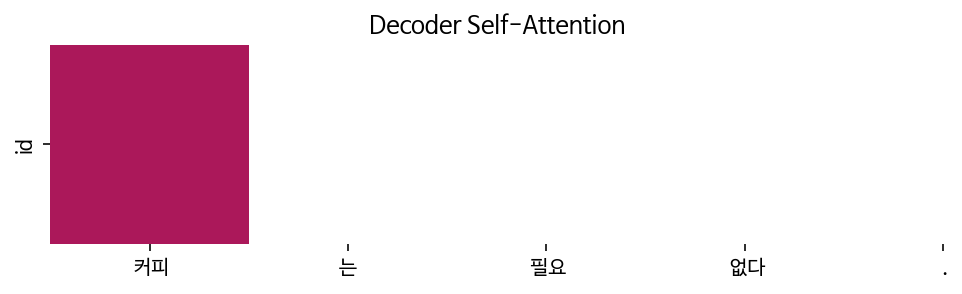

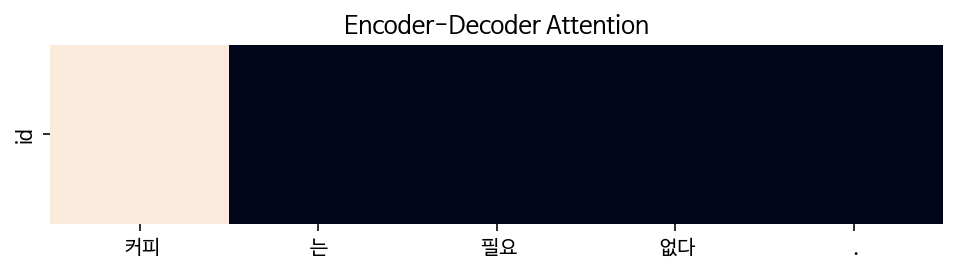

Input: 일곱 명의 사망자가 발생했다.
Predicted translation: 


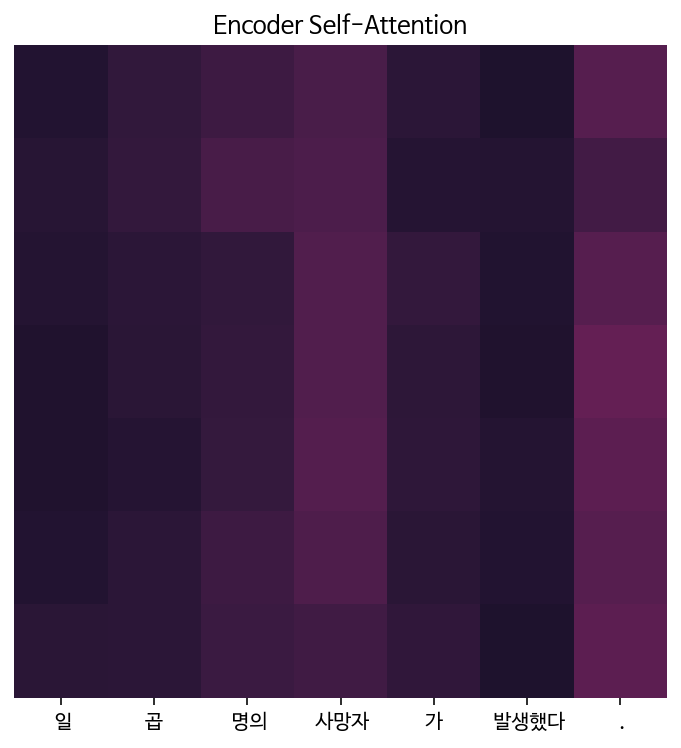

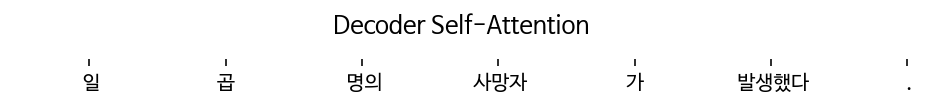

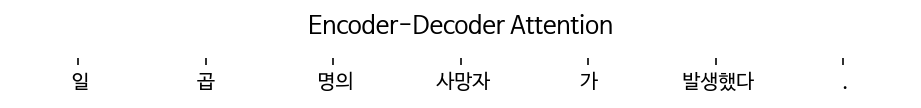


Epoch 2/10


Epoch 2:   0%|          | 0/1080 [00:00<?, ?it/s]

Epoch 2, Loss: 1.2426

### Translations and Visualizations ###
Input: 오바마는 대통령이다.
Predicted translation: superdelegate superdelegate superdelegate superdelegate .


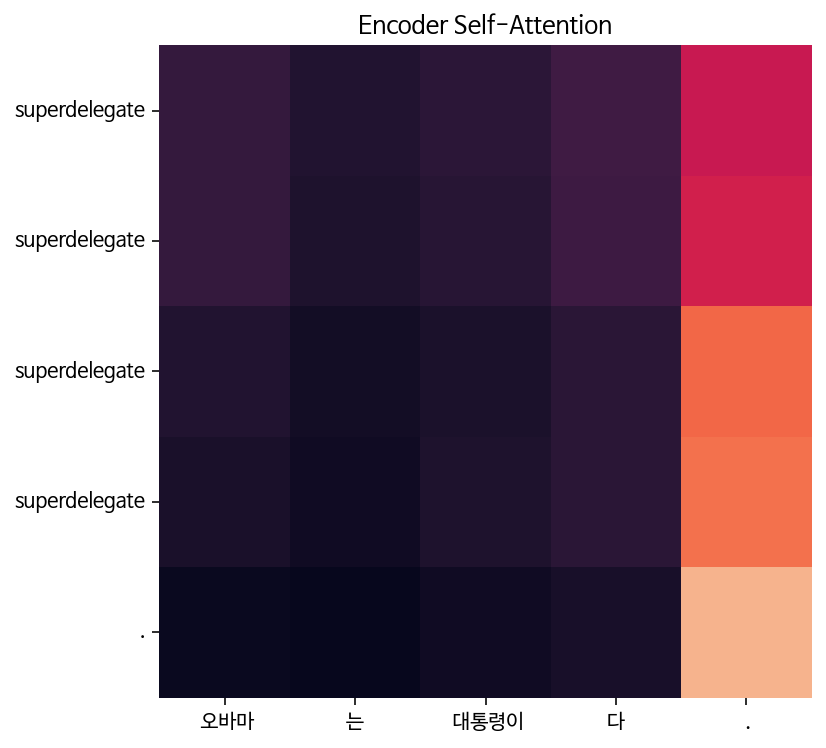

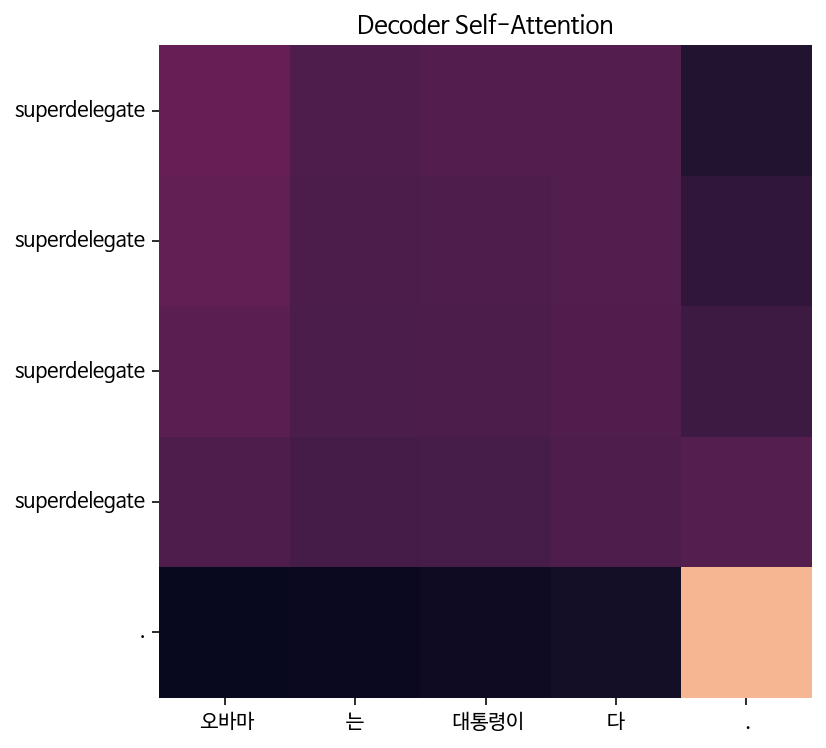

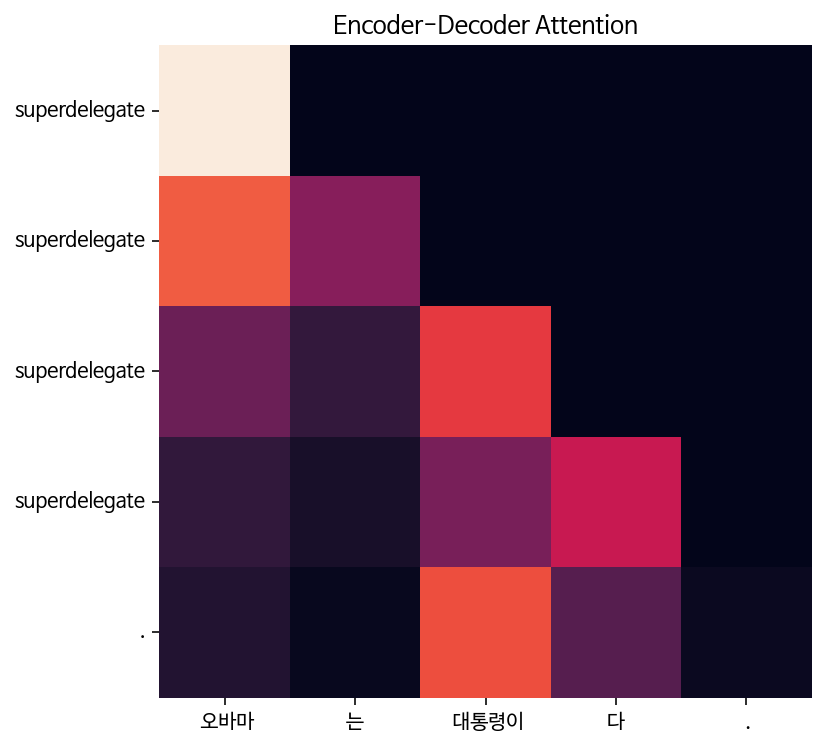

Input: 시민들은 도시 속에 산다.
Predicted translation: miles miles miles miles .


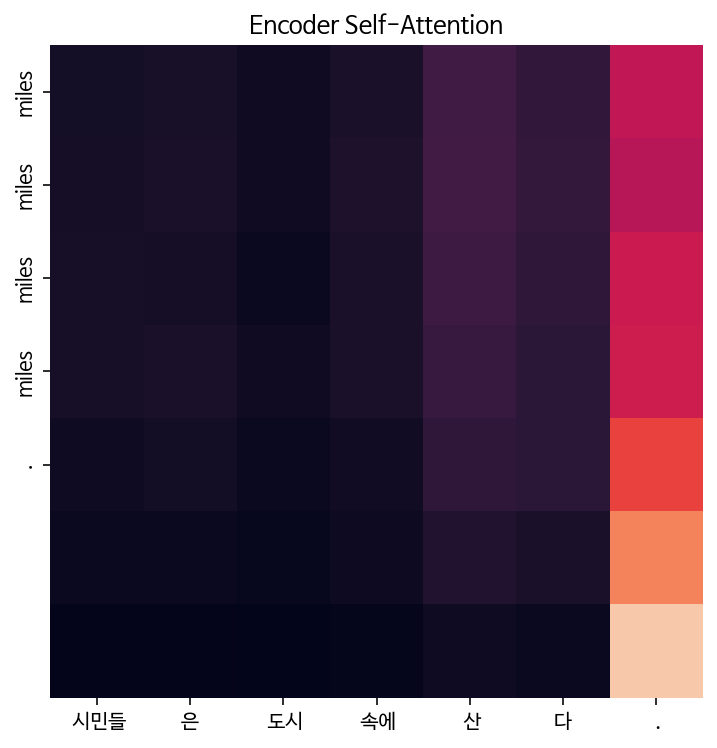

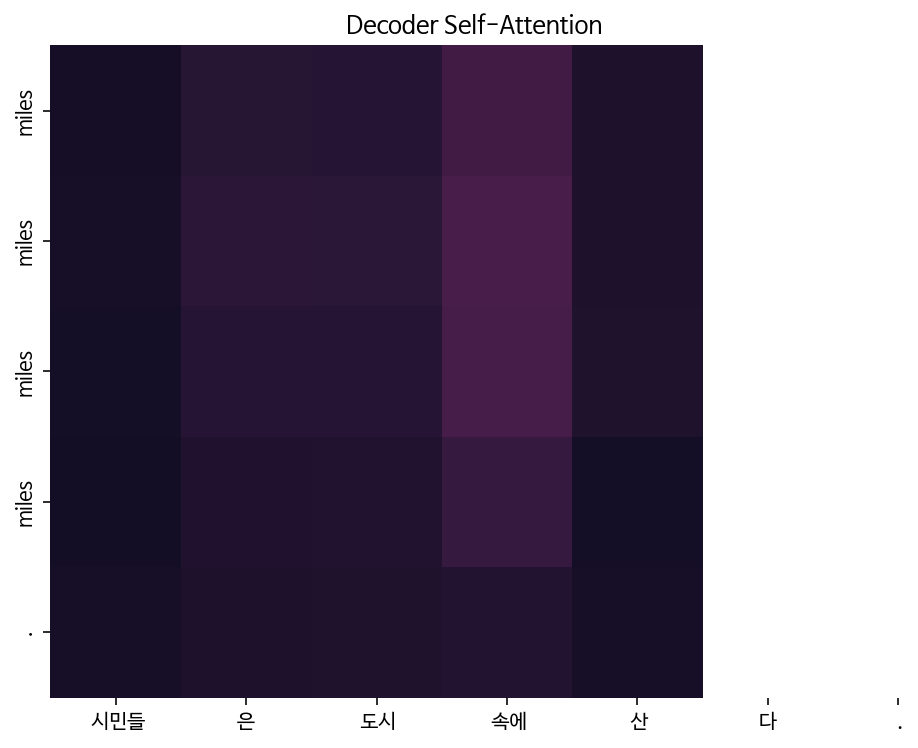

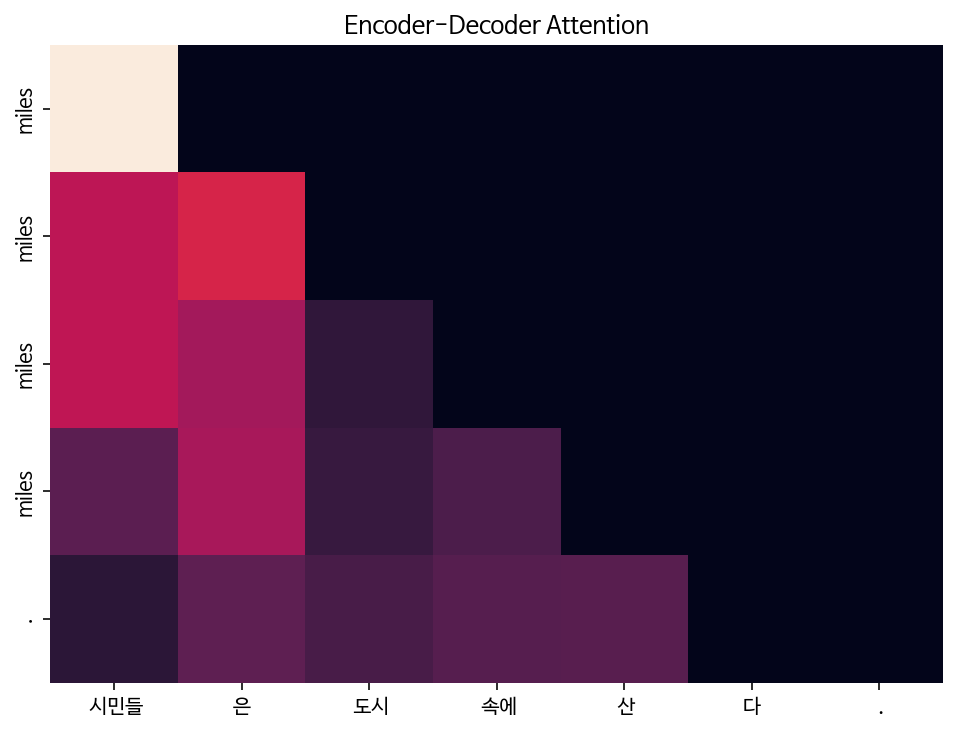

Input: 커피는 필요 없다.
Predicted translation: it it it it .


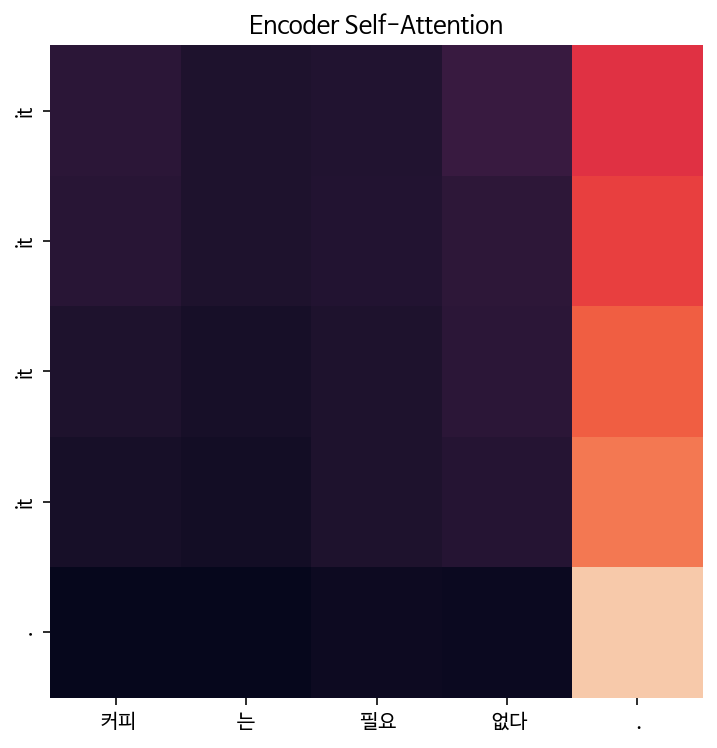

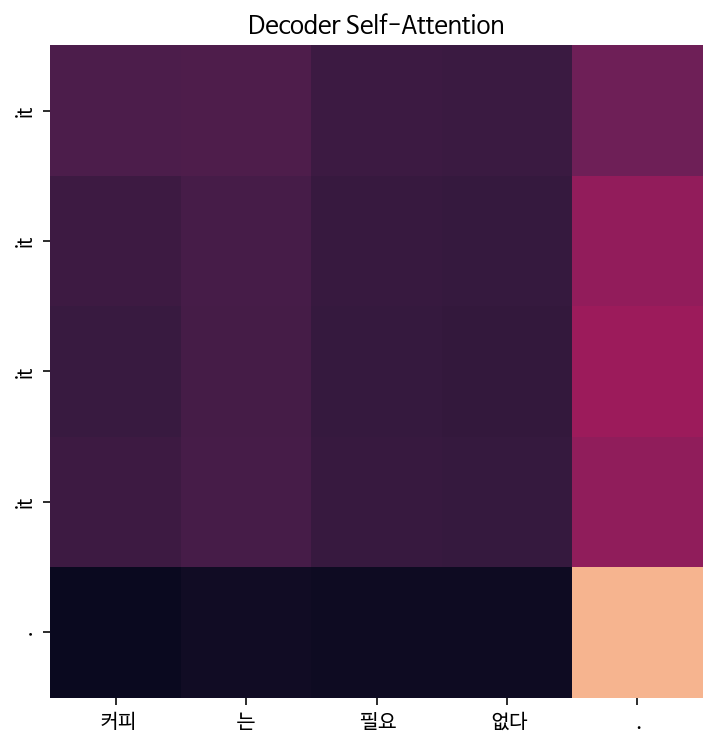

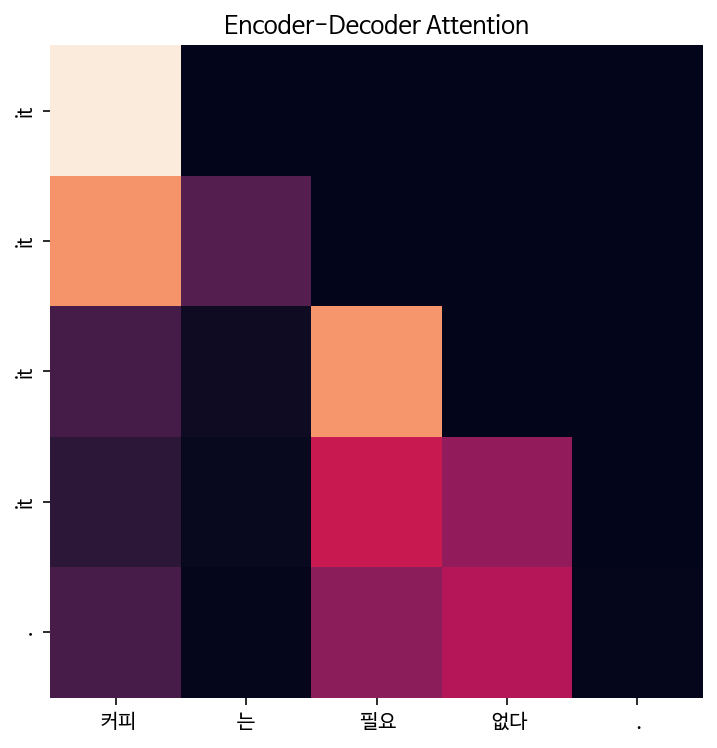

Input: 일곱 명의 사망자가 발생했다.
Predicted translation: five five five five five four four , and were rescued .


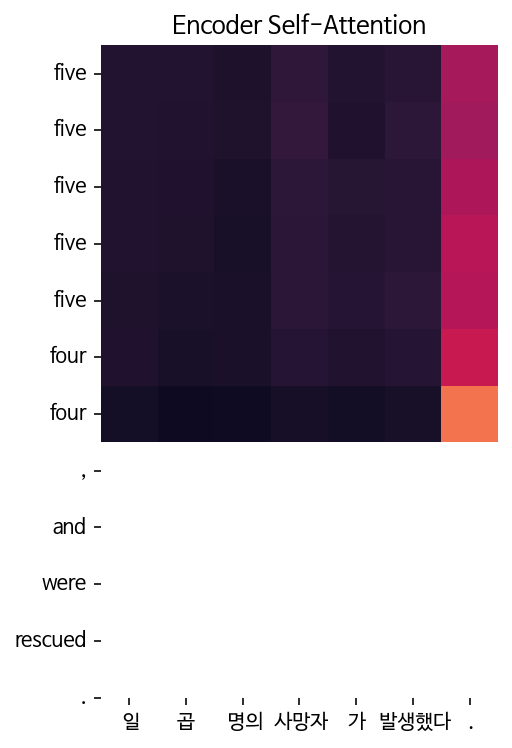

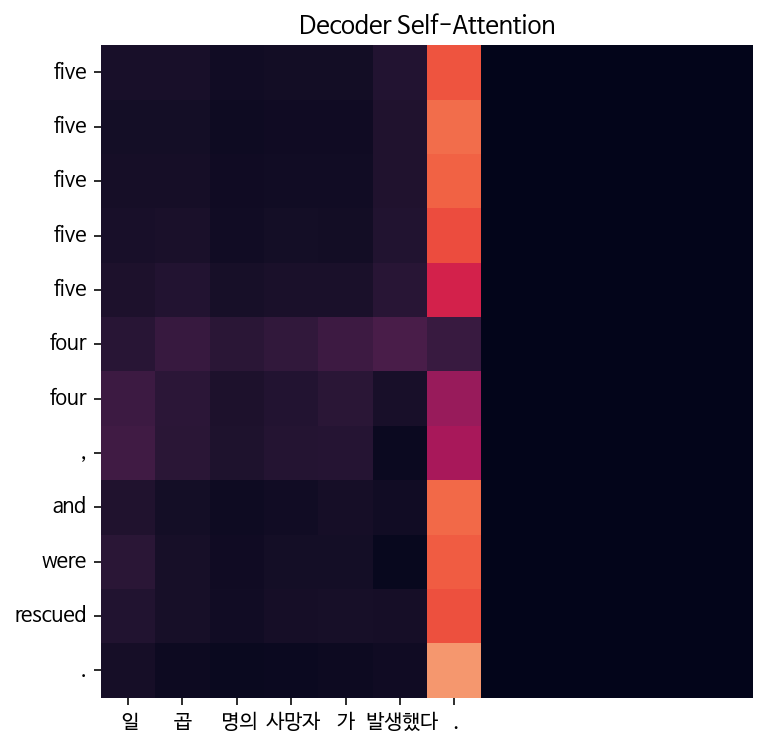

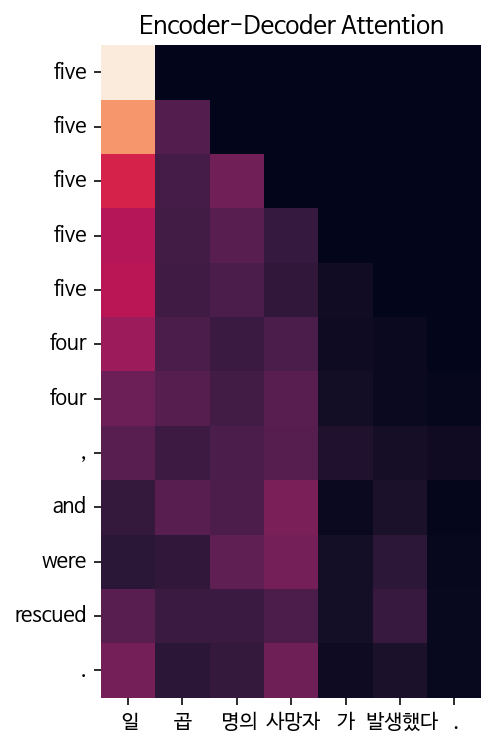


Epoch 3/10


Epoch 3:   0%|          | 0/1080 [00:00<?, ?it/s]

Epoch 3, Loss: 1.0410

### Translations and Visualizations ###
Input: 오바마는 대통령이다.
Predicted translation: i i i i i .


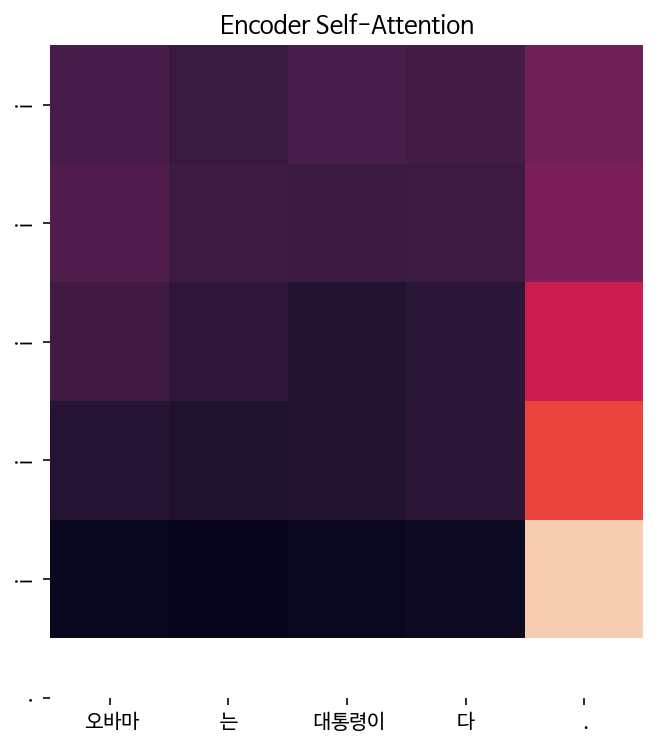

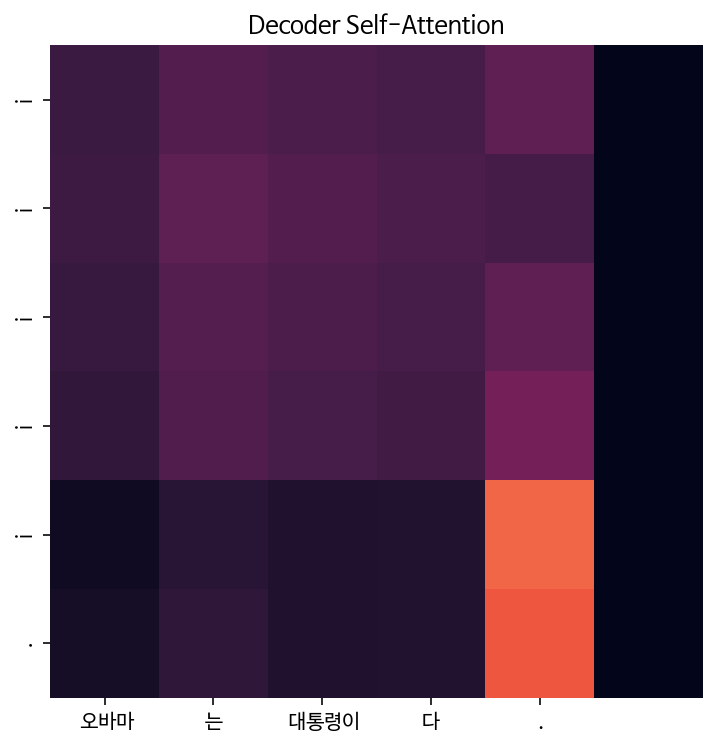

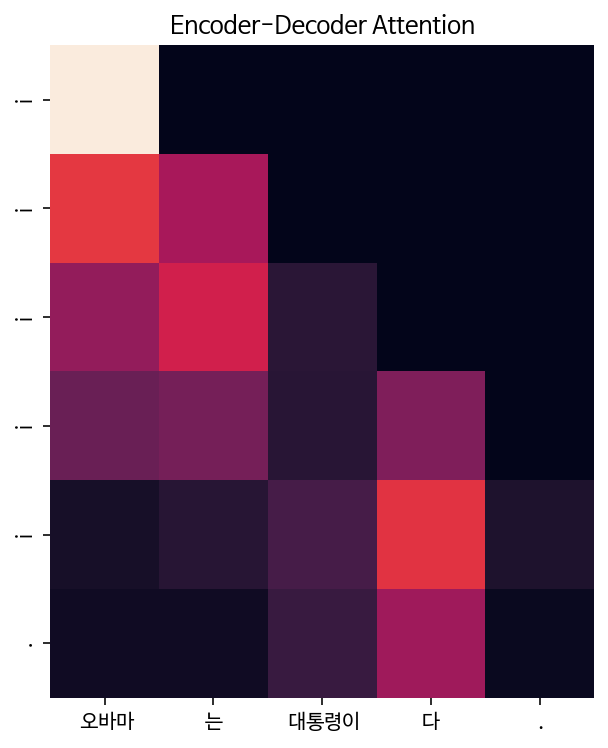

Input: 시민들은 도시 속에 산다.
Predicted translation: green green green green cars .


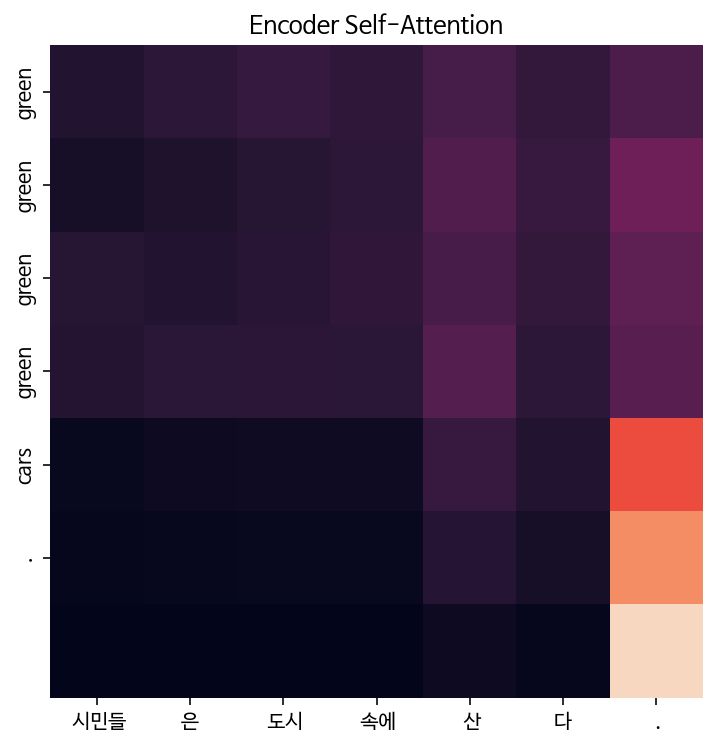

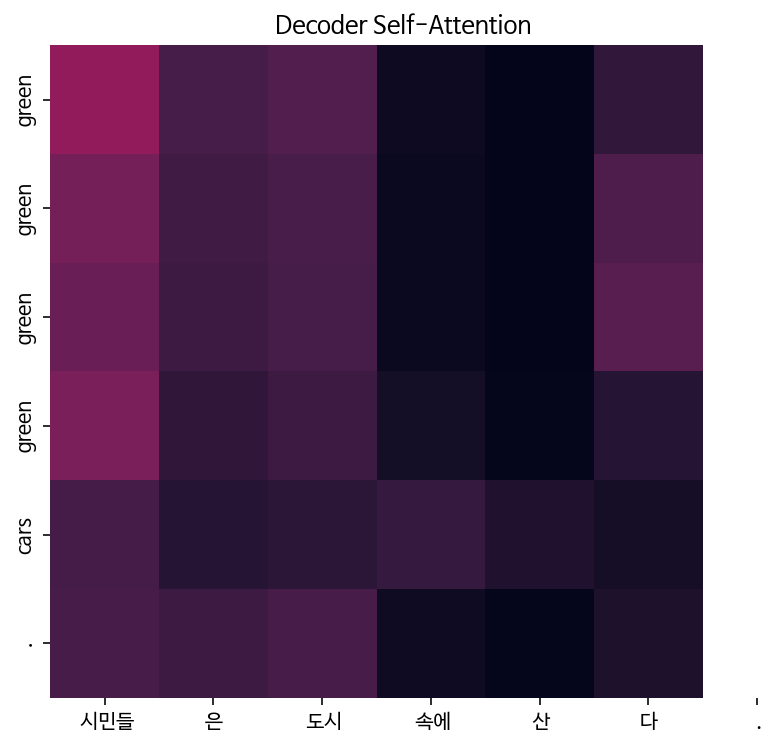

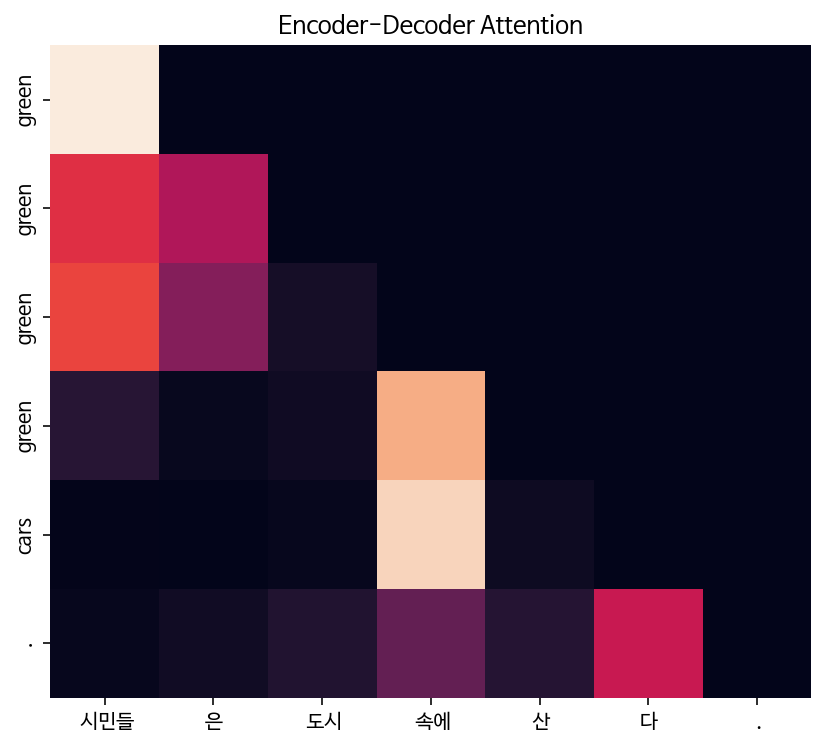

Input: 커피는 필요 없다.
Predicted translation: coffee coffee coffee coffee


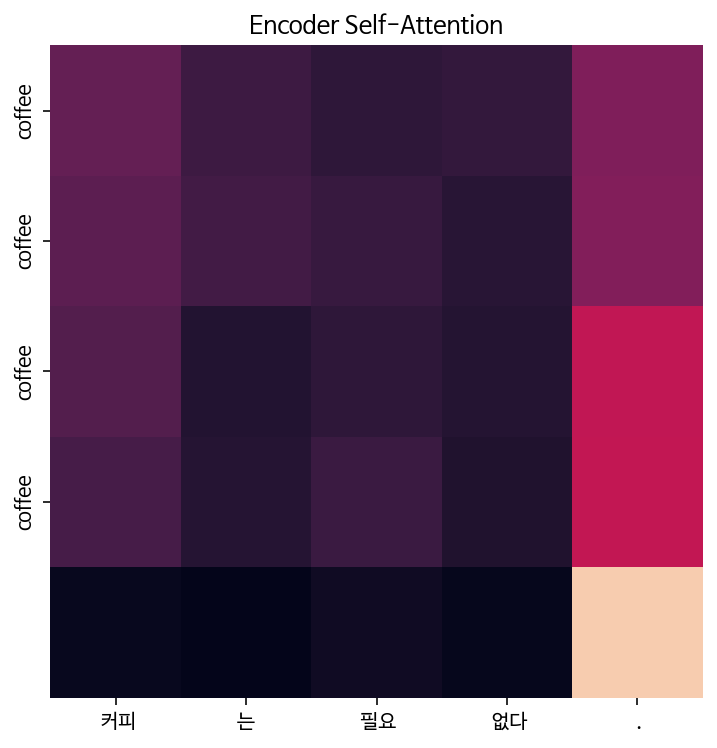

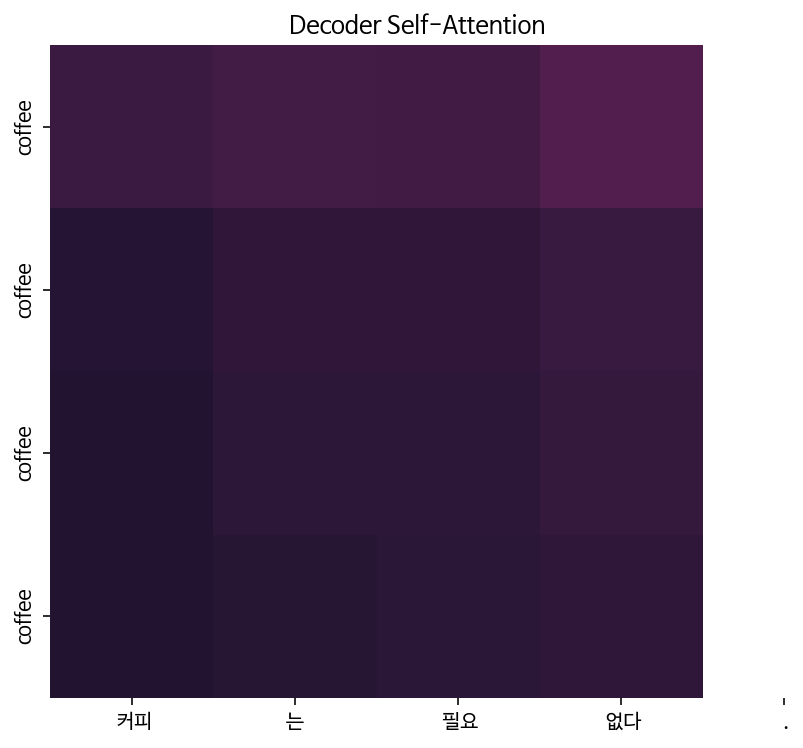

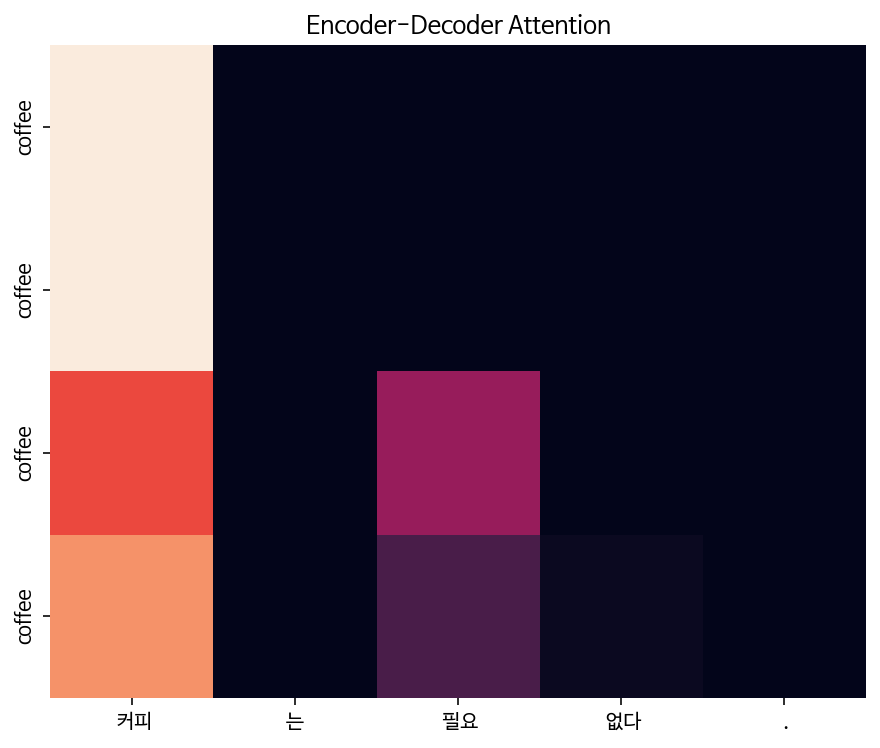

Input: 일곱 명의 사망자가 발생했다.
Predicted translation: i i i i iself , and be , and be , and , and be , and , and , and , and , and has , and , and , and , and , and , and , and , and , and , and .


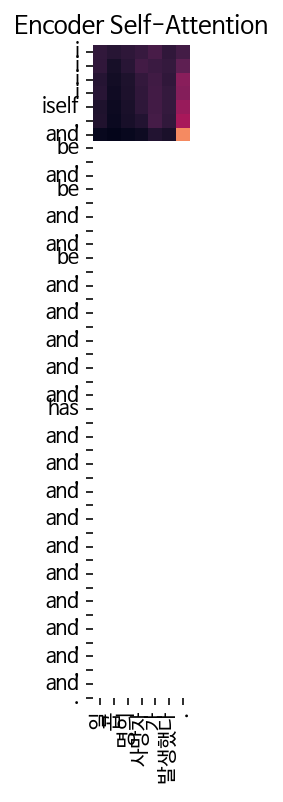

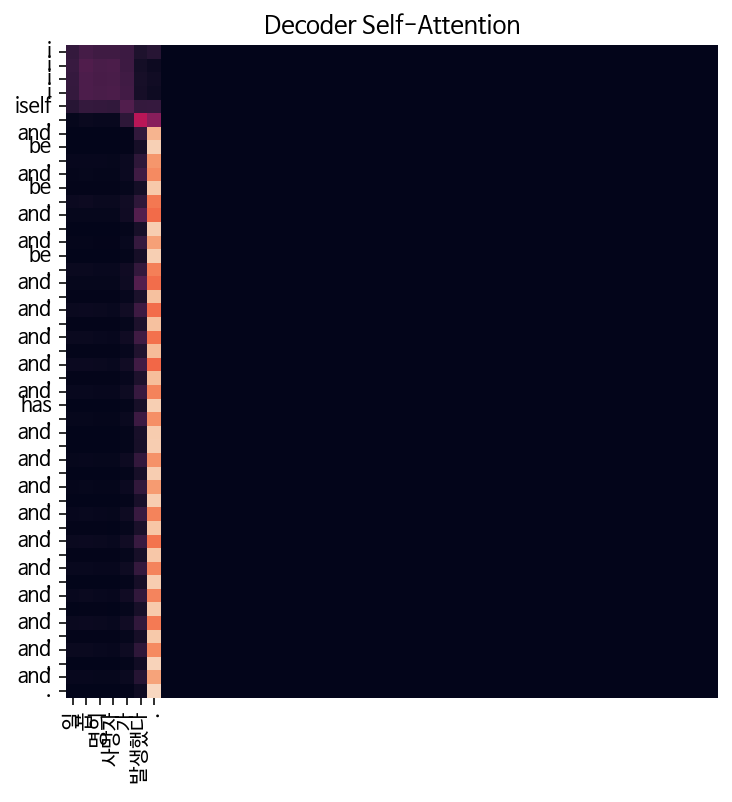

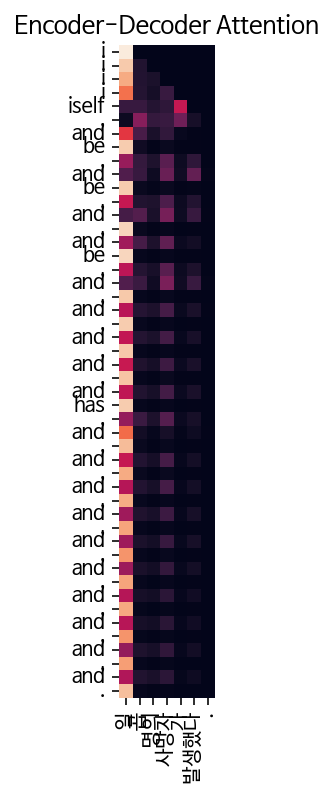


Epoch 4/10


Epoch 4:   0%|          | 0/1080 [00:00<?, ?it/s]

Epoch 4, Loss: 0.9450

### Translations and Visualizations ###
Input: 오바마는 대통령이다.
Predicted translation: pennsylvania pennsylvania pennsylvania pennsylvania debate


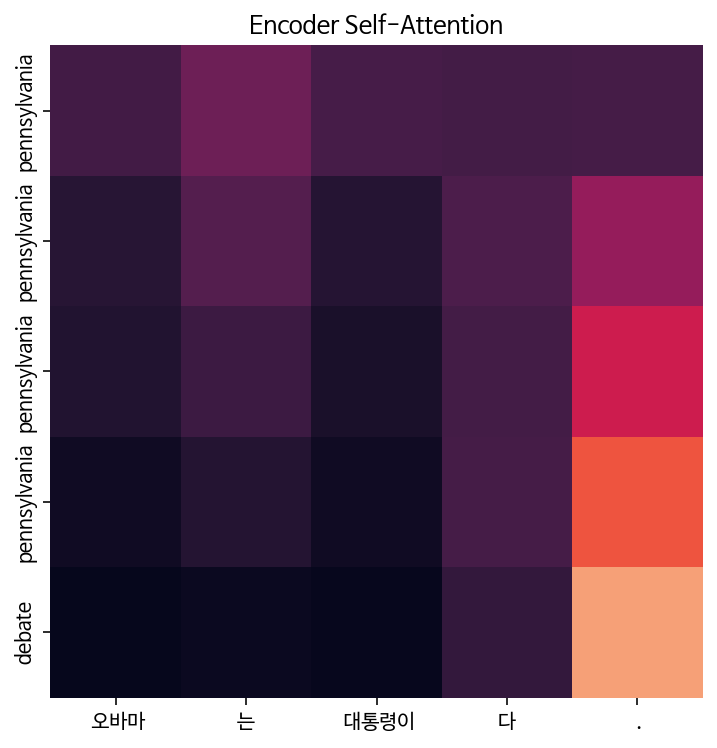

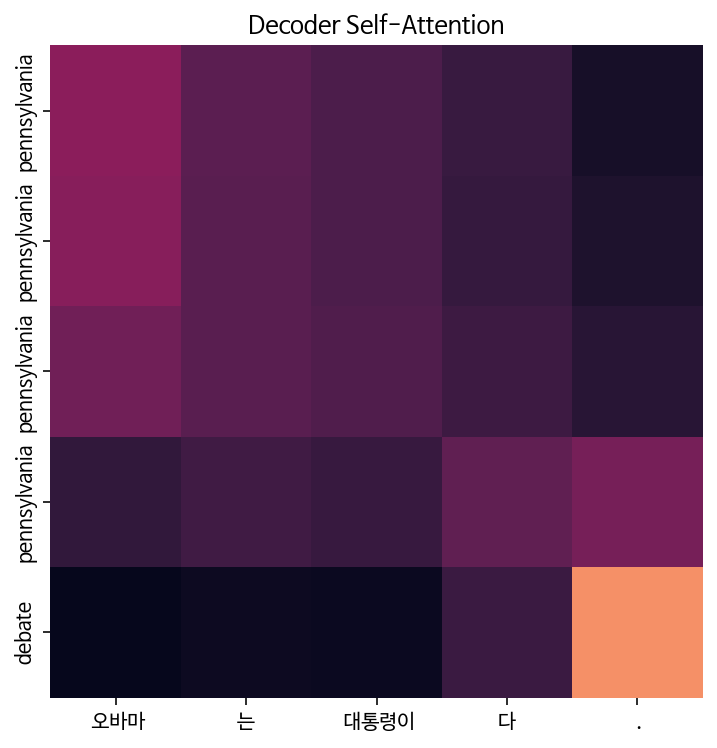

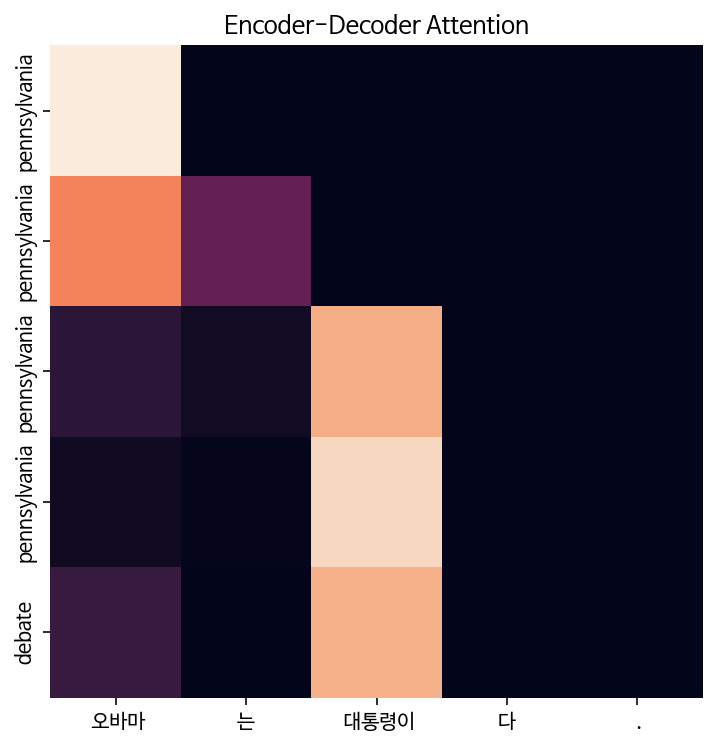

Input: 시민들은 도시 속에 산다.
Predicted translation: hundred hundred hundred hundred due to began in which has been published in which has beengan in which has beengan in which has been published in which has been published in which has beengan in which has been published in pennsylvania .


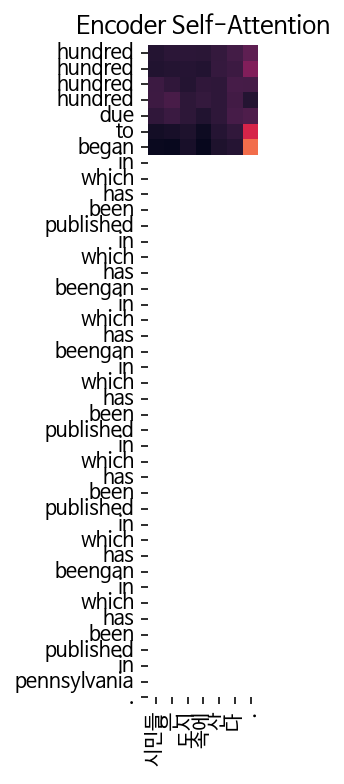

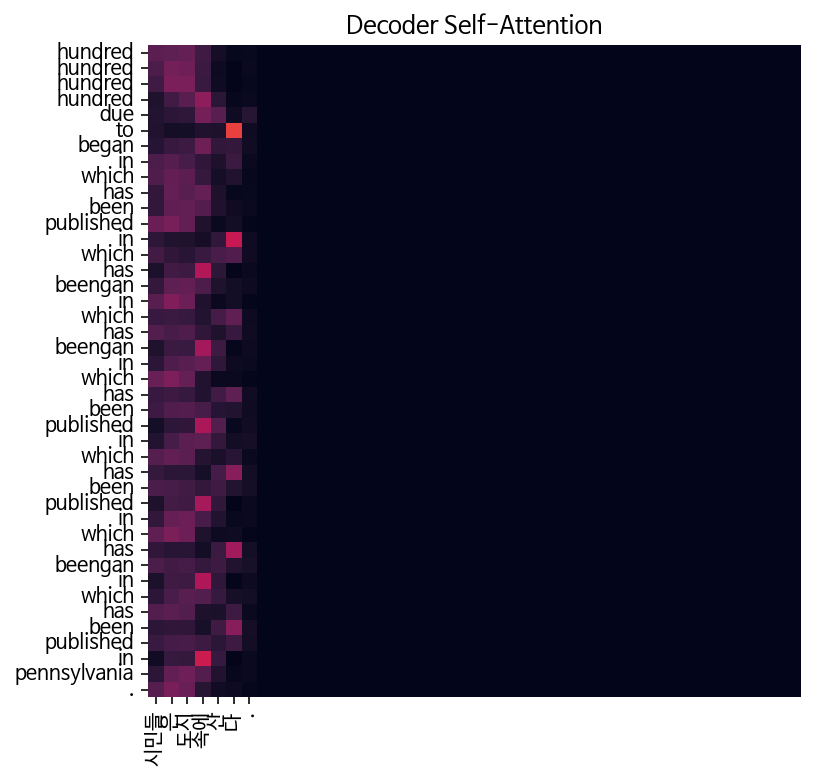

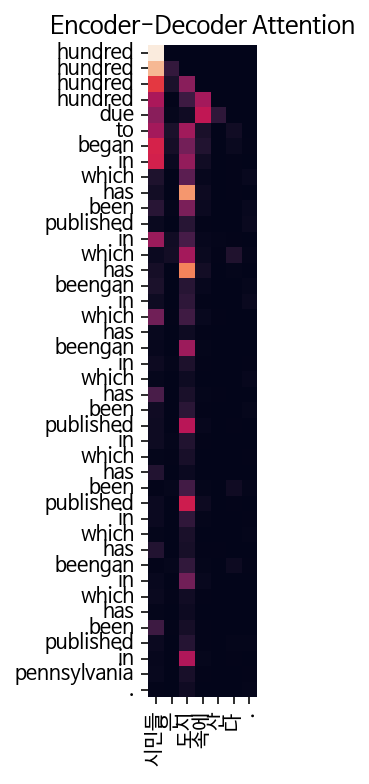

Input: 커피는 필요 없다.
Predicted translation: coffee coffee coffee coffee coffee coffee


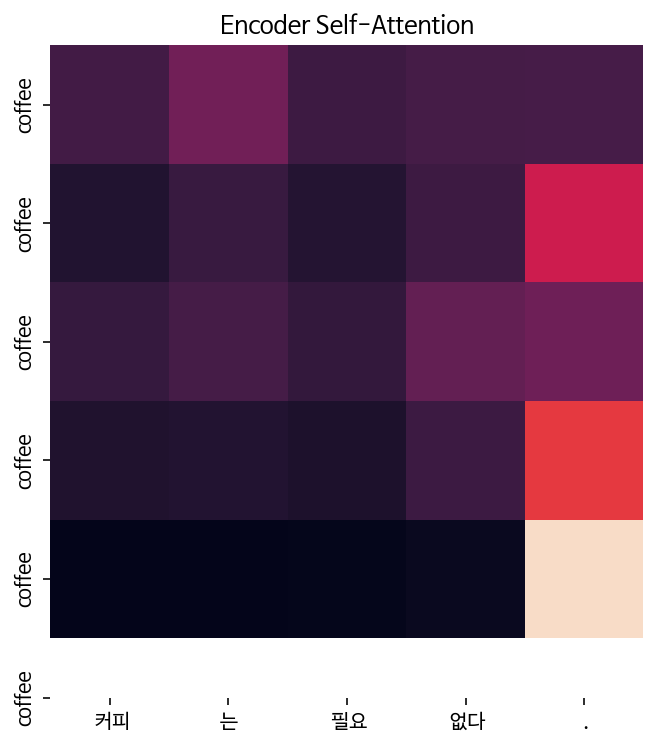

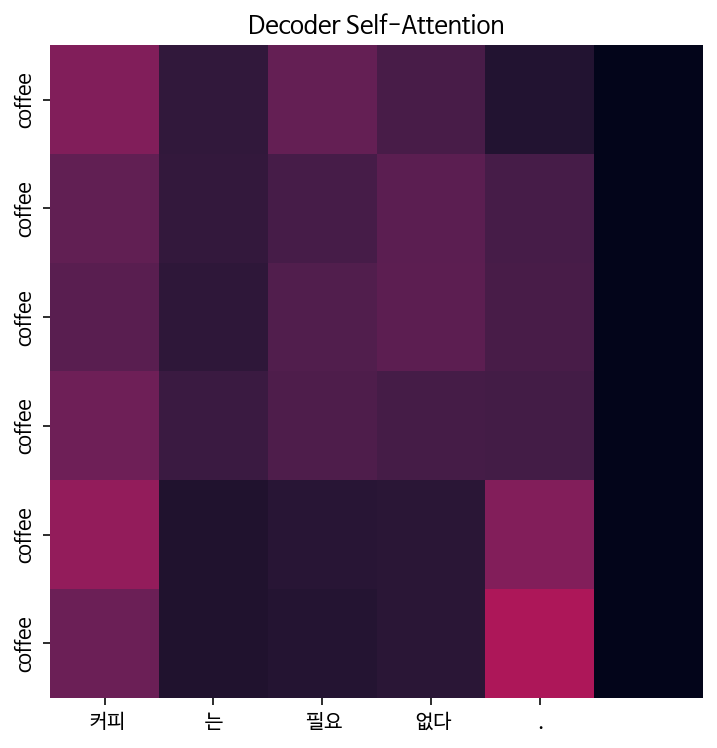

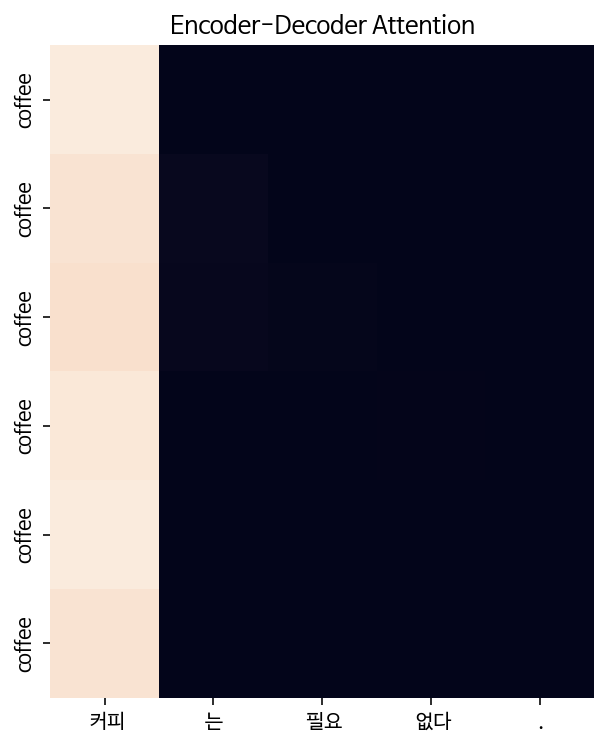

Input: 일곱 명의 사망자가 발생했다.
Predicted translation: turn turn turn turn downtown san francisco


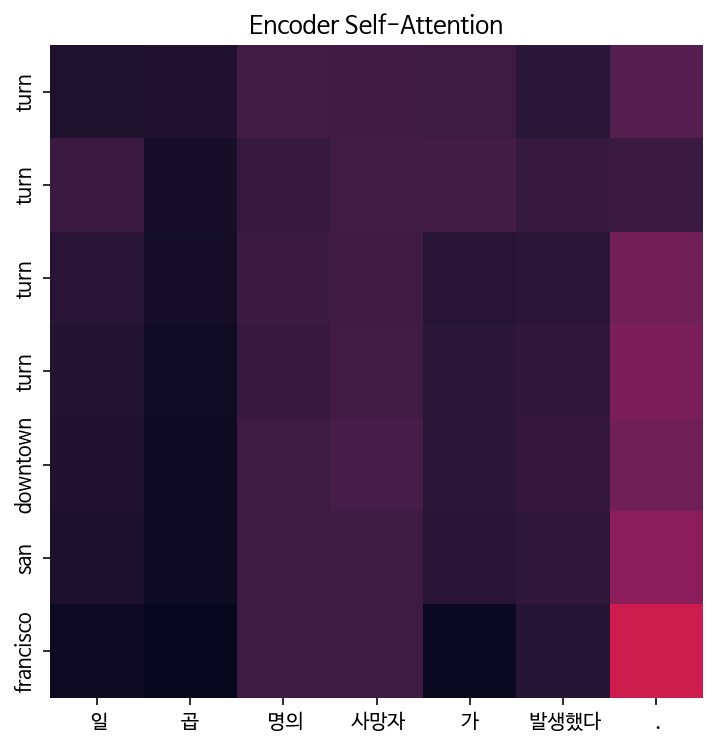

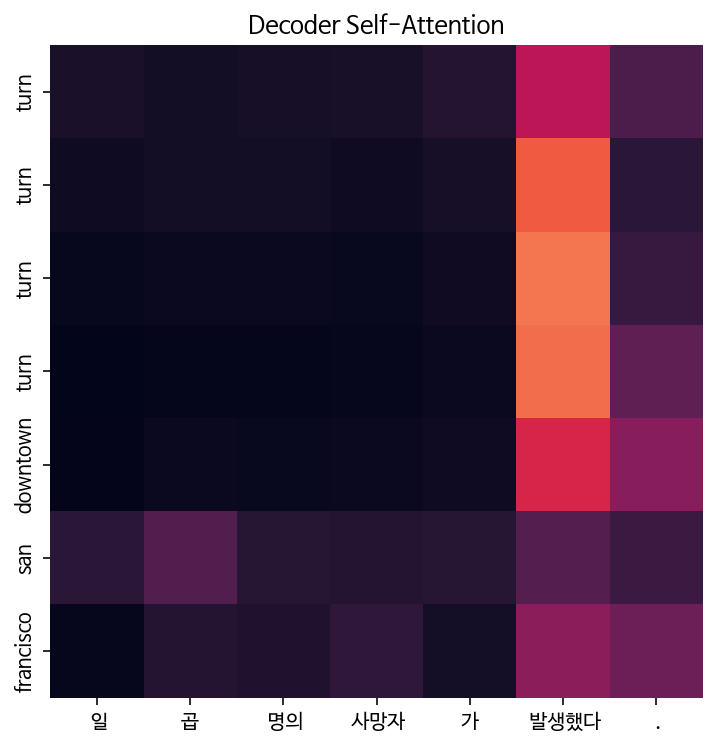

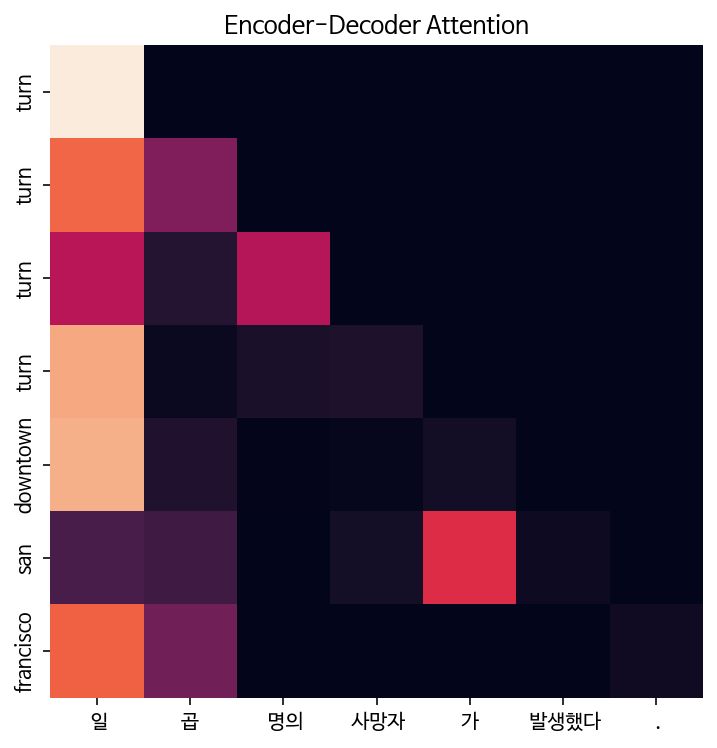


Epoch 5/10


Epoch 5:   0%|          | 0/1080 [00:00<?, ?it/s]

Epoch 5, Loss: 0.8272

### Translations and Visualizations ###
Input: 오바마는 대통령이다.
Predicted translation: grand grand grand grand national party


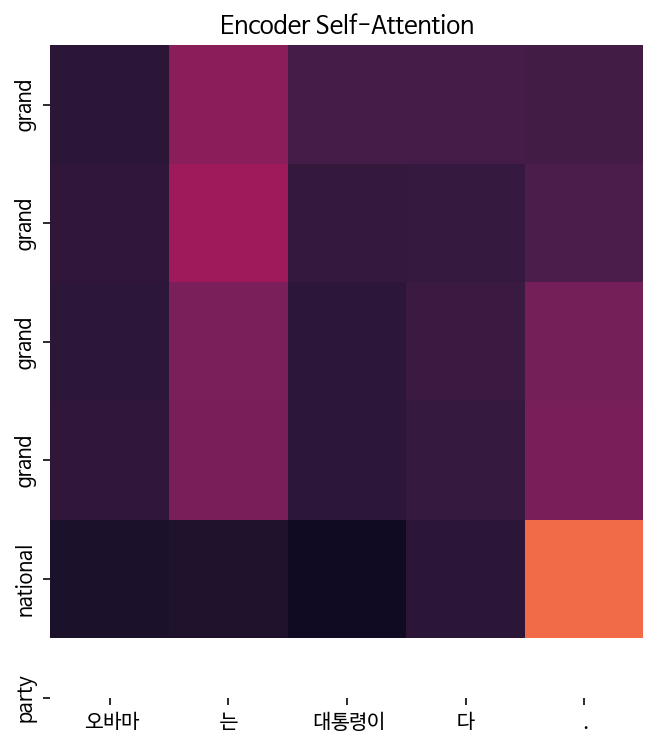

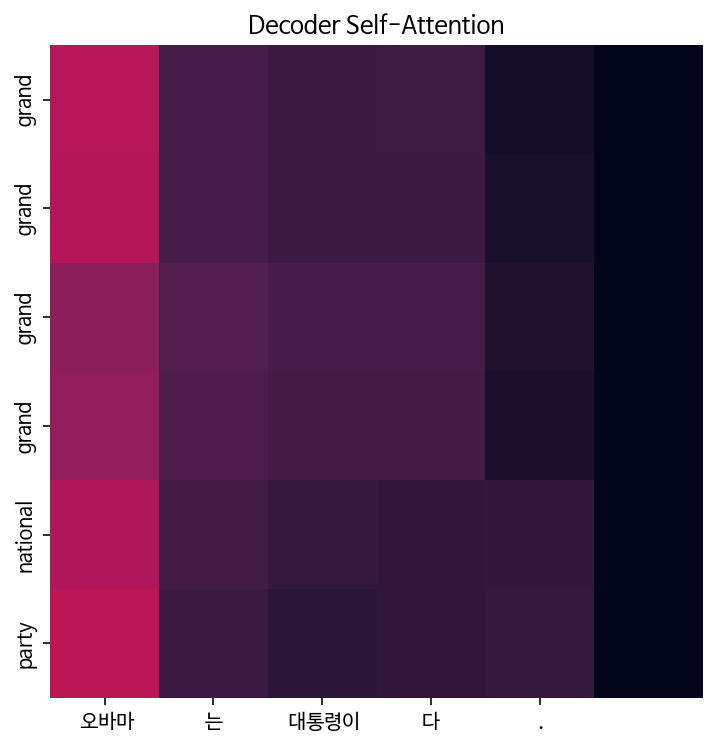

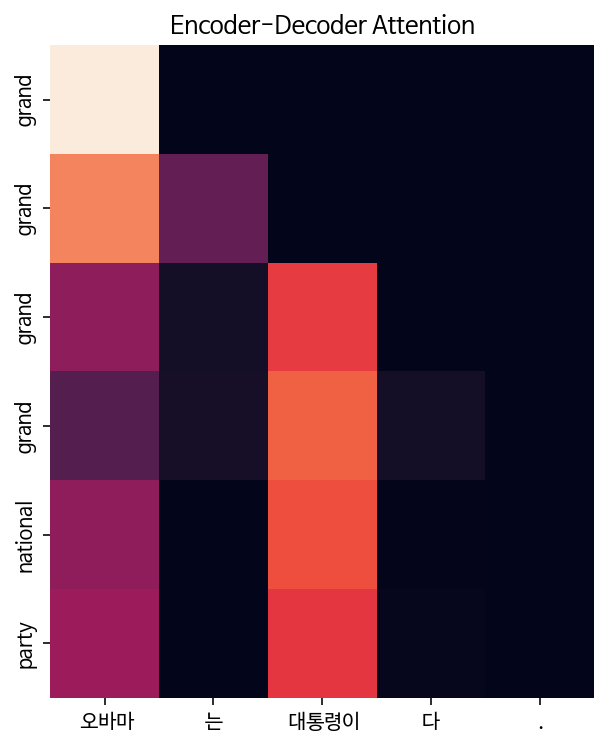

Input: 시민들은 도시 속에 산다.
Predicted translation: two two two two and greens .


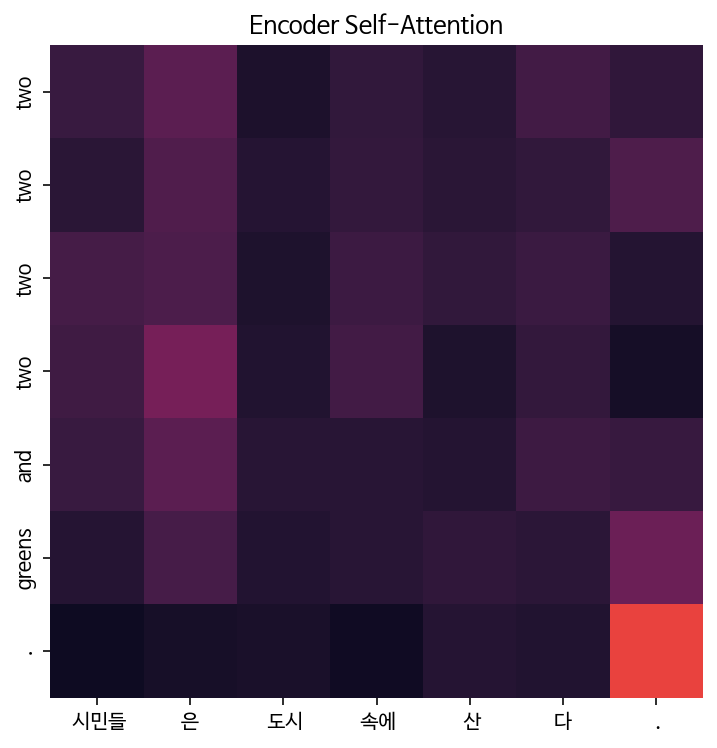

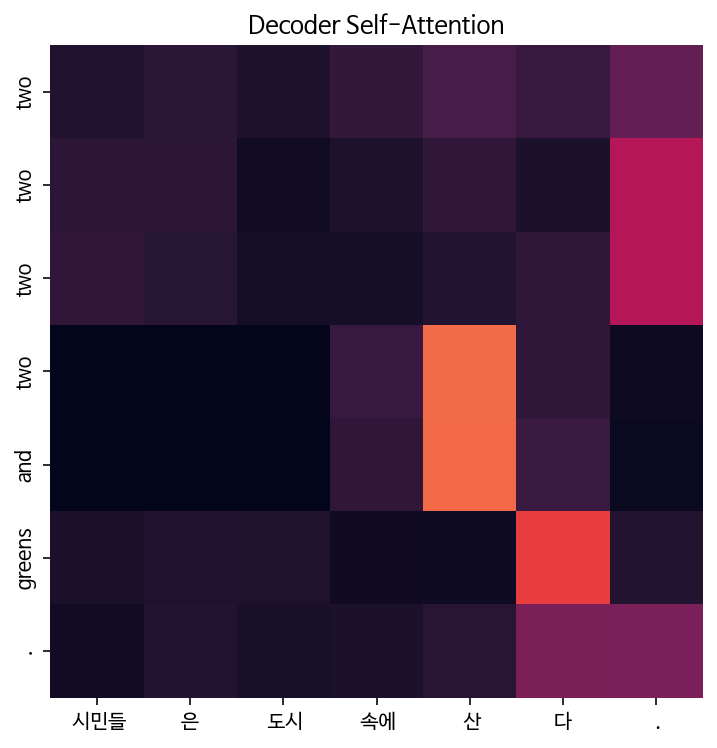

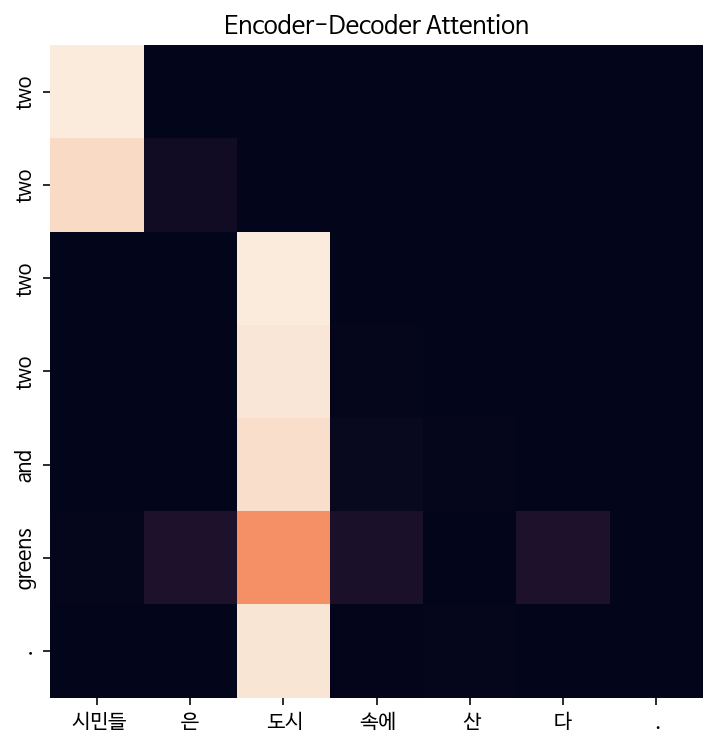

Input: 커피는 필요 없다.
Predicted translation: detention detention detention detention


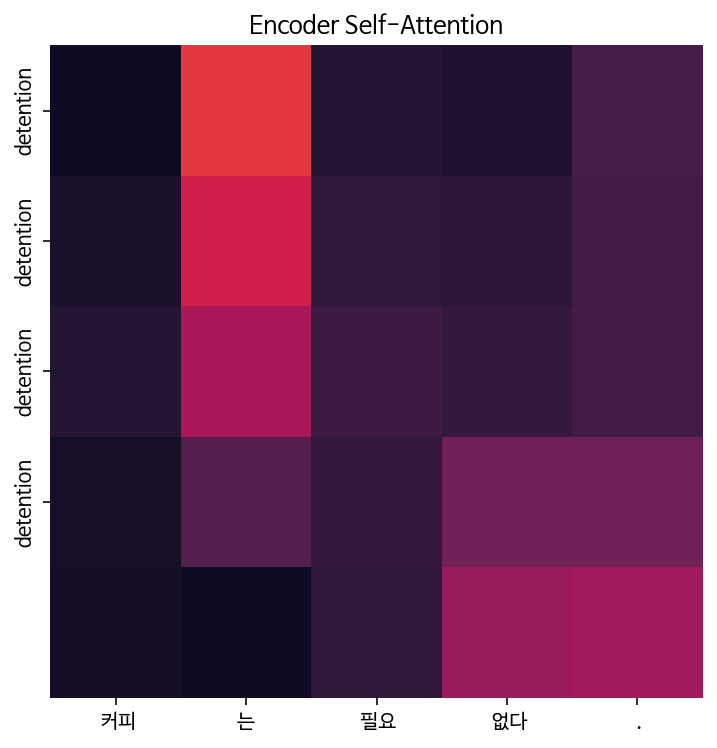

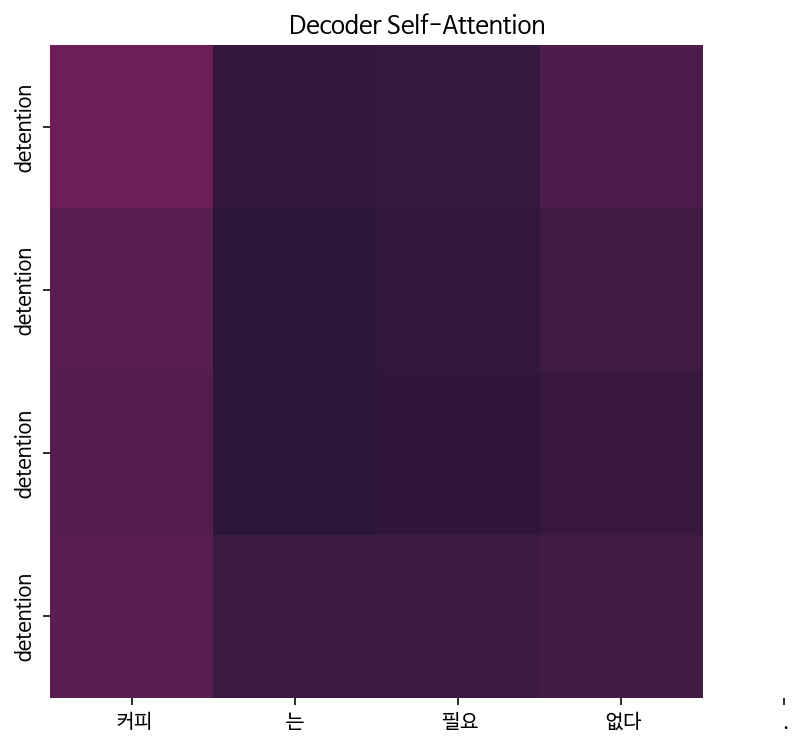

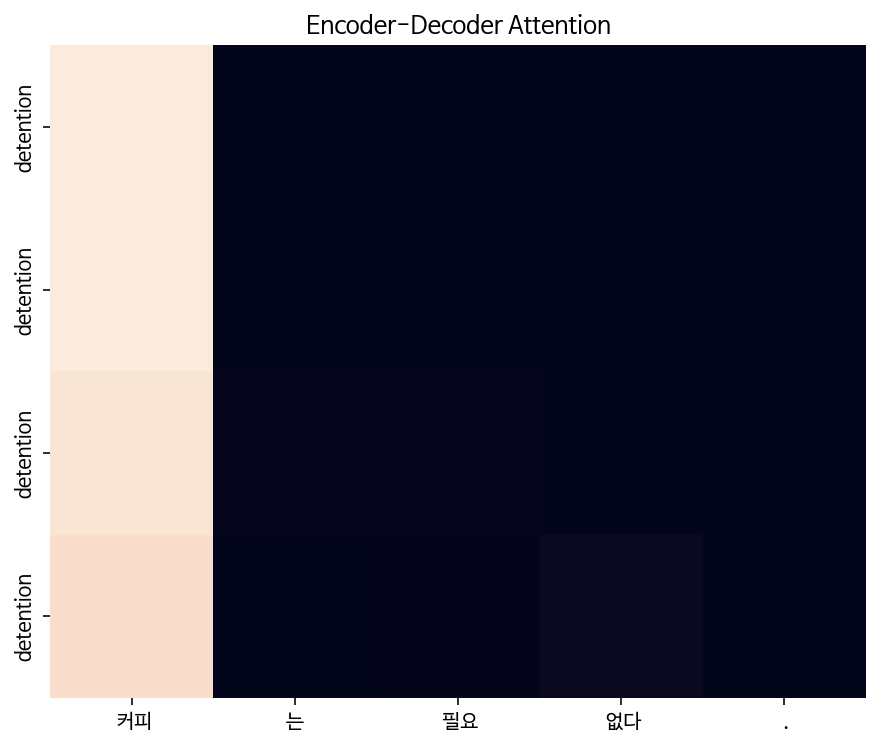

Input: 일곱 명의 사망자가 발생했다.
Predicted translation: two years two years , , the two are dna .


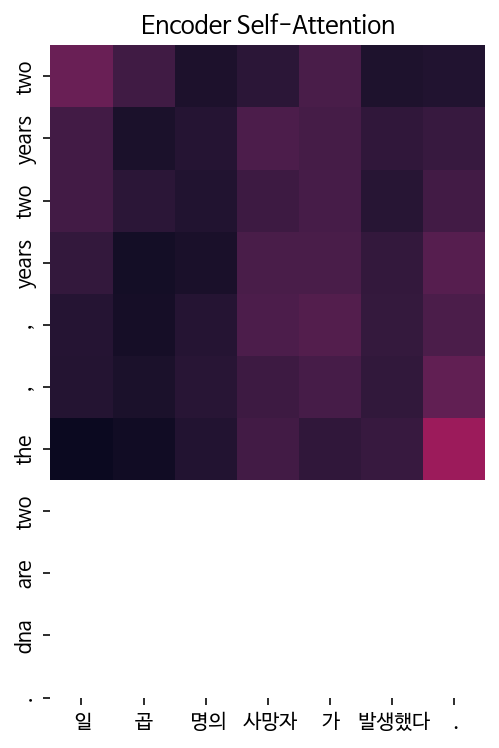

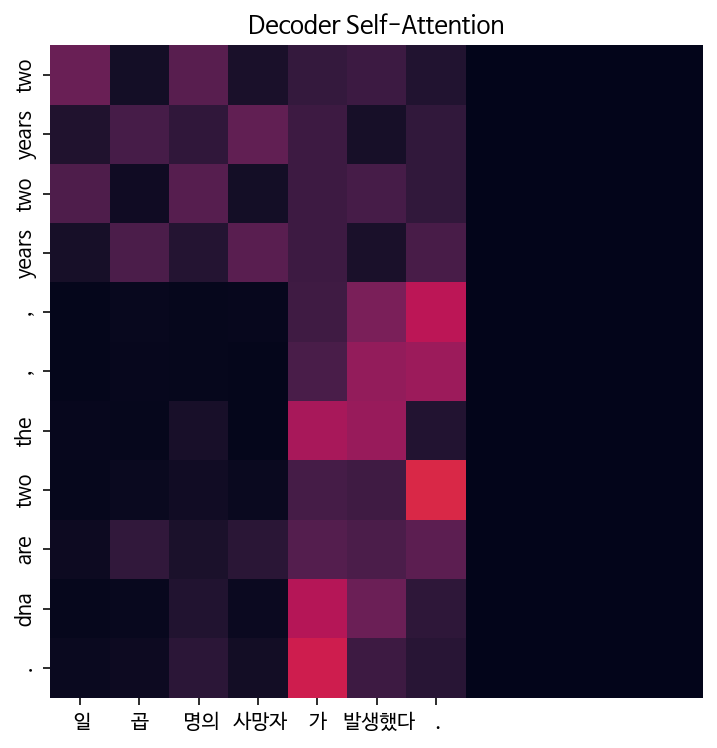

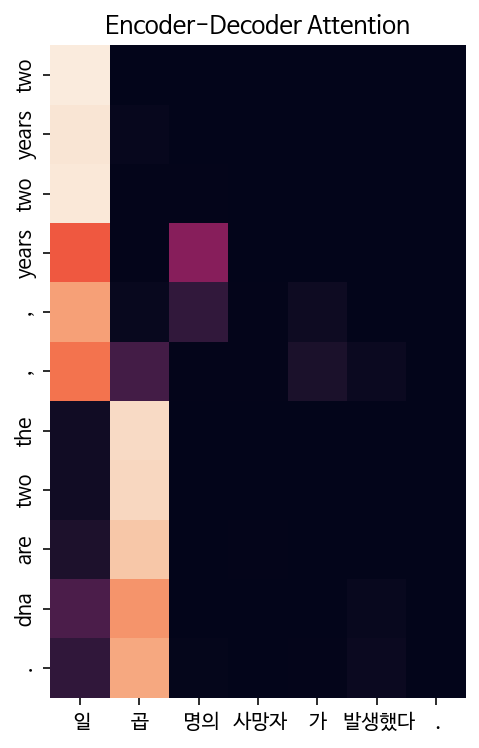


Epoch 6/10


Epoch 6:   0%|          | 0/1080 [00:00<?, ?it/s]

Epoch 6, Loss: 0.6536

### Translations and Visualizations ###
Input: 오바마는 대통령이다.
Predicted translation: washington washington washington washington .


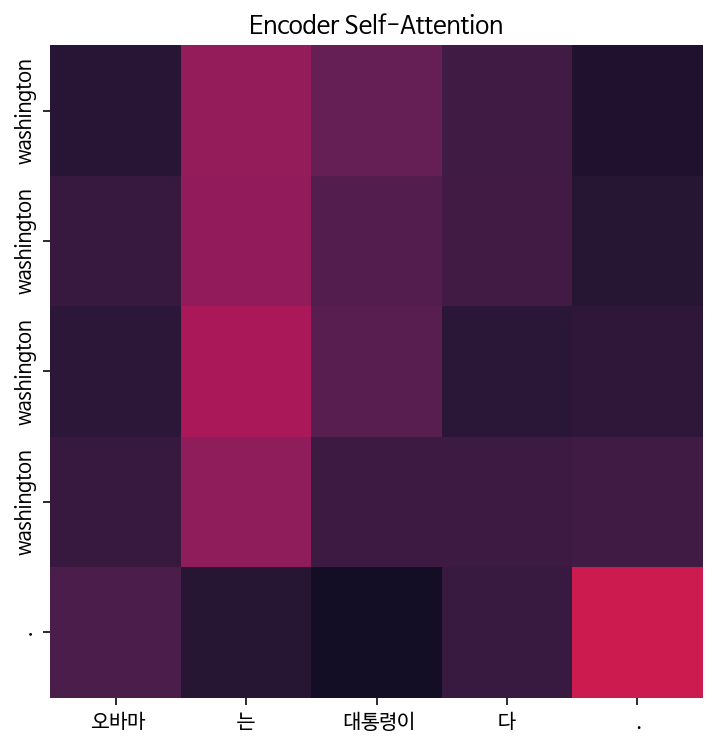

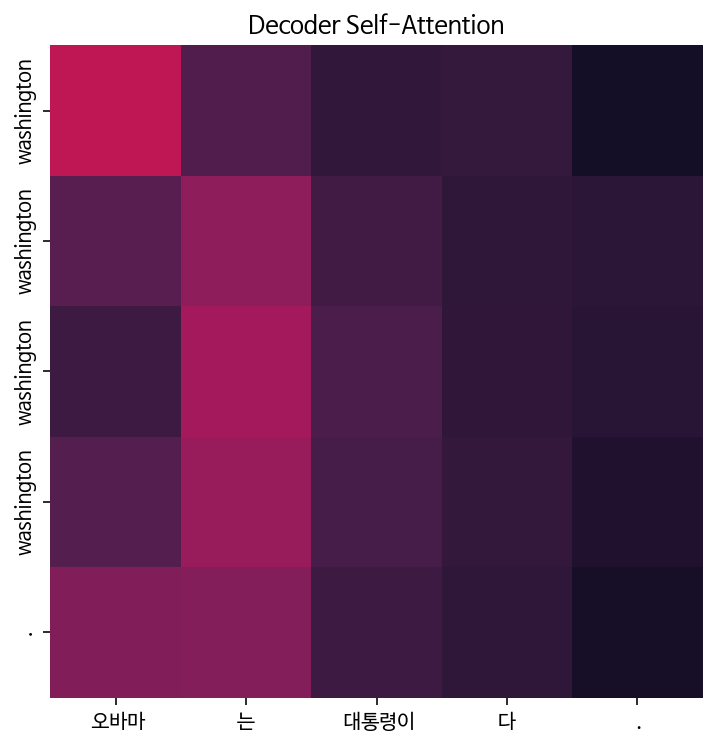

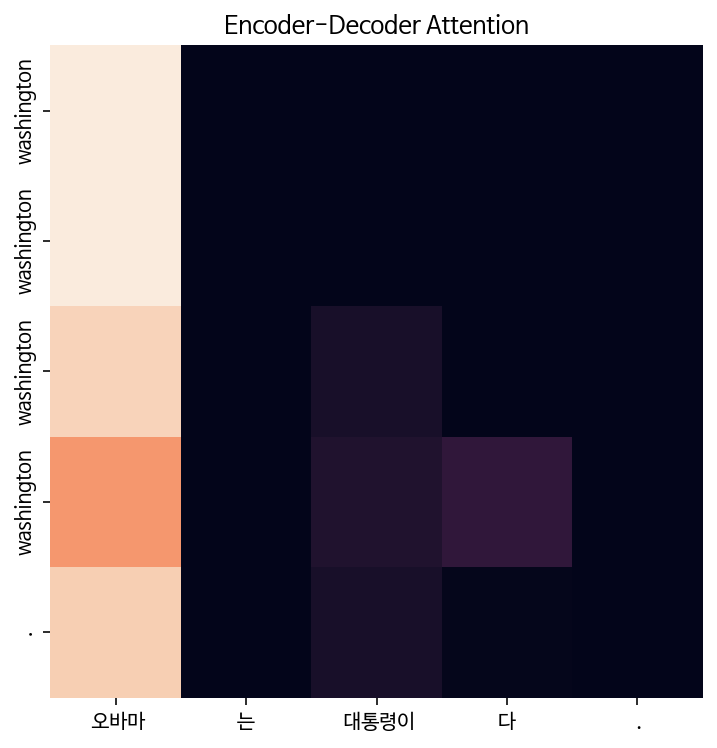

Input: 시민들은 도시 속에 산다.
Predicted translation: was was was was was door .


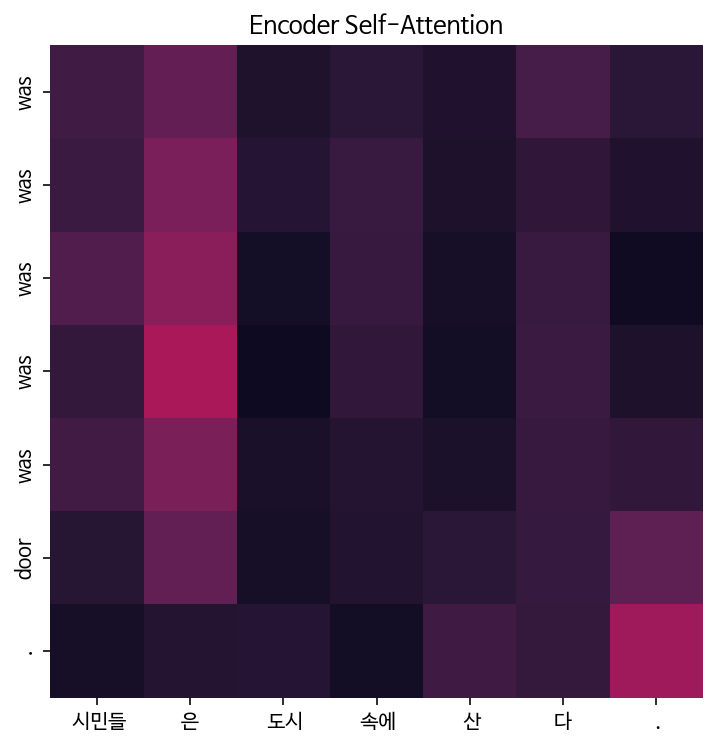

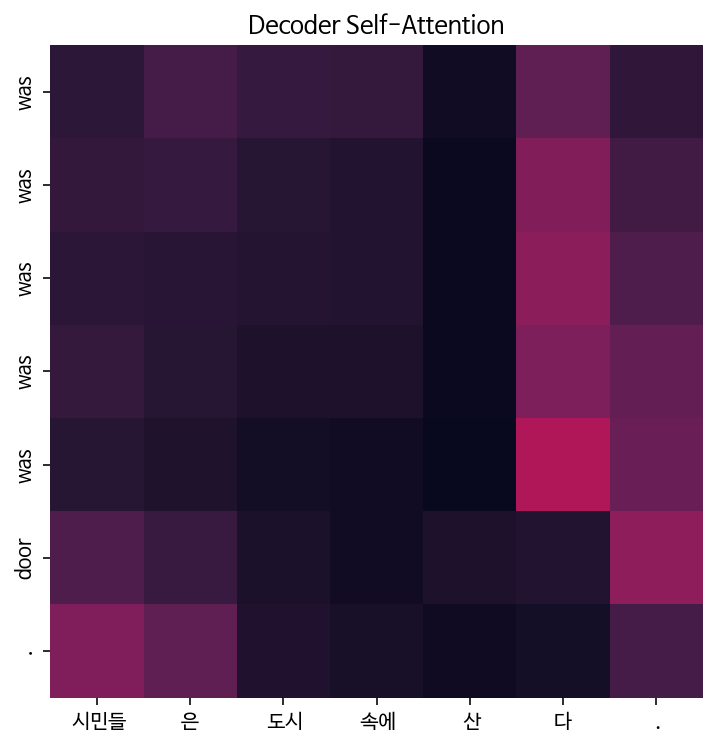

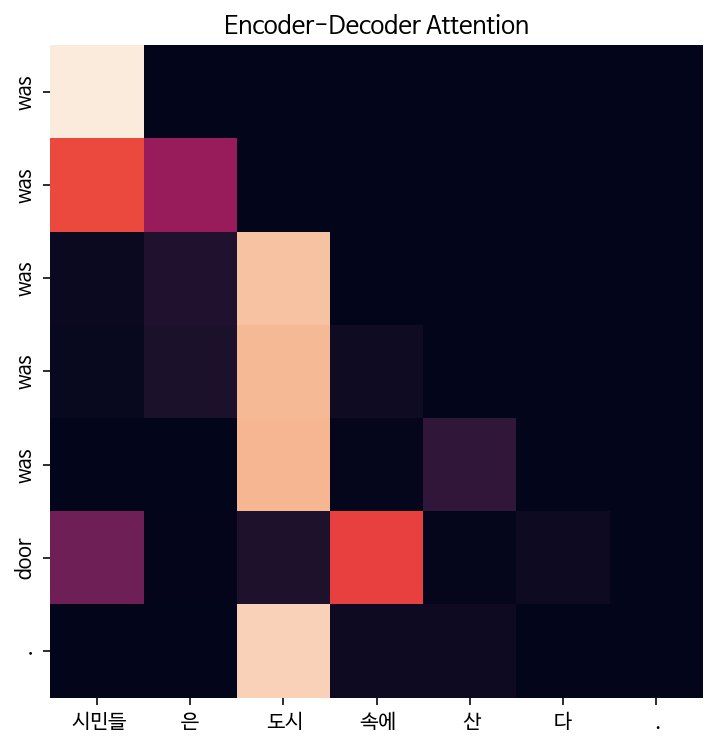

Input: 커피는 필요 없다.
Predicted translation: coffee coffee coffee coffee wife .


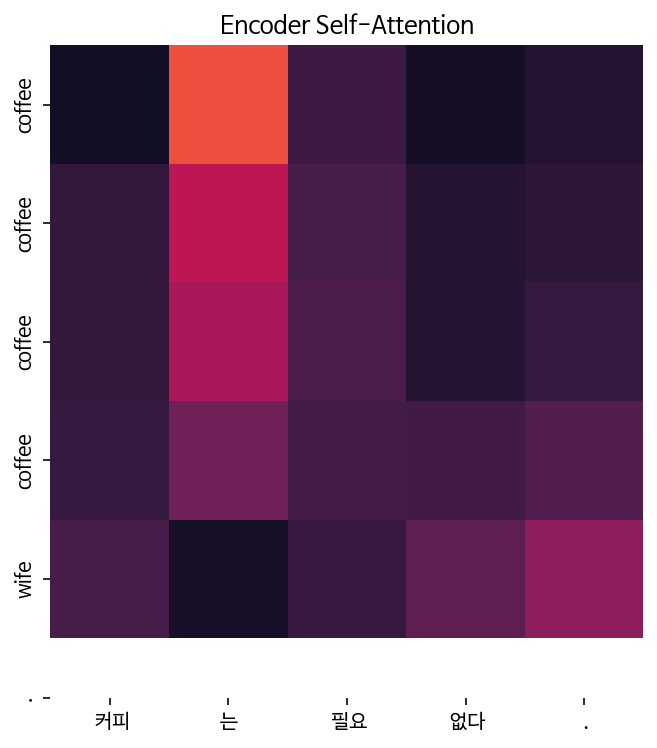

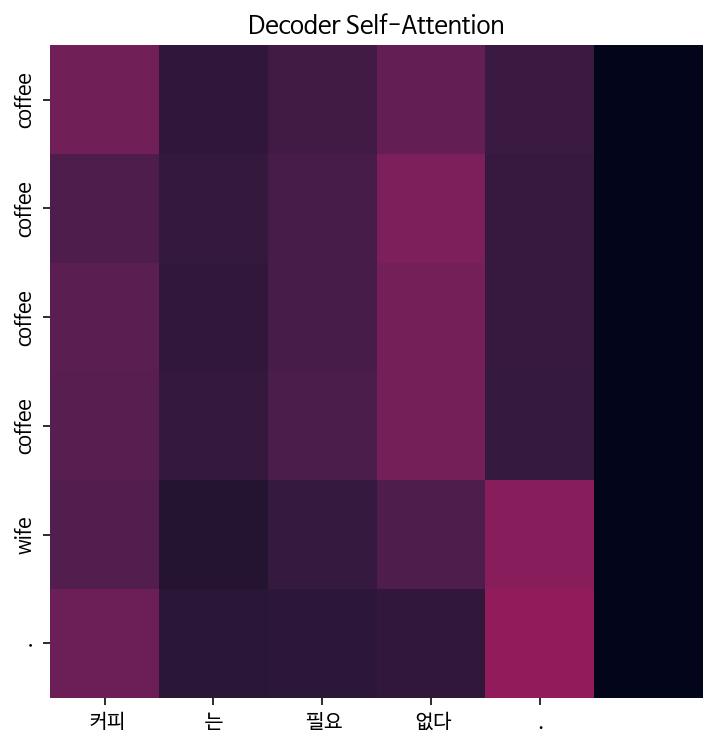

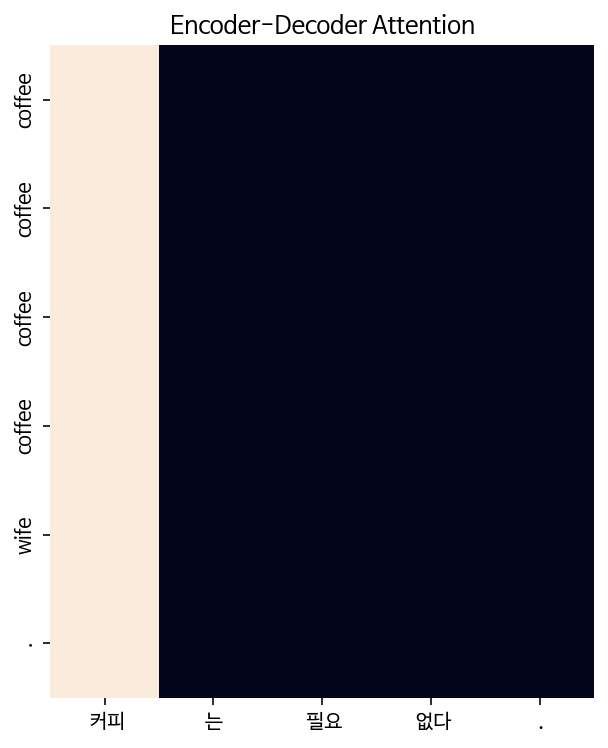

Input: 일곱 명의 사망자가 발생했다.
Predicted translation: i i i i i i i , i ve , i , i , i ve , i , i , i , i , i , i , i one , i one , i , i , i , i .


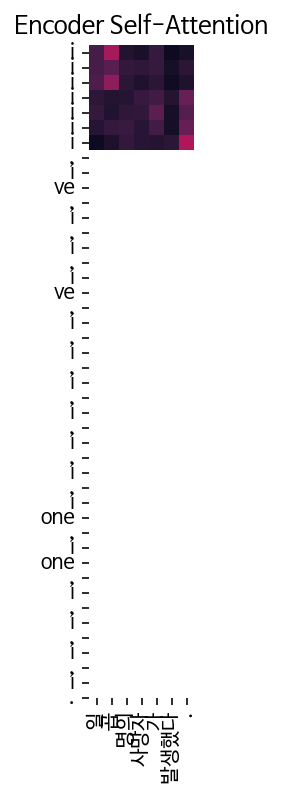

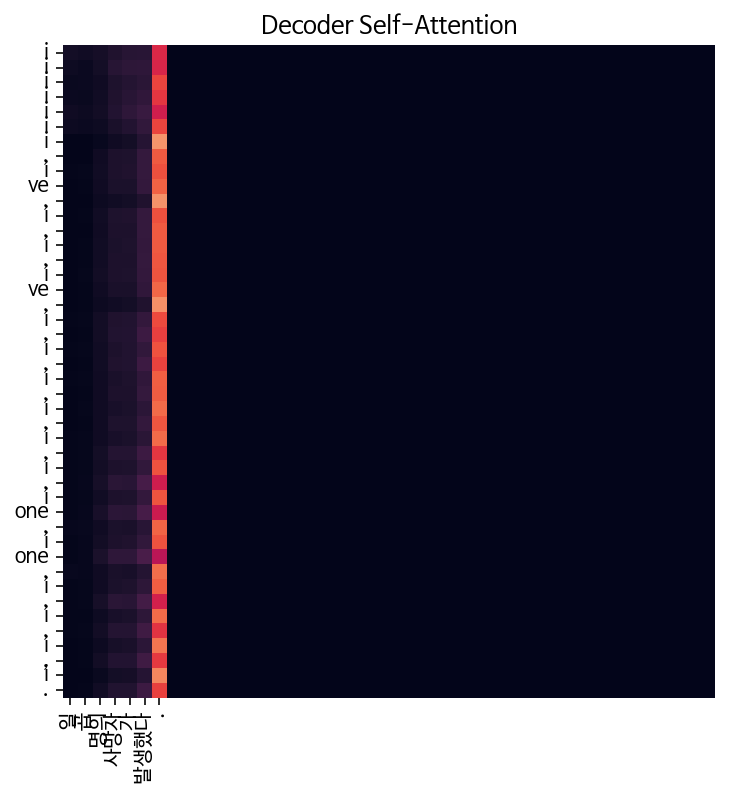

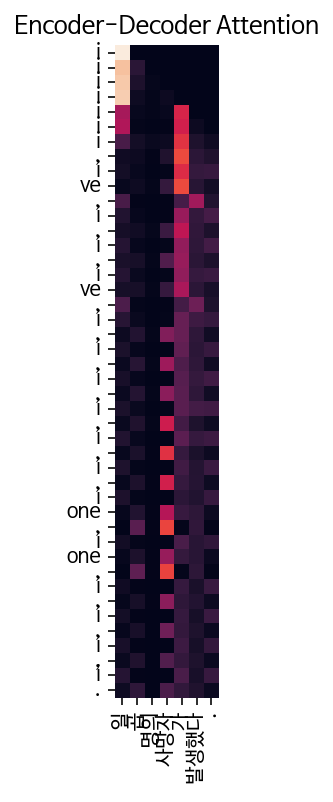


Epoch 7/10


Epoch 7:   0%|          | 0/1080 [00:00<?, ?it/s]

Epoch 7, Loss: 0.4861

### Translations and Visualizations ###
Input: 오바마는 대통령이다.
Predicted translation: next next next years .


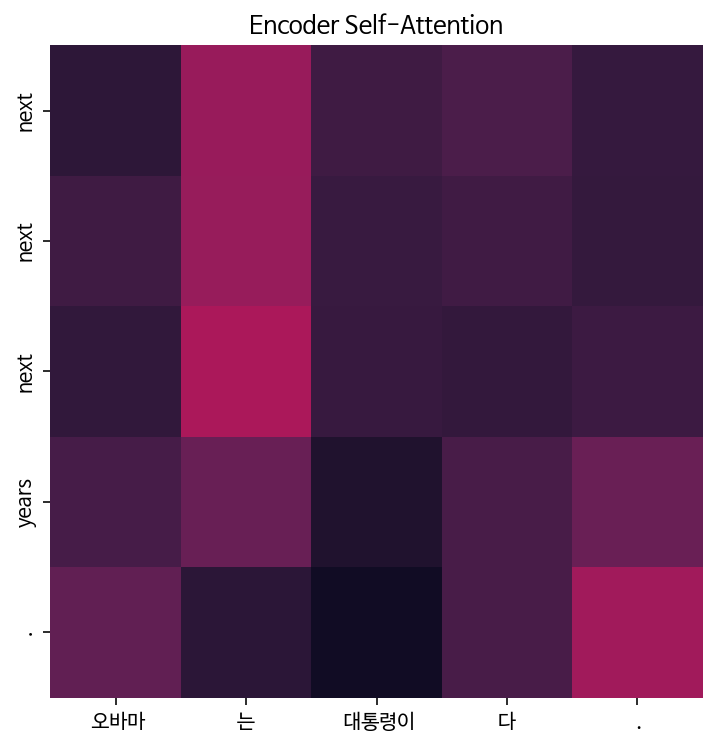

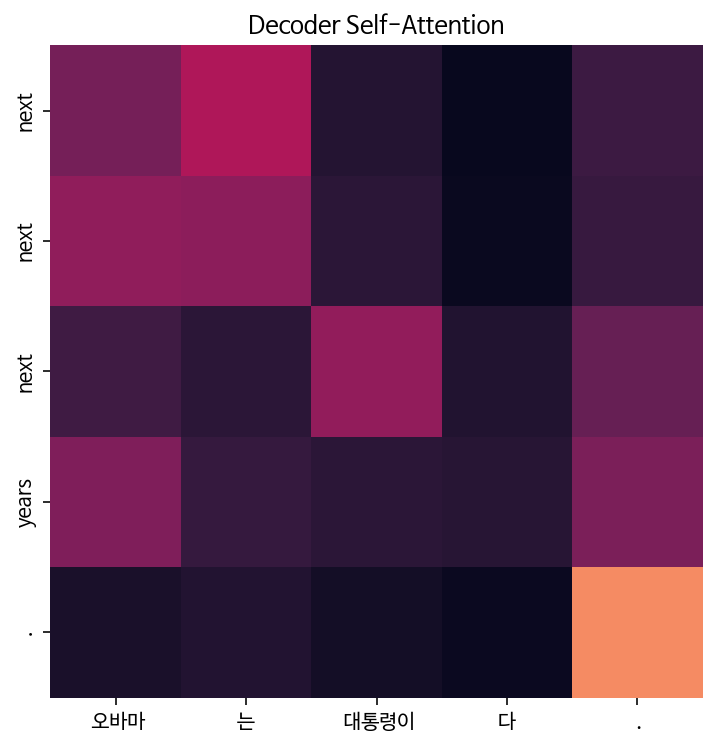

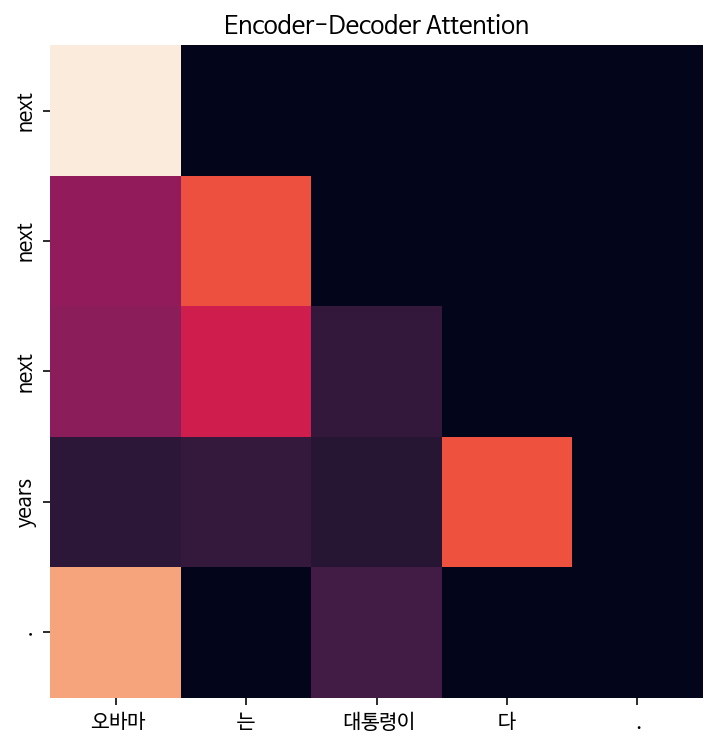

Input: 시민들은 도시 속에 산다.
Predicted translation: civil civil reach reaching and neighbors were slightly half of t were slightly were slightly were slightly were slightly were not evacuate


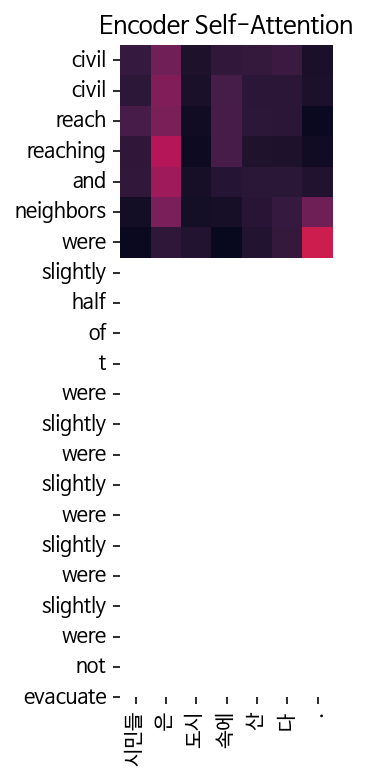

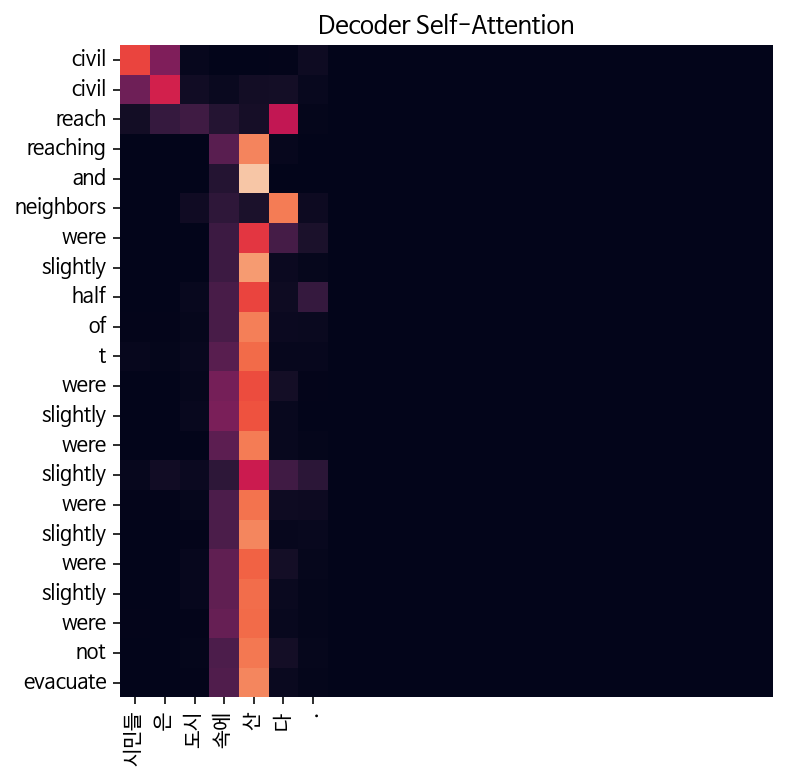

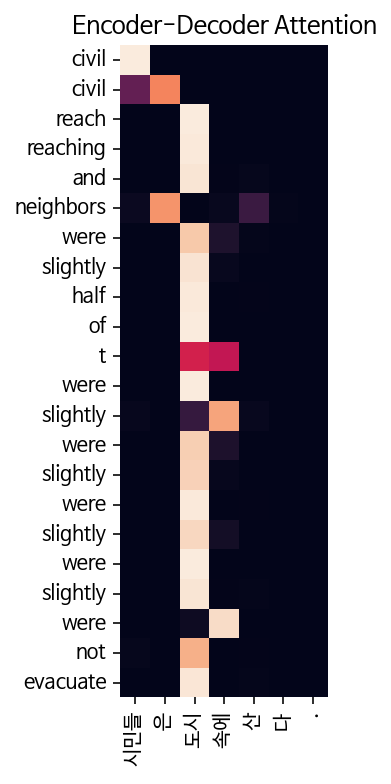

Input: 커피는 필요 없다.
Predicted translation: coffee coffee coffee ministry of coffee


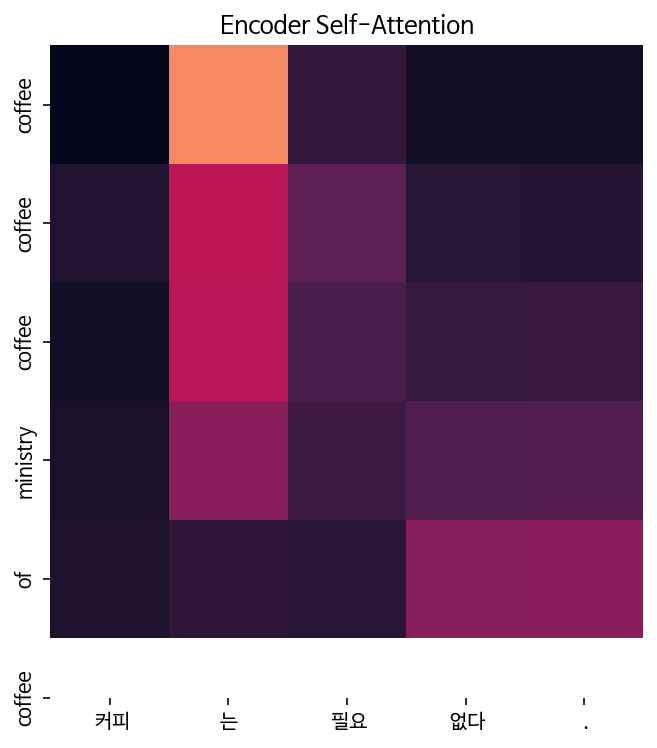

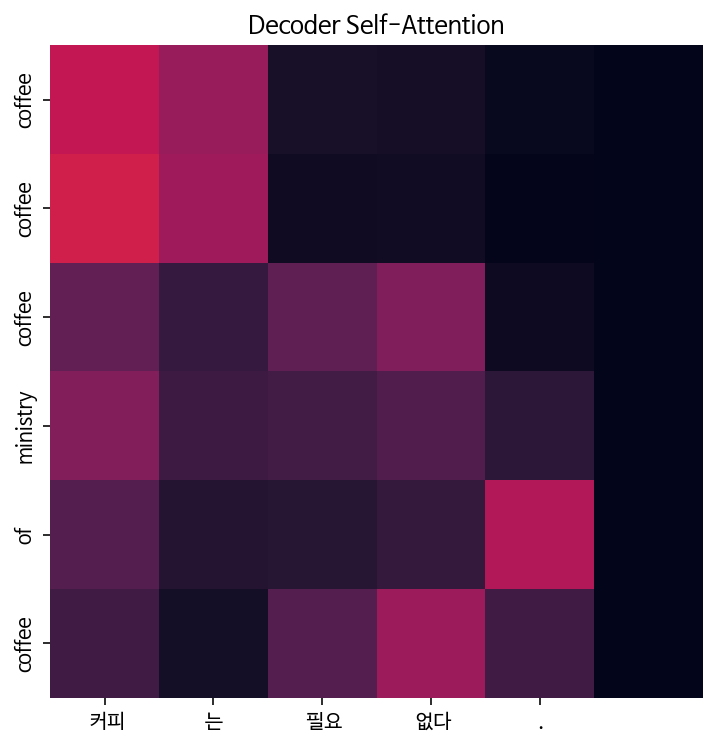

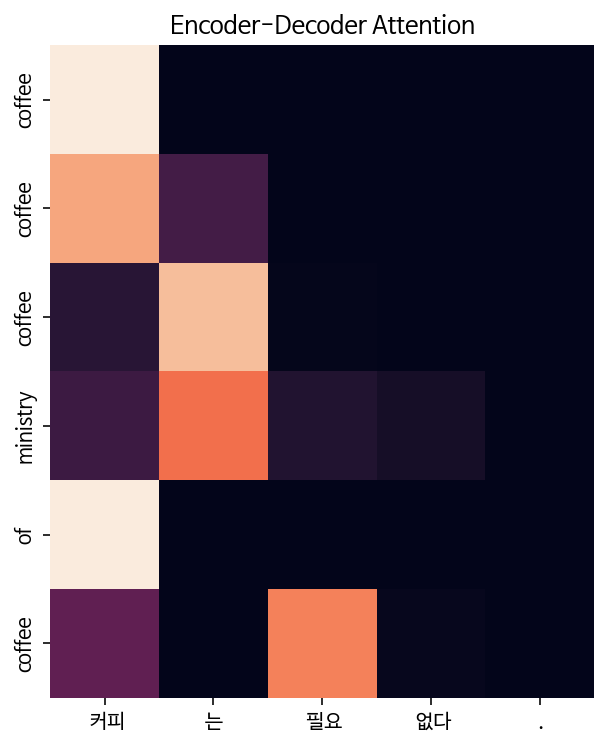

Input: 일곱 명의 사망자가 발생했다.
Predicted translation: companies companies companies companies companies so many remain , authorities , authorities , authorities , authorities , authorities , authorities , authorities .


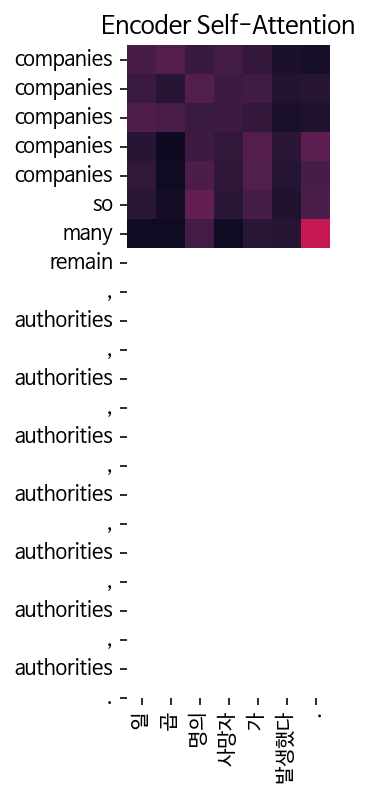

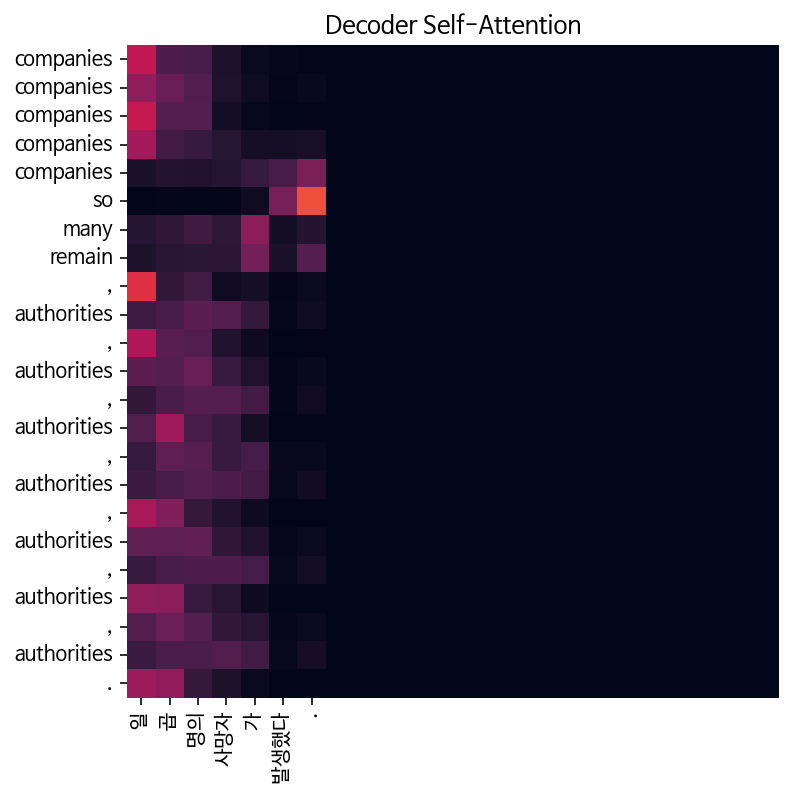

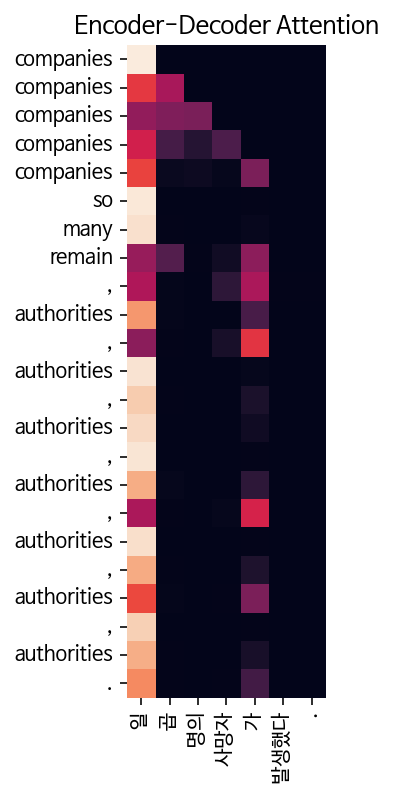


Epoch 8/10


Epoch 8:   0%|          | 0/1080 [00:00<?, ?it/s]

Epoch 8, Loss: 0.3640

### Translations and Visualizations ###
Input: 오바마는 대통령이다.
Predicted translation: re re re re


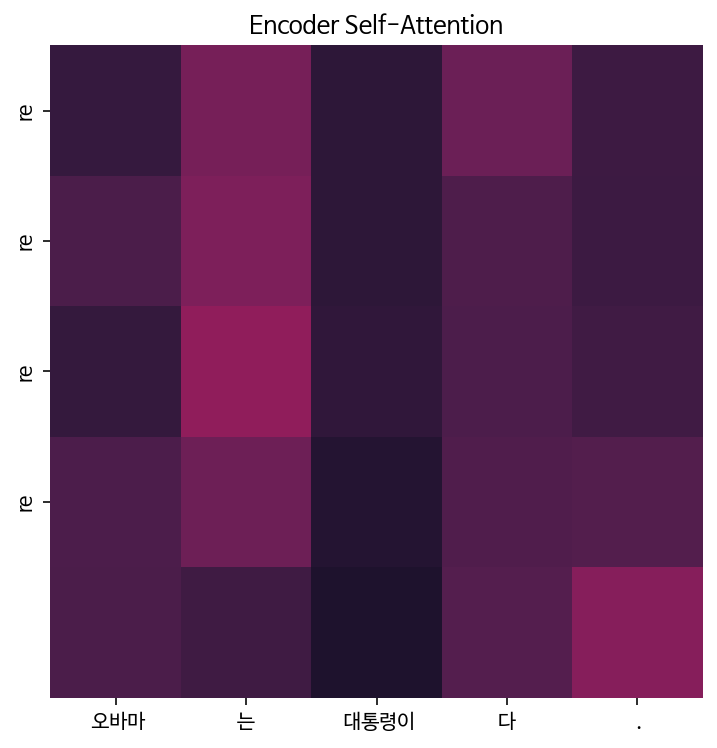

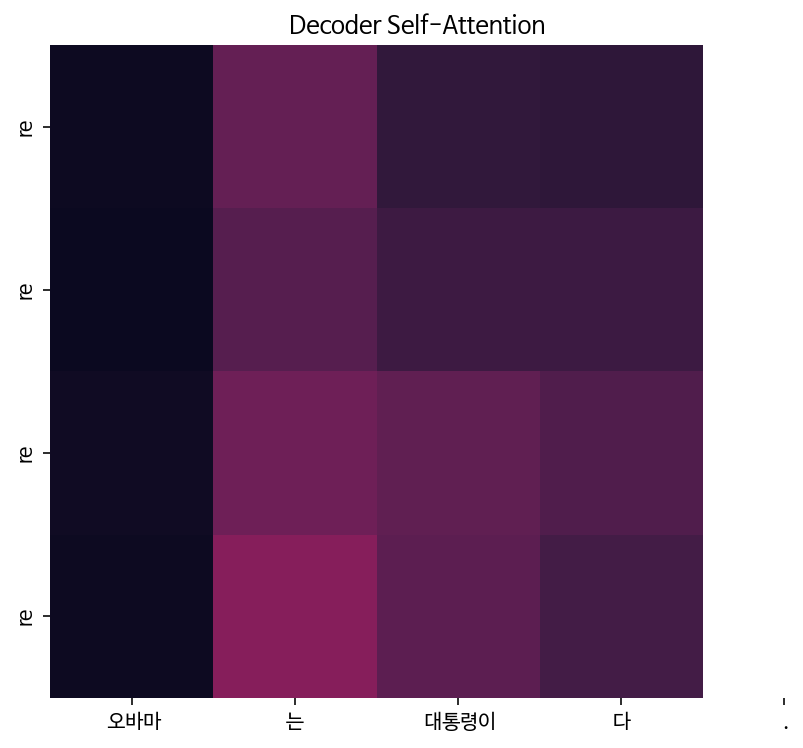

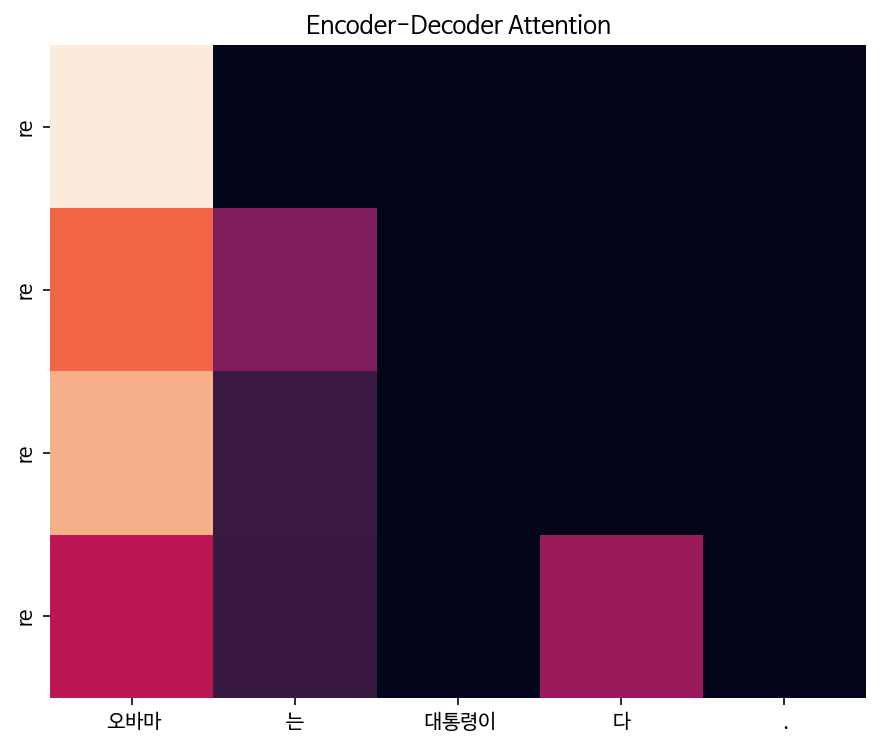

Input: 시민들은 도시 속에 산다.
Predicted translation: part part part part hall side .


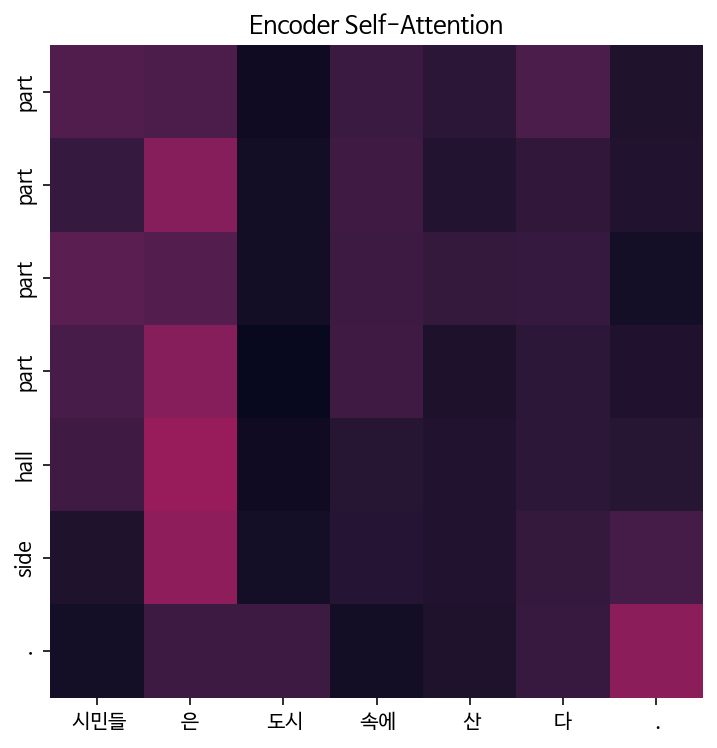

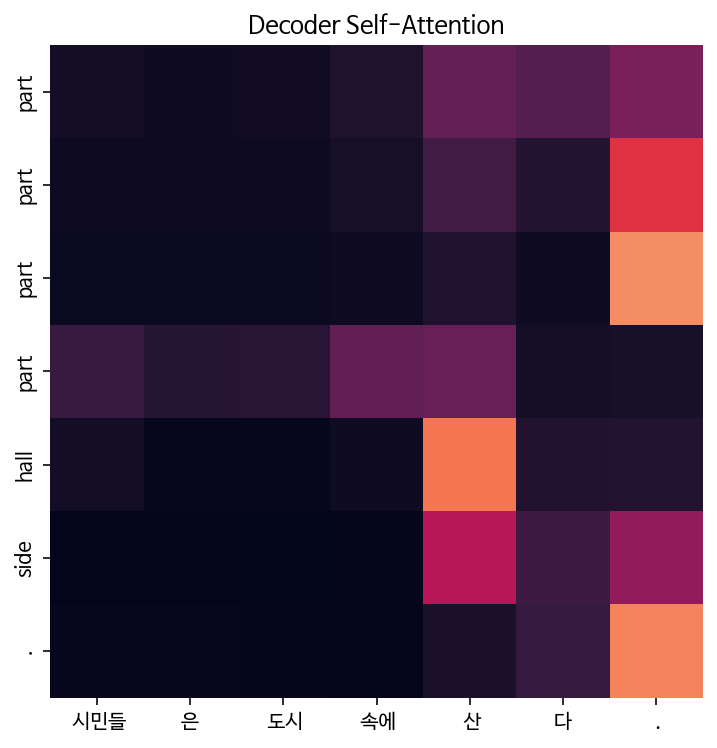

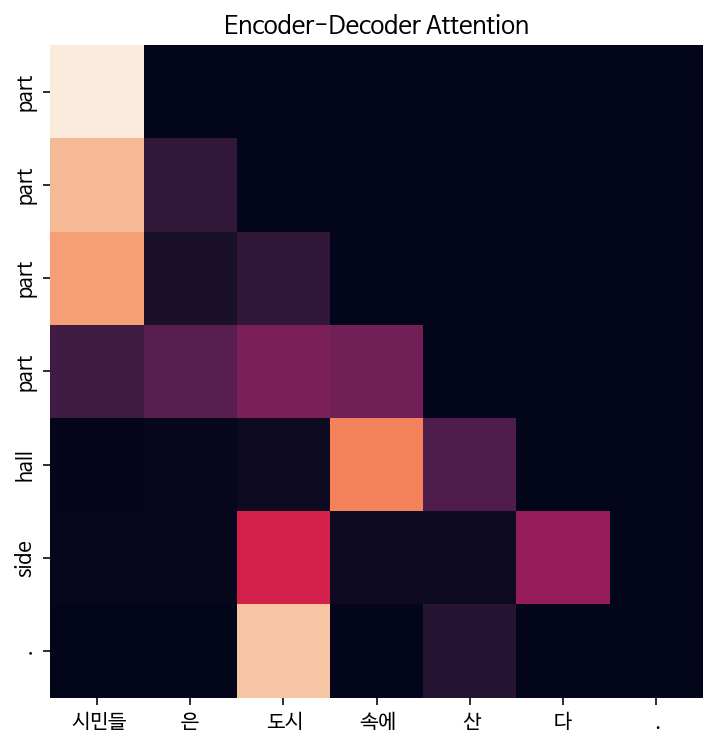

Input: 커피는 필요 없다.
Predicted translation: coffee coffee coffee coffee


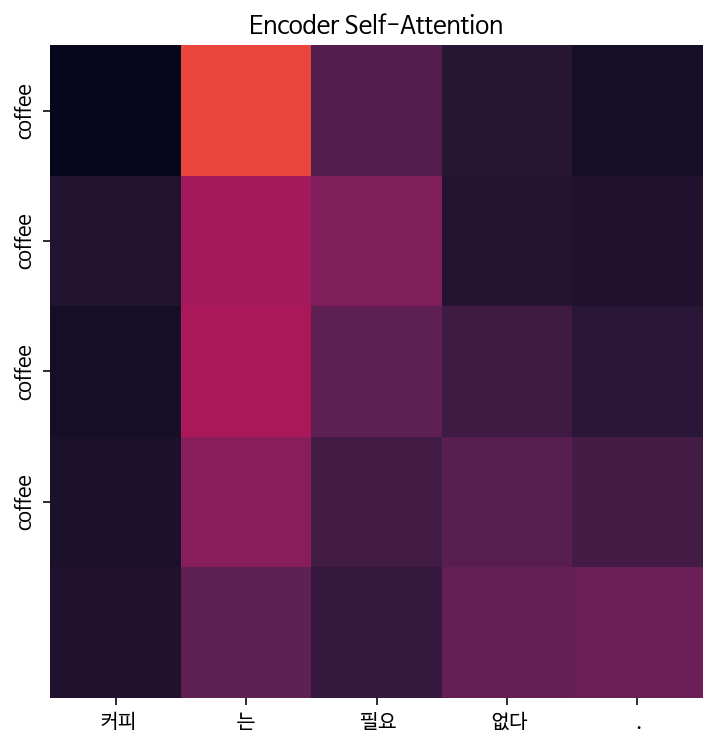

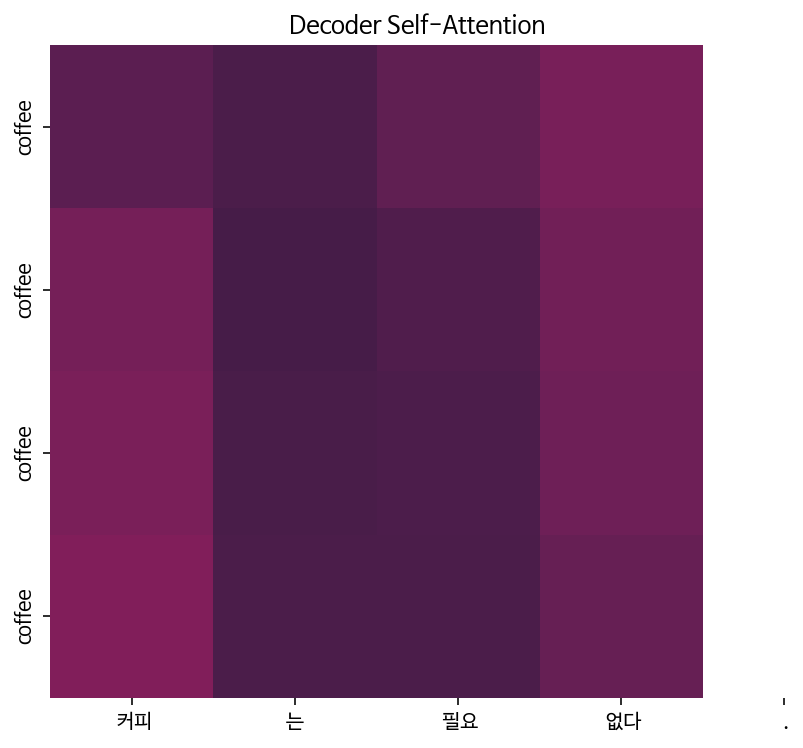

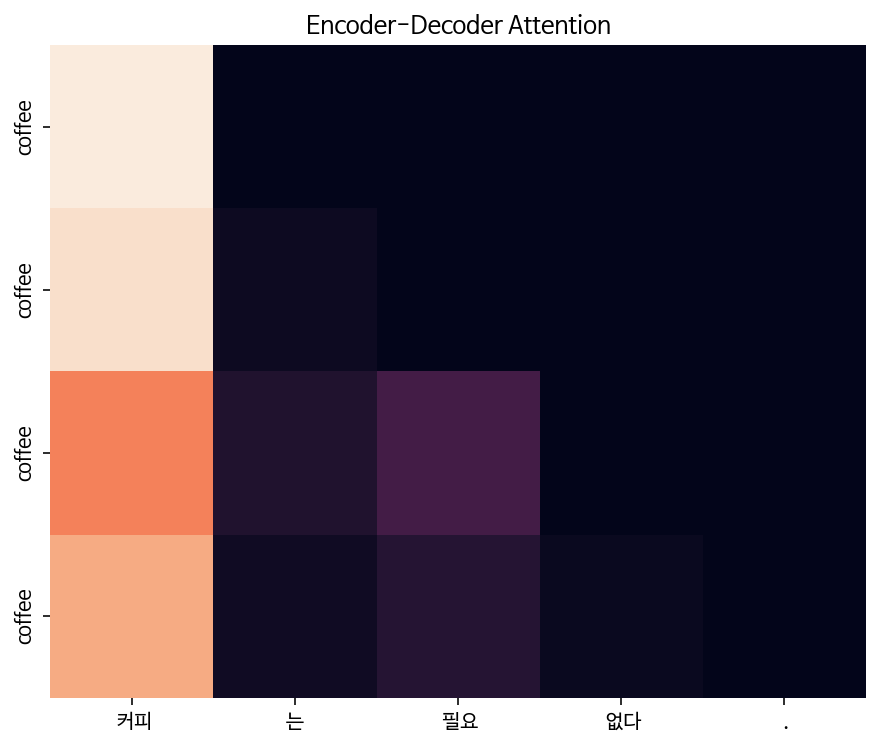

Input: 일곱 명의 사망자가 발생했다.
Predicted translation: i i i i i i really i really i really i really i really i really .


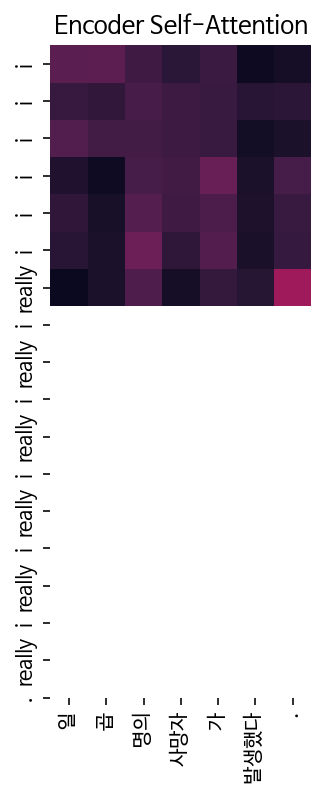

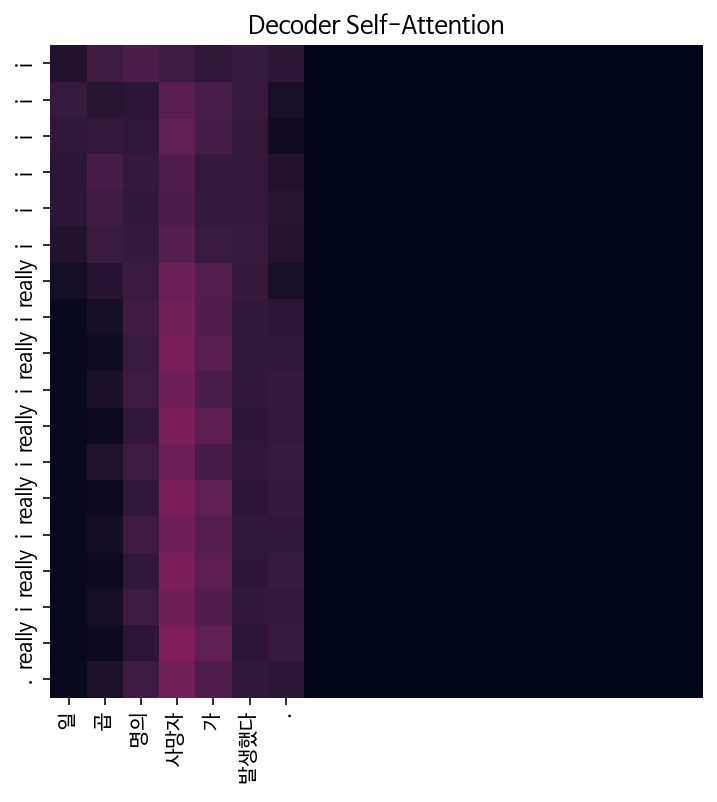

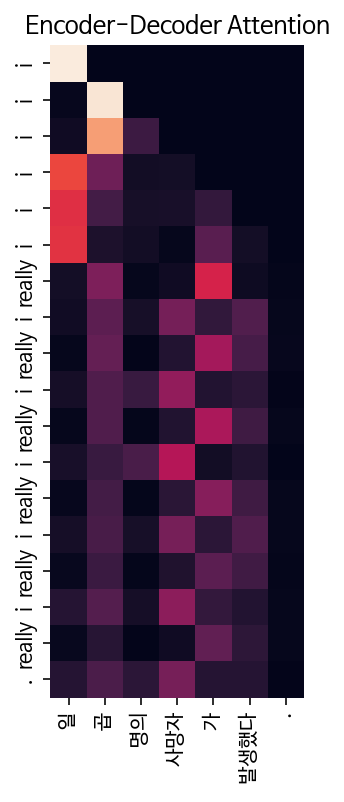


Epoch 9/10


Epoch 9:   0%|          | 0/1080 [00:00<?, ?it/s]

Epoch 9, Loss: 0.2896

### Translations and Visualizations ###
Input: 오바마는 대통령이다.
Predicted translation: . . . .


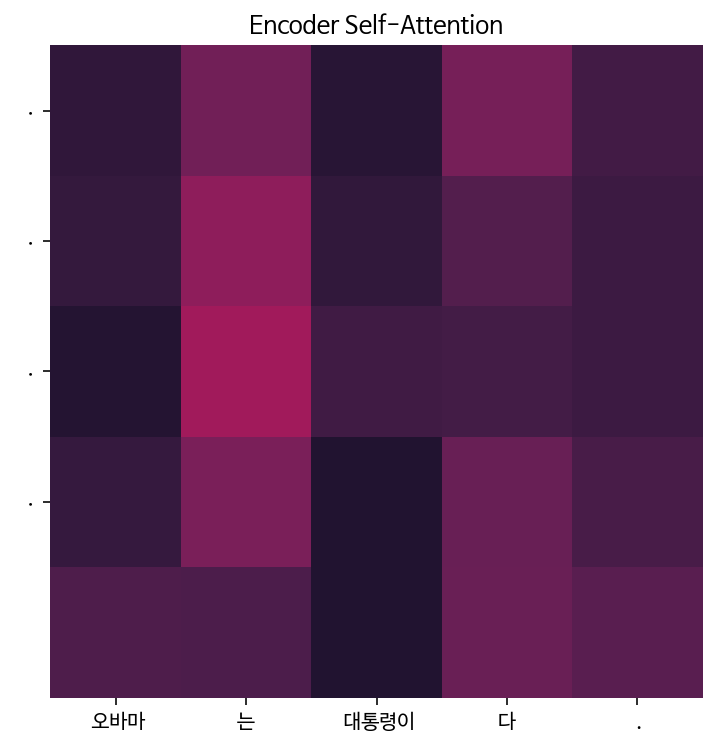

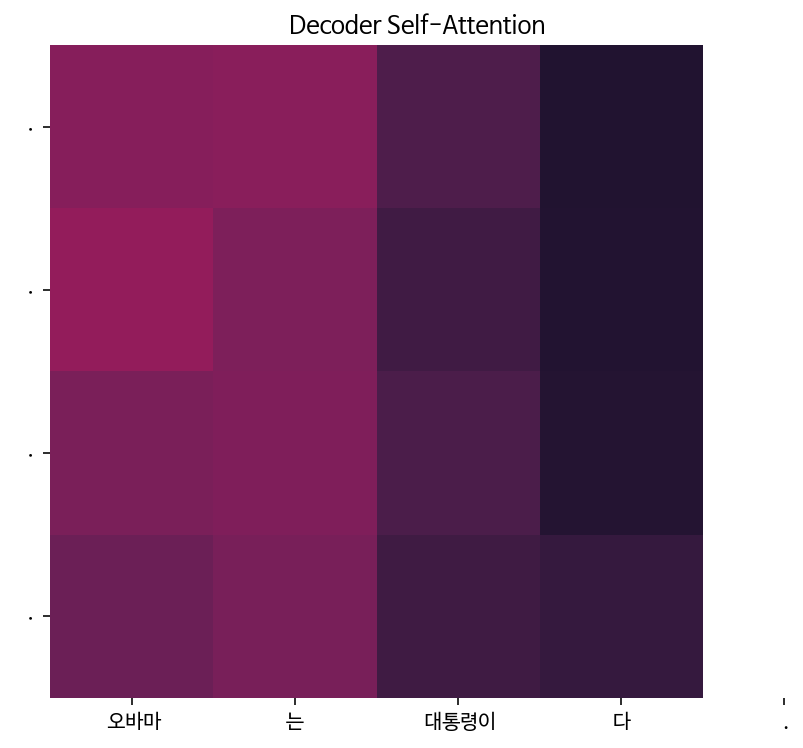

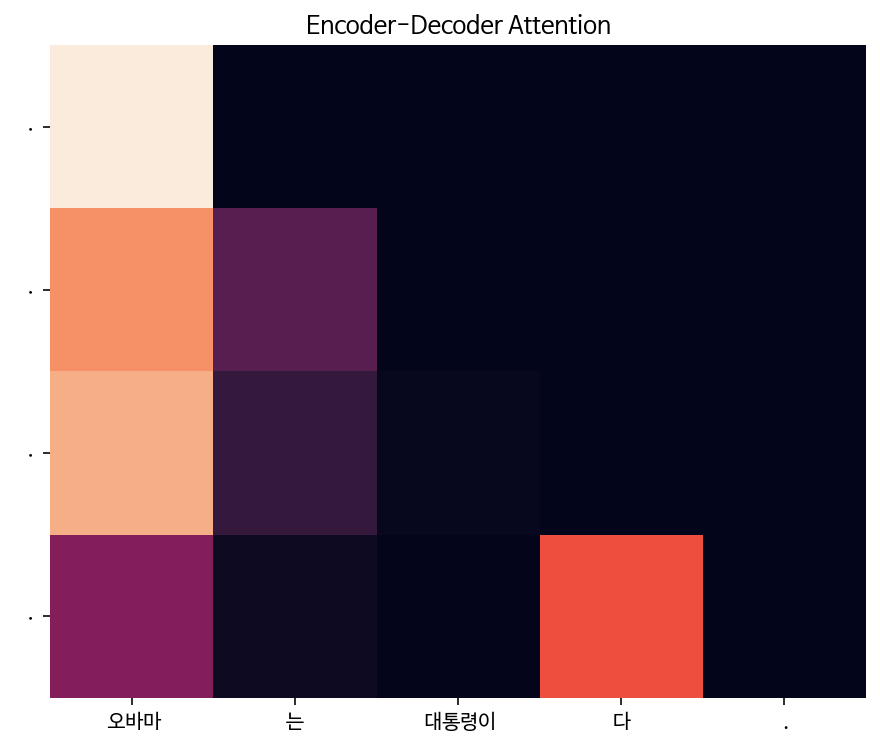

Input: 시민들은 도시 속에 산다.
Predicted translation: the the the the estimates in the part of the part of the part of the part of the part of the part of the part of the part of the part of the part of .


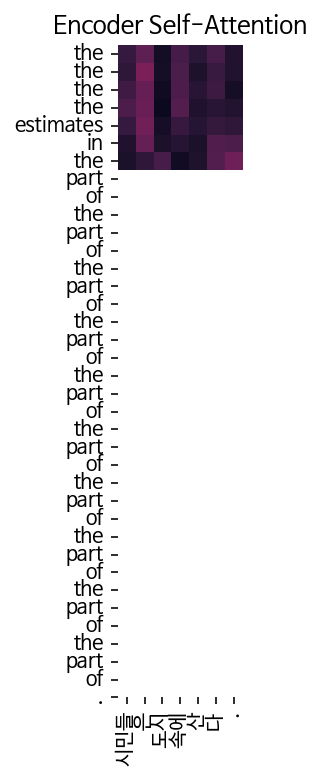

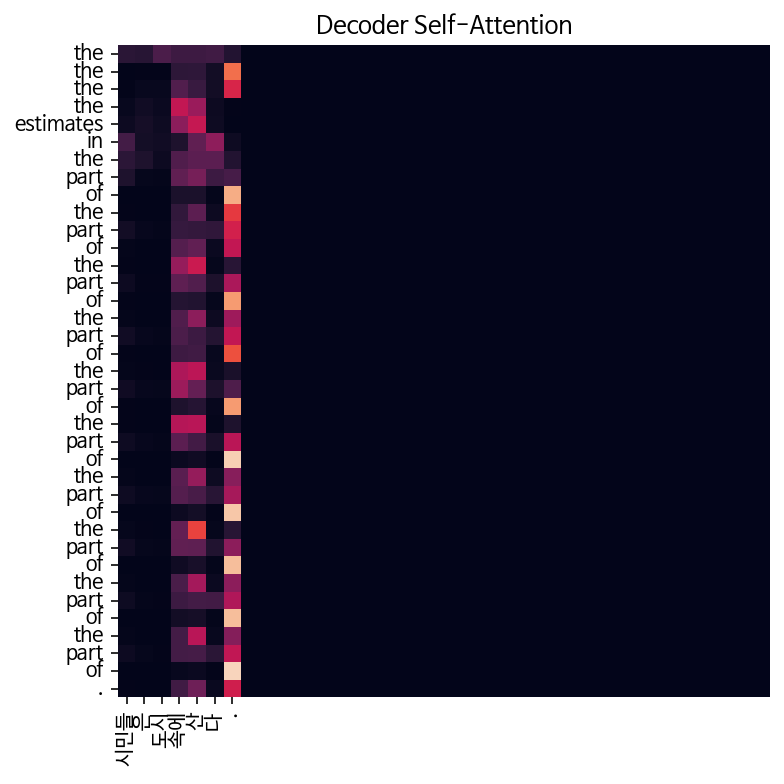

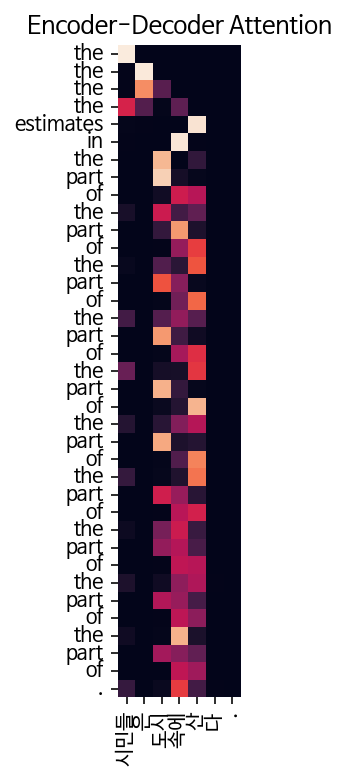

Input: 커피는 필요 없다.
Predicted translation: coffee coffee coffee coffee


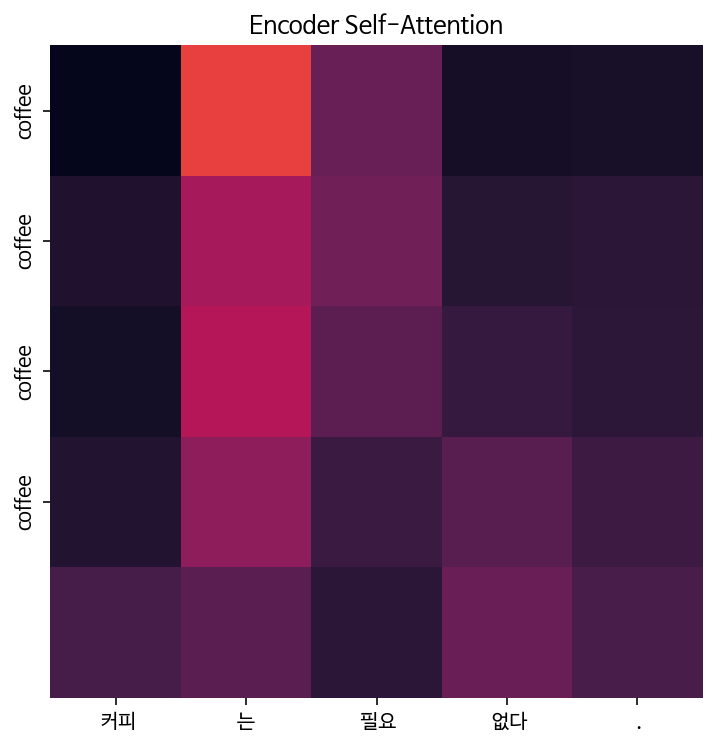

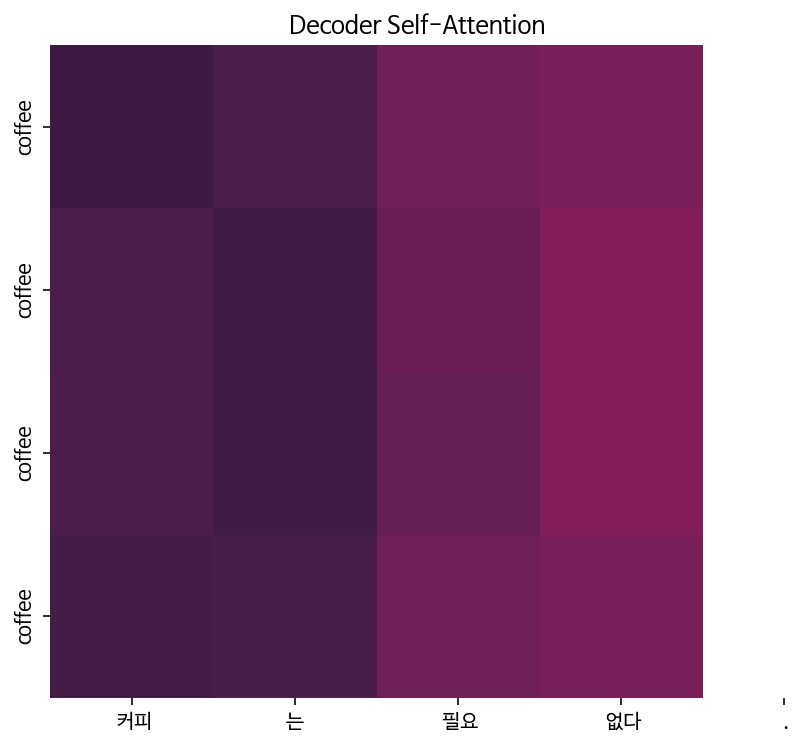

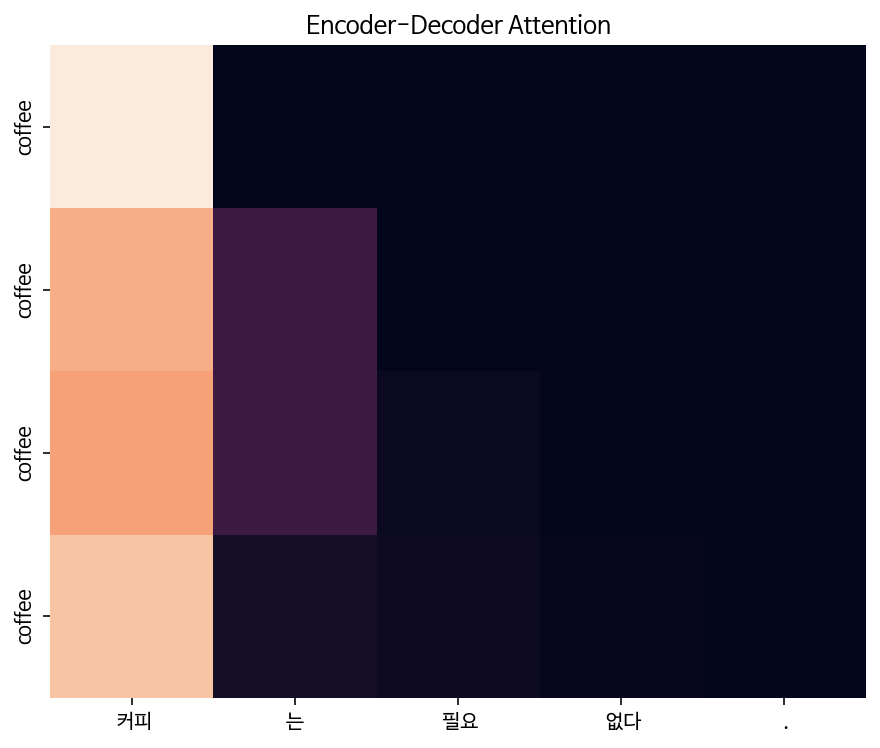

Input: 일곱 명의 사망자가 발생했다.
Predicted translation: the the the the the the several .


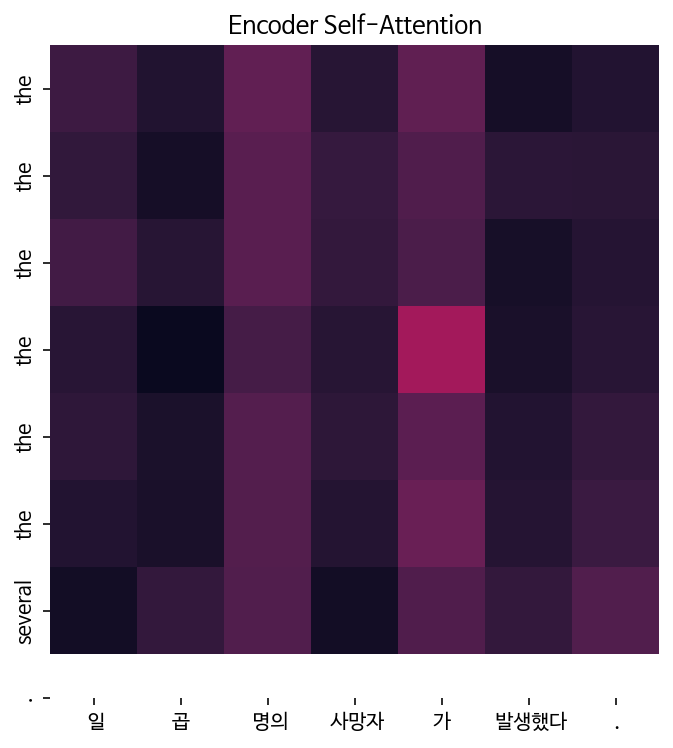

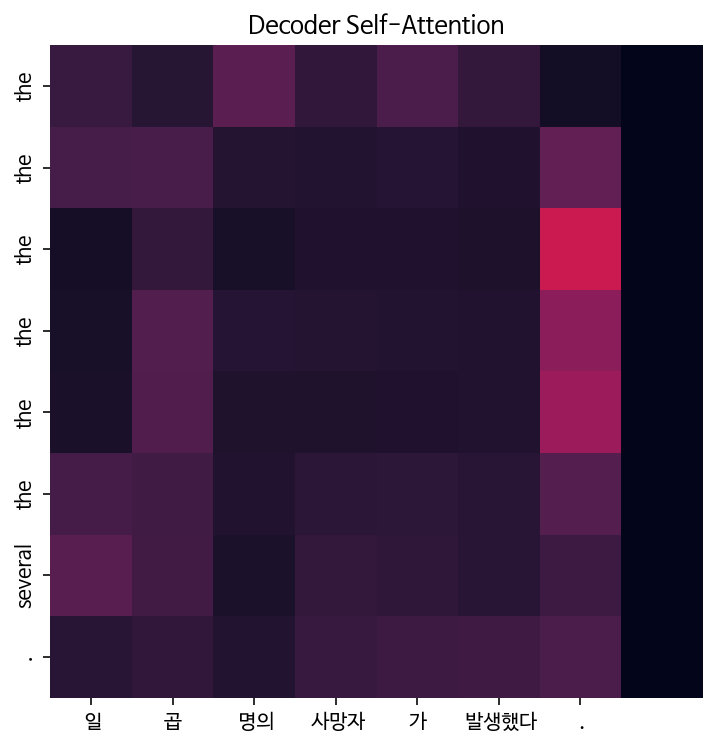

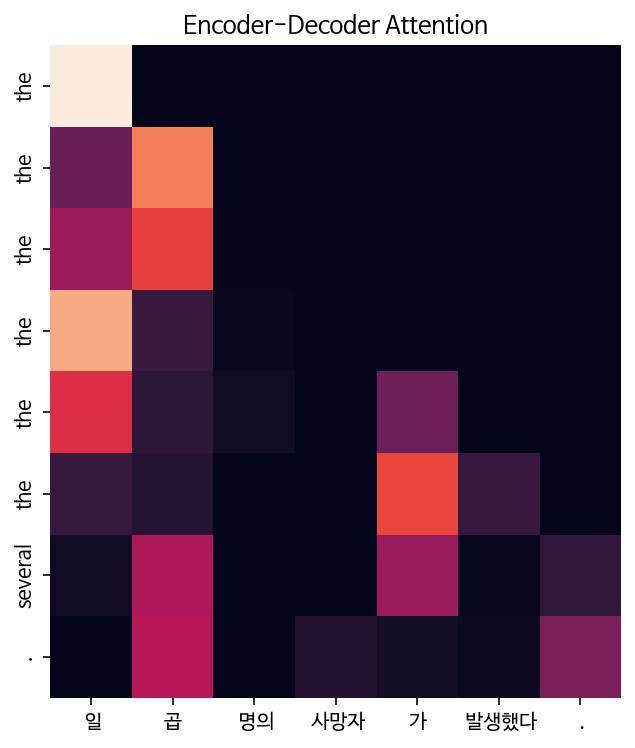


Epoch 10/10


Epoch 10:   0%|          | 0/1080 [00:00<?, ?it/s]

Epoch 10, Loss: 0.2391

### Translations and Visualizations ###
Input: 오바마는 대통령이다.
Predicted translation: is is is now , obama for any country .


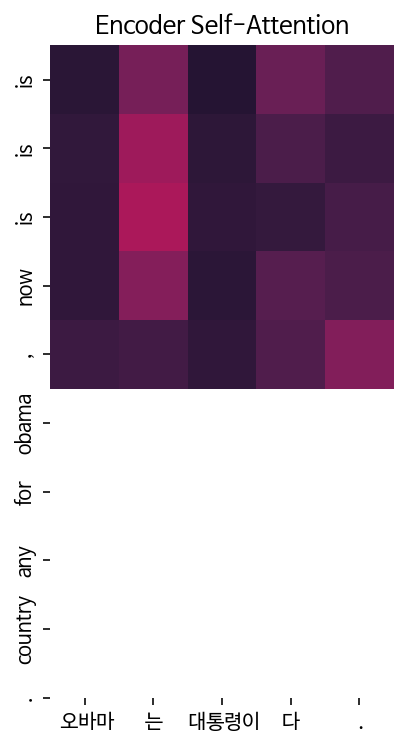

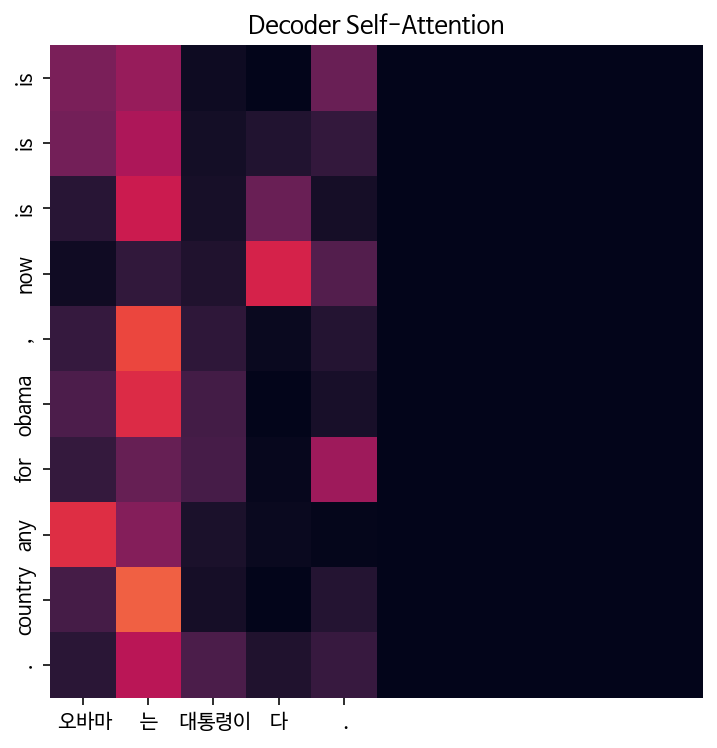

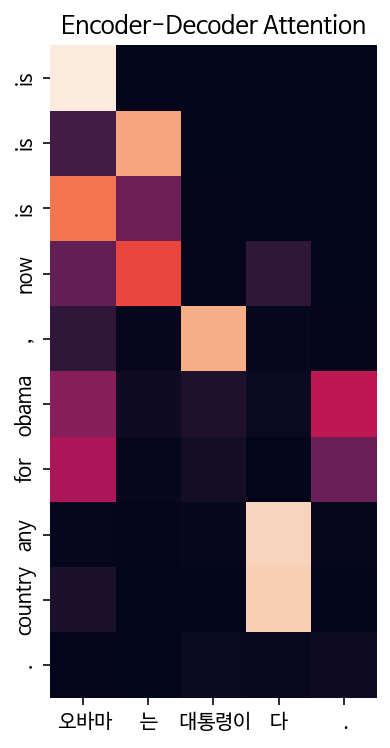

Input: 시민들은 도시 속에 산다.
Predicted translation: two two two two sea rain in the associated .


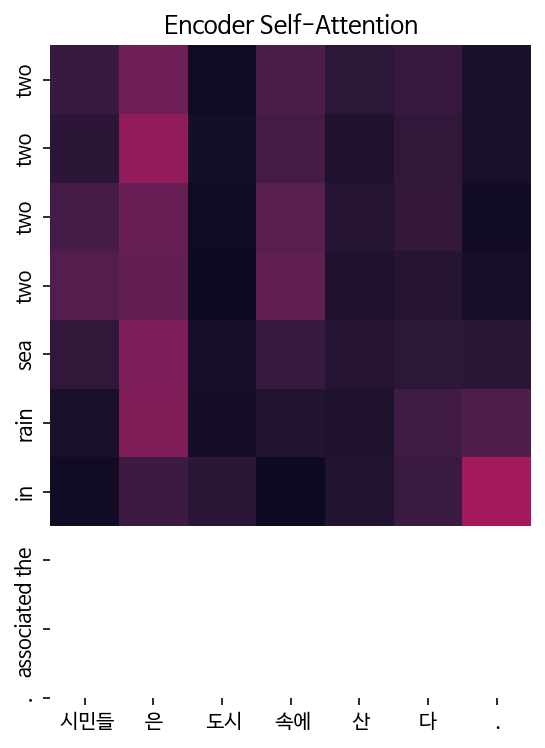

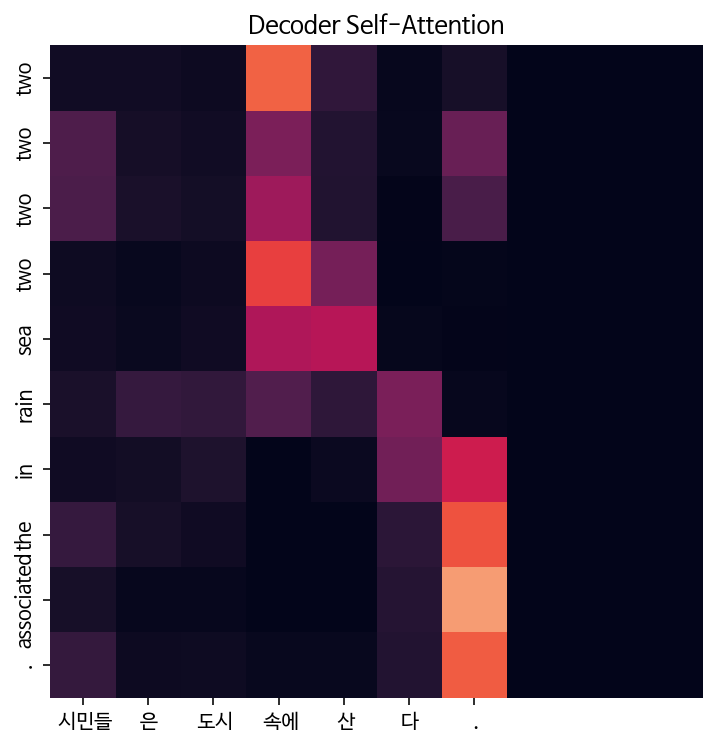

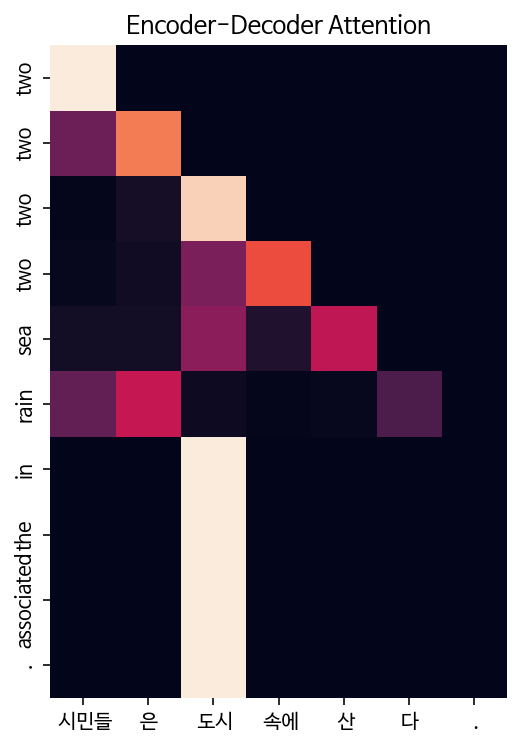

Input: 커피는 필요 없다.
Predicted translation: coffee coffee coffee coffee


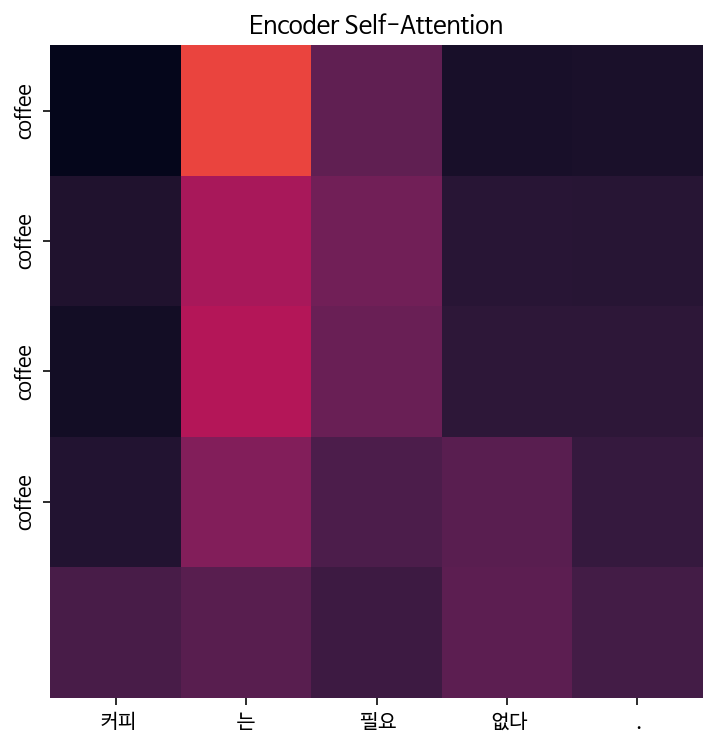

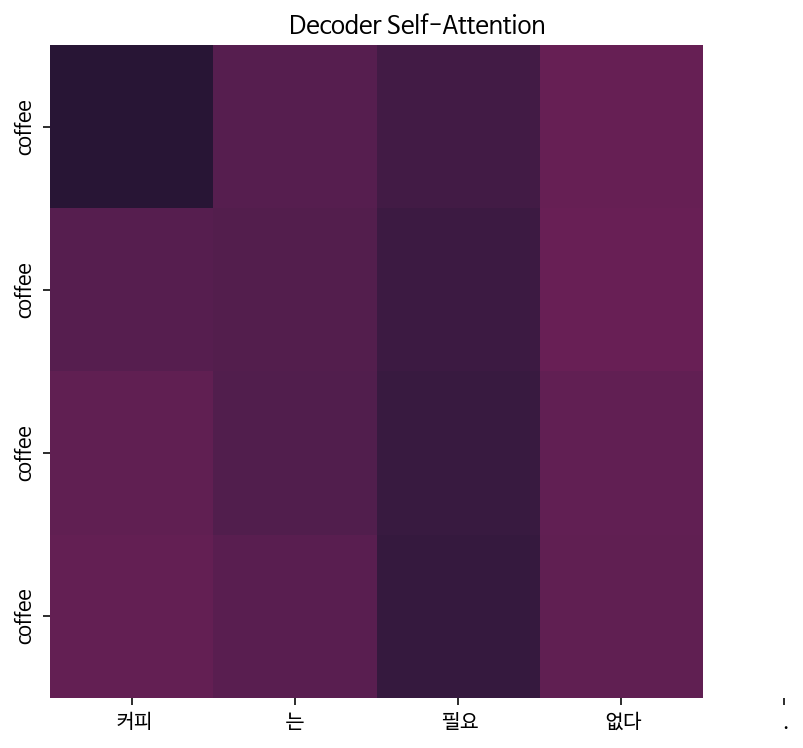

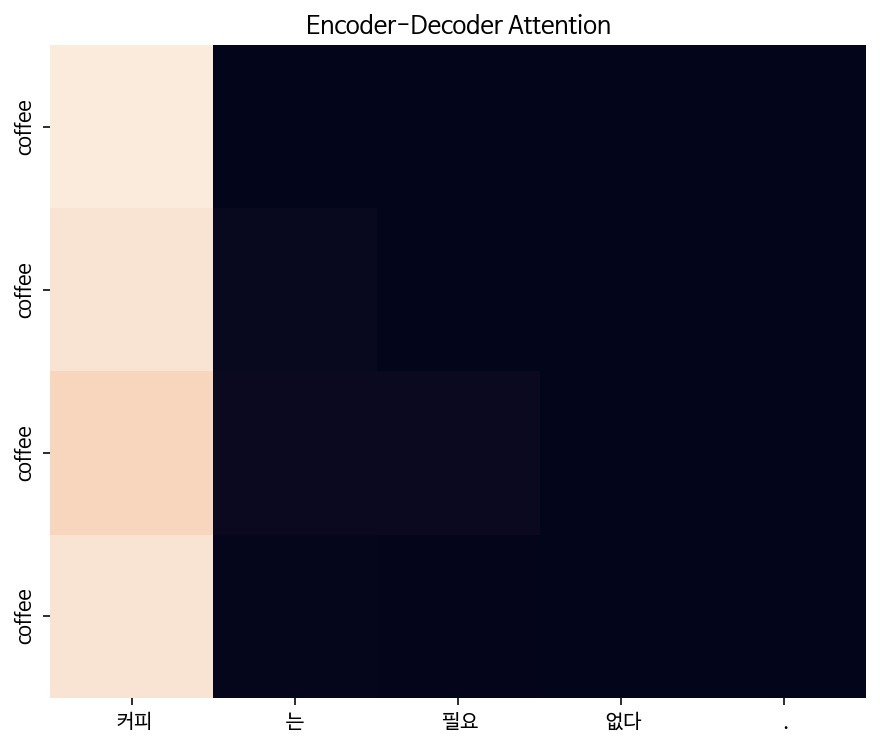

Input: 일곱 명의 사망자가 발생했다.
Predicted translation: civil civil civil civil de aid and two deaths .


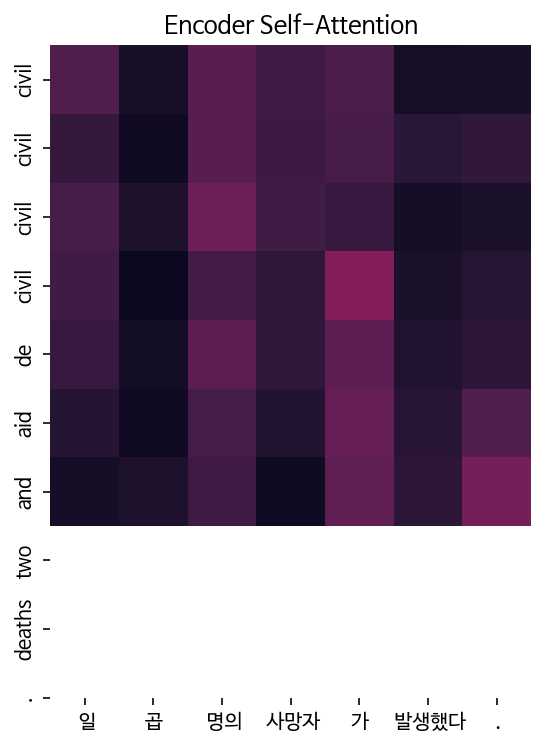

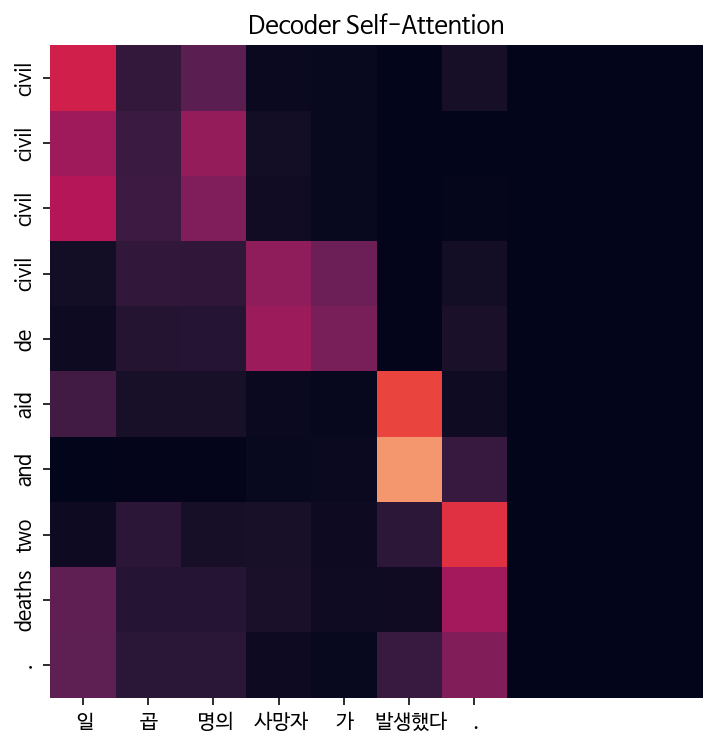

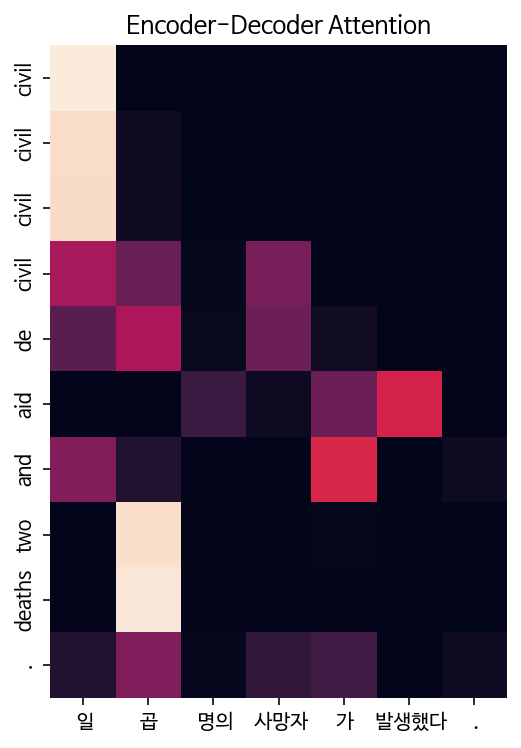

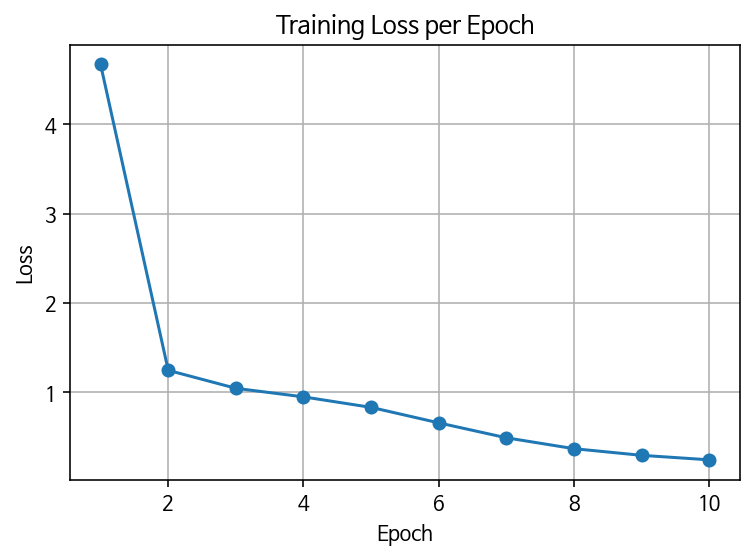

In [224]:
for epoch in range(EPOCHS):
    print(f"\nEpoch {epoch + 1}/{EPOCHS}")
    total_loss = 0

    for batch in tqdm(range(0, len(enc_train), BATCH_SIZE), desc=f"Epoch {epoch + 1}"):
        src_batch = enc_train[batch:batch + BATCH_SIZE]
        tgt_batch = dec_train[batch:batch + BATCH_SIZE]

        batch_loss, _, _, _ = train_step(src_batch, tgt_batch, transformer, optimizer)
        total_loss += batch_loss

    # Loss 계산 
    epoch_loss = total_loss / (len(enc_train) // BATCH_SIZE)
    losses.append(epoch_loss)
    print(f"Epoch {epoch + 1}, Loss: {epoch_loss:.4f}")

    # Translations and Visualizations
    print("\n### Translations and Visualizations ###")
    for sentence in sentences:
        pieces, result, enc_attns, dec_attns, enc_dec_attns = evaluate(
            sentence,
            transformer,
            ko_tokenizer,
            en_tokenizer,
            temperature=0.8,
            top_k=50, # 혹시 50이 너무 많을까? 
            top_p=0.9
        )
        print(f"Input: {sentence}")
        print(f"Predicted translation: {result}")
        visualize_attention(pieces, result.split(), enc_attns, dec_attns, enc_dec_attns)

# Loss Graph
plt.plot(range(1, EPOCHS + 1), losses, marker='o')
plt.title('Training Loss per Epoch')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.grid()
plt.show()

* 층을 6개로 늘렸다지만, epoch은 동일하게 10번이라 아마 성능이 더 안 좋을 수도 있다고 생각했는데 정말로 그런듯 싶다.
* 역시나 loss는 이상할 정도로 잘 떨어진다. 
* 역시나 번역 결과는 이상할 정도로 안 나온다. 
* 역시나 seven : several? coffee, obama, civil 등 연관있는 단어만 보일 뿐, 맥락은 전혀 생성 못하고 있다.
* 동일 반복을 막기 위해 여러 sampling 기법을 활용했는데 아마 더 강하게 규제를 했어야 했나 싶다. 큰 효용이 없다. 

### n_layer =6, Beam Search

In [39]:
# Attention 시각화 함수 (예제당 3개만)
def visualize_attention(src, tgt, enc_attns, dec_attns, enc_dec_attns):
    def draw(data, title):
        plt.figure(figsize=(8, 6))
        sns.heatmap(data, vmin=0.0, vmax=1.0, square=True, cbar=False, xticklabels=src, yticklabels=tgt)
        plt.title(title)
        plt.show()

    # Encoder Self-Attention
    draw(enc_attns[-1][0, 0, :len(src), :len(src)], "Encoder Self-Attention")

    # Decoder Self-Attention
    draw(dec_attns[-1][0, 0, :len(tgt), :len(tgt)], "Decoder Self-Attention")

    # Encoder-Decoder Attention
    draw(enc_dec_attns[-1][0, 0, :len(tgt), :len(src)], "Encoder-Decoder Attention")


# Evaluate 함수 - Beam Search 적용
def evaluate(sentence, model, src_tokenizer, tgt_tokenizer, beam_width=5):
    sentence = preprocess_sentence(sentence)
    pieces = src_tokenizer.encode_as_pieces(sentence)
    tokens = src_tokenizer.encode_as_ids(sentence)

    _input = tf.keras.preprocessing.sequence.pad_sequences([tokens], maxlen=enc_train.shape[-1], padding='post')

    output_sequences = [[tgt_tokenizer.bos_id()]]  # Beam Search 초기 출력
    scores = [0.0]  # 초기 점수 (float dtype으로 초기화)

    for _ in range(dec_train.shape[-1]):
        all_candidates = []

        for i, seq in enumerate(output_sequences):
            output_padded = tf.keras.preprocessing.sequence.pad_sequences([seq], maxlen=dec_train.shape[-1], padding='post')

            enc_padding_mask, combined_mask, dec_padding_mask = generate_masks(_input, output_padded)

            predictions, enc_attns, dec_attns, enc_dec_attns = model(
                _input,
                output_padded,
                enc_padding_mask,
                combined_mask,
                dec_padding_mask
            )

            logits = predictions[0, len(seq) - 1, :]
            top_k_values, top_k_indices = tf.math.top_k(logits, k=beam_width)

            for k in range(beam_width):
                candidate = seq + [int(top_k_indices[k].numpy())]  # 정수형 변환
                candidate_score = scores[i] + float(top_k_values[k].numpy())  # score 계산 
                all_candidates.append((candidate, candidate_score))

        # 상위 Beam-Width 개의 후보(윈도우?) 선택 
        all_candidates = sorted(all_candidates, key=lambda x: x[1], reverse=True)[:beam_width]
        output_sequences, scores = zip(*all_candidates)

        # EOS 토큰을 만나면 중단
        if all(seq[-1] == tgt_tokenizer.eos_id() for seq in output_sequences):
            break

    # 최종 결과 선택
    best_sequence = output_sequences[0]  # 가장 높은 점수의 시퀀스 선택
    result = tgt_tokenizer.decode_ids(best_sequence[1:])  # BOS 토큰 제외
    return pieces, result, enc_attns, dec_attns, enc_dec_attns

In [40]:
# 초기화 
transformer = Transformer(
    n_layers=n_layers,
    d_model=d_model,
    n_heads=n_heads,
    d_ff=d_ff,
    src_vocab_size=ko_tokenizer.get_piece_size(),
    tgt_vocab_size=en_tokenizer.get_piece_size(),
    pos_len=enc_train.shape[1],
    dropout=dropout
)

dummy_enc_in = tf.zeros((BATCH_SIZE, enc_train.shape[1]))
dummy_dec_in = tf.zeros((BATCH_SIZE, dec_train.shape[1]))
dummy_enc_mask, dummy_enc_dec_mask, dummy_dec_mask = generate_masks(dummy_enc_in, dummy_dec_in)
_ = transformer(dummy_enc_in, dummy_dec_in, dummy_enc_mask, dummy_enc_dec_mask, dummy_dec_mask)

optimizer = tf.keras.optimizers.Adam(
    learning_rate=learning_rate, beta_1=0.9, beta_2=0.98, epsilon=1e-9
)

@tf.function
def train_step(src, tgt, model, optimizer):
    gold = tgt[:, 1:]  # 실제 정답 (Shifted Right)
    enc_mask, dec_mask, enc_dec_mask = generate_masks(src, tgt)

    with tf.GradientTape() as tape:
        predictions, enc_attns, dec_attns, enc_dec_attns = model(
            src, tgt, enc_mask, dec_mask, enc_dec_mask
        )
        loss = loss_function(gold, predictions[:, :-1])

    # Gradient 계산 및 적용
    gradients = tape.gradient(loss, model.trainable_variables)
    optimizer.apply_gradients(zip(gradients, model.trainable_variables))

    return loss, enc_attns, dec_attns, enc_dec_attns


Epoch 1/15


Epoch 1:   0%|          | 0/1080 [00:00<?, ?it/s]

Epoch 1, Loss: 4.5954

### Translations and Visualizations ###
Input: 오바마는 대통령이다.
Predicted translation: 


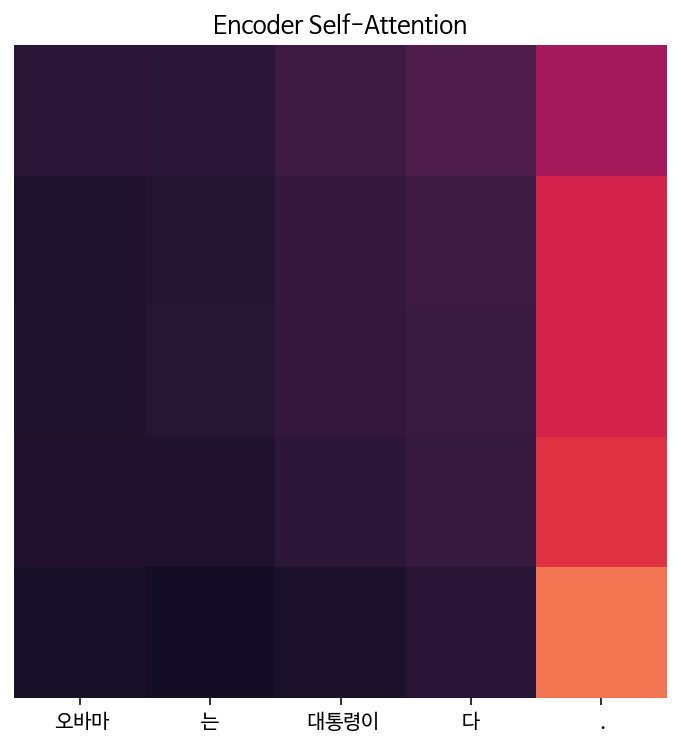

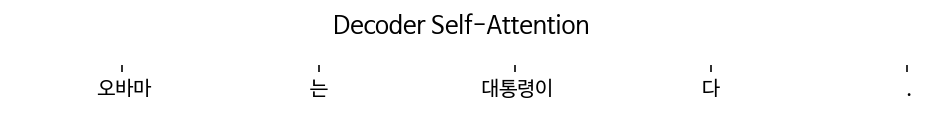

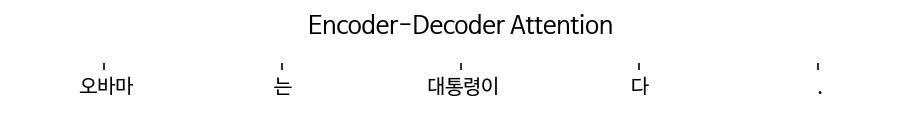

Input: 시민들은 도시 속에 산다.
Predicted translation: 


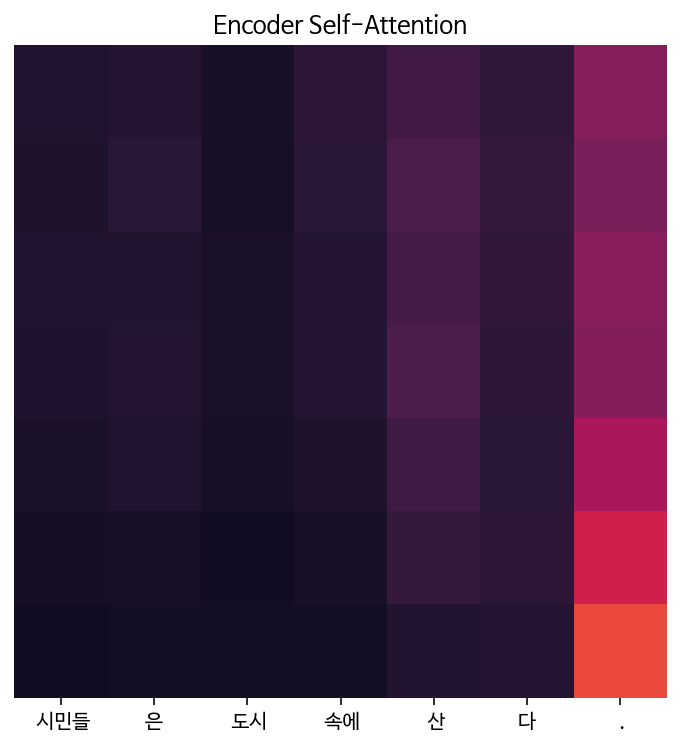

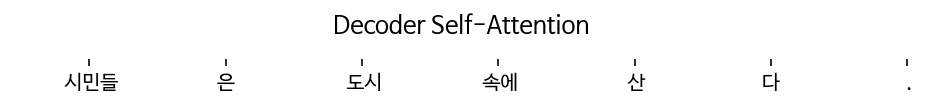

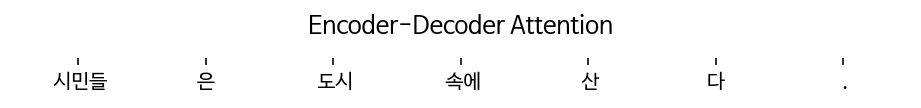

Input: 커피는 필요 없다.
Predicted translation: 


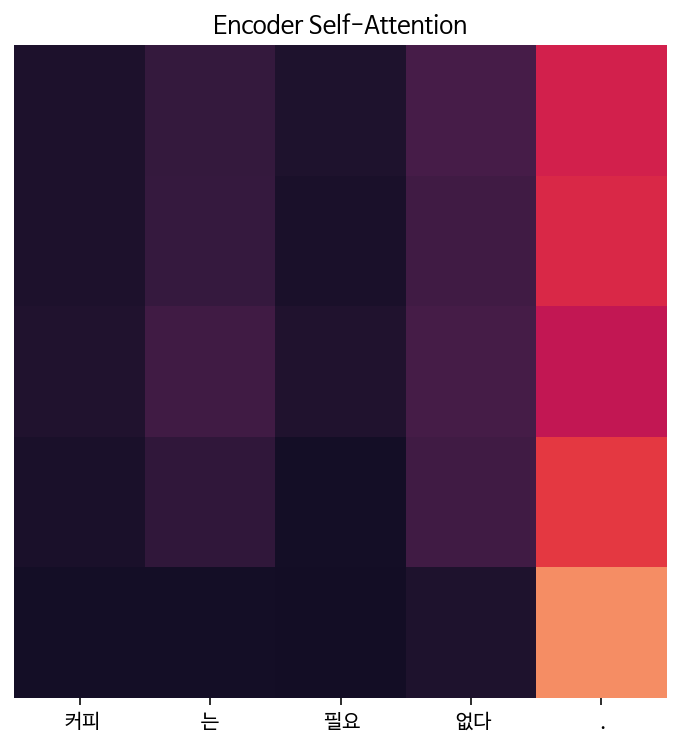

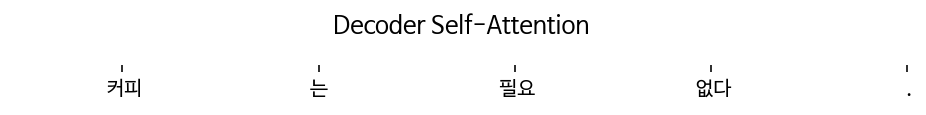

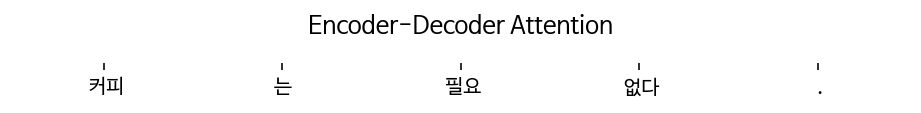

Input: 일곱 명의 사망자가 발생했다.
Predicted translation: .


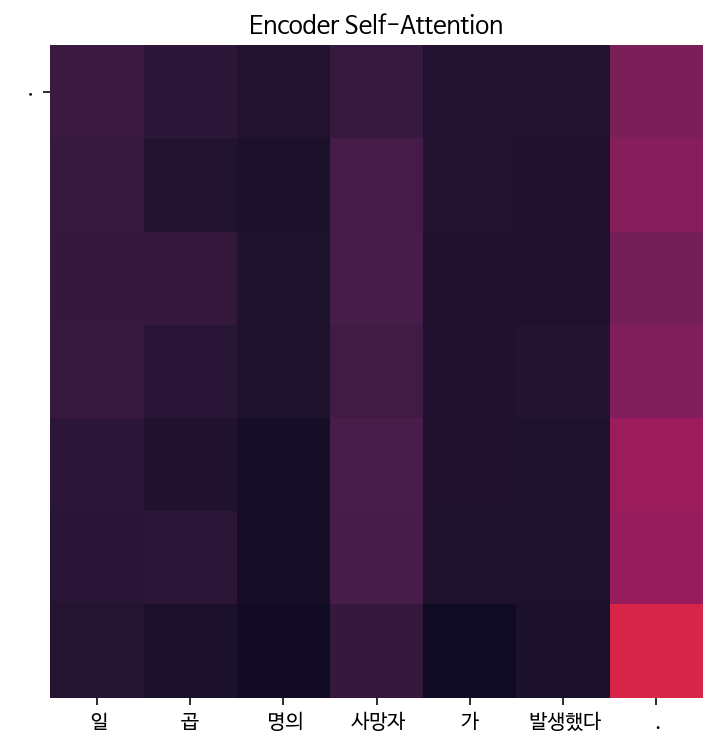

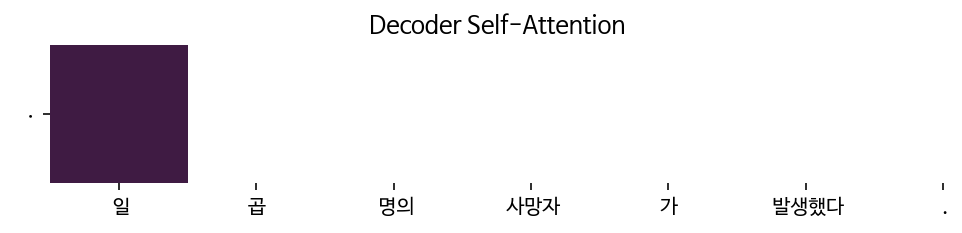

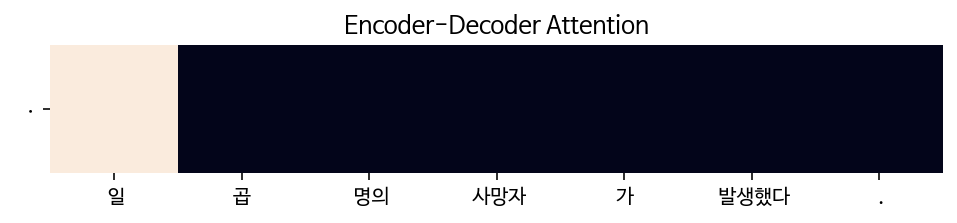


Epoch 2/15


Epoch 2:   0%|          | 0/1080 [00:00<?, ?it/s]

Epoch 2, Loss: 1.2338

### Translations and Visualizations ###
Input: 오바마는 대통령이다.
Predicted translation: .


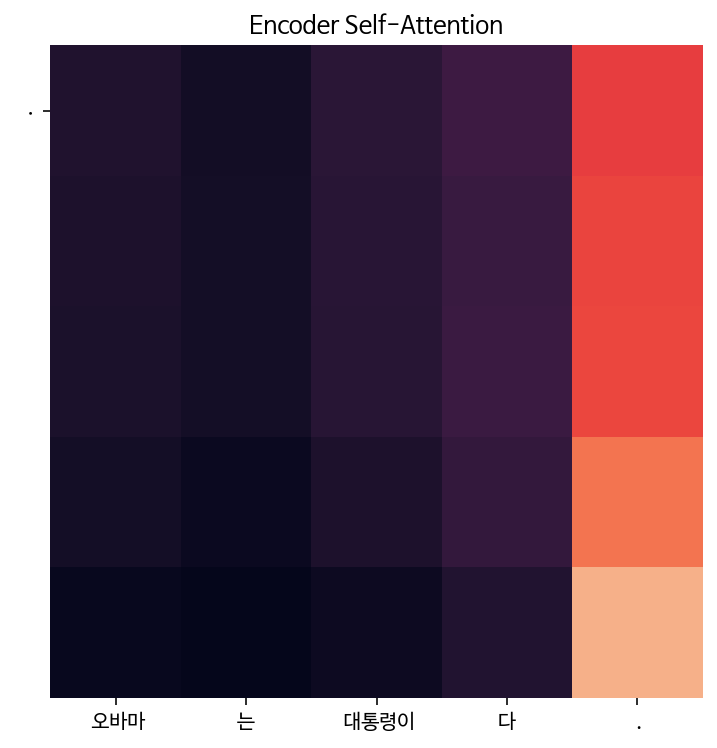

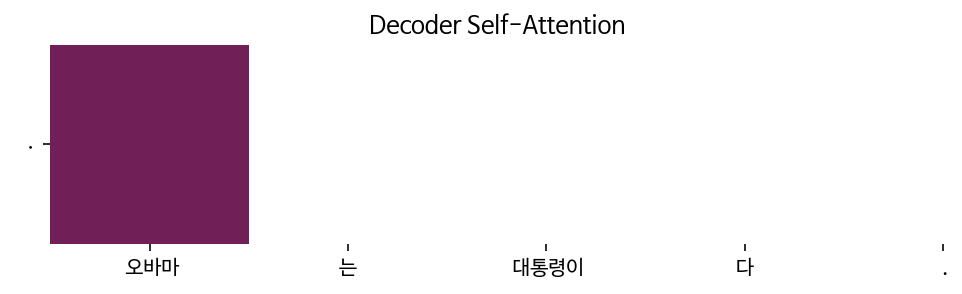

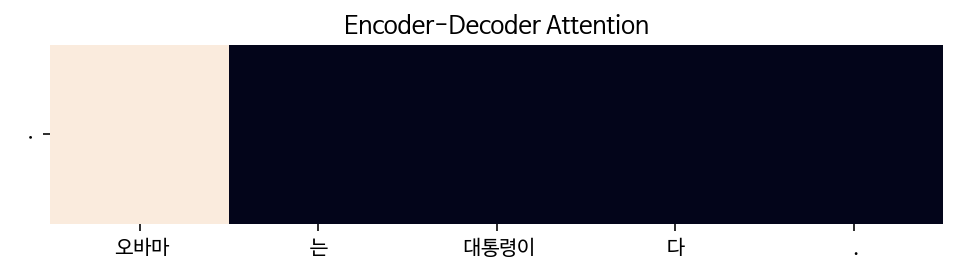

Input: 시민들은 도시 속에 산다.
Predicted translation: passengers passengers passengers passengers passengers . . fires . . a lot of a lot of a lot of a lot of a lot of a lot . a lot of a lot of a lot . . . .


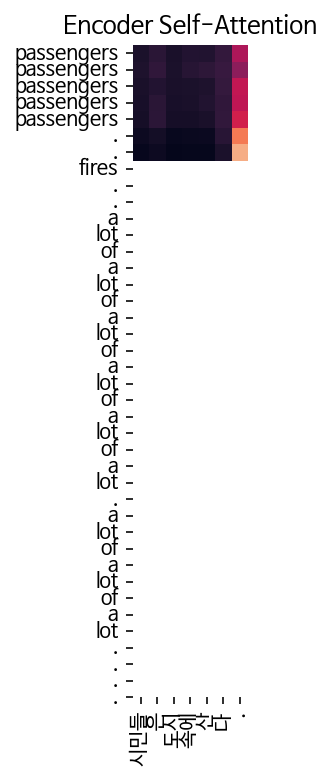

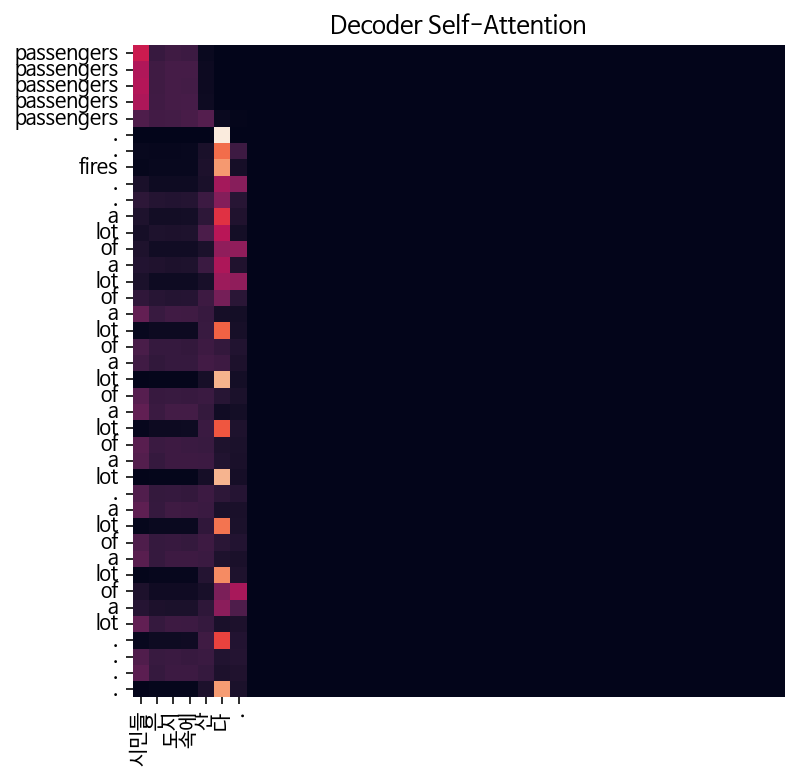

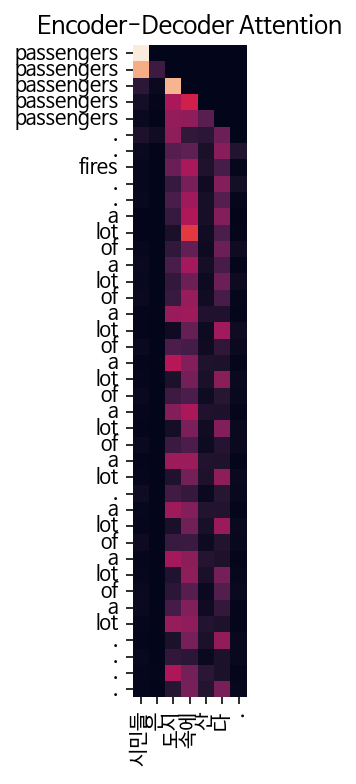

Input: 커피는 필요 없다.
Predicted translation: service service service service . . . . . . . . . . . . . . . . . . . . . . .


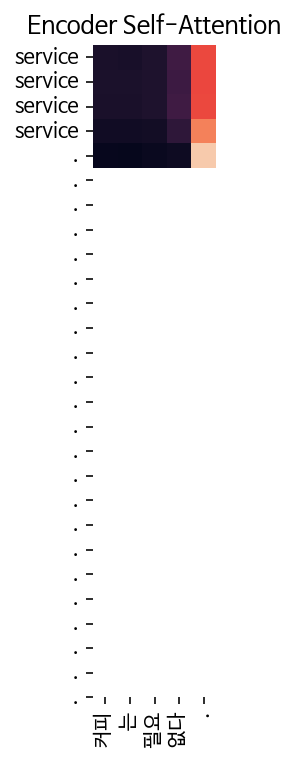

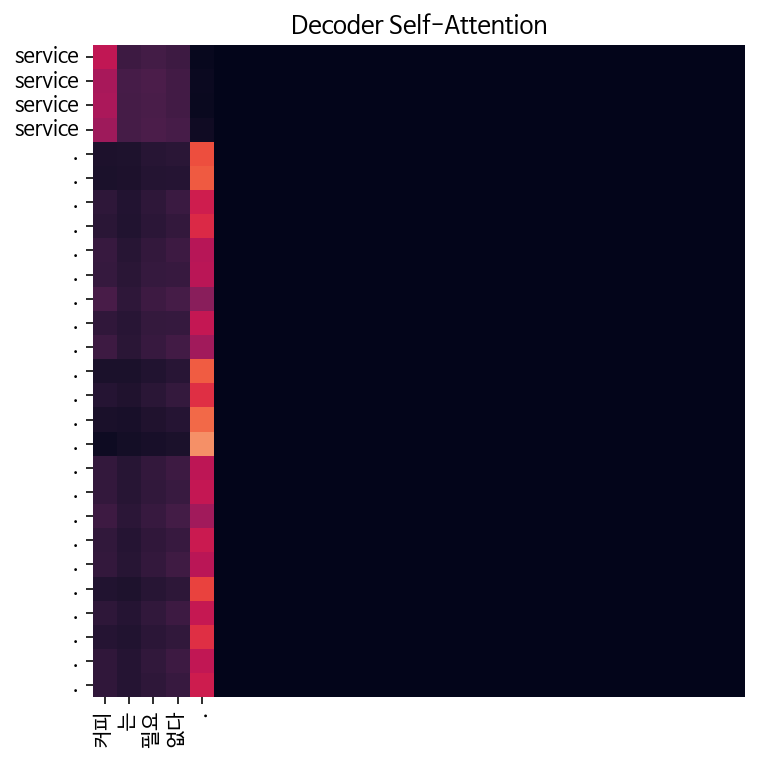

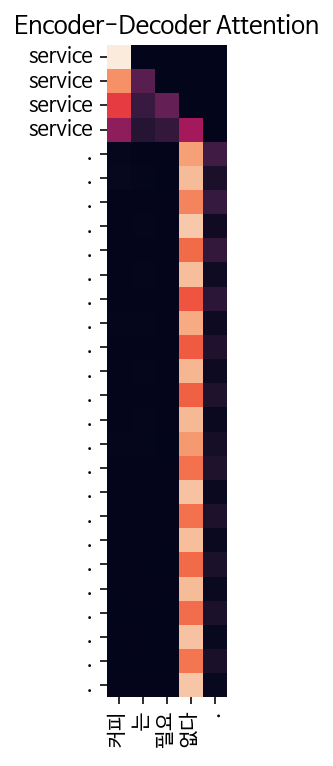

Input: 일곱 명의 사망자가 발생했다.
Predicted translation: sunday sunday sunday sunday . a medical centers . medical center . a lot of a medical center . people are missing . people . percent of a medical center . people . people . people .


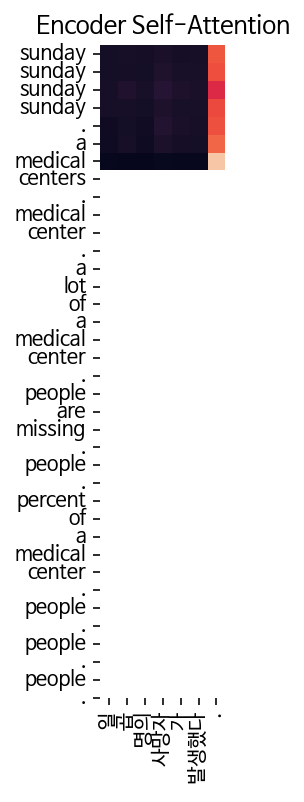

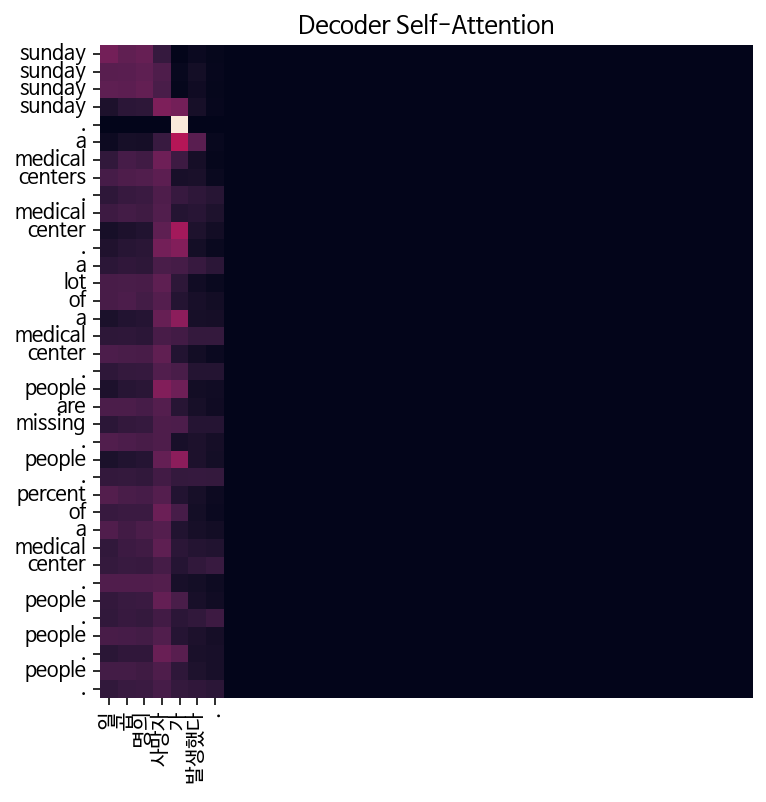

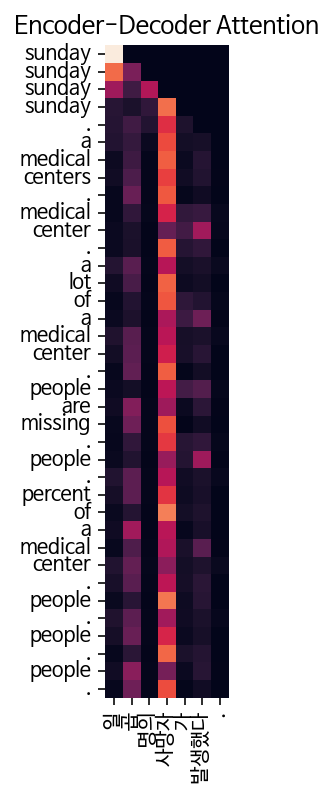


Epoch 3/15


Epoch 3:   0%|          | 0/1080 [00:00<?, ?it/s]

Epoch 3, Loss: 1.0377

### Translations and Visualizations ###
Input: 오바마는 대통령이다.
Predicted translation: obama obama obama obama . . . . . . . . . . . . . . . . . . . . . . .


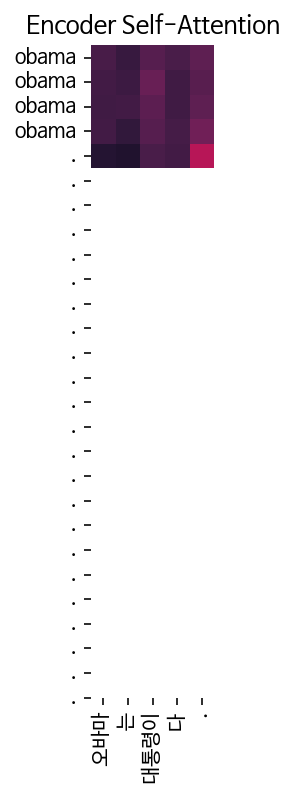

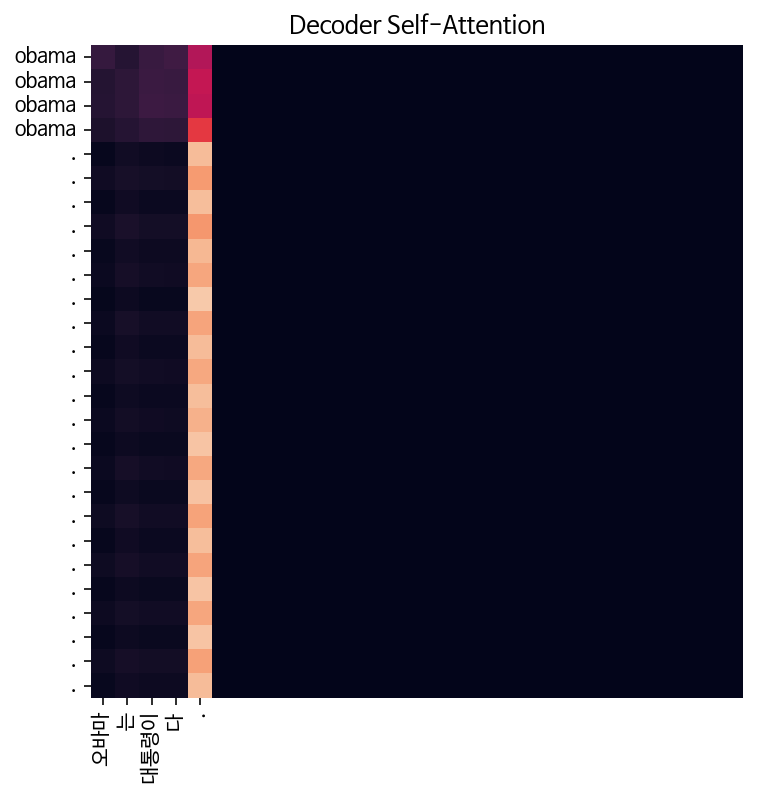

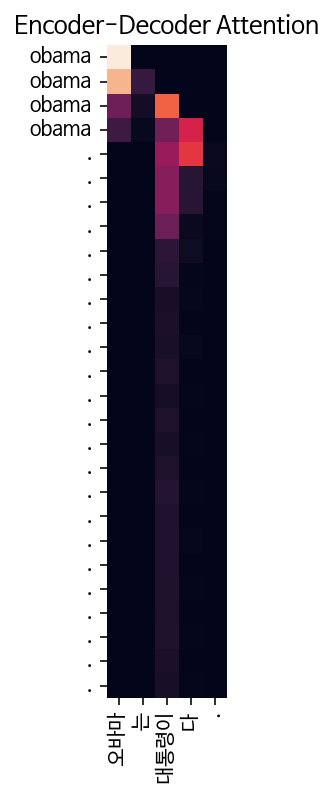

Input: 시민들은 도시 속에 산다.
Predicted translation: sound sound sound sound sounds . . . . . . . . . . . . . . . . . . . . . .


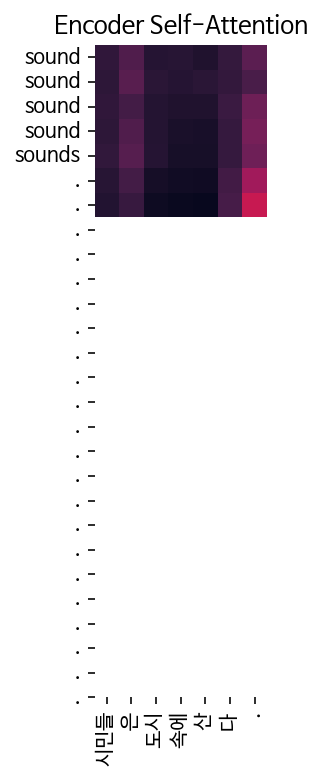

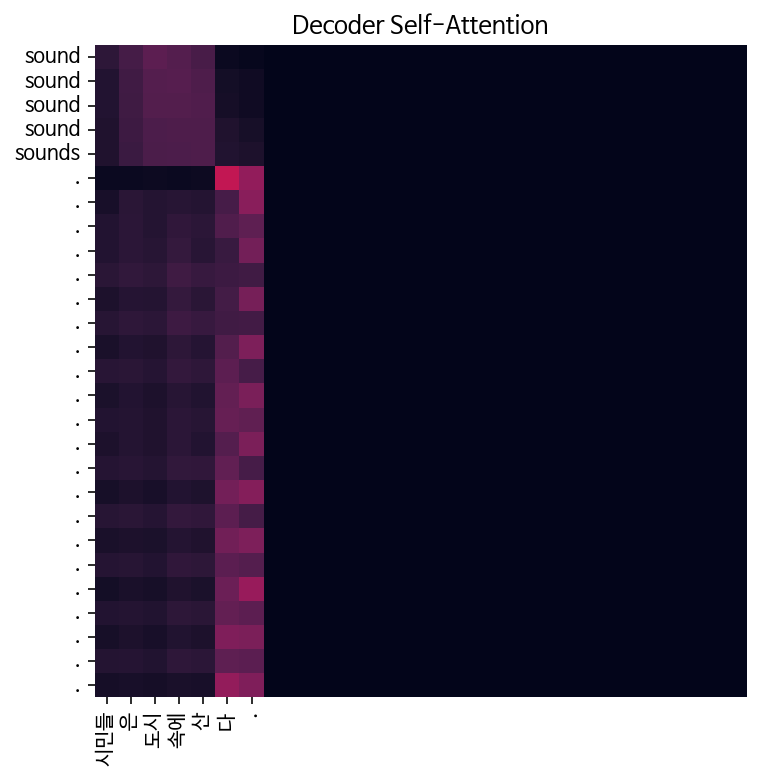

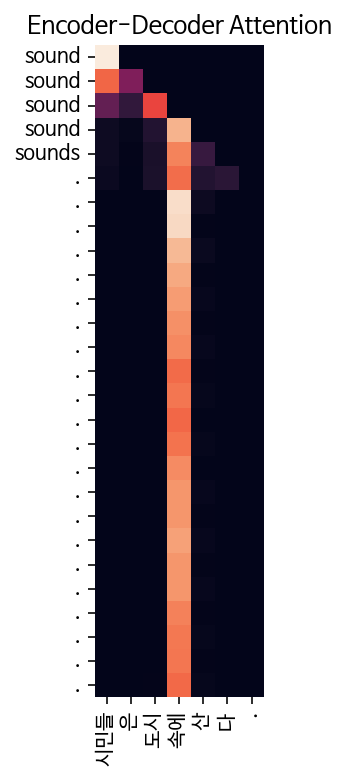

Input: 커피는 필요 없다.
Predicted translation: hundred hundred hundreds . . . . . . . . . . . . . . . . . . . . . . .


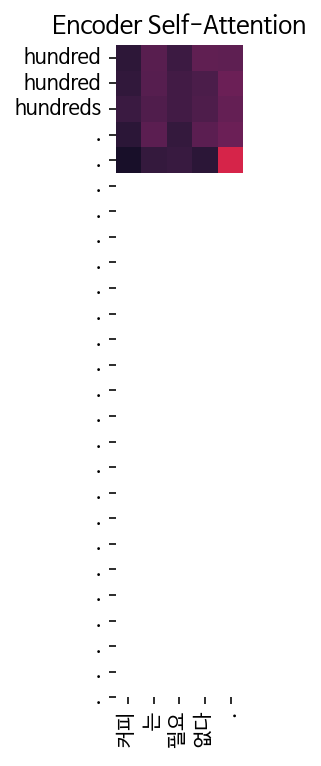

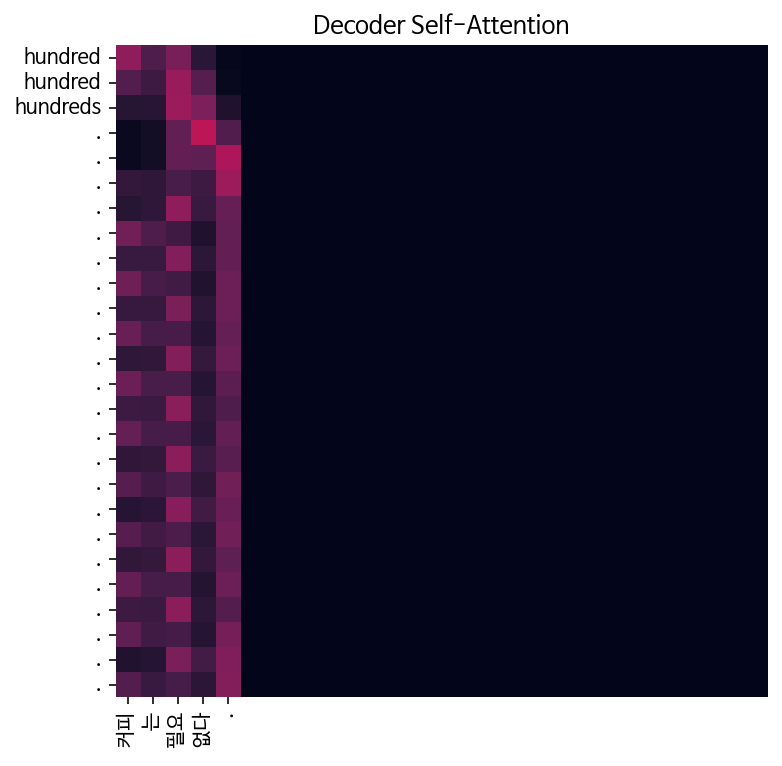

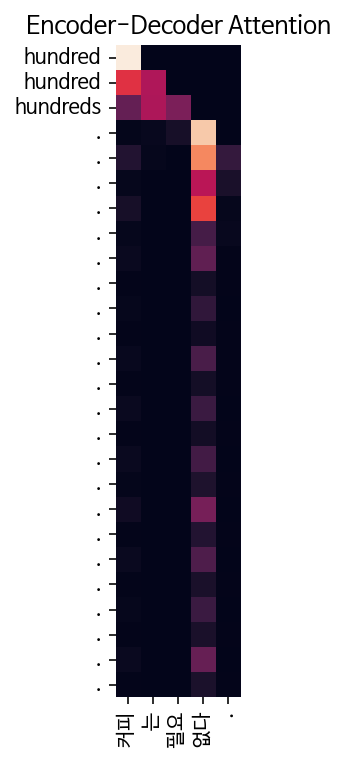

Input: 일곱 명의 사망자가 발생했다.
Predicted translation: sister sister sister sister . last year oldie said monday . sisters . s sisters . s sisters . s sisters . s sisters said monday . s sisters . s sisters said . s sisters . sister


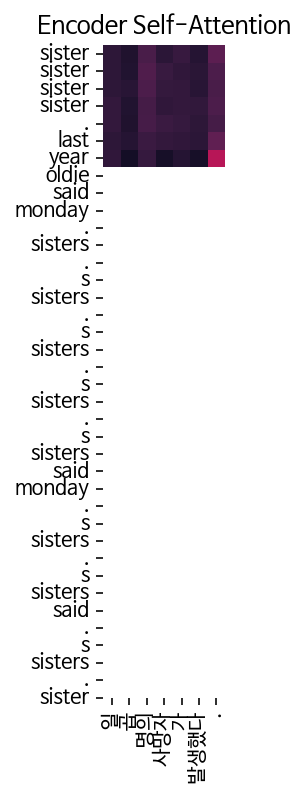

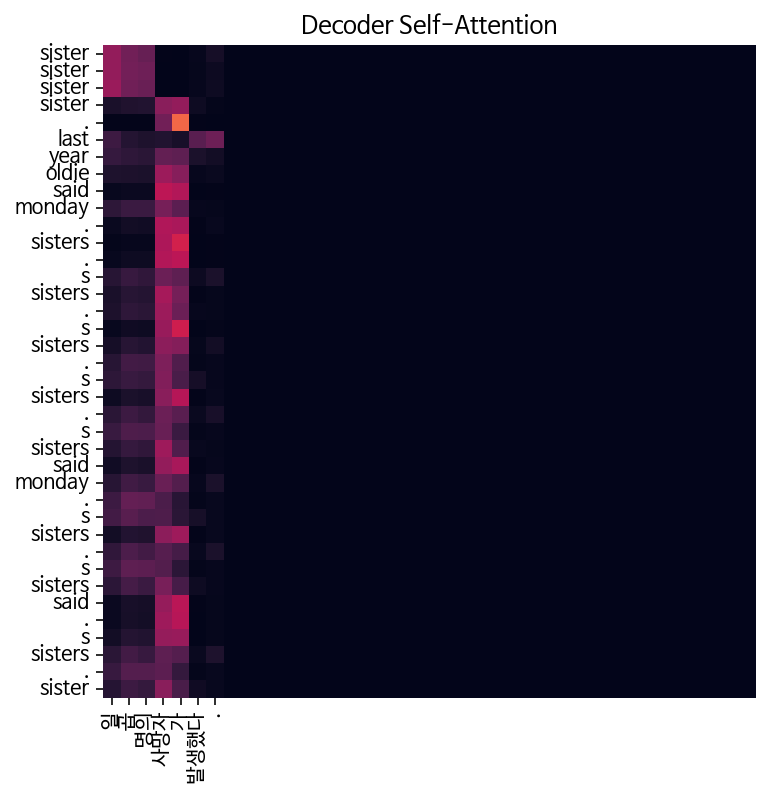

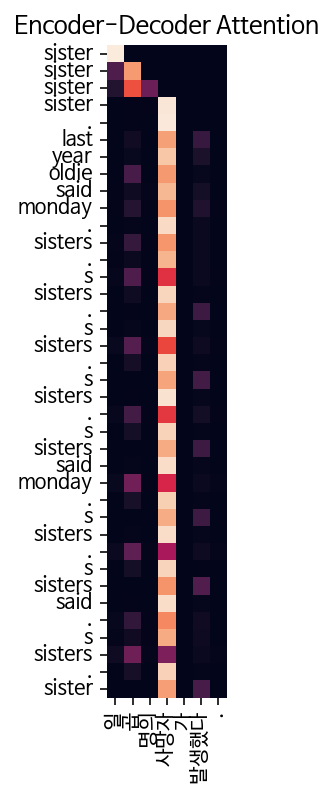


Epoch 4/15


Epoch 4:   0%|          | 0/1080 [00:00<?, ?it/s]

Epoch 4, Loss: 0.9416

### Translations and Visualizations ###
Input: 오바마는 대통령이다.
Predicted translation: carolina carolina carolina carolina with his supporters . a presidential presidential presidential presidential presidential presidential presidential presidential presidential presidential presidential presidential presidential presidential presidential presidential presidential presidential presidential presidential presidential presidential presidential presidential presidential presidential presidential presidential presidential presidential presidential presidential presidential presidential minister . .


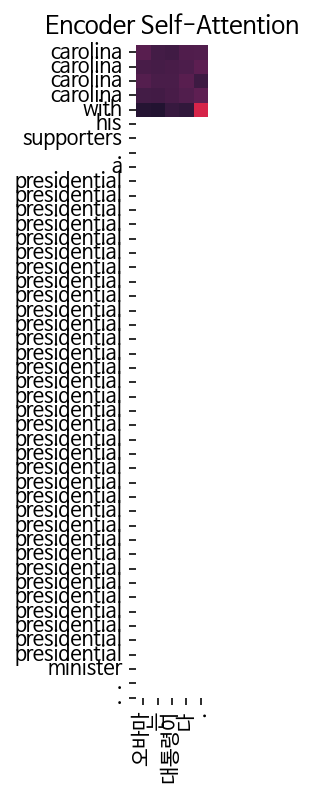

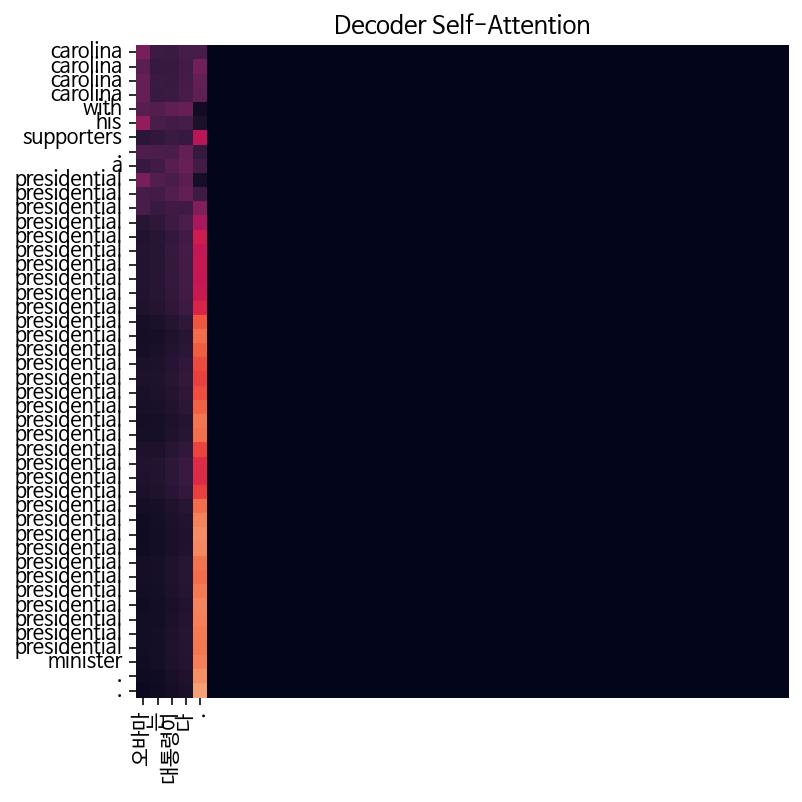

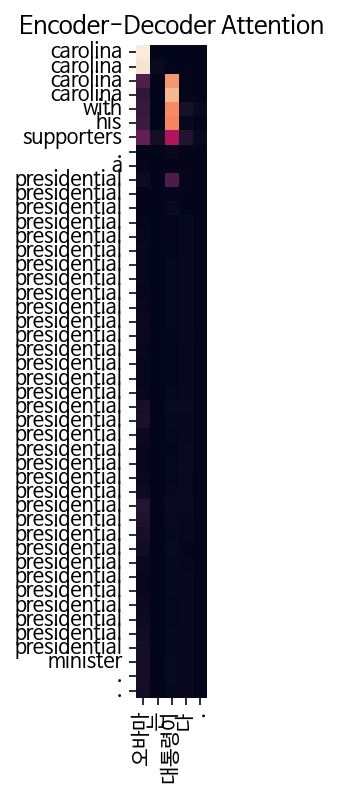

Input: 시민들은 도시 속에 산다.
Predicted translation: cat cat cat cat catlightlight . away . with away . away .


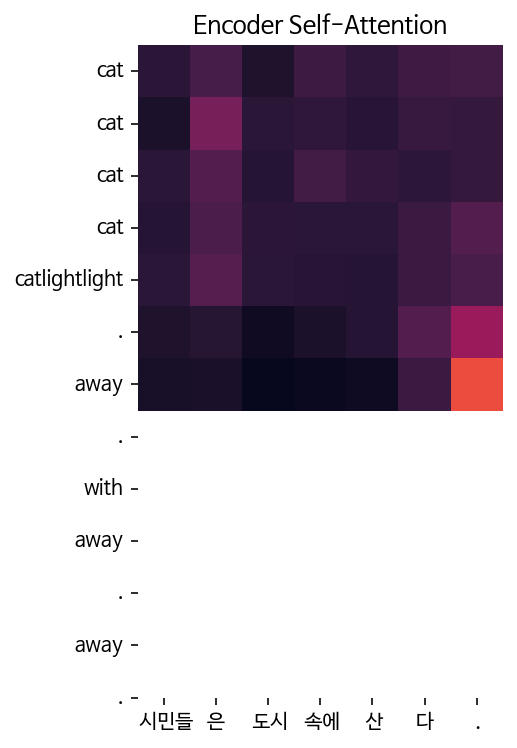

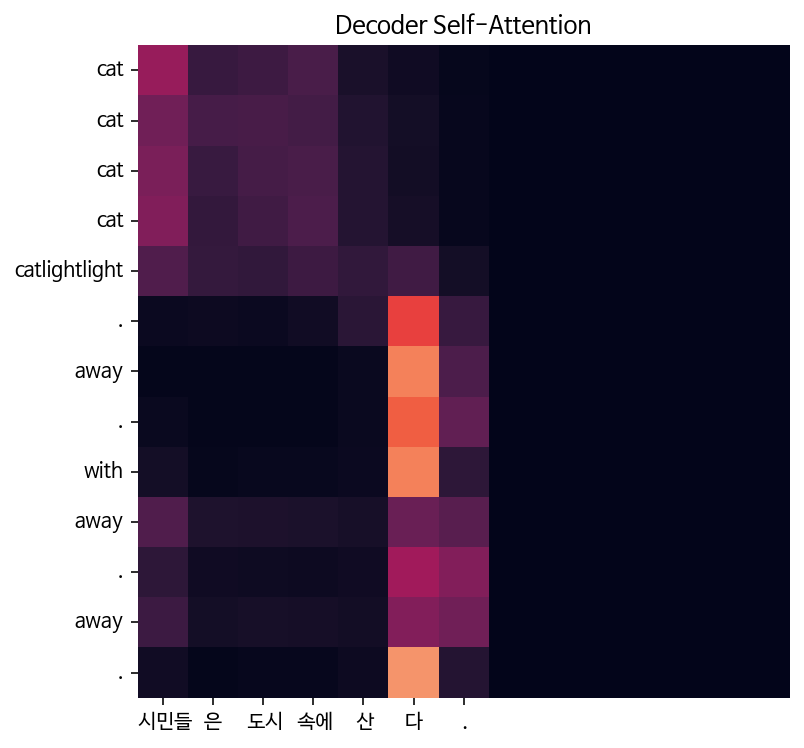

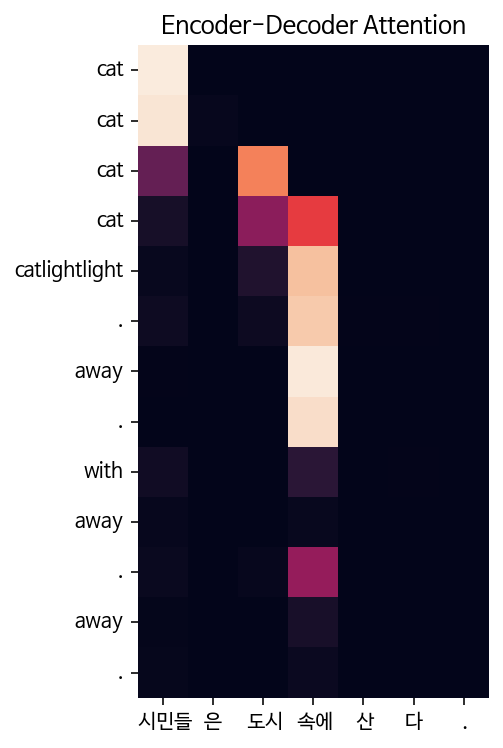

Input: 커피는 필요 없다.
Predicted translation: wildlife wildlife wildlife wildlife . outside a popular outside a popular outside a popular on a popular outside a popular development . a popular development . a popular . a dead its october . a long . conference . conference .


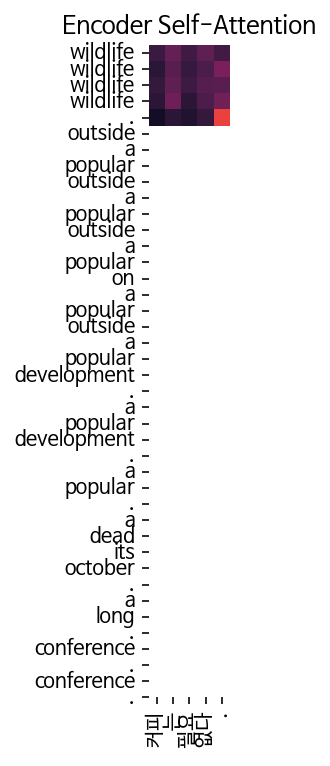

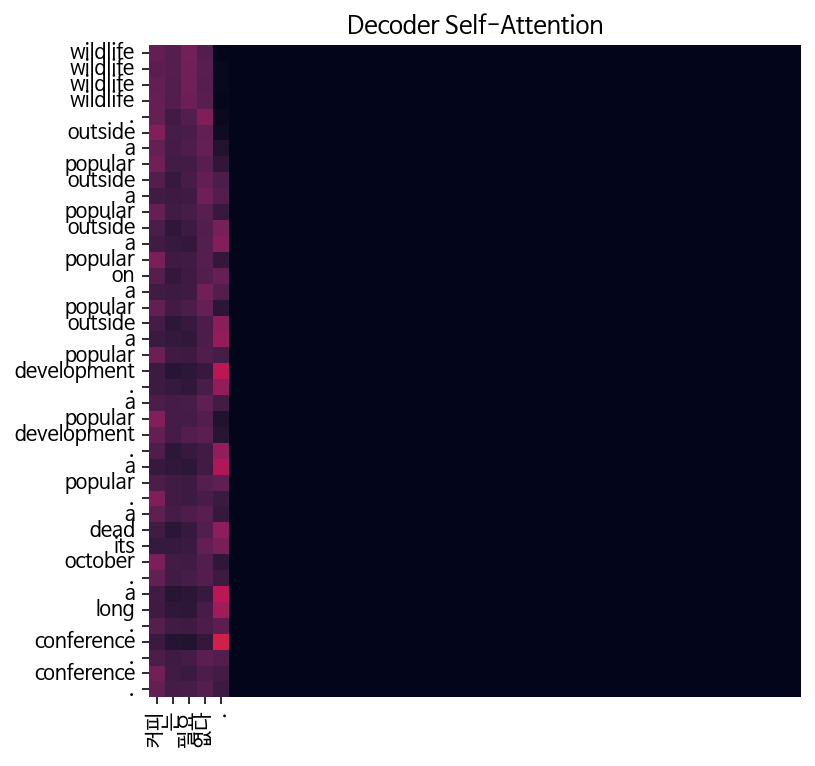

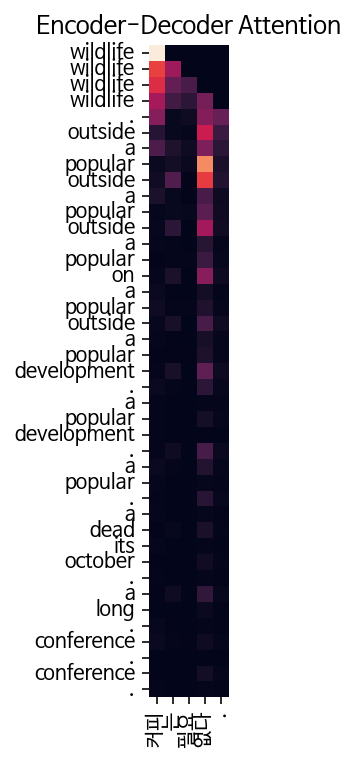

Input: 일곱 명의 사망자가 발생했다.
Predicted translation: sister sister sister sister based on monday . saturday monday . killed eight days . saturday . killed eight people dead days . eight days . . that killed dead days . saturday . sister .


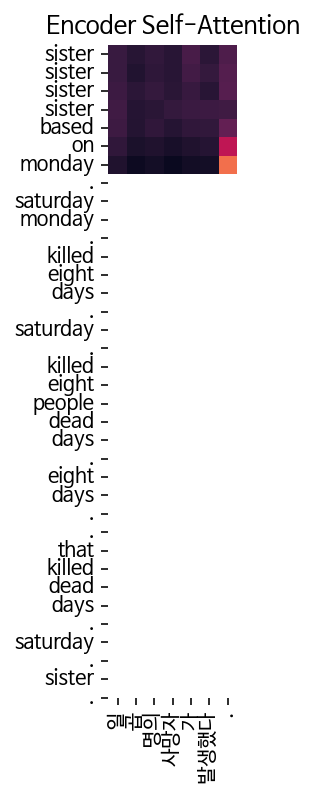

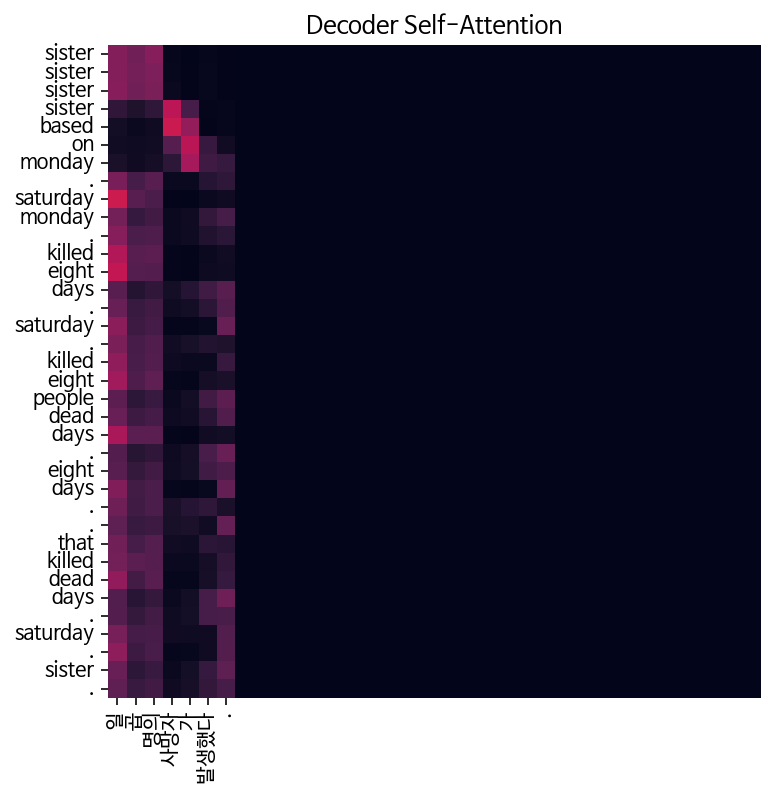

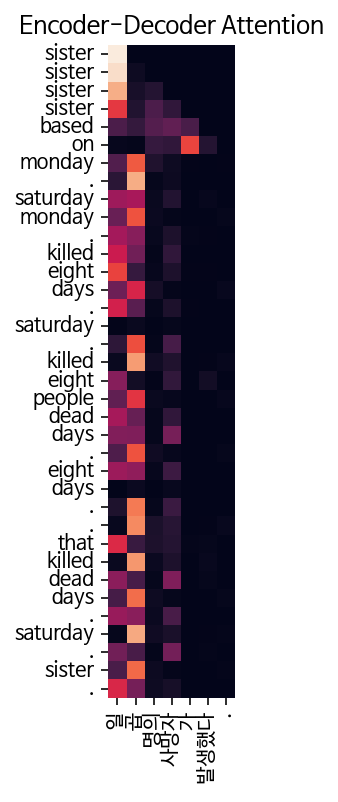


Epoch 5/15


Epoch 5:   0%|          | 0/1080 [00:00<?, ?it/s]

Epoch 5, Loss: 0.8249

### Translations and Visualizations ###
Input: 오바마는 대통령이다.
Predicted translation: american american american american says obama says . obama says obama says . obama says . obama says . obama says . obama says . obama says . obama says . obama says . obama says . obama says . obama says . obama says . obama says .


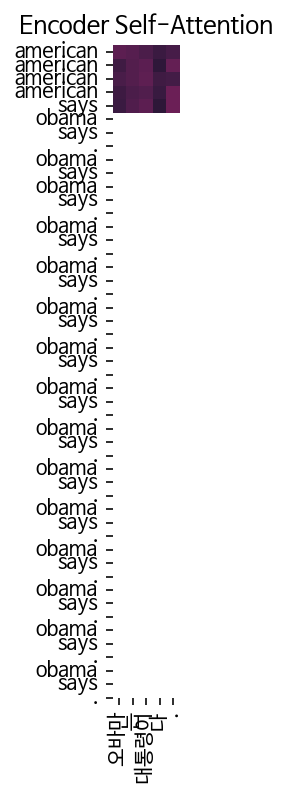

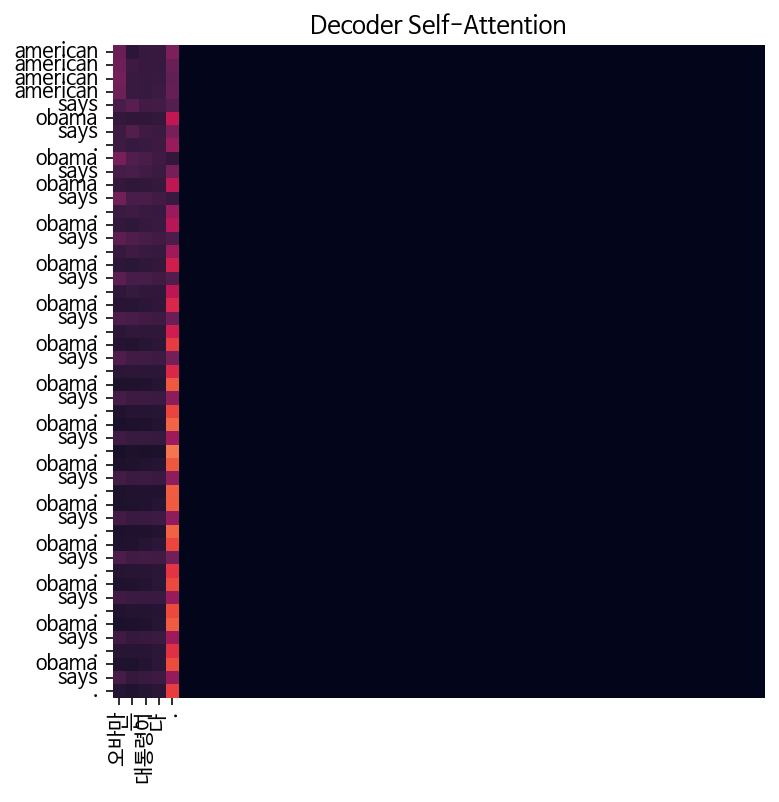

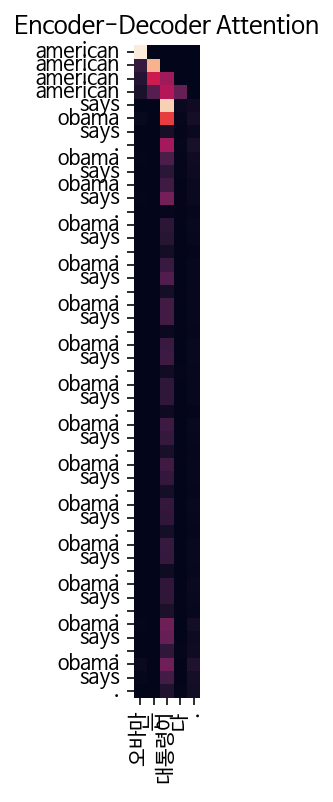

Input: 시민들은 도시 속에 산다.
Predicted translation: sky sky sky sky sky sky sky . . . minutes . sky . address . . . sky .s . sky . . . sky . sky .


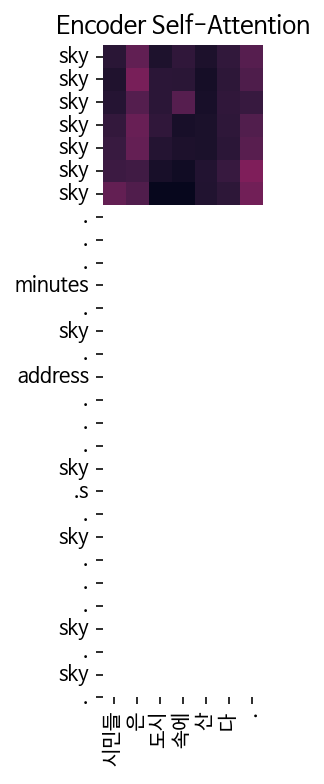

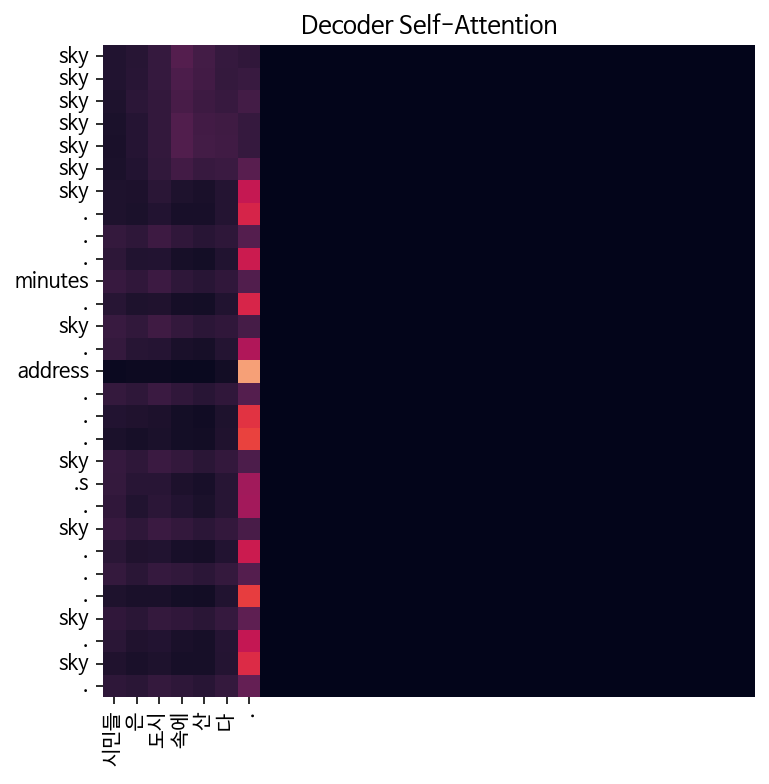

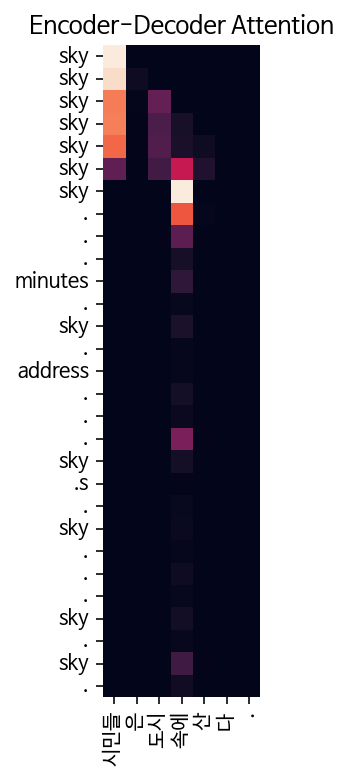

Input: 커피는 필요 없다.
Predicted translation: pentagon pentagon pentagon pentagon were pentagon capitol capitol addition addition addition addition addition addition addition addition addition addition proud proud addition proud


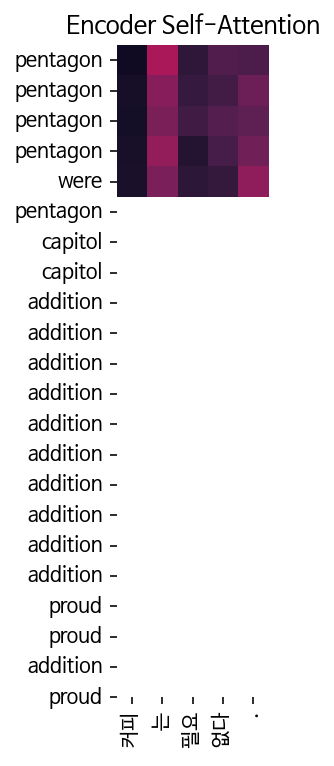

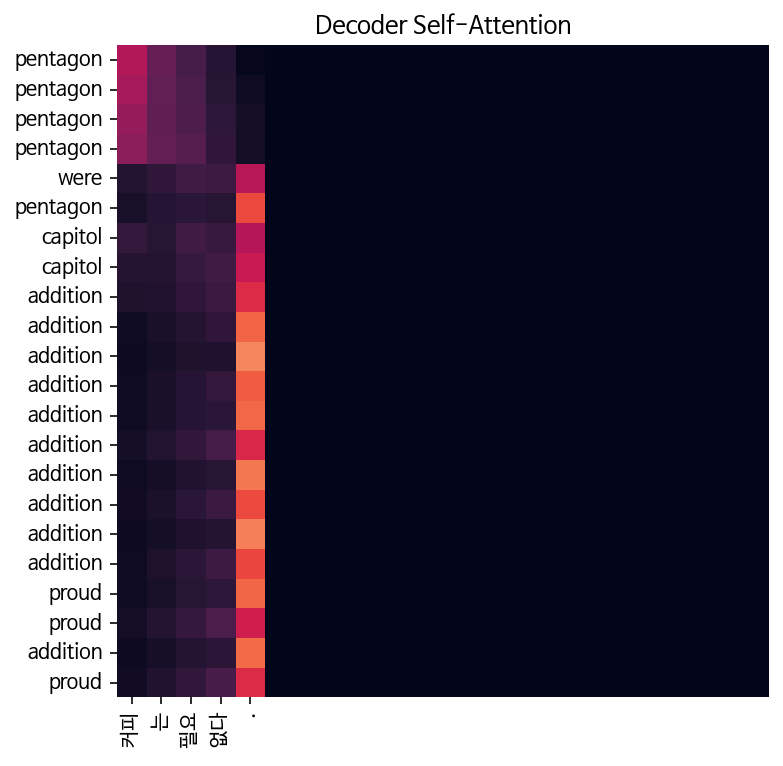

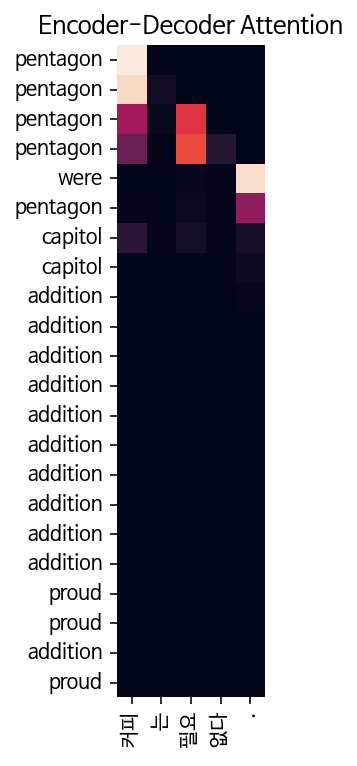

Input: 일곱 명의 사망자가 발생했다.
Predicted translation: children children killing killing killing three children reported tuesday . reported reported tuesday . reported tuesday . reported . reported thursday reported . . reported tuesday . . . reported . . reported . . .


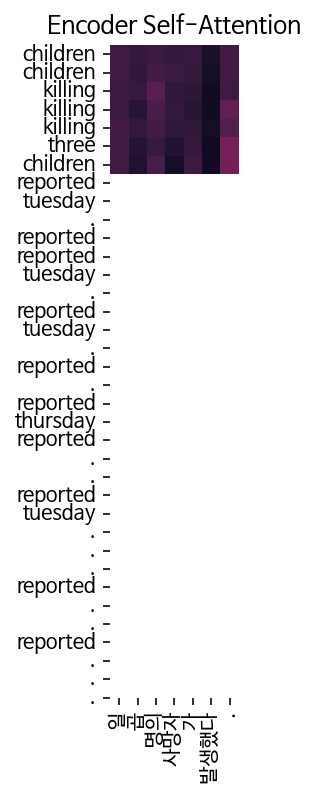

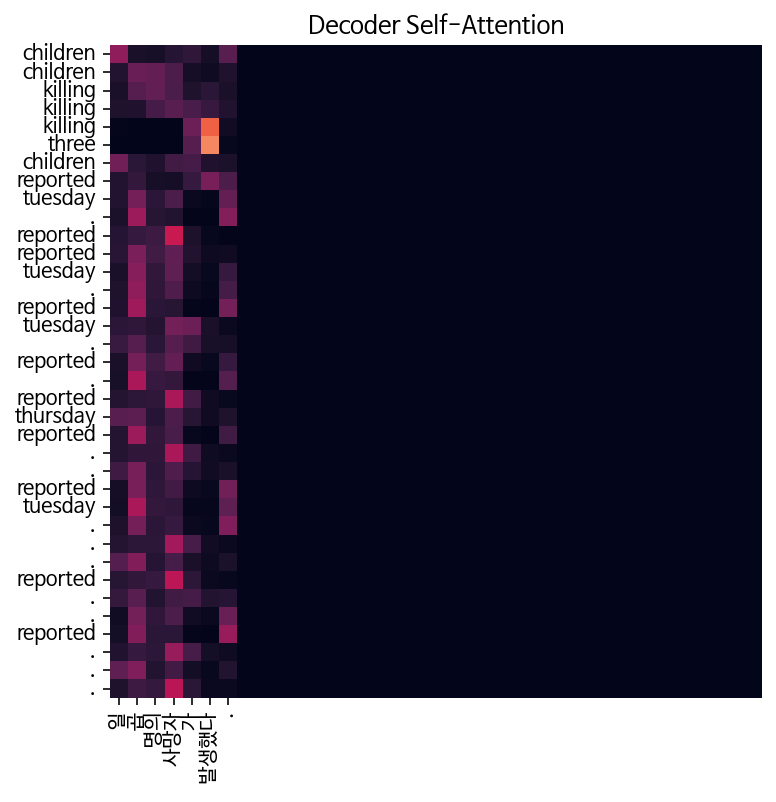

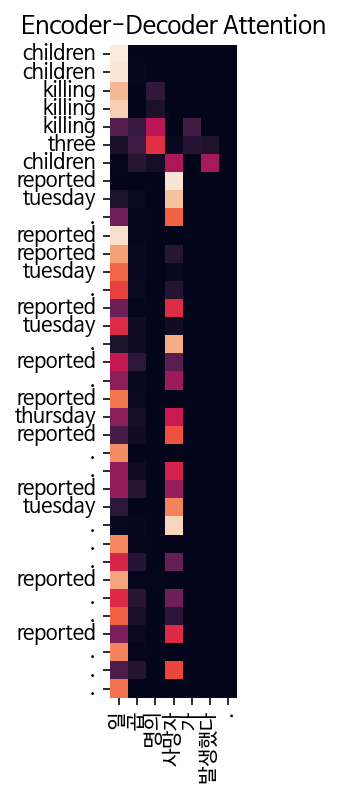


Epoch 6/15


Epoch 6:   0%|          | 0/1080 [00:00<?, ?it/s]

Epoch 6, Loss: 0.6499

### Translations and Visualizations ###
Input: 오바마는 대통령이다.
Predicted translation: following following following following a lead . lead . bid . bid . bid . bid . issue . bid . issue . bid . bid . bid . bid . bid . . .


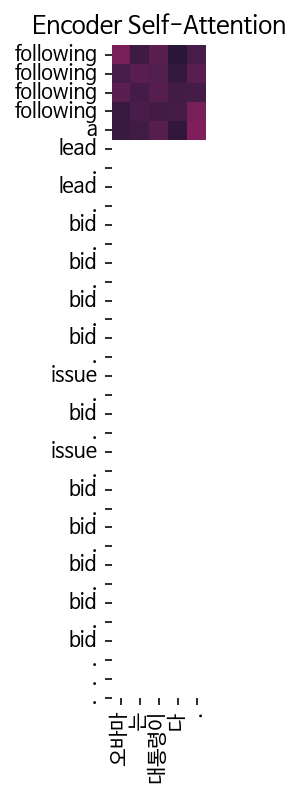

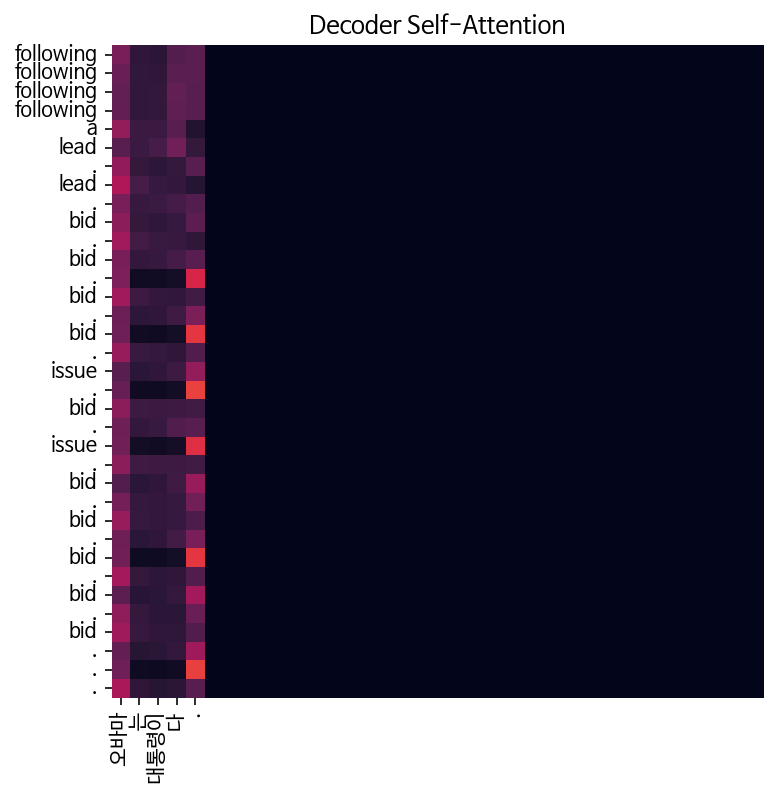

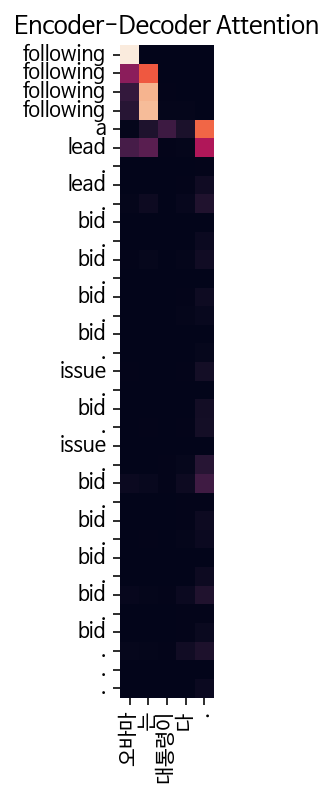

Input: 시민들은 도시 속에 산다.
Predicted translation: ho ho ho ho ho restrictions . buildings . . . . . . . . . . . . . . . . . . . .


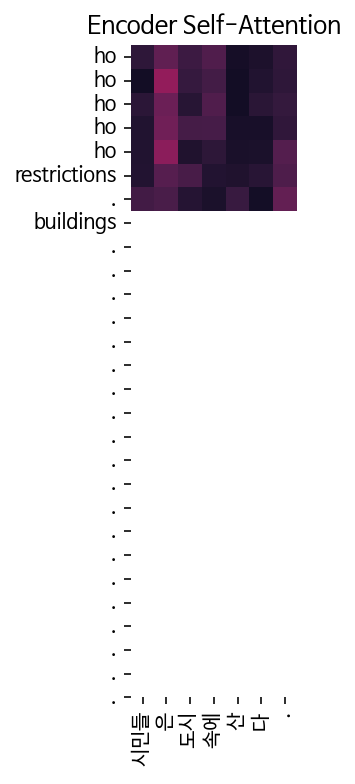

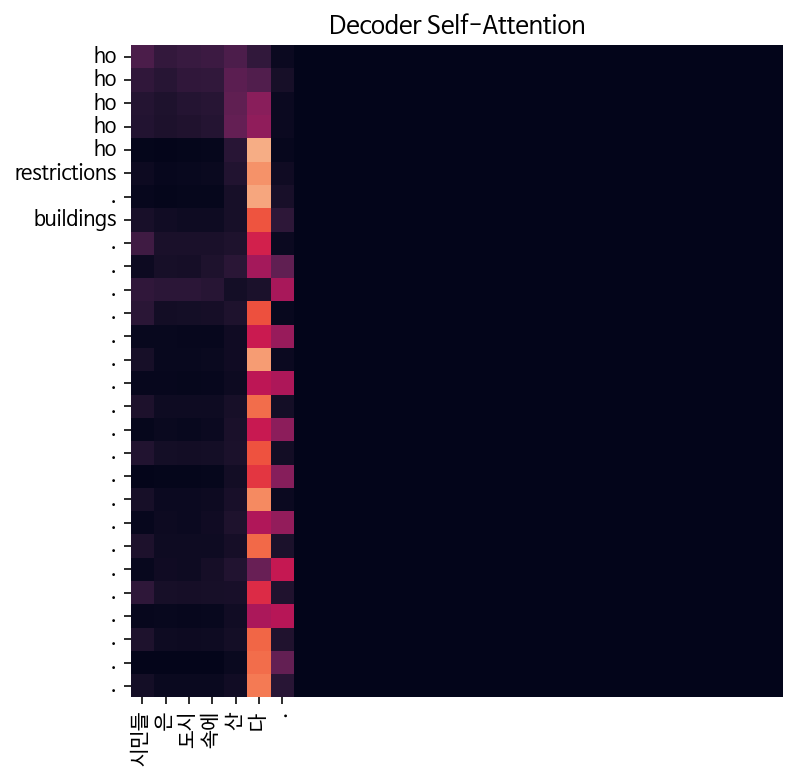

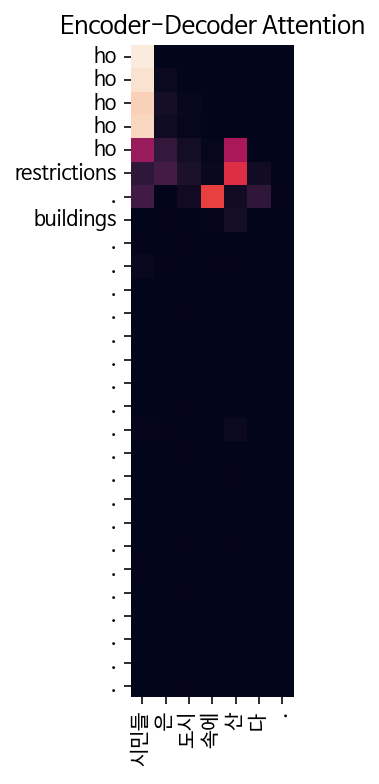

Input: 커피는 필요 없다.
Predicted translation: electric electric electric electric weight . a letter . . a letter . a letter . . . coffee a coffee . s second


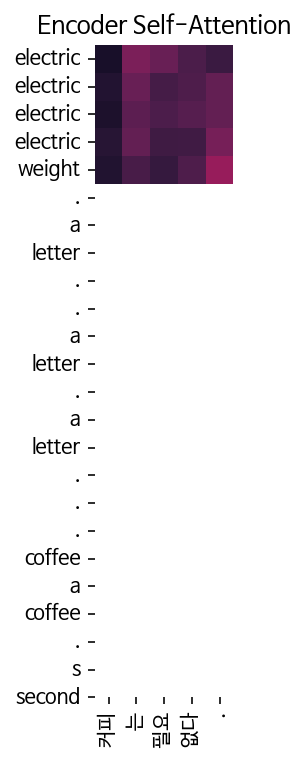

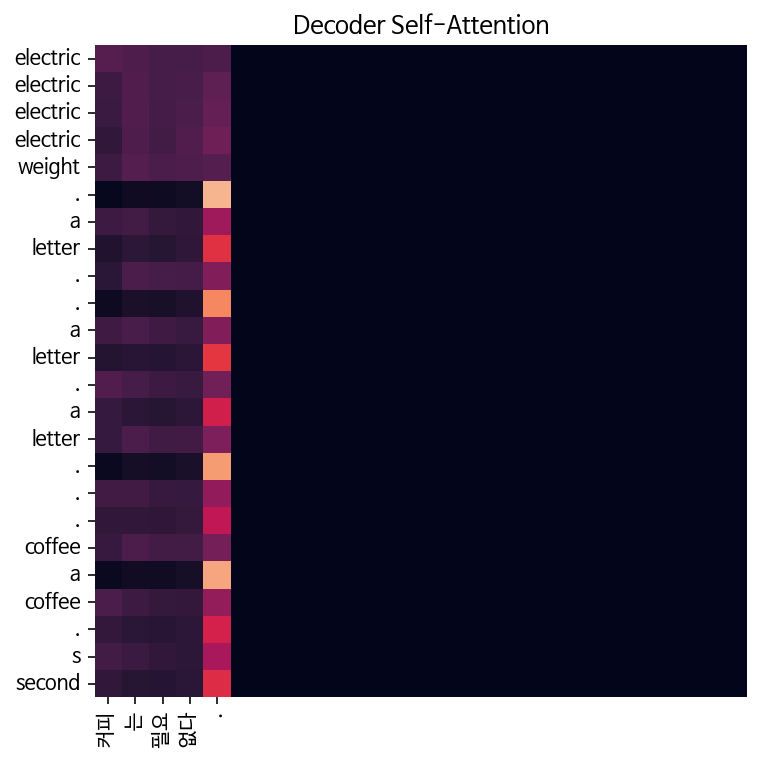

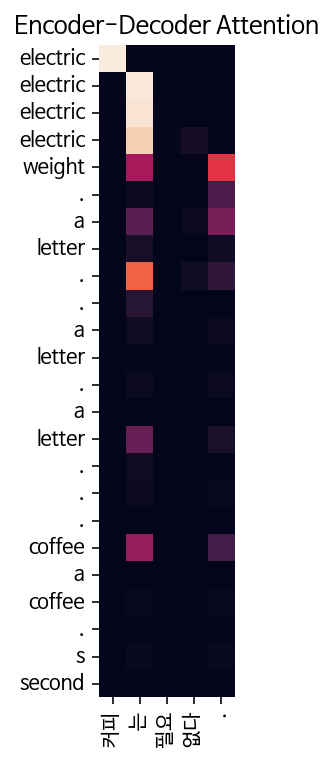

Input: 일곱 명의 사망자가 발생했다.
Predicted translation: club club club club overall children . two years at , most of seven people . two people . two wonderie said . two people . . . . . . two years . . .


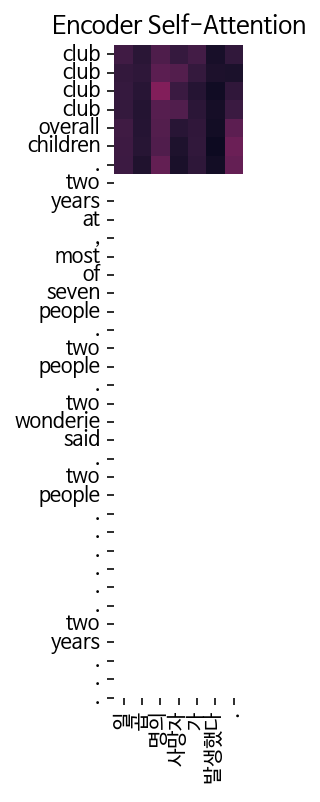

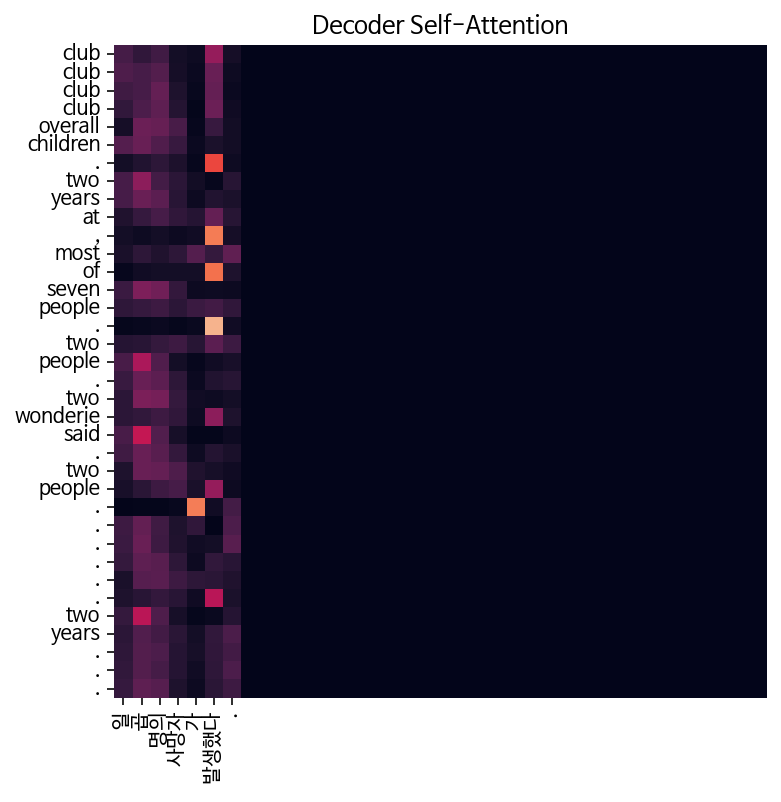

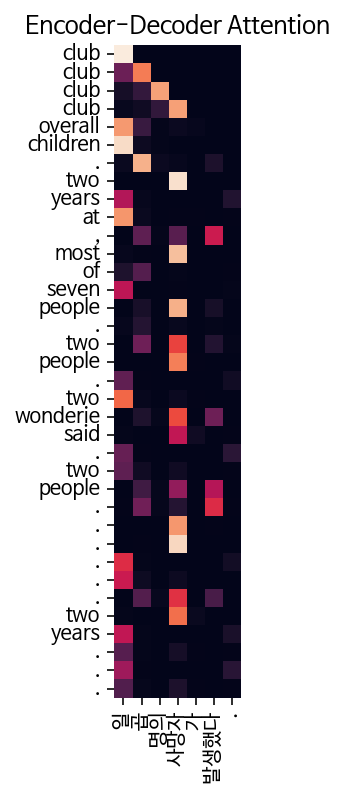


Epoch 7/15


Epoch 7:   0%|          | 0/1080 [00:00<?, ?it/s]

Epoch 7, Loss: 0.4823

### Translations and Visualizations ###
Input: 오바마는 대통령이다.
Predicted translation: familiar familiar familiar familiar with a gaza . gaza . program . president . gaza . gaza . . program . program .


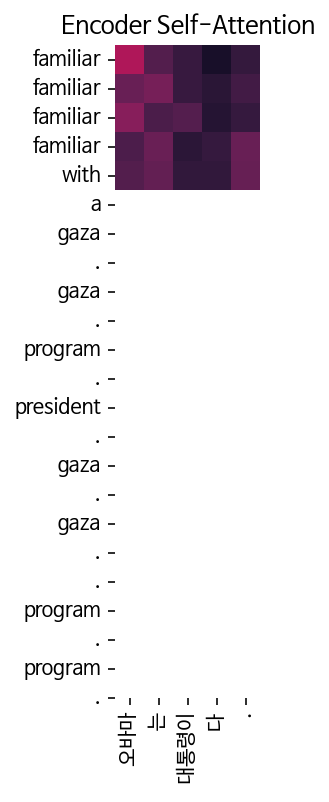

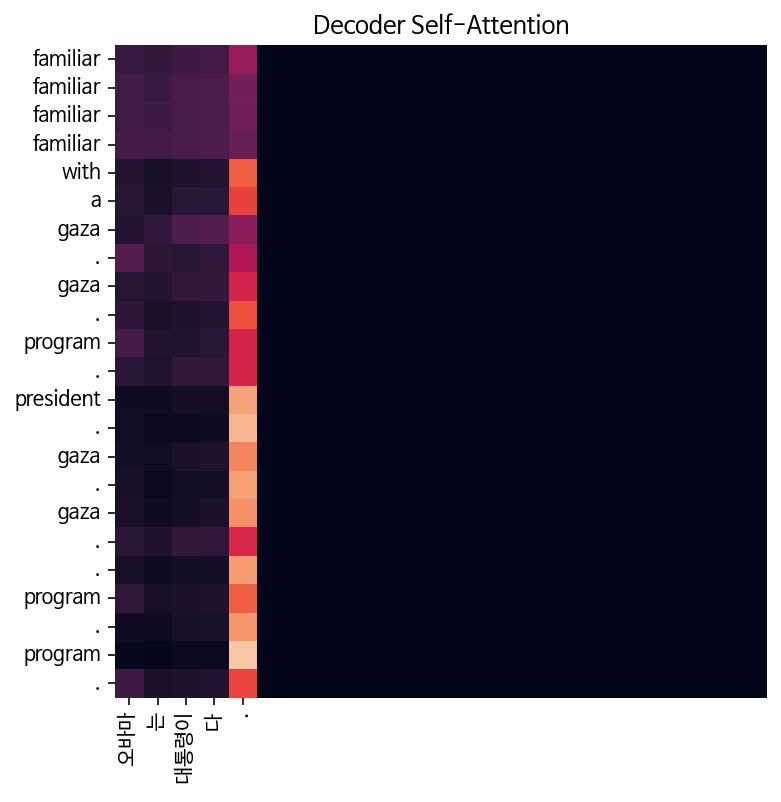

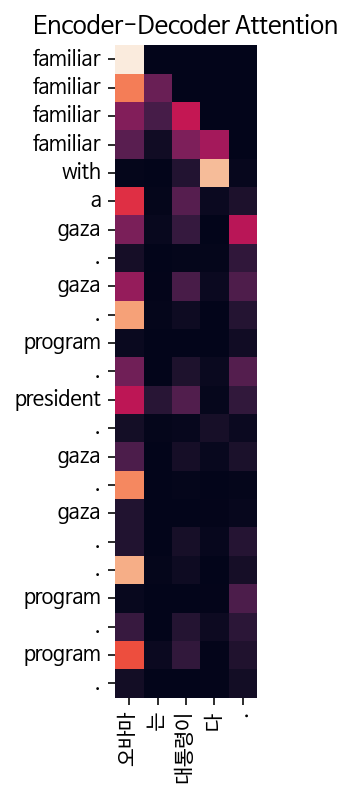

Input: 시민들은 도시 속에 산다.
Predicted translation: cars cars cars cars cars cars . world . . . city .


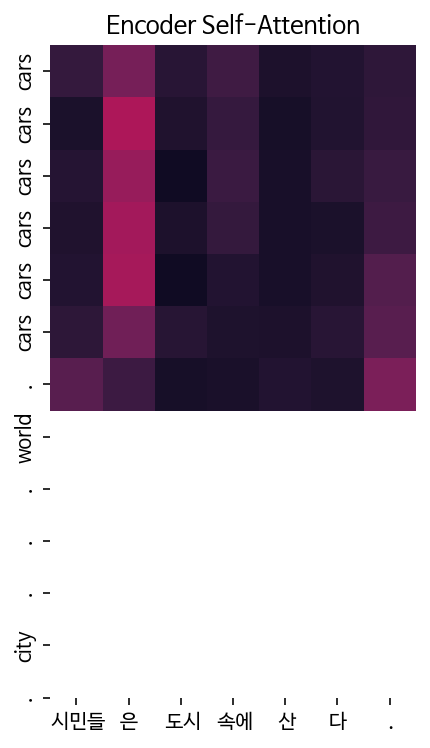

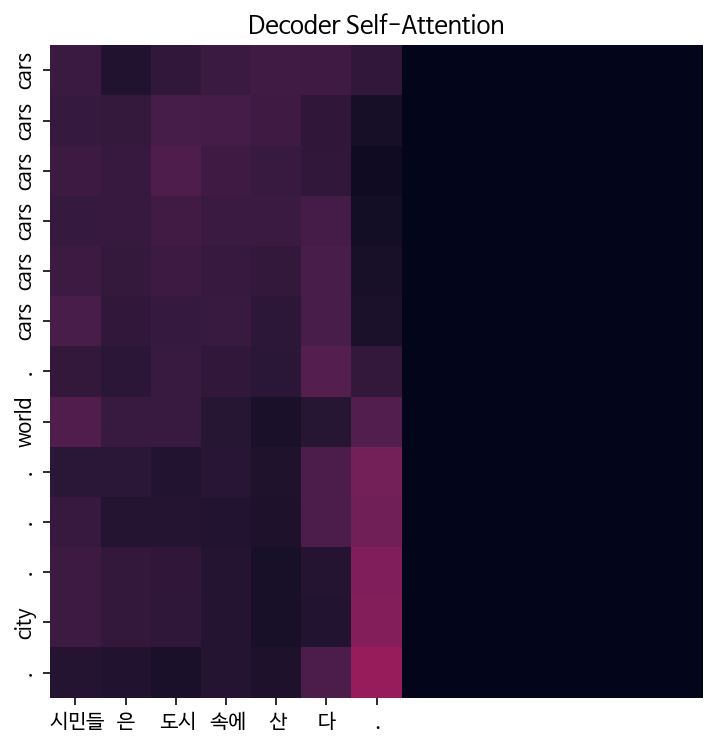

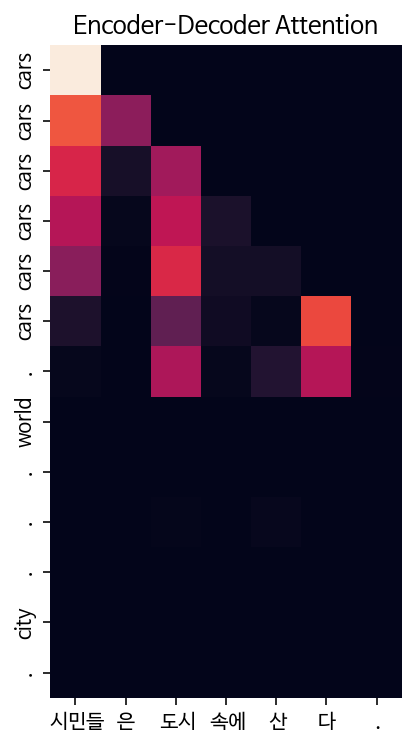

Input: 커피는 필요 없다.
Predicted translation: coffee coffee coffee coffee had never  coffee  coffee  coffee  coffee  coffee  coffee  coffee  coffee  coffee  coffee  coffee  coffee  coffee  coffee early monday . early . early . monday . monday .


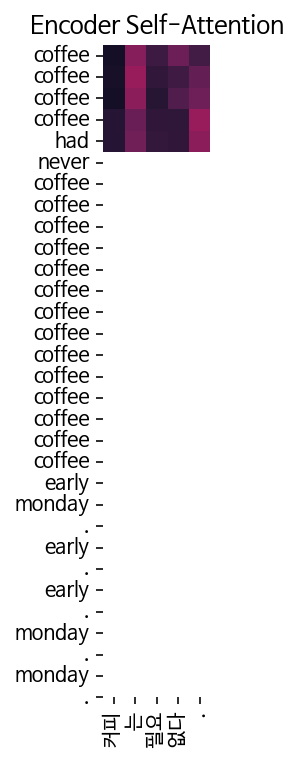

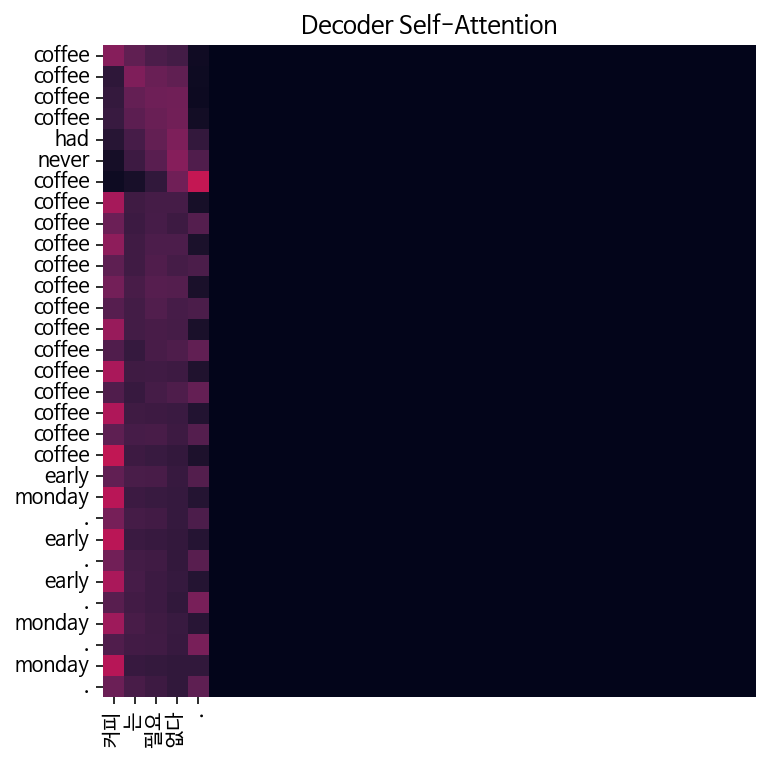

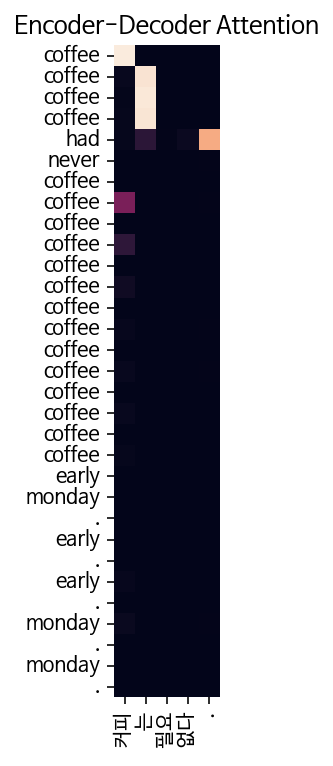

Input: 일곱 명의 사망자가 발생했다.
Predicted translation: alone unti unti to be heartd . their until . with their until people . a month . a month . seven others . . . . . . . . . .


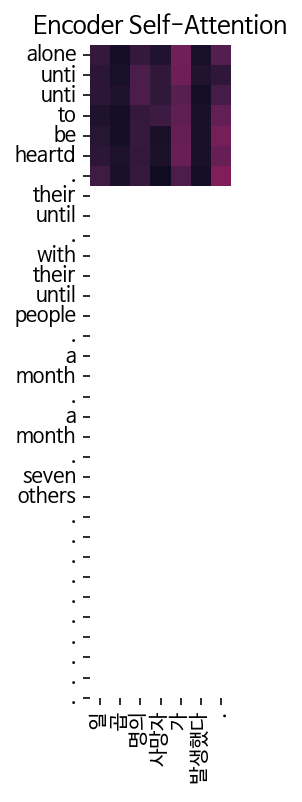

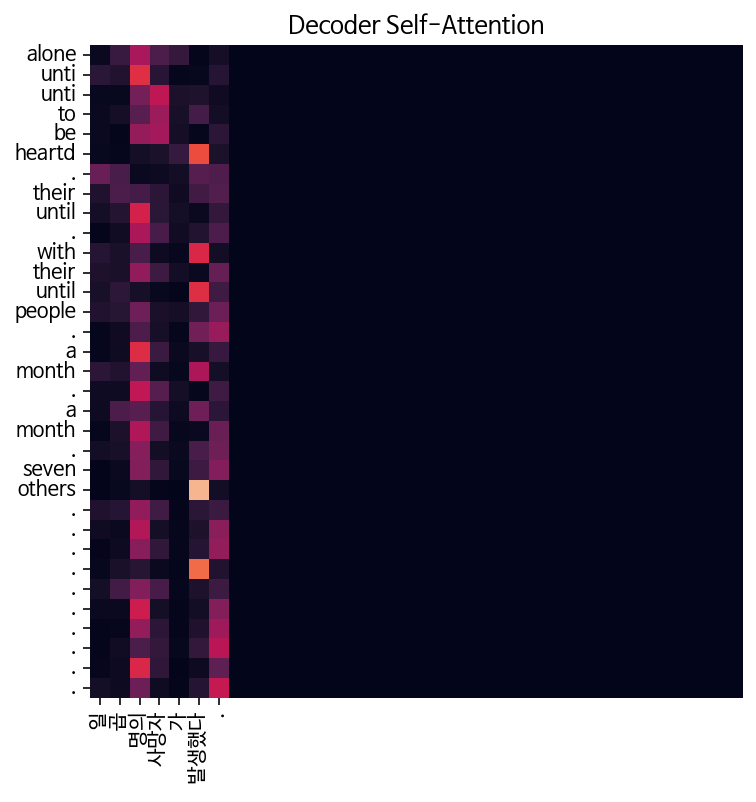

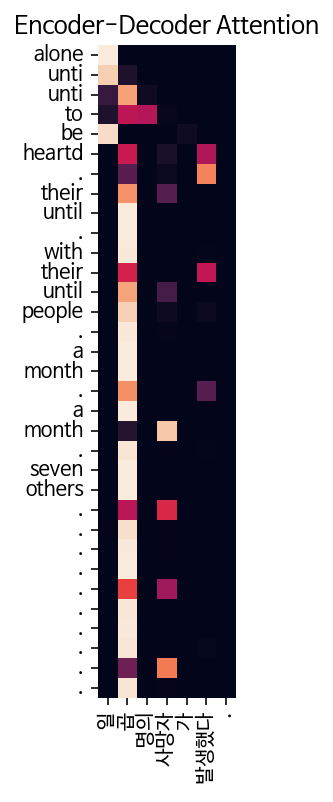


Epoch 8/15


Epoch 8:   0%|          | 0/1080 [00:00<?, ?it/s]

Epoch 8, Loss: 0.3588

### Translations and Visualizations ###
Input: 오바마는 대통령이다.
Predicted translation: abc abc abc abc s lt . . . . . . . . . . . . . . . . . . . . . .


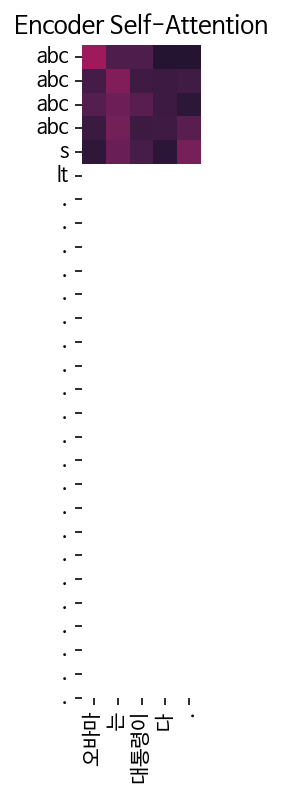

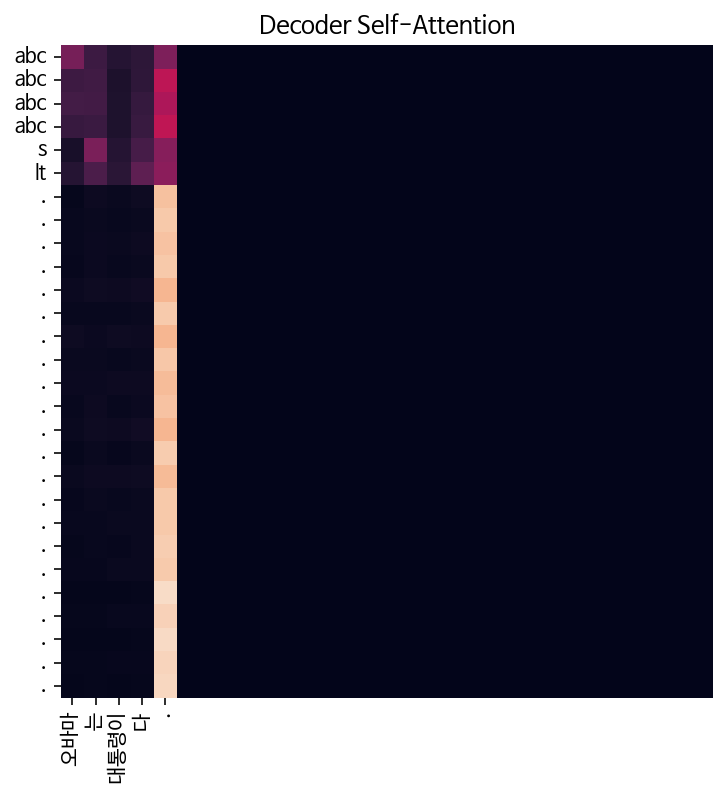

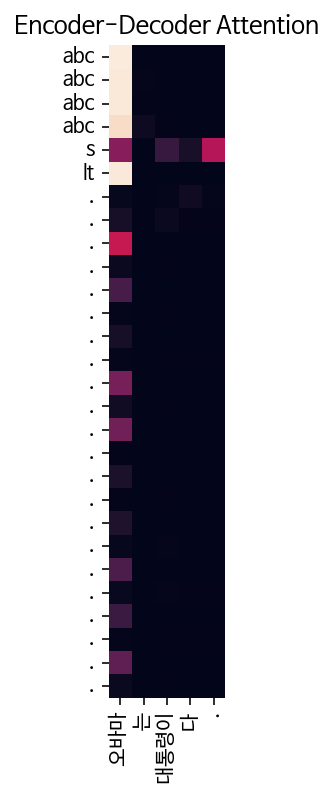

Input: 시민들은 도시 속에 산다.
Predicted translation: groundgroundgroundground truck inside . . . . . . . . . . . . . . . . . . . . . .


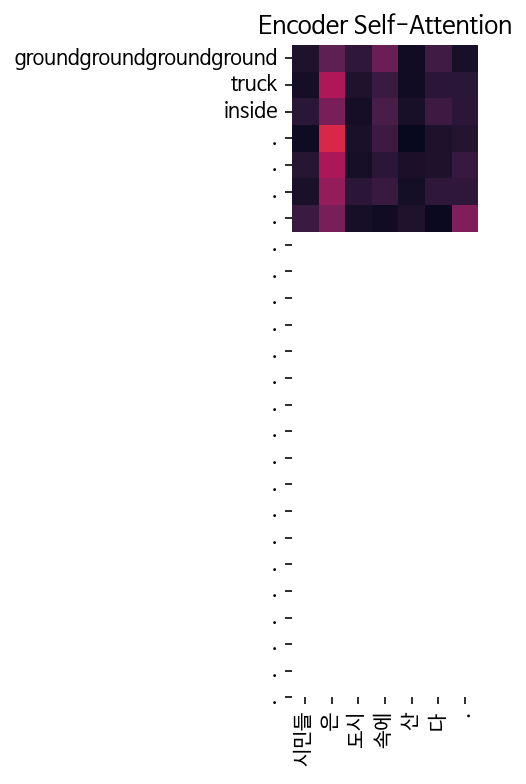

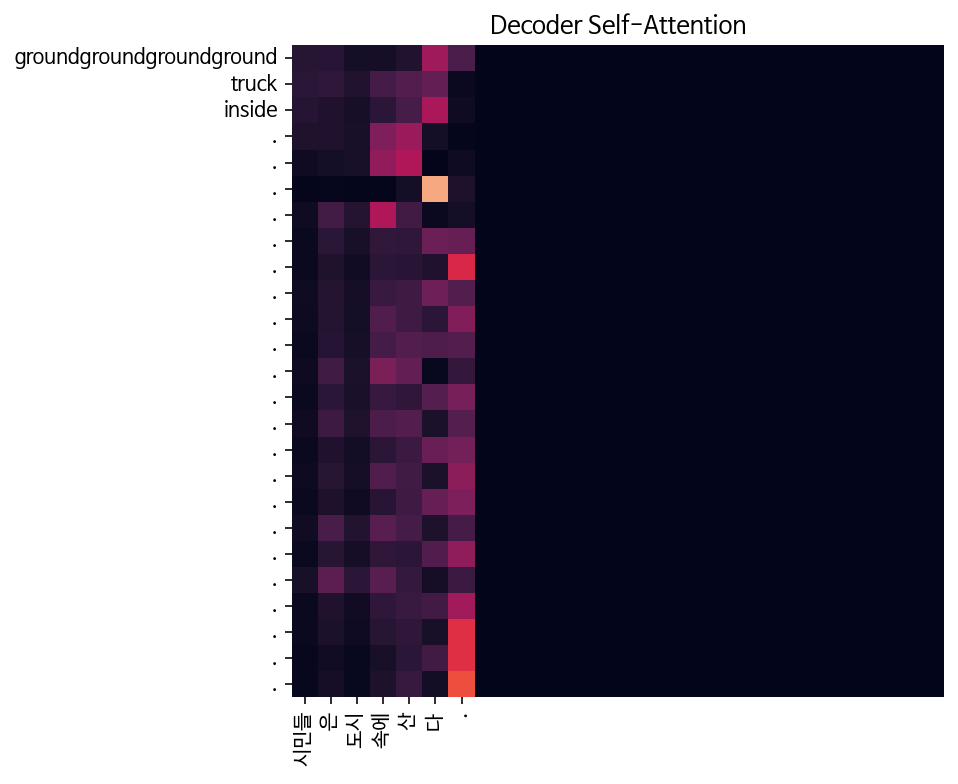

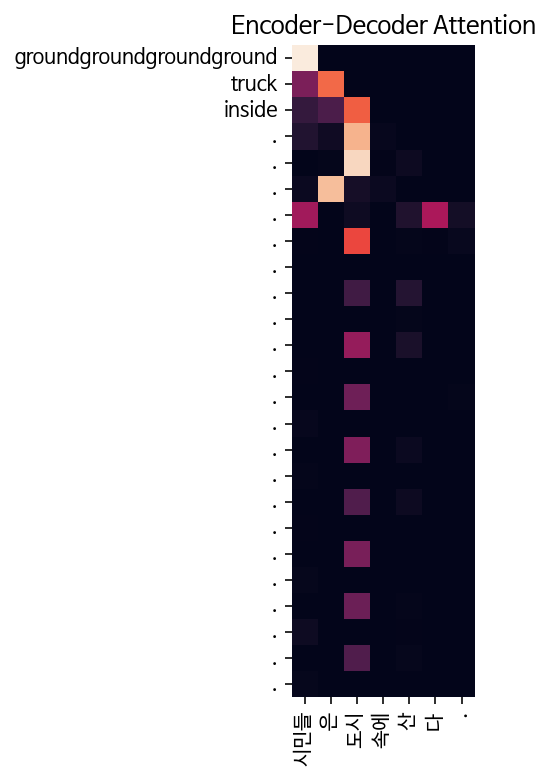

Input: 커피는 필요 없다.
Predicted translation: money money money money at its allies . confidence . . . . . . . . . . . . . . . . . . . .


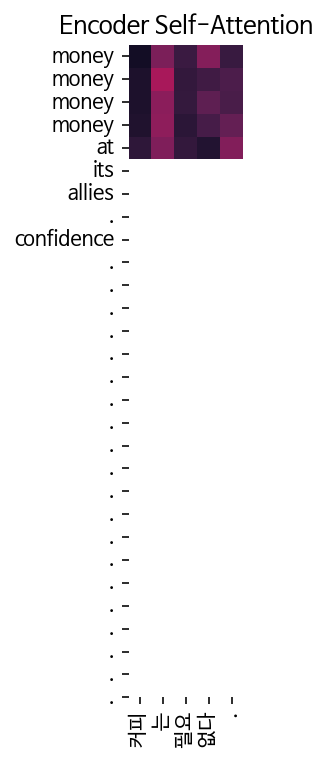

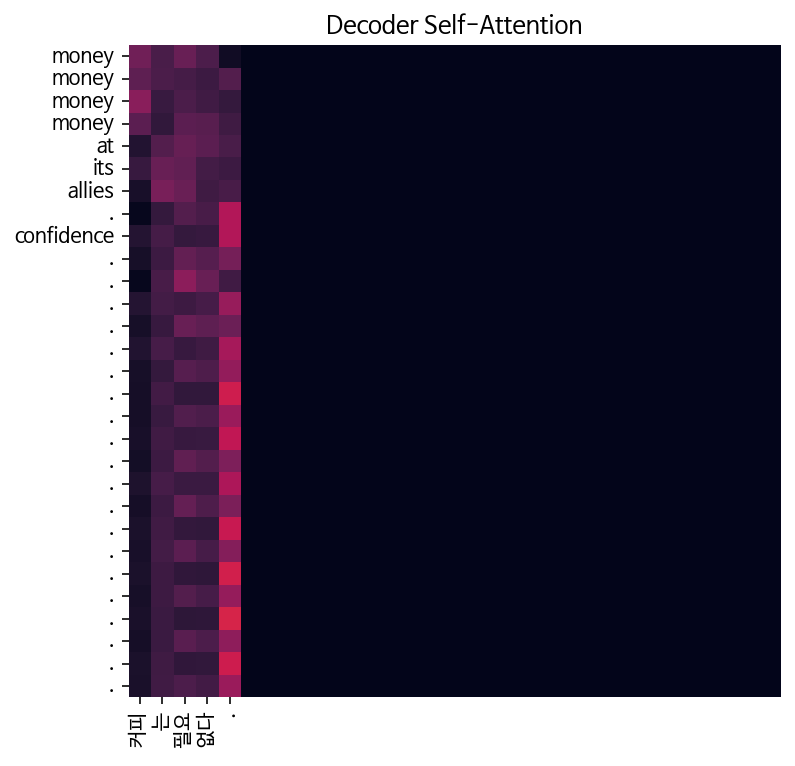

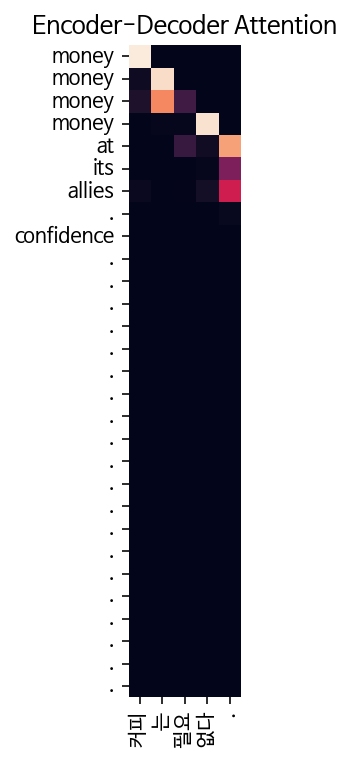

Input: 일곱 명의 사망자가 발생했다.
Predicted translation: rep easter easter easter easter easter tuesday . eight kilometers . eight kilometers . at . . eight kilometers . . . . . . . . . . . .


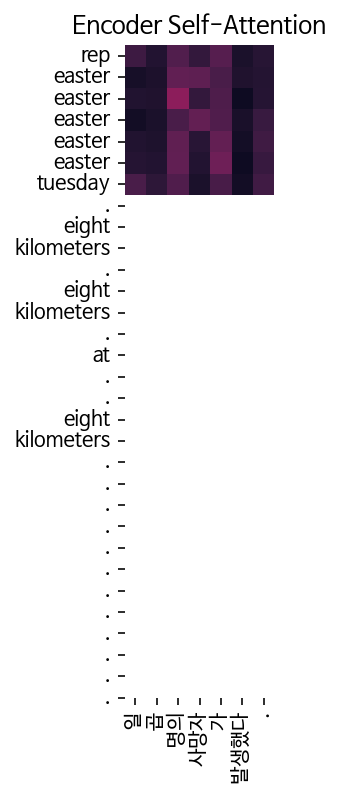

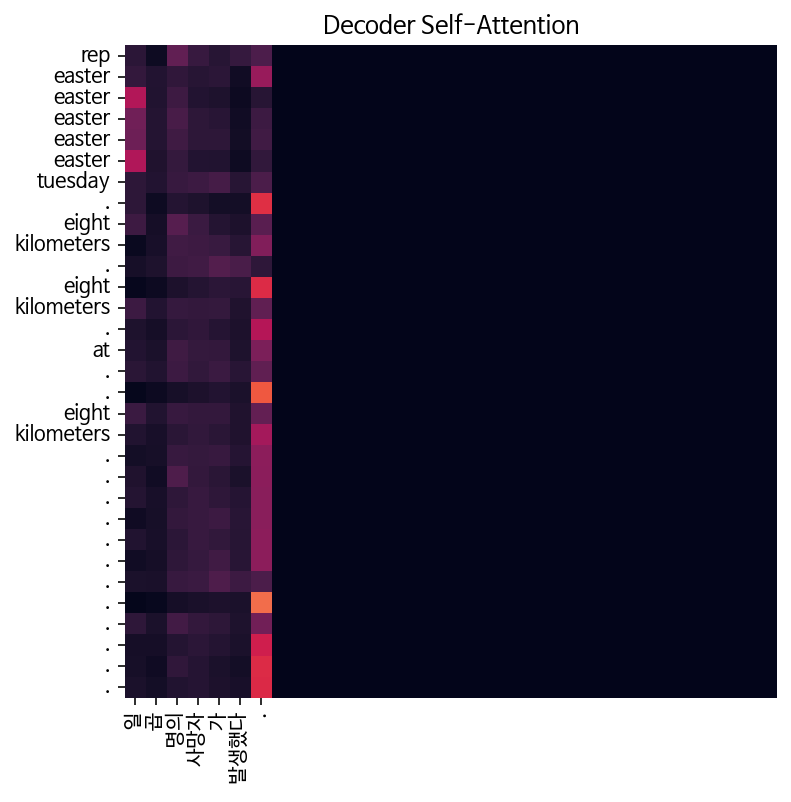

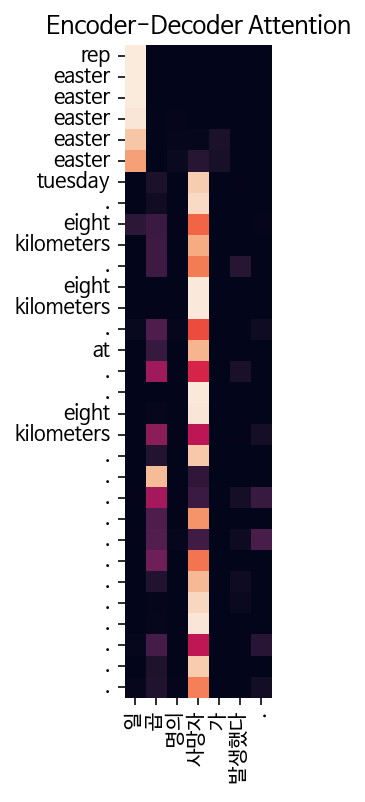


Epoch 9/15


Epoch 9:   0%|          | 0/1080 [00:00<?, ?it/s]

Epoch 9, Loss: 0.2837

### Translations and Visualizations ###
Input: 오바마는 대통령이다.
Predicted translation: voter voter voter voter . build party . obama said . obama . obama said . obama . . obama . obama . obama . obama . . . . . . .


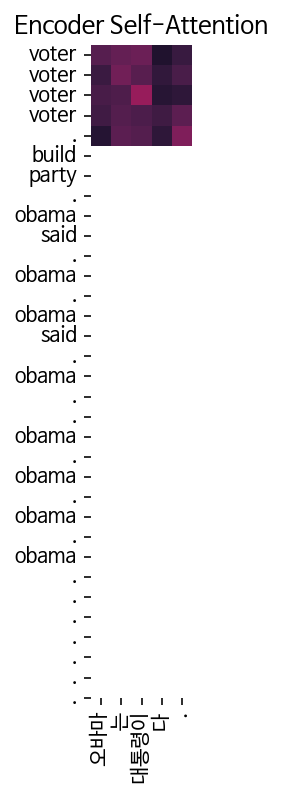

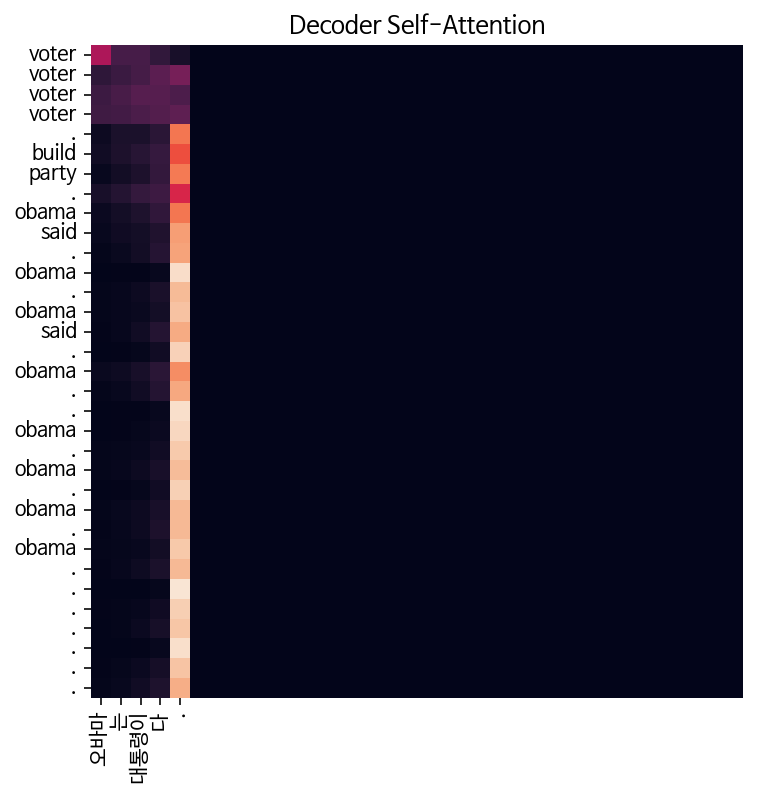

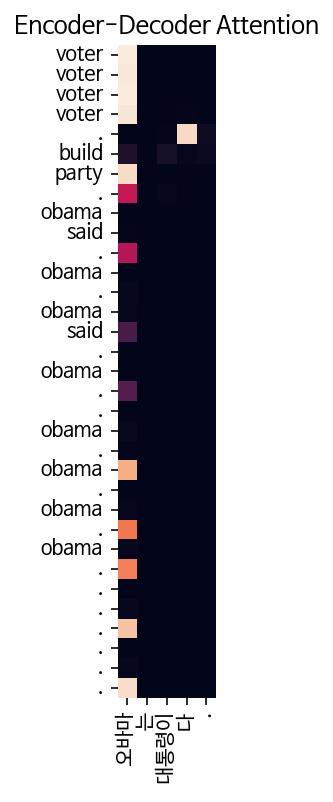

Input: 시민들은 도시 속에 산다.
Predicted translation: there there play play play play . . . . . . . . . . .


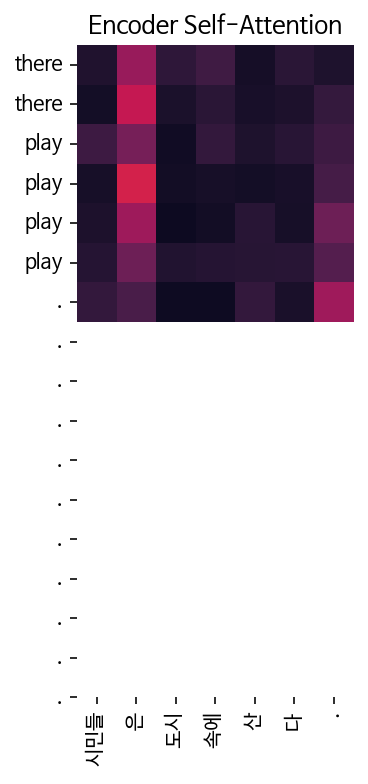

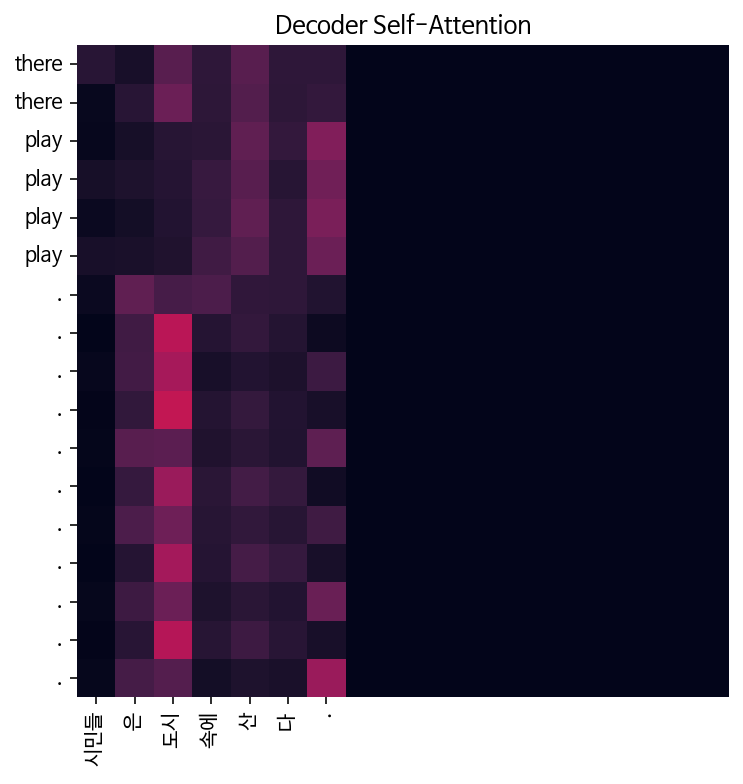

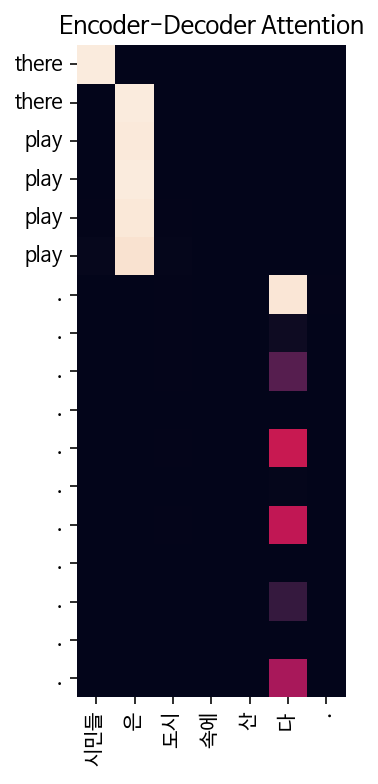

Input: 커피는 필요 없다.
Predicted translation: ex ex ex ex coffee . coffee . coffee . a coffee . coffee . coffee . coffee . . coffee . . . . . . . . . . .


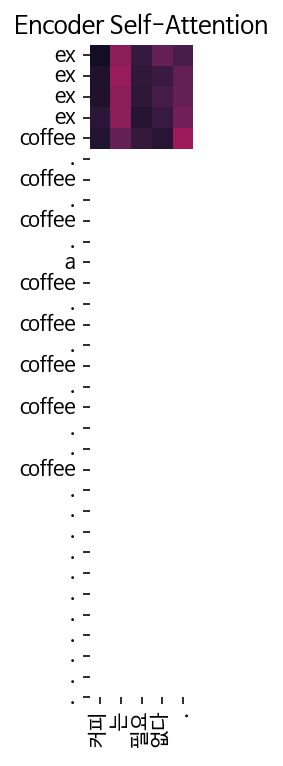

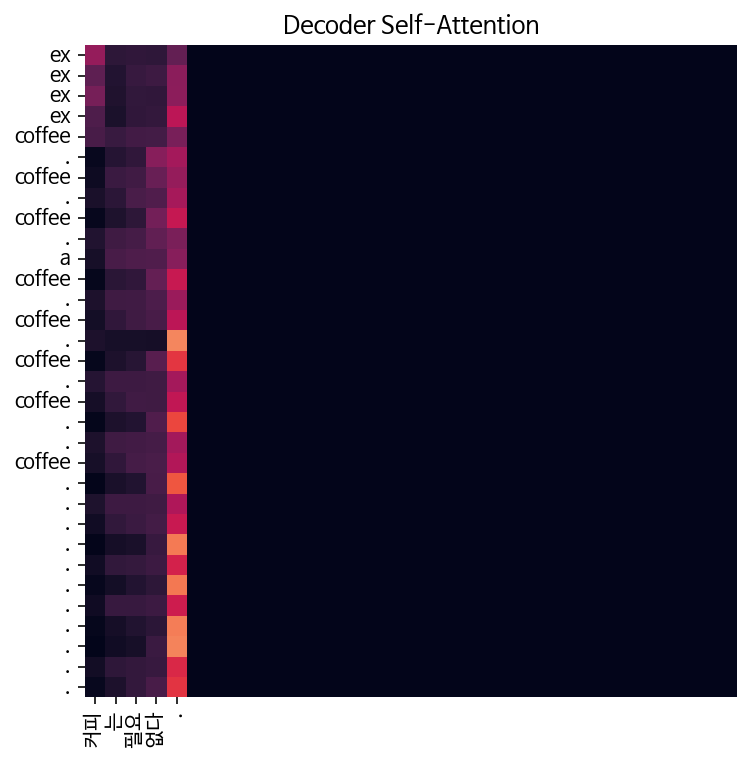

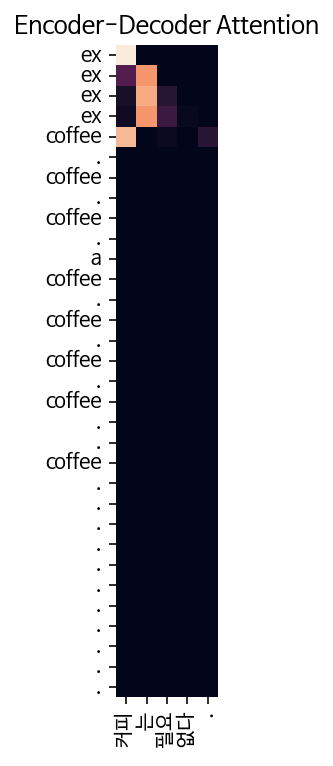

Input: 일곱 명의 사망자가 발생했다.
Predicted translation: in in in in in saturday in saturday . eight people . eight people . figures , a min obama . a min min min min min min min min min obama said . figures . figures . figures .


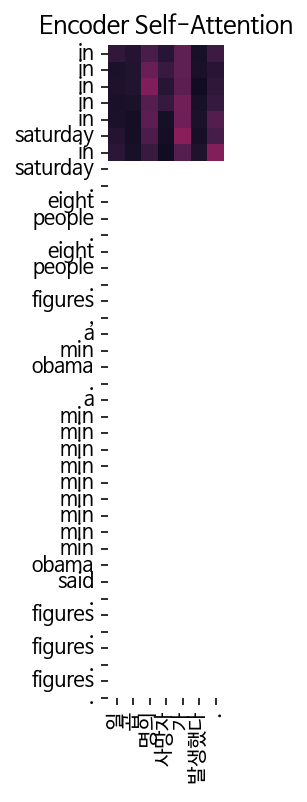

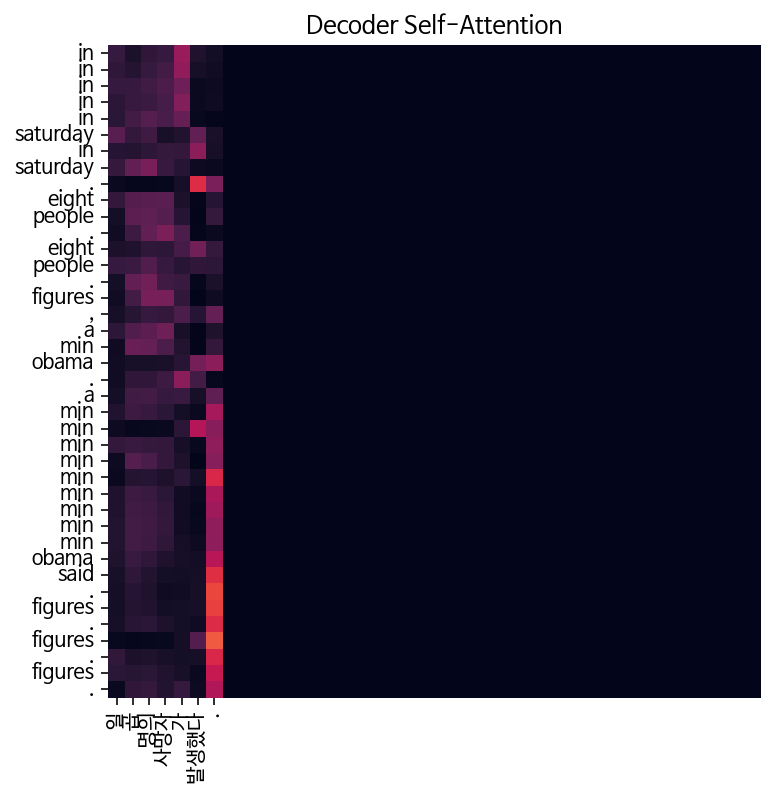

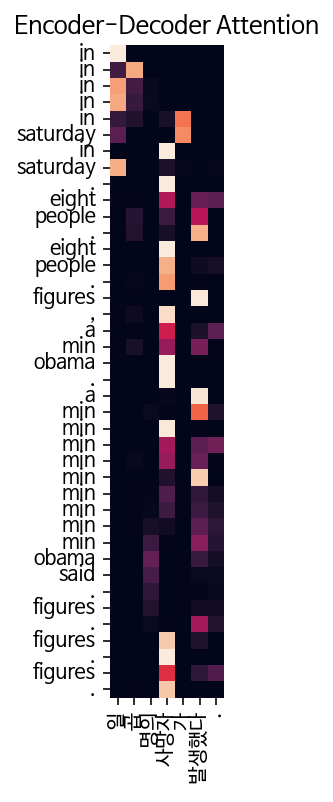


Epoch 10/15


Epoch 10:   0%|          | 0/1080 [00:00<?, ?it/s]

Epoch 10, Loss: 0.2362

### Translations and Visualizations ###
Input: 오바마는 대통령이다.
Predicted translation: still still still still lead . . . . . . . . . . . . . . . . . . . . . . .


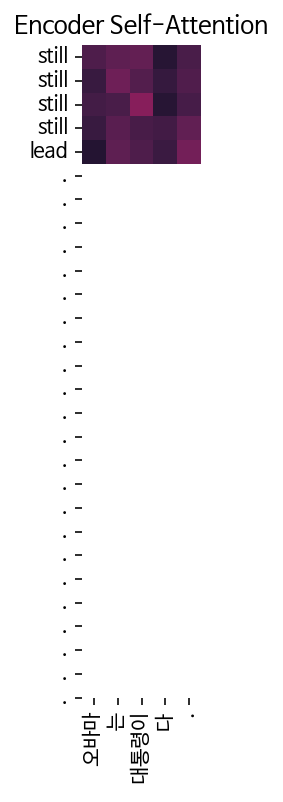

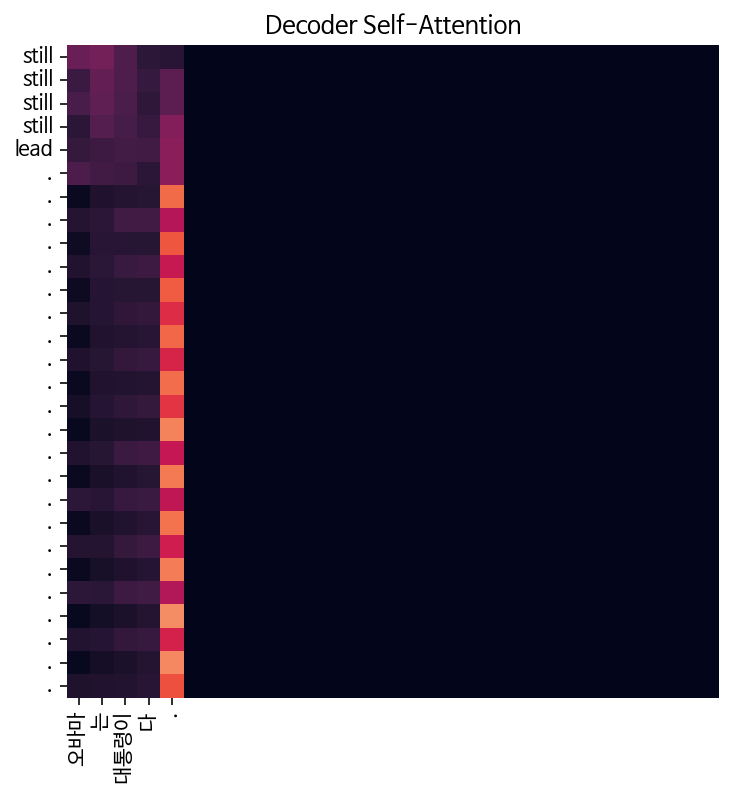

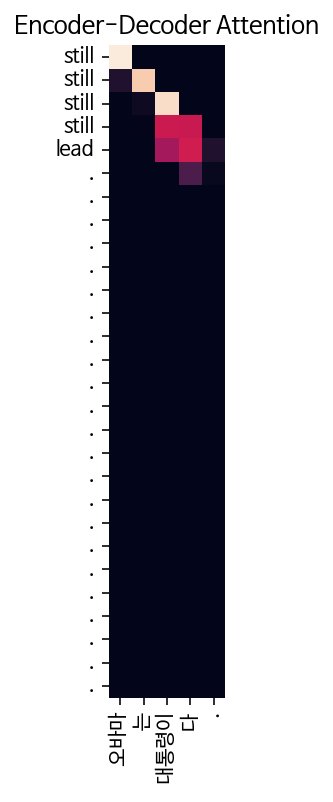

Input: 시민들은 도시 속에 산다.
Predicted translation: field field field field field cars . one as eight miles away . reported . urban area . reported . reported . river cars . reported . reported . reported . reported . reported . .


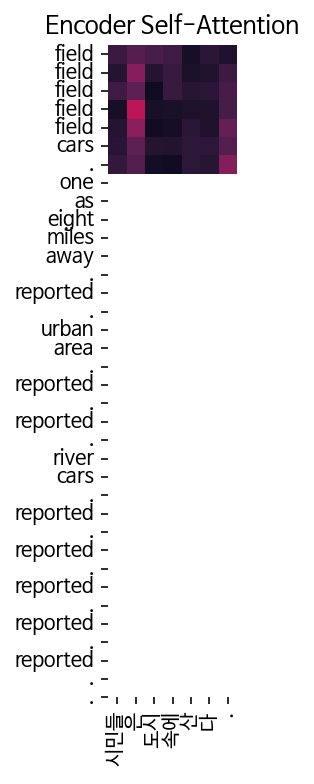

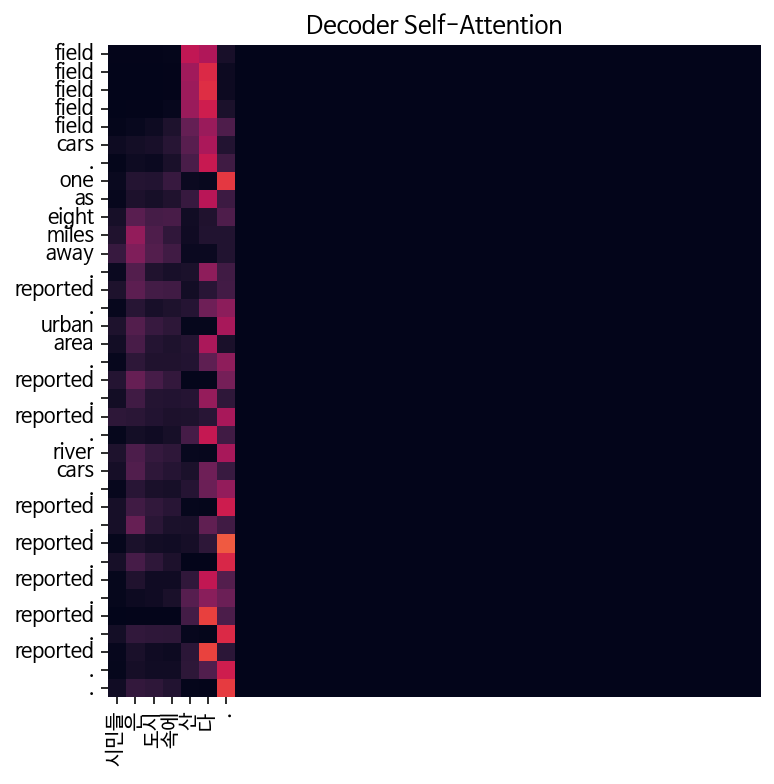

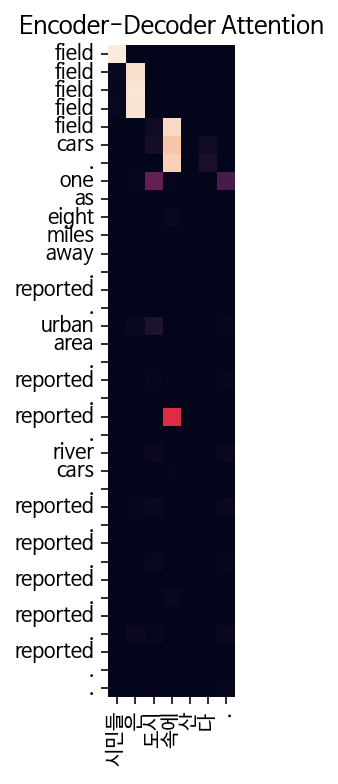

Input: 커피는 필요 없다.
Predicted translation: marine marine marine marine at marine good morning . working . good morning . . . good morning . good thursday . . good record . . . for three marine . . . .


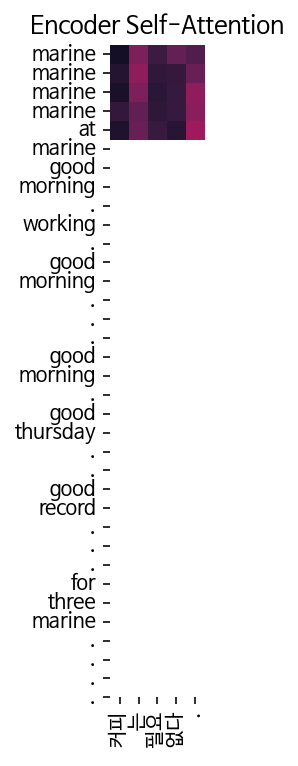

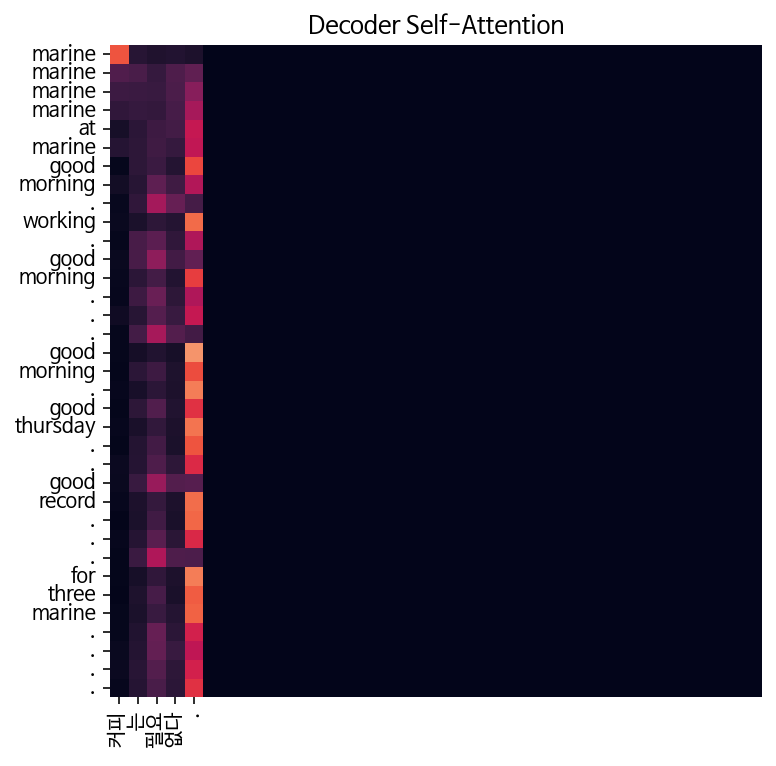

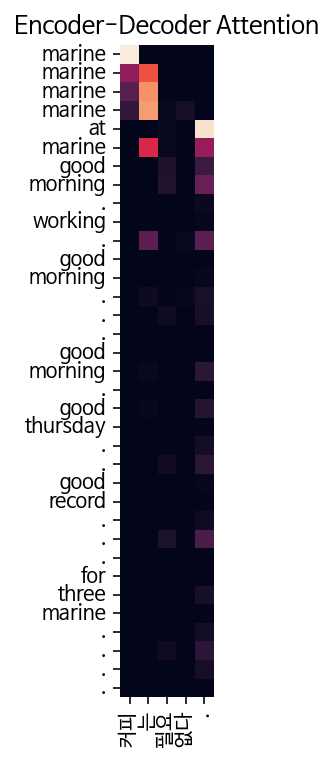

Input: 일곱 명의 사망자가 발생했다.
Predicted translation: how how how how how sunday , with their injuries . having lot of their injuries . reported . reported . reported . reported . reported . yen . reported . explosion . reported . .


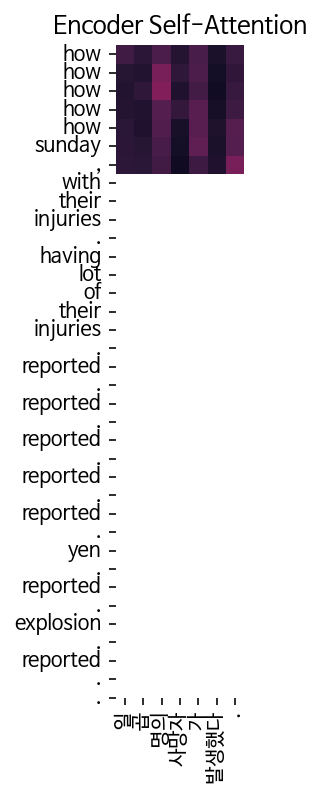

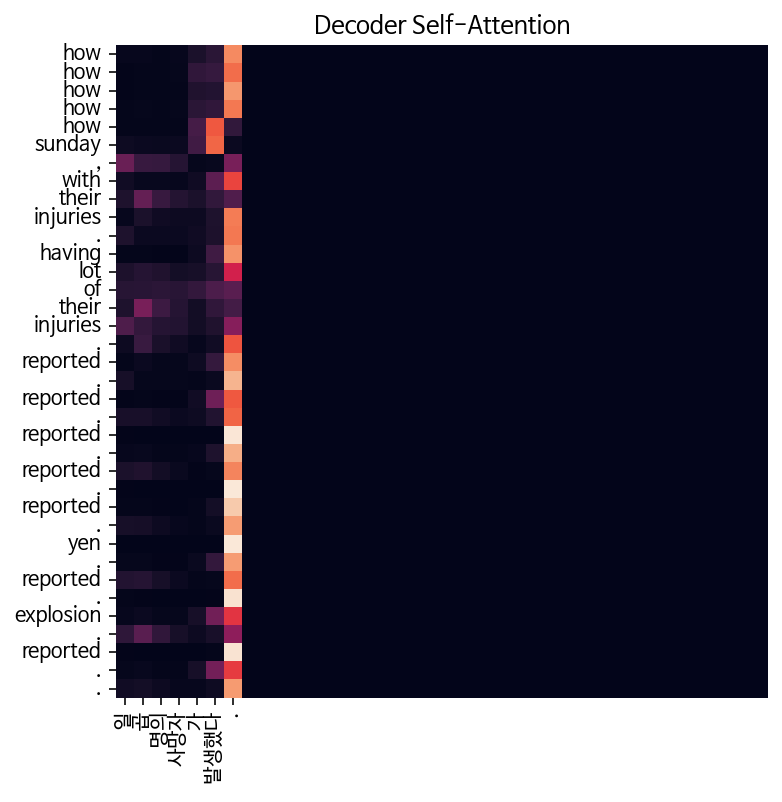

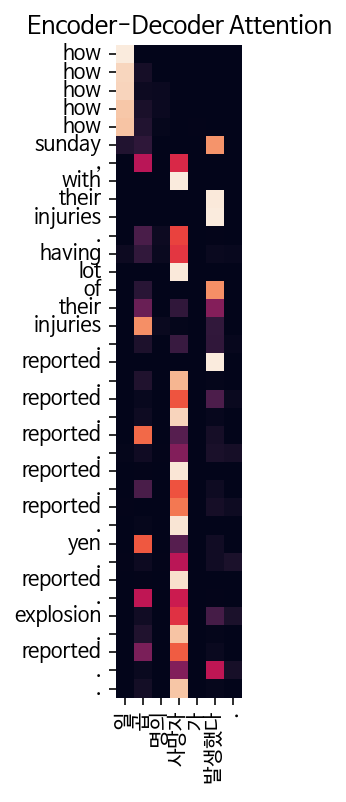


Epoch 11/15


Epoch 11:   0%|          | 0/1080 [00:00<?, ?it/s]

Epoch 11, Loss: 0.2025

### Translations and Visualizations ###
Input: 오바마는 대통령이다.
Predicted translation: democratic democratic democratic democratic primaries . . . . . . . . . . . . . .


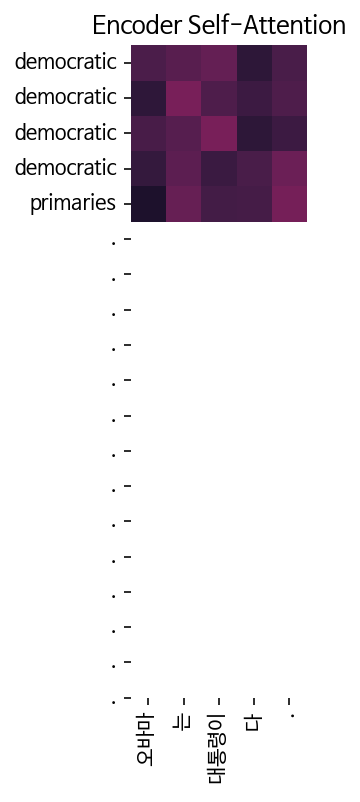

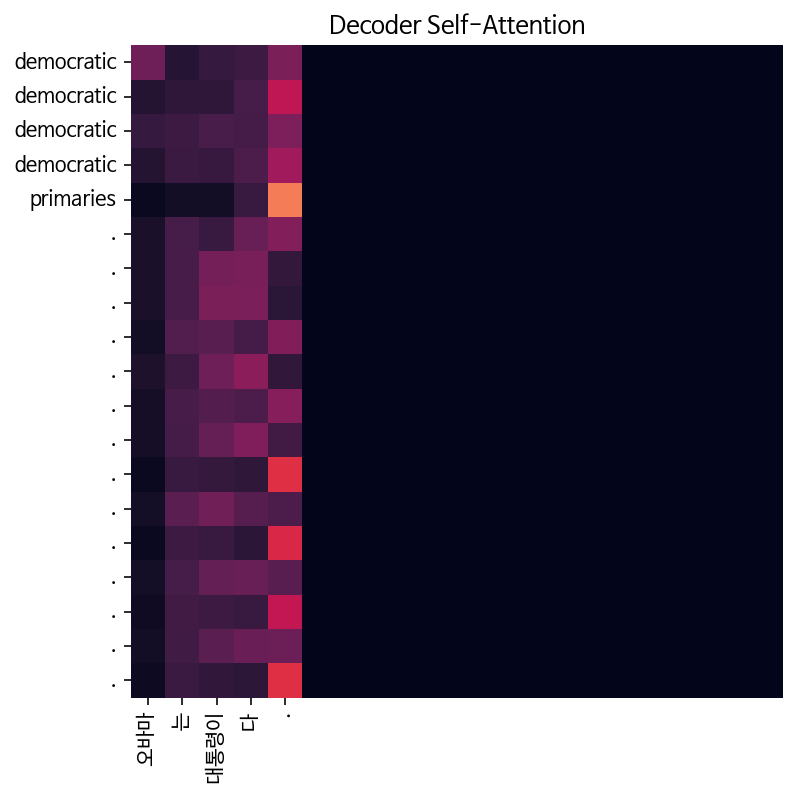

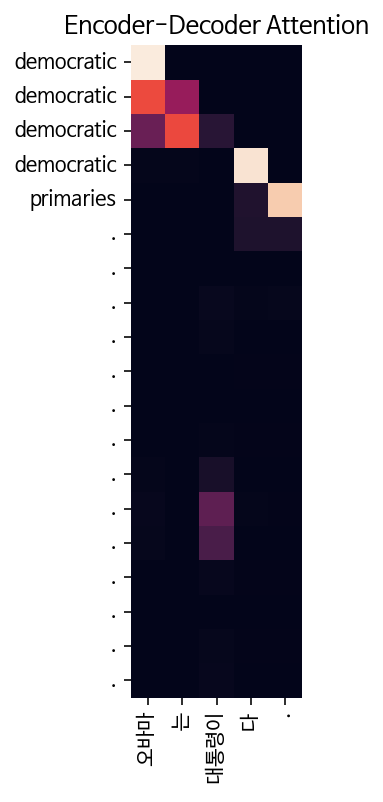

Input: 시민들은 도시 속에 산다.
Predicted translation: hundred hundred hundred hundred barcelona . . . . . . . . . . . . . . . . . . . . . .


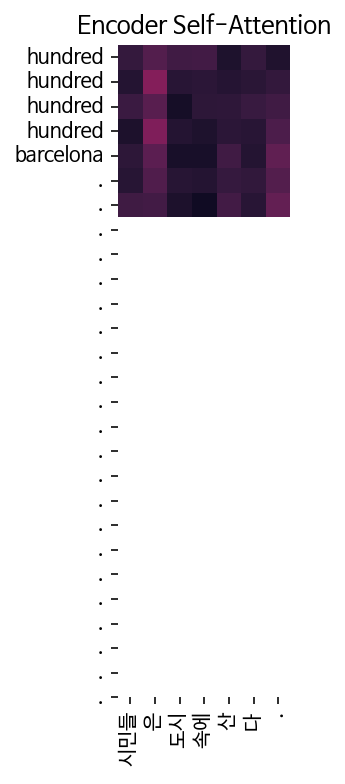

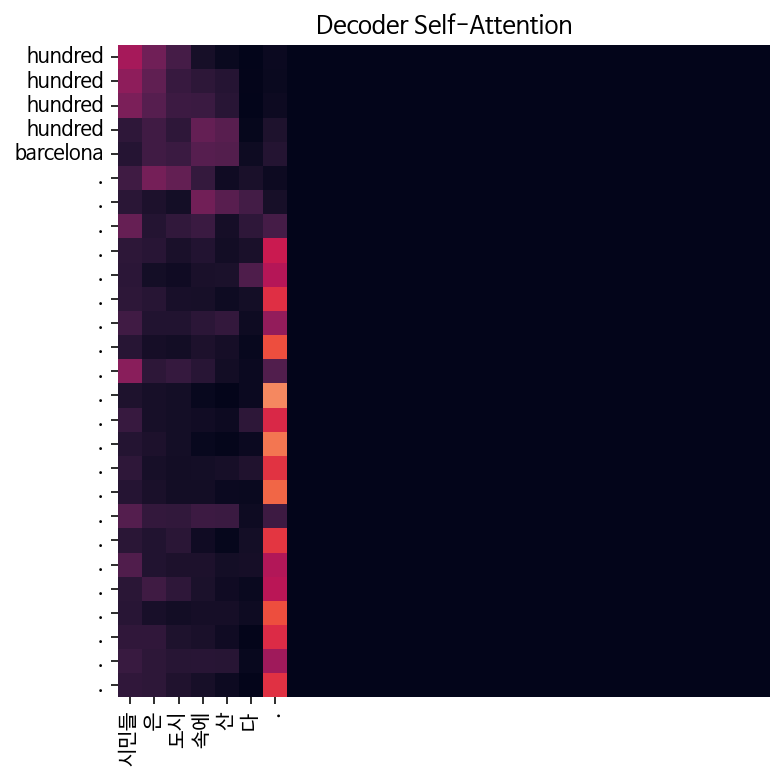

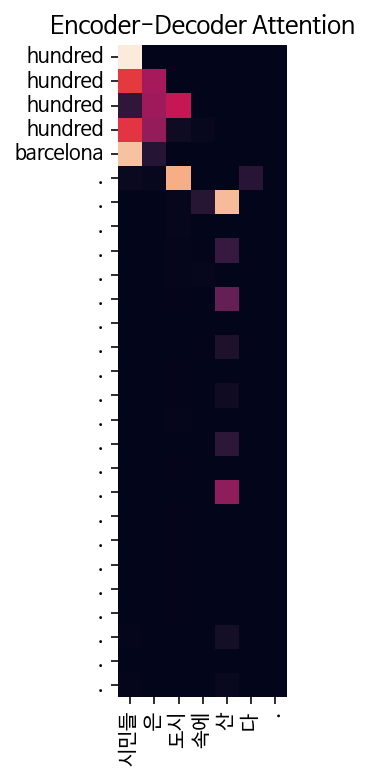

Input: 커피는 필요 없다.
Predicted translation: coffee point point point to point . s shows . . . . . . . . . . s known . . . . . . . .


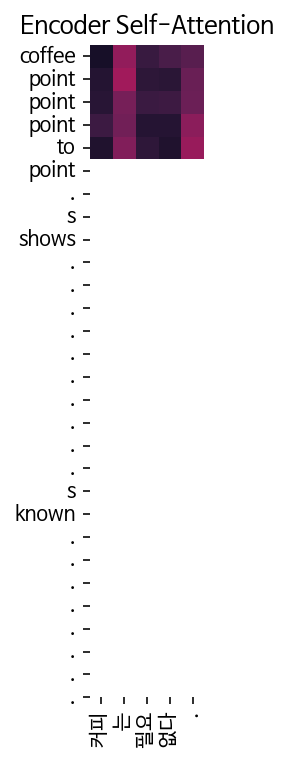

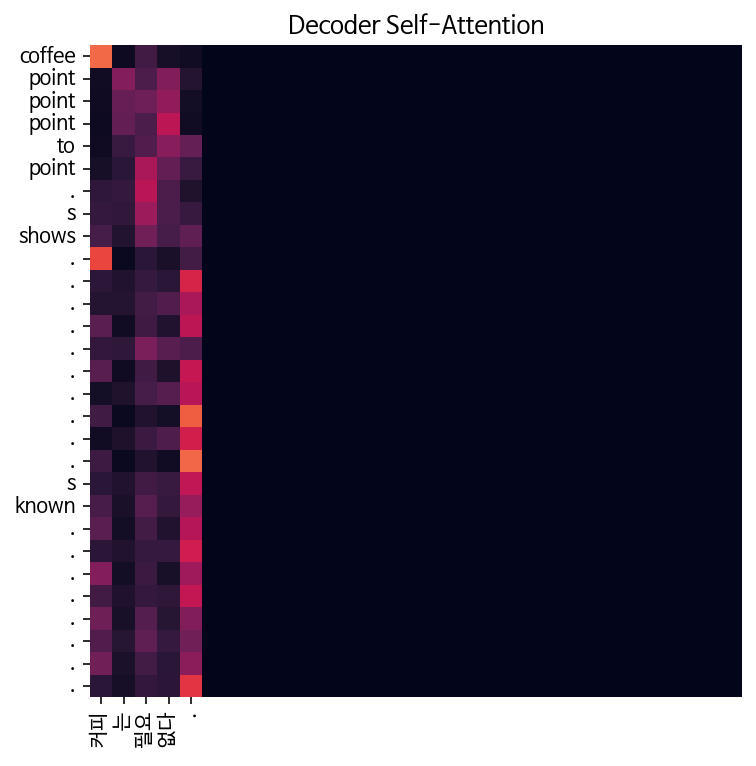

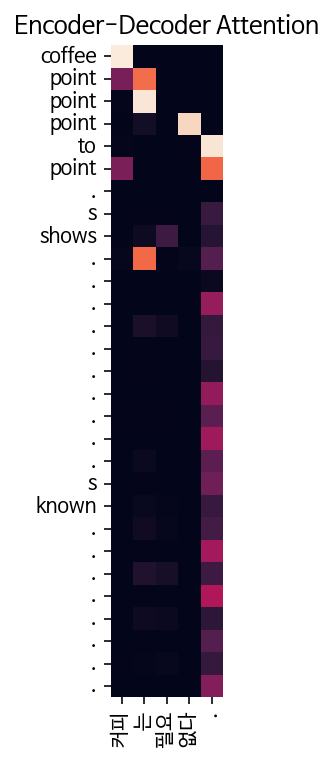

Input: 일곱 명의 사망자가 발생했다.
Predicted translation: led led led led led led friday . at least monday . be killed . at least . . others . others . . others . . others . others . . . .


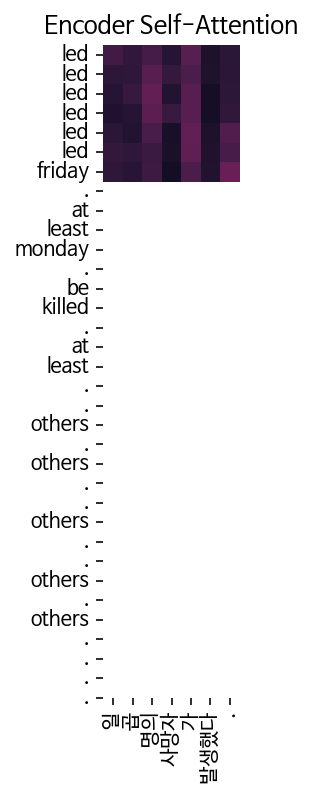

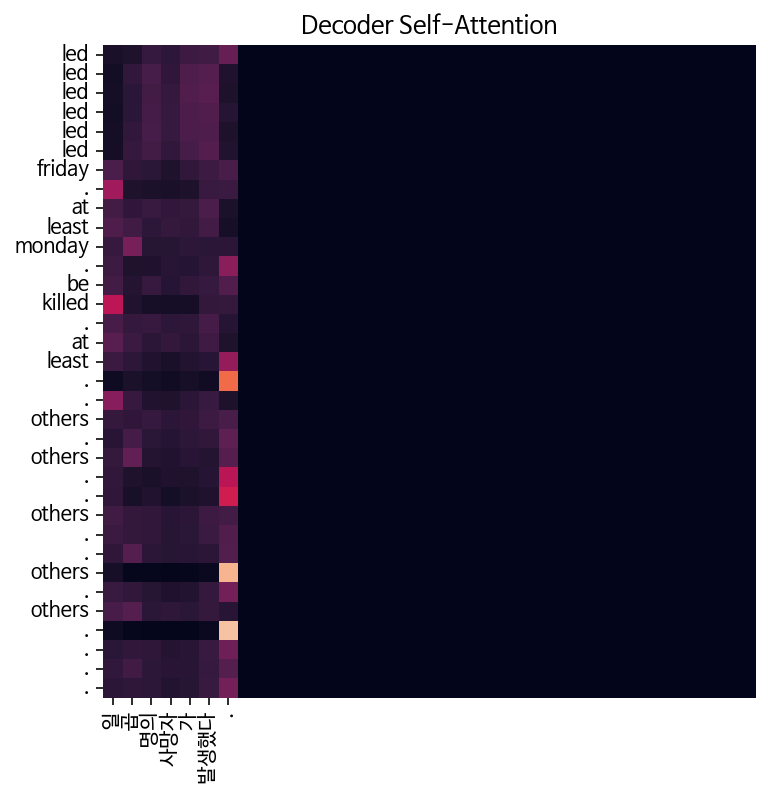

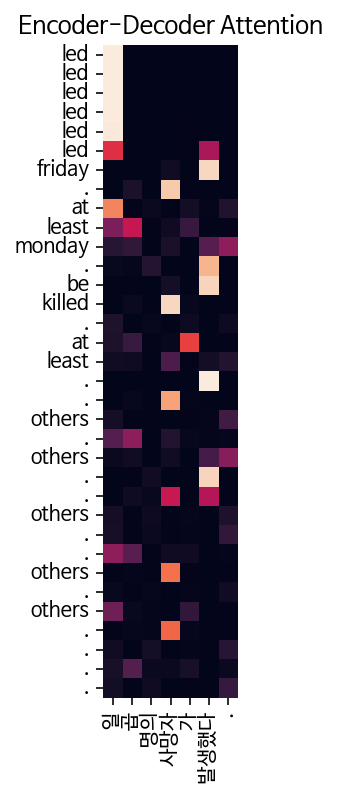


Epoch 12/15


Epoch 12:   0%|          | 0/1080 [00:00<?, ?it/s]

Epoch 12, Loss: 0.1767

### Translations and Visualizations ###
Input: 오바마는 대통령이다.
Predicted translation: obama obama obama battling the com . . . . . . . . . . . . voters . voters . . . . . . . .


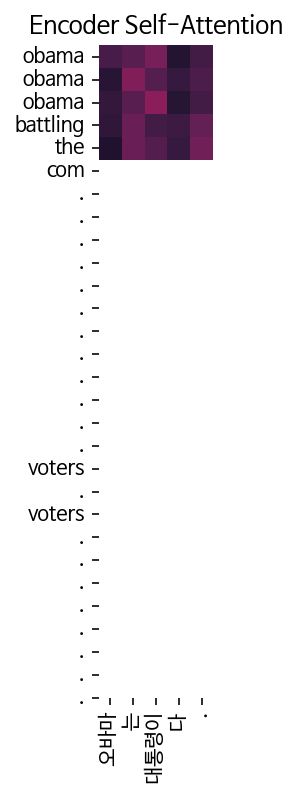

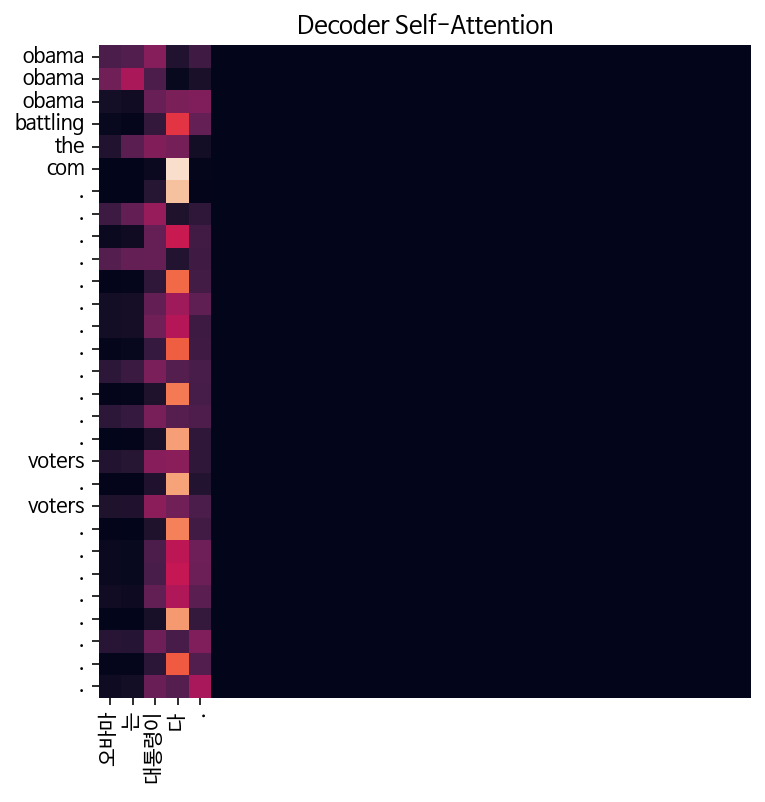

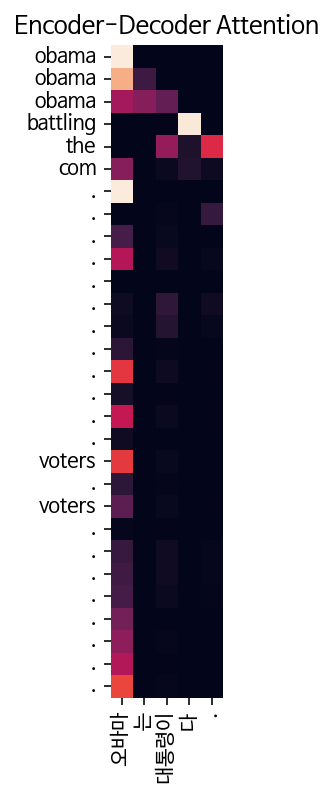

Input: 시민들은 도시 속에 산다.
Predicted translation: waywaywaywayway . . as it is still , she added . , she added . defense commander said . stocks . . as commander said . . . . . . .


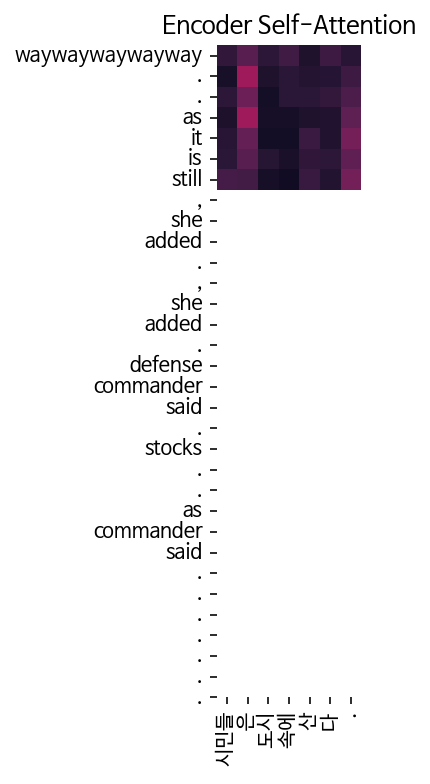

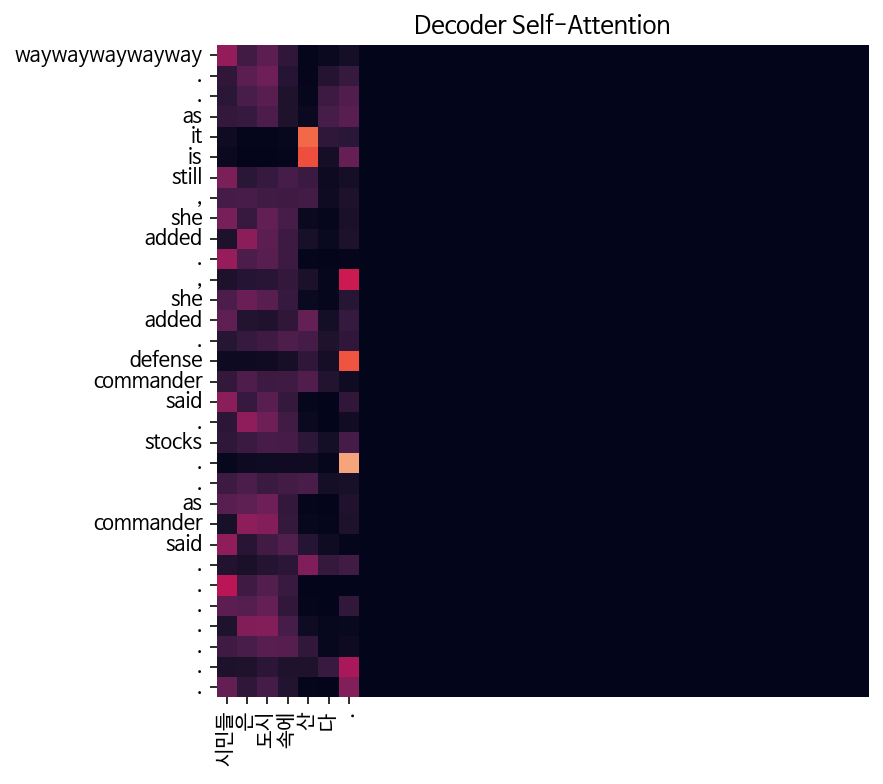

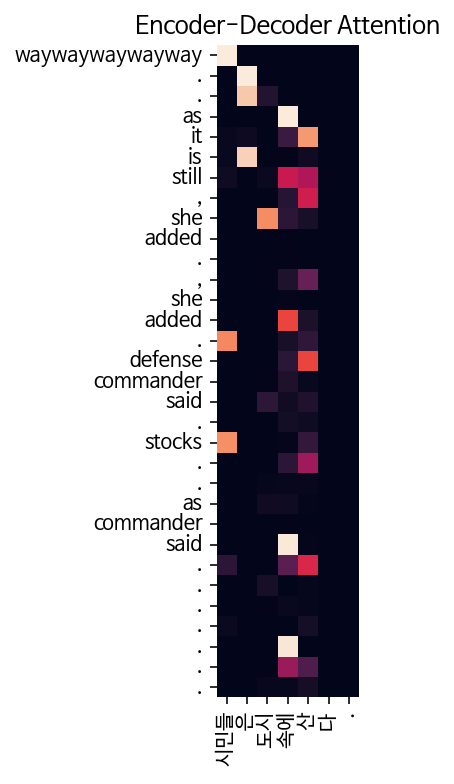

Input: 커피는 필요 없다.
Predicted translation: the the the the times . . . . . . . . india . . . india . india . india . india .


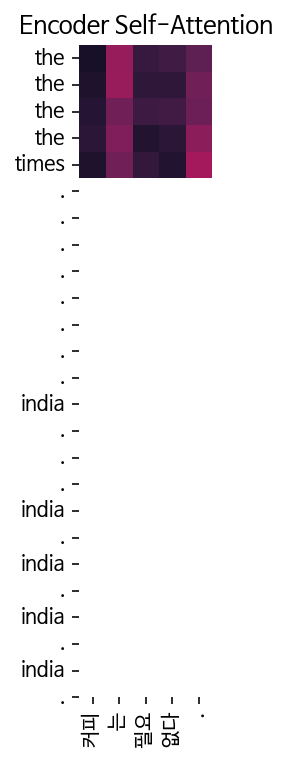

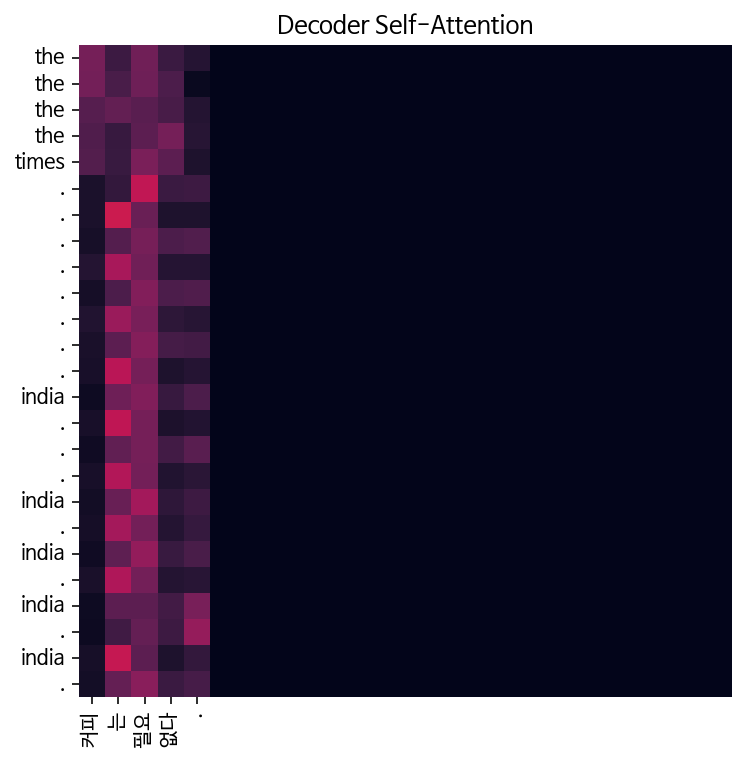

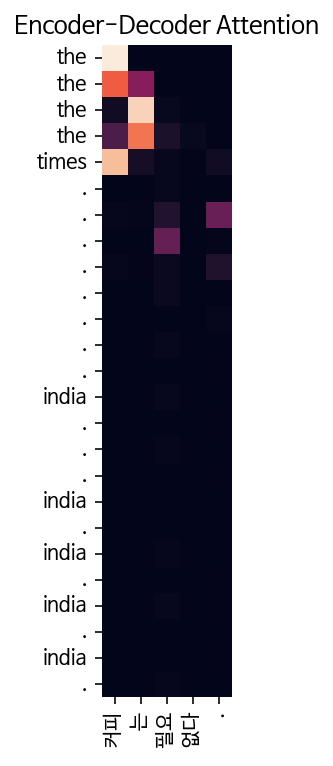

Input: 일곱 명의 사망자가 발생했다.
Predicted translation: incident officials officials officials officials officials reported wednesday . them . thousands . . . their homes . them . them . them . standoff . . desert . . .


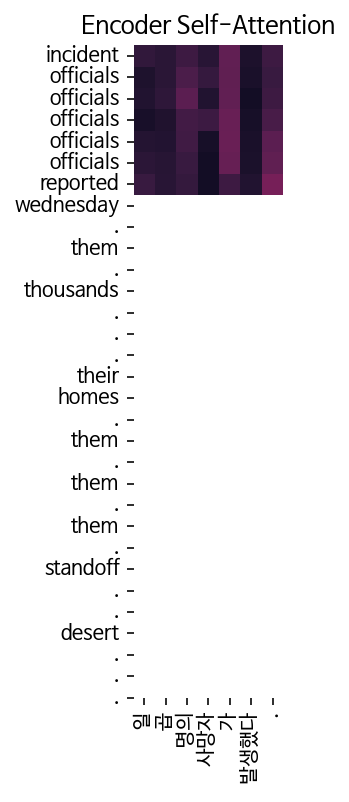

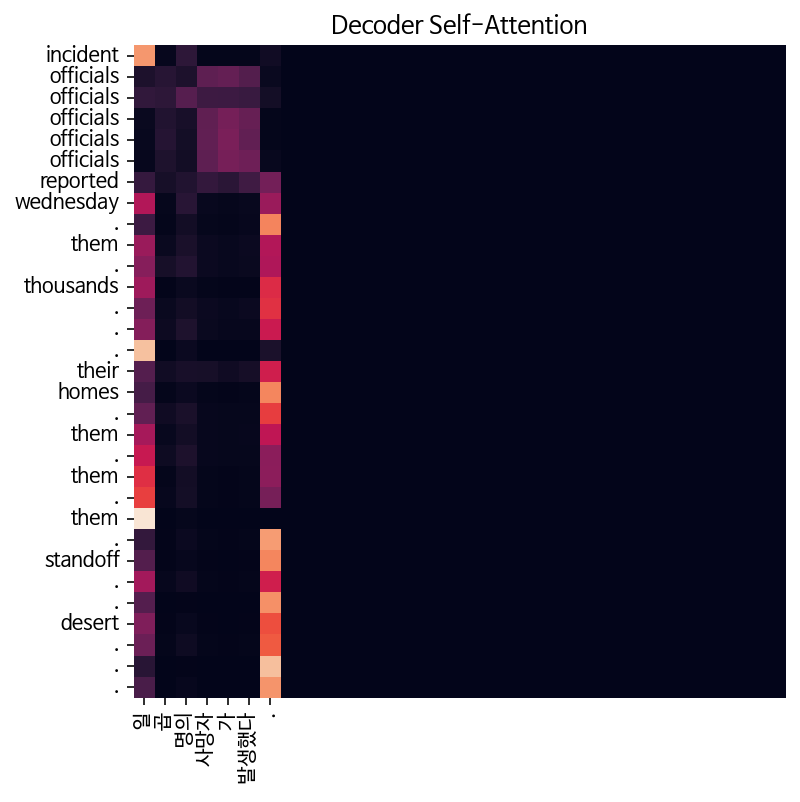

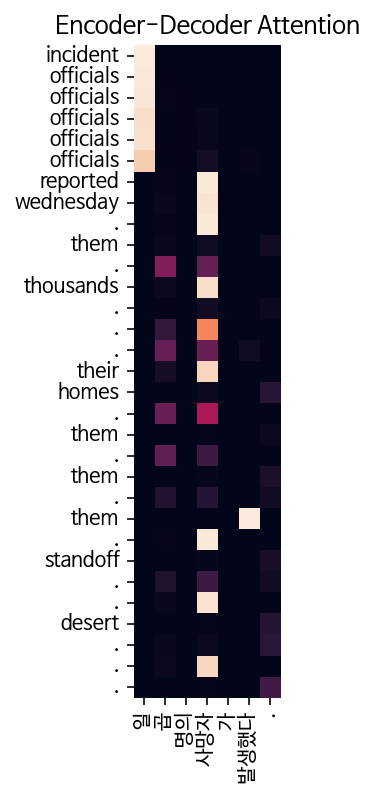


Epoch 13/15


Epoch 13:   0%|          | 0/1080 [00:00<?, ?it/s]

Epoch 13, Loss: 0.1564

### Translations and Visualizations ###
Input: 오바마는 대통령이다.
Predicted translation: , , , , obamad . named . . obama . obama . drinking obama . .


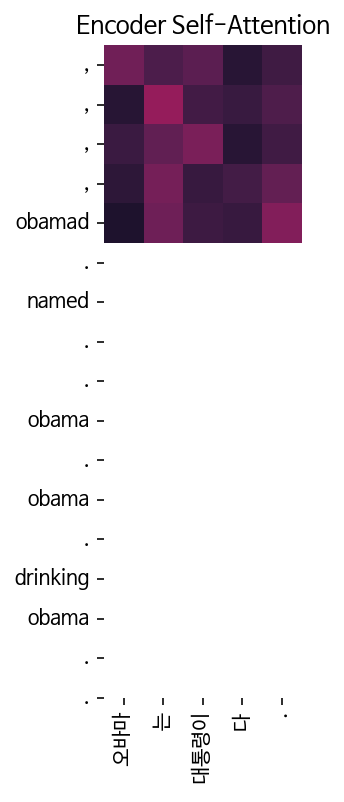

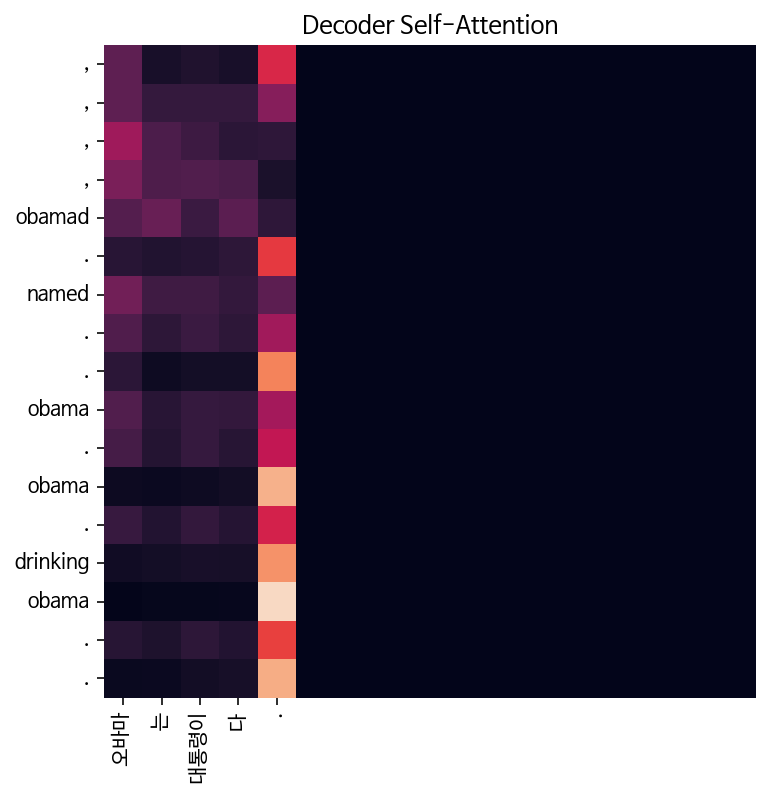

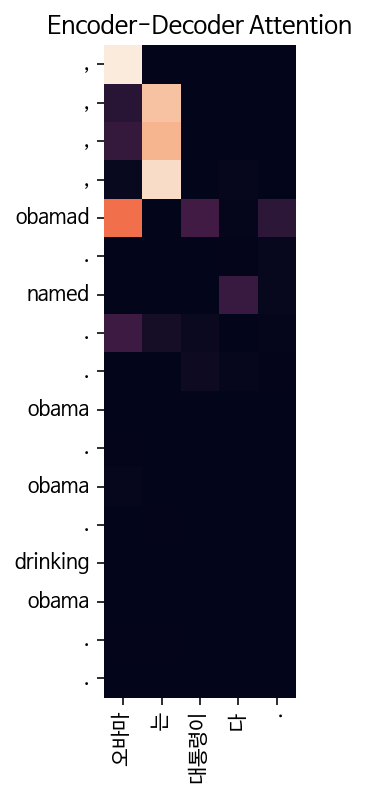

Input: 시민들은 도시 속에 산다.
Predicted translation: . . . . . . . , from . . embass . embass . embass . embass . crowd . . crowd . embass . . crowd . . . . . . .


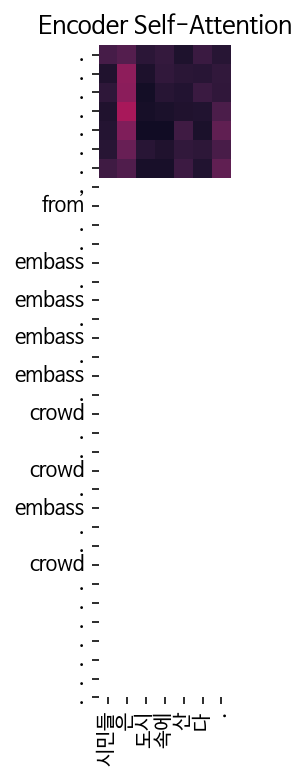

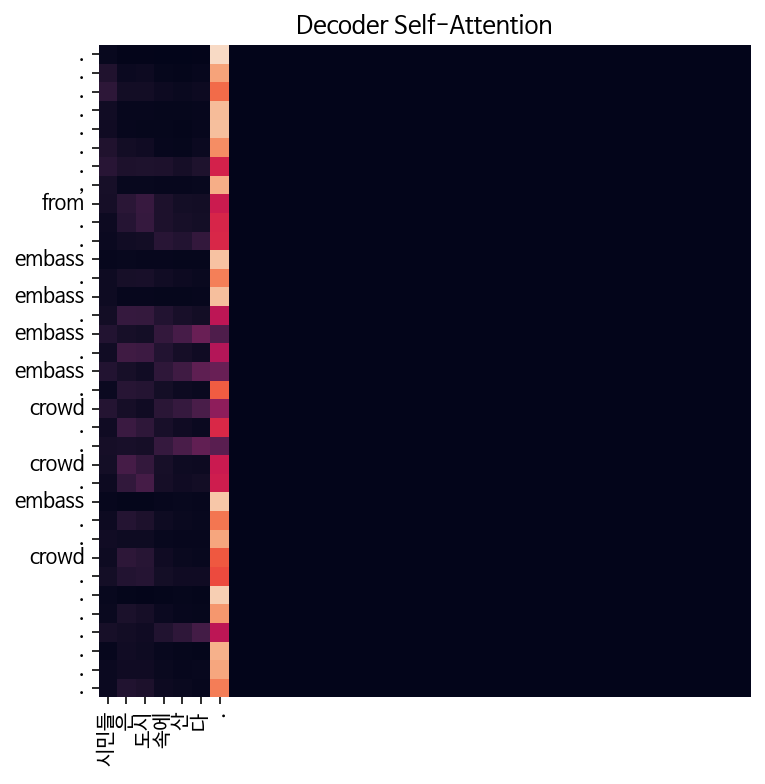

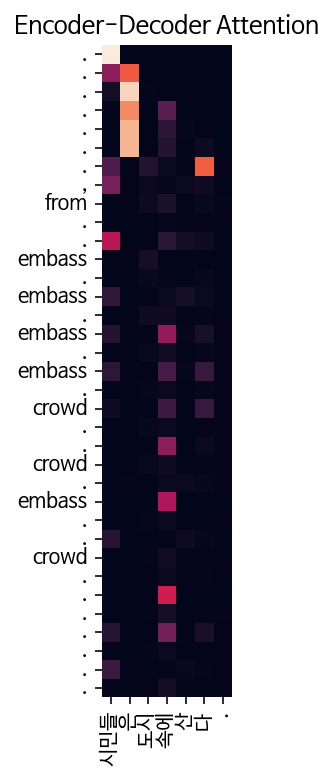

Input: 커피는 필요 없다.
Predicted translation: the the the the ministry . . . surgery . . . surgery . . . . . . . . . . . . . . . . .


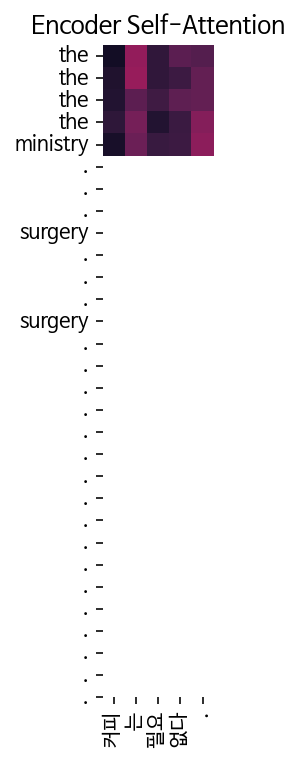

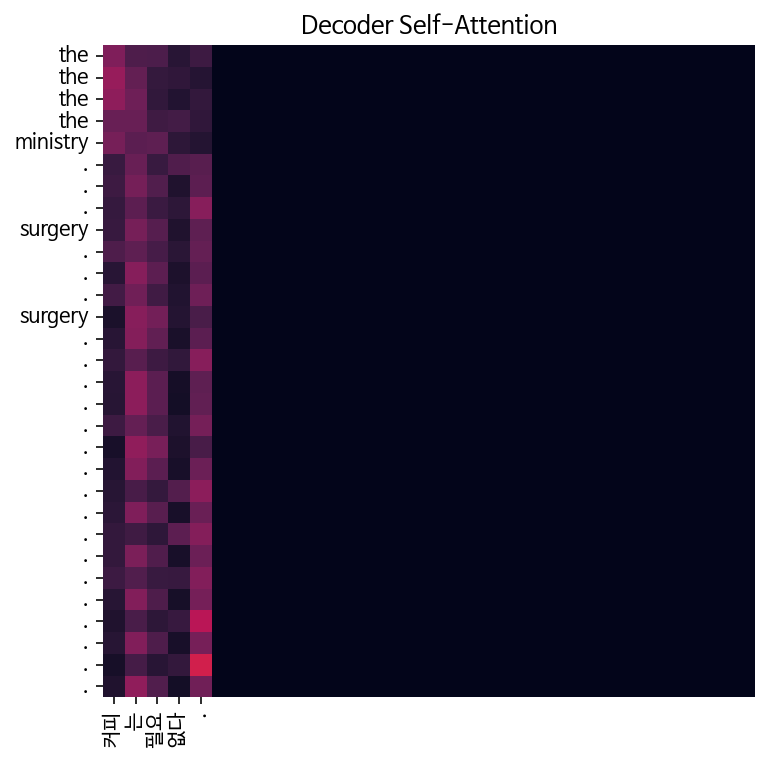

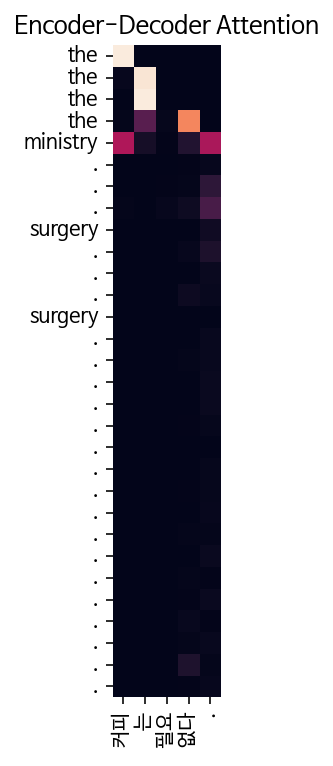

Input: 일곱 명의 사망자가 발생했다.
Predicted translation: , , , , , , chicago . population . . . number sunday . . . number . . . . . . . . . . . . . . . . . .


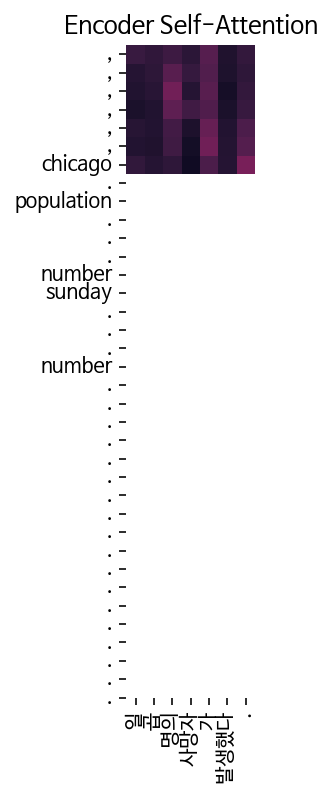

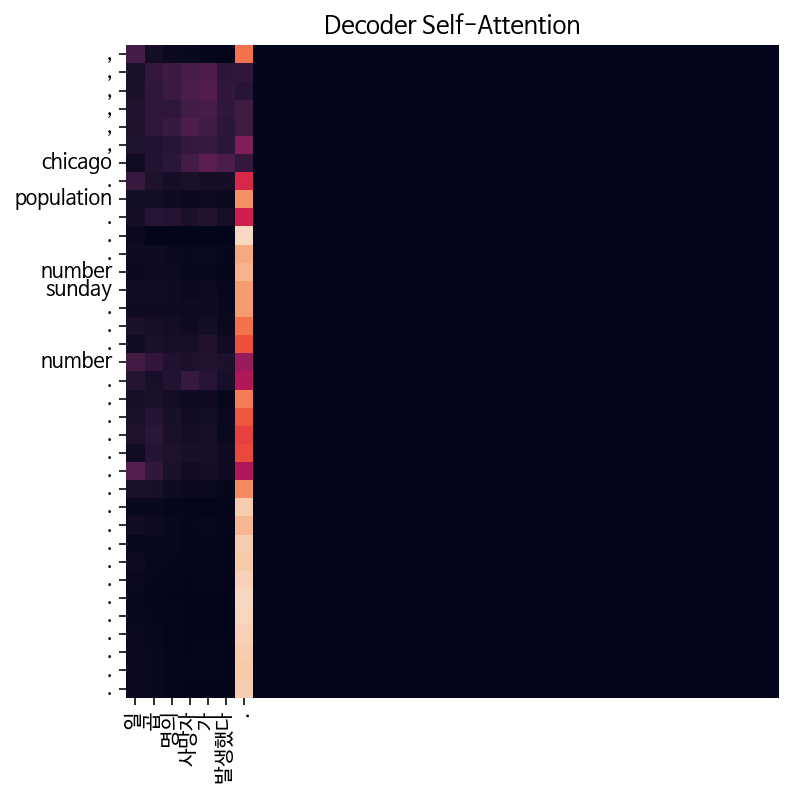

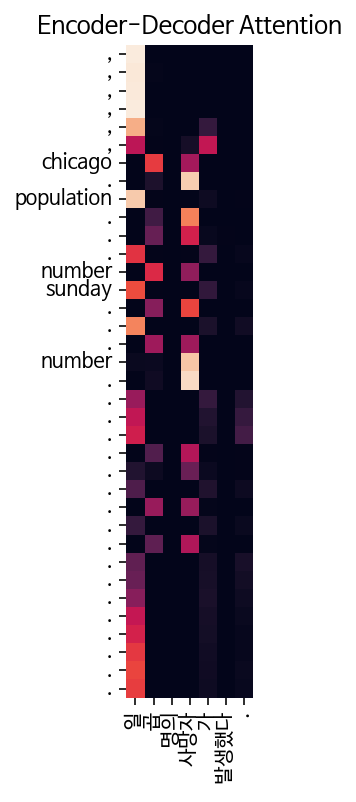


Epoch 14/15


Epoch 14:   0%|          | 0/1080 [00:00<?, ?it/s]

Epoch 14, Loss: 0.1409

### Translations and Visualizations ###
Input: 오바마는 대통령이다.
Predicted translation: , , , cents cents . . . percent . percent . percent . .


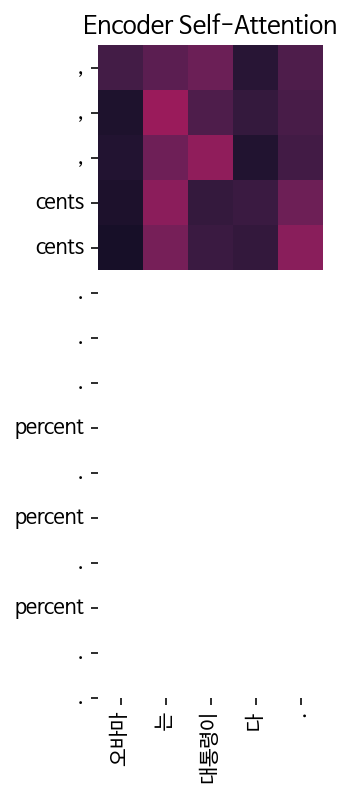

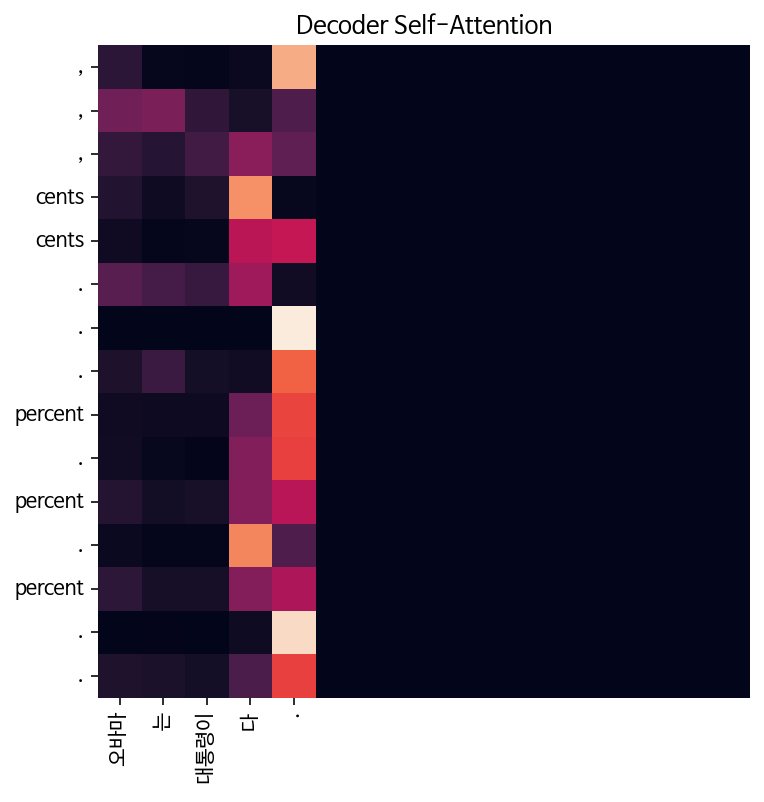

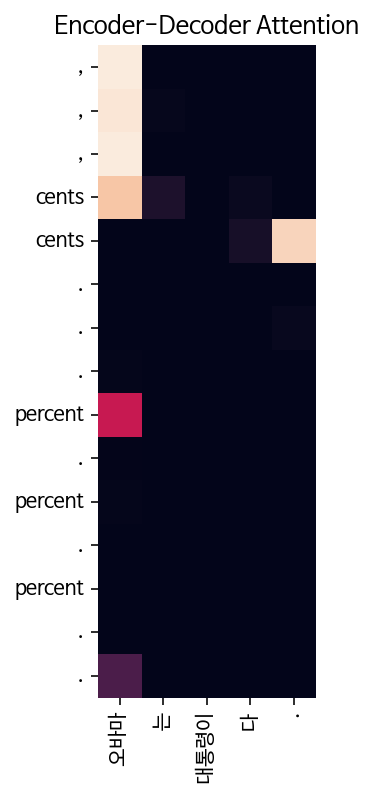

Input: 시민들은 도시 속에 산다.
Predicted translation: small small small small small capital . capital . . . capital . . . capital . . along . . . buildings . capital . capital . capital . . . capital . .


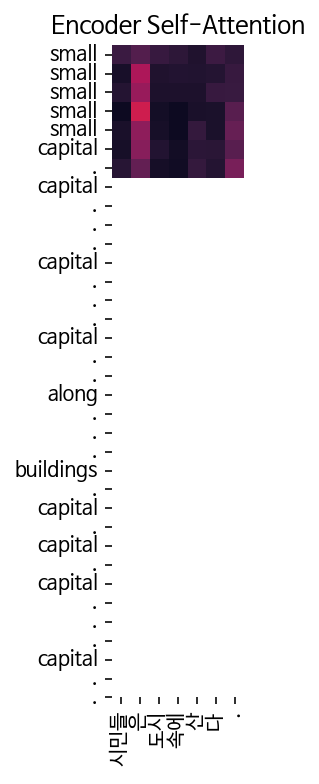

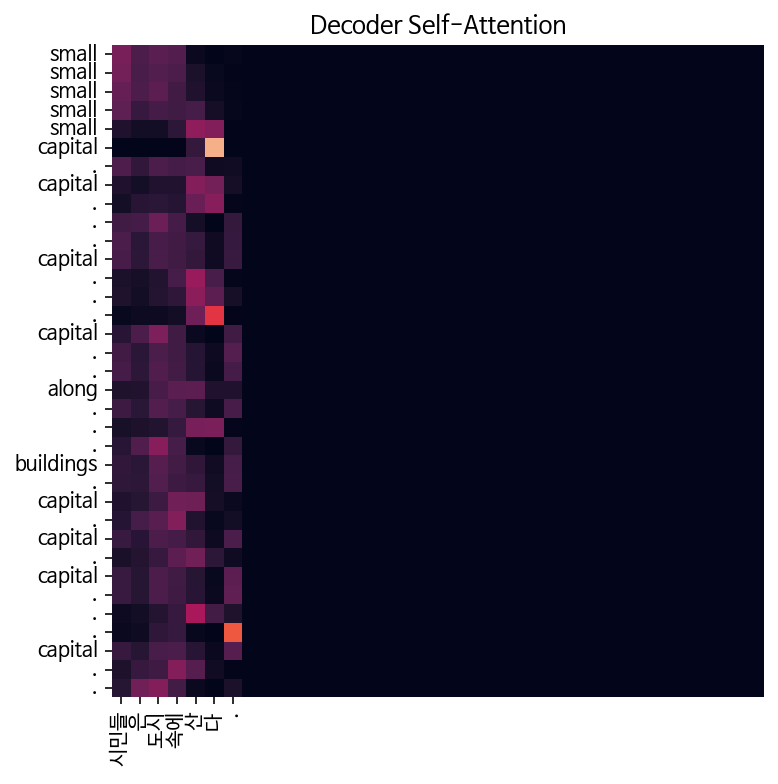

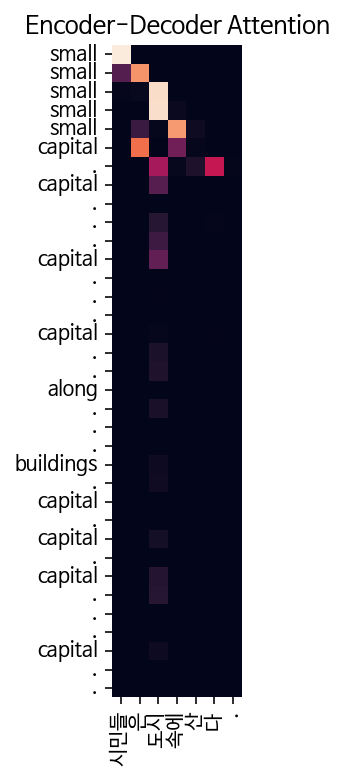

Input: 커피는 필요 없다.
Predicted translation: it it it it america . summer . banks . percent . percent . banks . summer . america . . summer . banks . summer . .


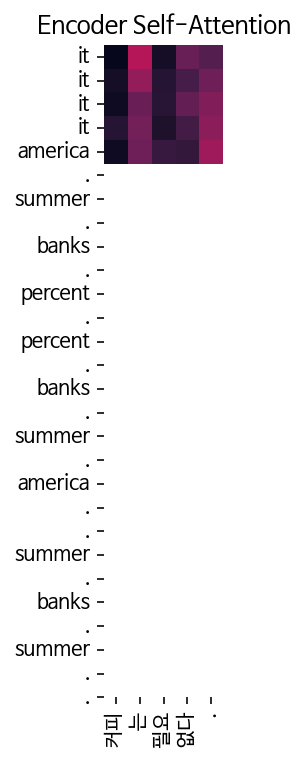

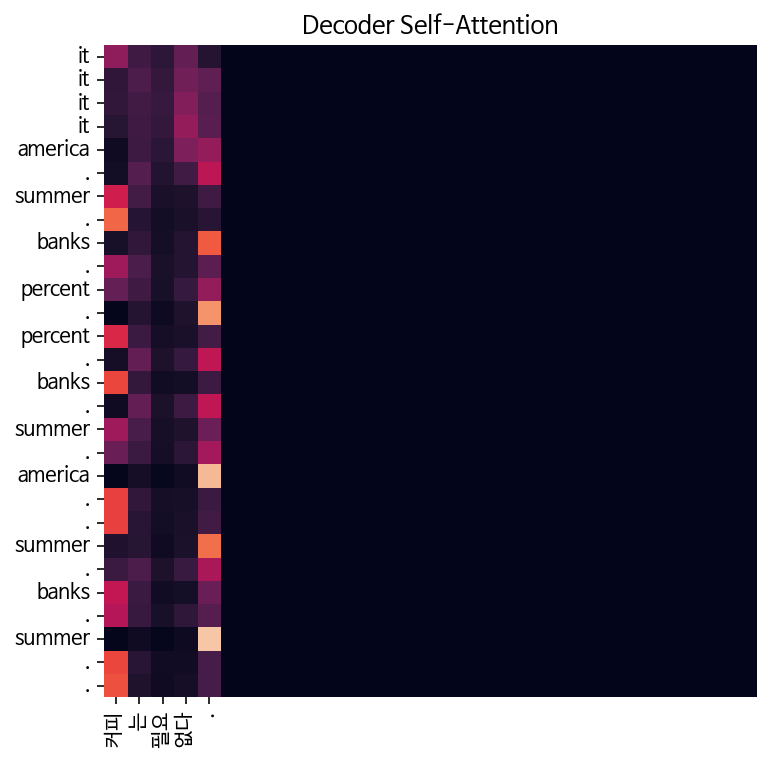

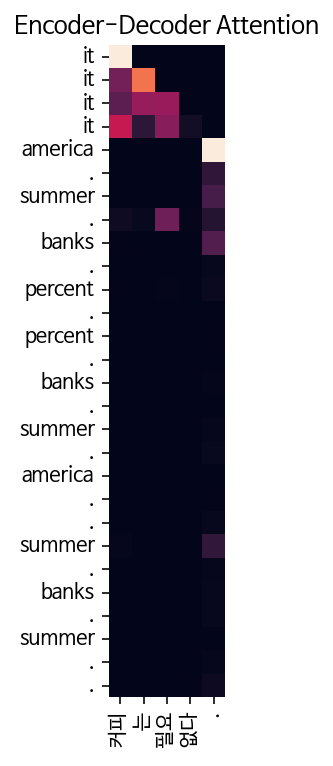

Input: 일곱 명의 사망자가 발생했다.
Predicted translation: two just two just just just six children . wednesday . . . . . . . . . . . . . . . . . . . . . . .


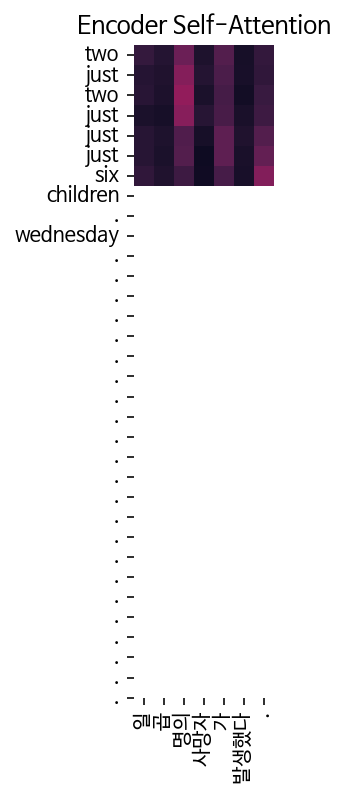

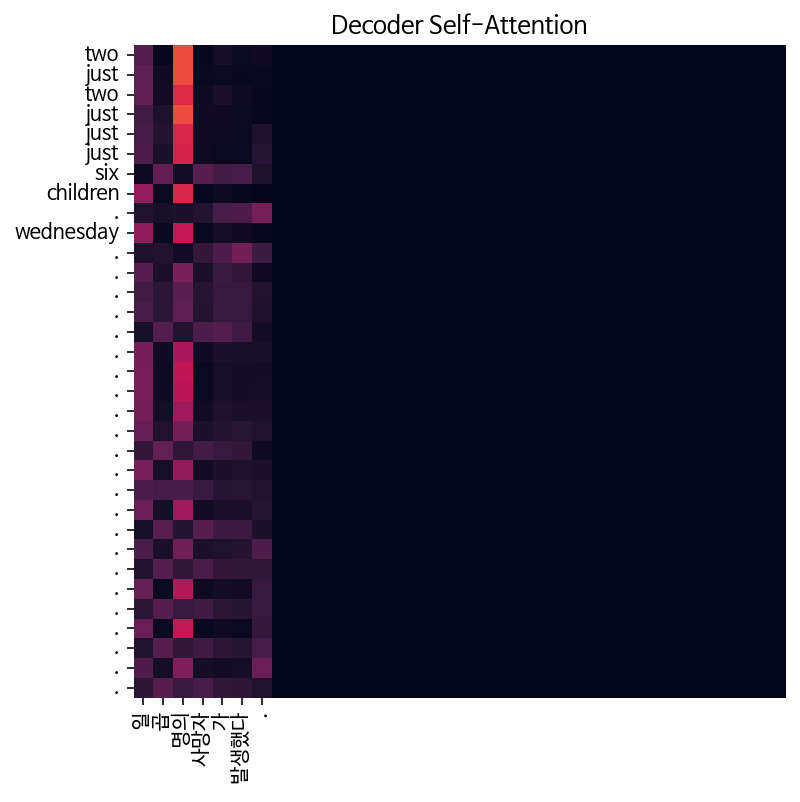

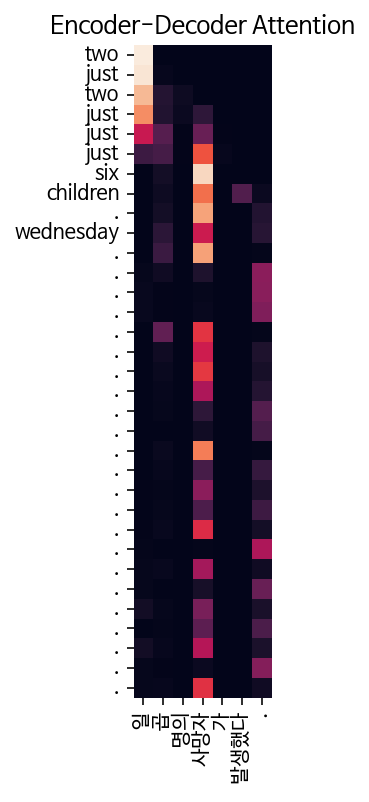


Epoch 15/15


Epoch 15:   0%|          | 0/1080 [00:00<?, ?it/s]

Epoch 15, Loss: 0.1297

### Translations and Visualizations ###
Input: 오바마는 대통령이다.
Predicted translation: in in in in iraq , obama , obama , obama , obama , obama , obama , obama , obama . , obama . , obama , obama , obama , obama . , obama . . way . . . .


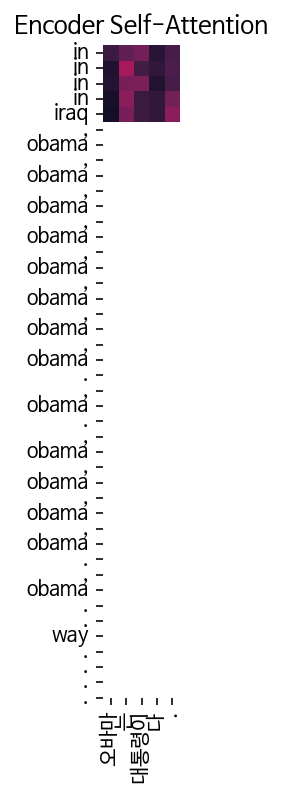

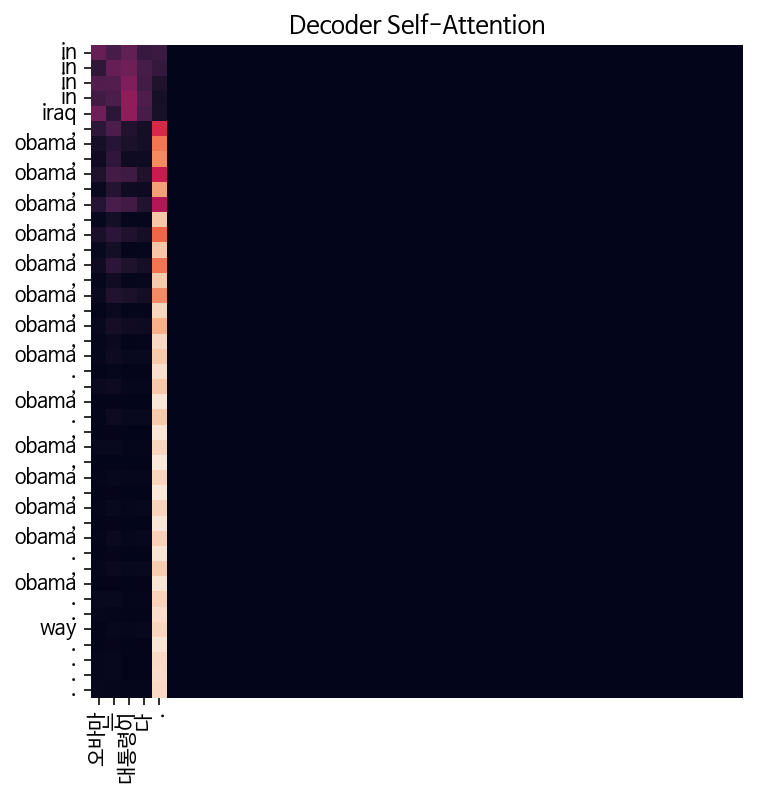

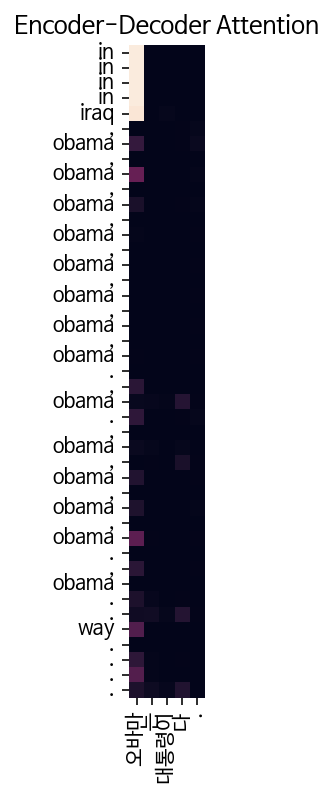

Input: 시민들은 도시 속에 산다.
Predicted translation: marine marine marine marine marine marine . . . . . . . . . . . . . . . . . . . . . . . .


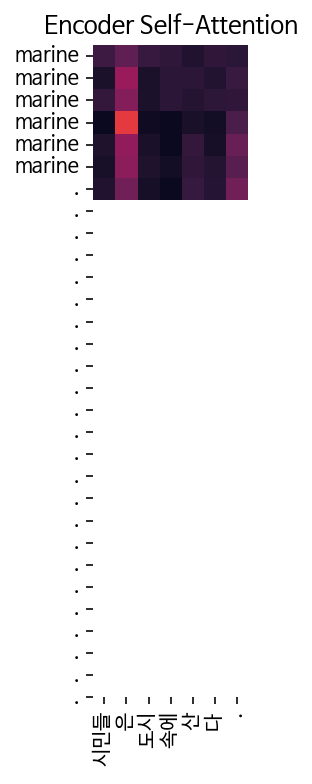

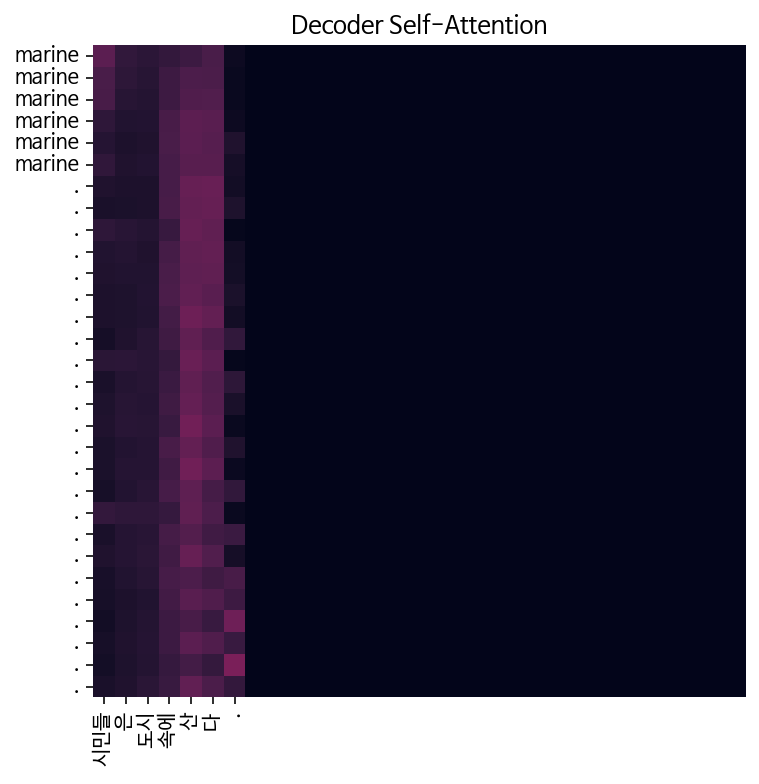

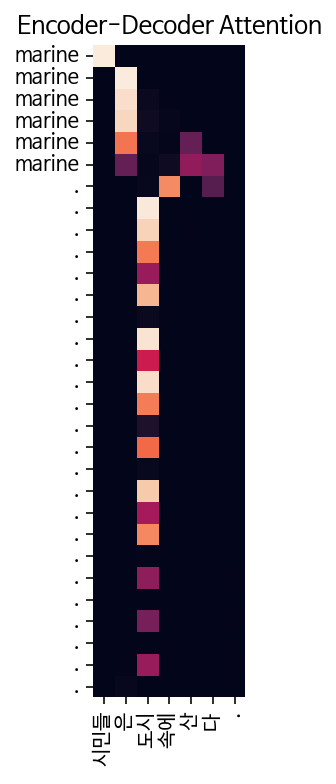

Input: 커피는 필요 없다.
Predicted translation: it it it it develop it troops . that coffee . coffee . coffee . in its banks . that . troops . that way .


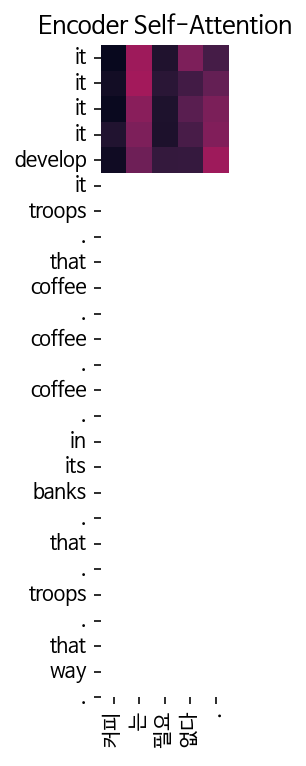

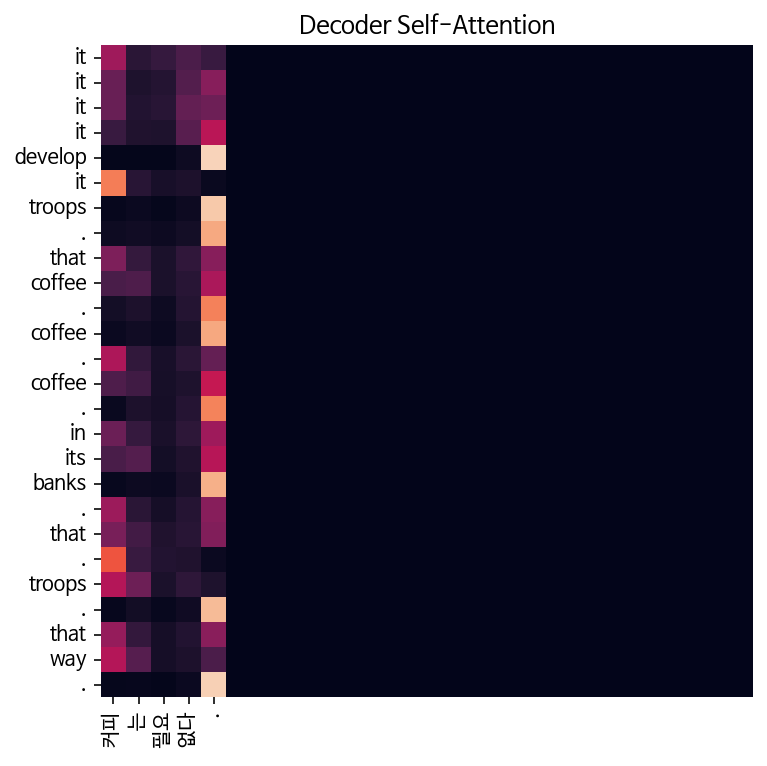

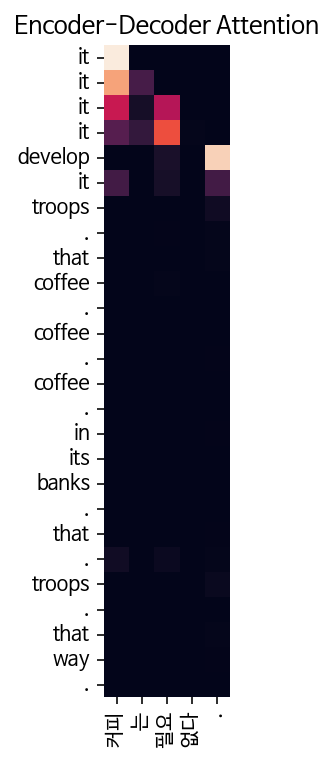

Input: 일곱 명의 사망자가 발생했다.
Predicted translation: there there there there there . in stay condition condition conditions in nominations in years . ineen there . in pakistan .een countries . . . . . injuries . . . .


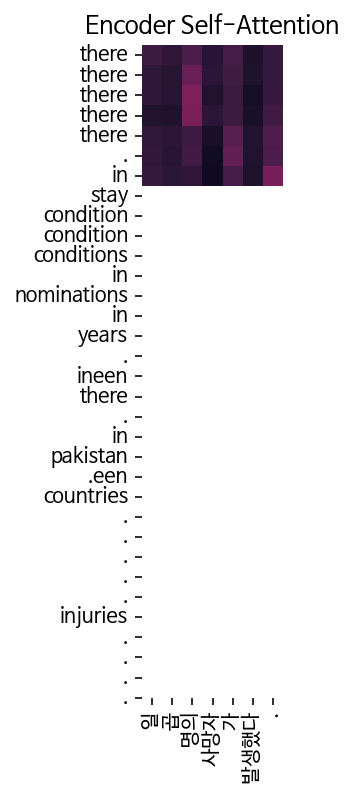

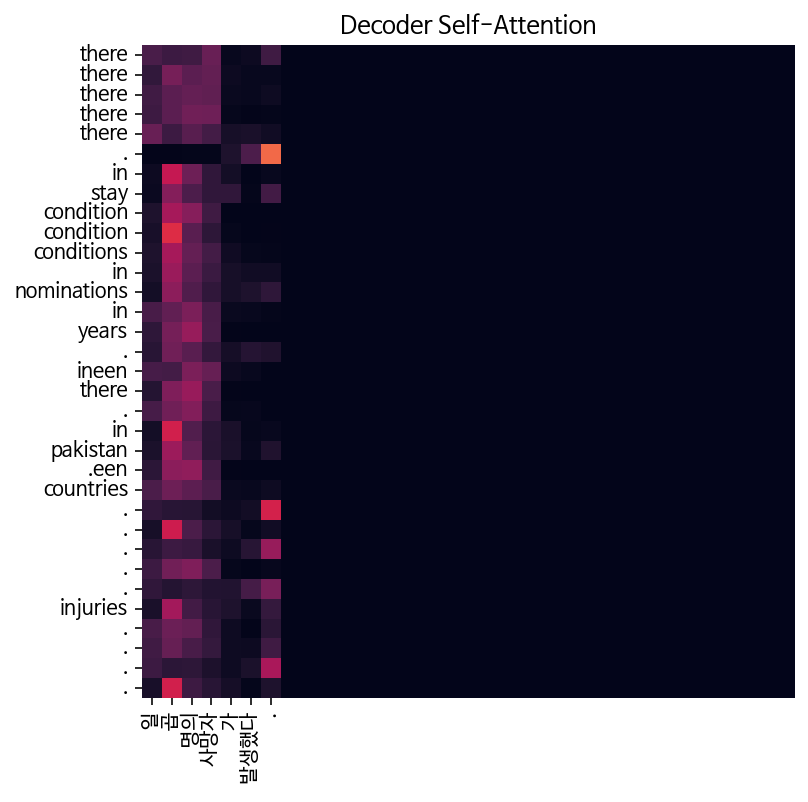

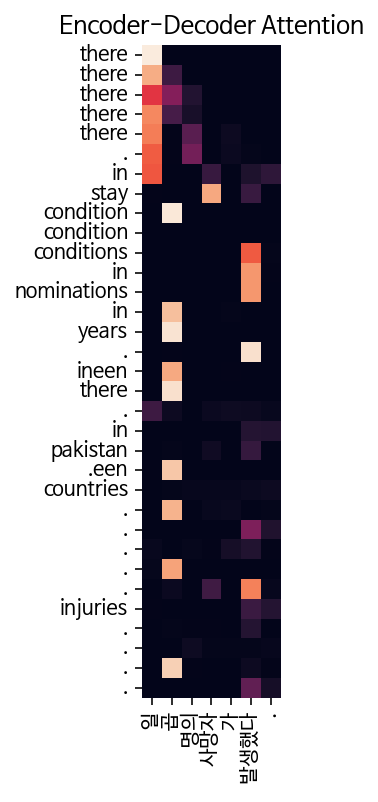

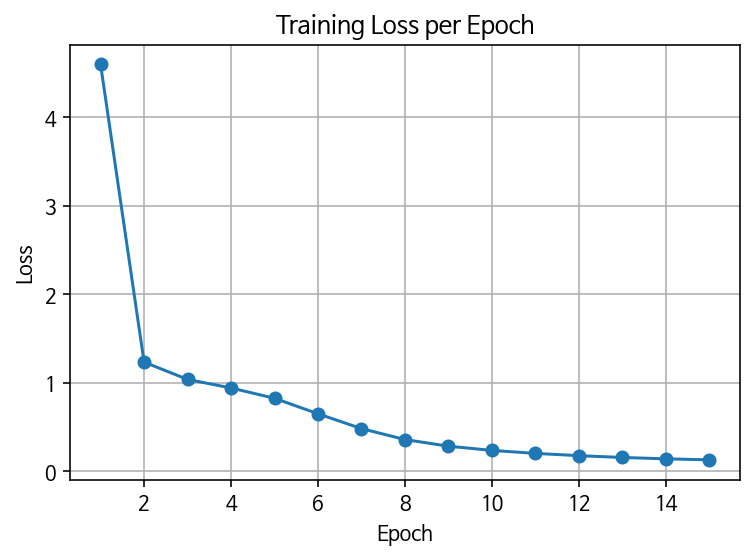

In [45]:
# 학습
losses = []
EPOCHS = 15

for epoch in range(EPOCHS):
    print(f"\nEpoch {epoch + 1}/{EPOCHS}")
    total_loss = 0

    for batch in tqdm(range(0, len(enc_train), BATCH_SIZE), desc=f"Epoch {epoch + 1}"):
        src_batch = enc_train[batch:batch + BATCH_SIZE]
        tgt_batch = dec_train[batch:batch + BATCH_SIZE]

        batch_loss, _, _, _ = train_step(src_batch, tgt_batch, transformer, optimizer)
        total_loss += batch_loss

    epoch_loss = total_loss / (len(enc_train) // BATCH_SIZE)
    losses.append(epoch_loss)

    print(f"Epoch {epoch + 1}, Loss: {epoch_loss:.4f}")

    # 번역 및 Attention 시각화
    print("\n### Translations and Visualizations ###")
    for sentence in sentences:
        pieces, result, enc_attns, dec_attns, enc_dec_attns = evaluate(
            sentence, transformer, ko_tokenizer, en_tokenizer, beam_width=3 # 5 정도로 했으면?
        )
        print(f"Input: {sentence}")
        print(f"Predicted translation: {result}")
        visualize_attention(pieces, result.split(), enc_attns, dec_attns, enc_dec_attns)

# Loss Graph
plt.plot(range(1, EPOCHS + 1), losses, marker='o')
plt.title('Training Loss per Epoch')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.grid()
plt.show()

* 다시 여기를 보니까 위에서 했던 sampling 규제가 효용이 있었던 듯 싶다. 
* 그래도 그나마 가장 좋은 결과를 꼽자면 확실히 beam shearch 인 것 같다. 
* 번역 결과는 비슷하게 처참하나 어떻게든 맥락을 형성하려고 명사 동사 구조를 가져오거나 직관적으로 연관된 단어들을 가져오거나 한다.
* 그러나 낮아질대로 낮아진 기준치를 떠올리면 사실 거기서 거기인듯 싶다.
* 솔직히 6층을 쌓아올린 것에 비해 epoch이 부족해서 나오는 문제는 아닌 것 같다.
    * 0으로 수렴하는 loss나 최상의 결과를 찍고 이후, epoch에서 점점 이상해지는 번역 결과만 봐도 그렇다.
* 전처리에서 문제가 있었나? 예문으로 활용한 문장들의 단어길이가 너무 짧았을까? matrix를 보면 포지셔널 인코딩이 잘 된게 맞나 의심도 든다. 
* 예문을 좀 더 길게 가져가보고 윈도우를 늘려보면 어떨까?